# Data 607 &mdash; Project Report

# Project Title:Cardiovascular Patients Hospital Admission using Statistical & ML techniques

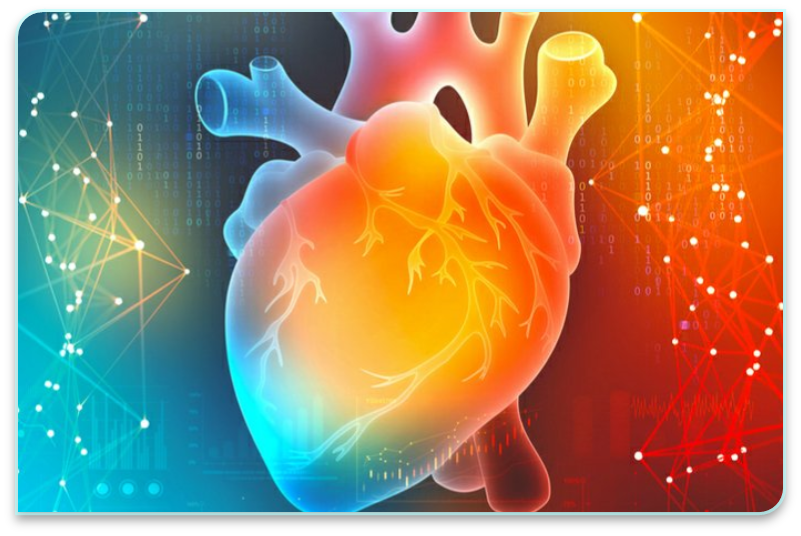

Author: SANJIR INAM SALSABIL

## Introduction
 The human body constitutes of many diverse types of cells that together create tissues and subsequently organ systems. The heart is at the focal point of the human body responsible for pumping blood throughout the body and keeping us alive. Our focus of analysis are patients admitted to the hospital having cardiovascular disease which is one of the leading causes of death globally. 

Below is an analysis of the top 5 leading causes of death in Canada from 2017-2021. It is observed from the highlighted portions that death related to heart related diseases occupy 2nd and 4th rank for majority of the years.




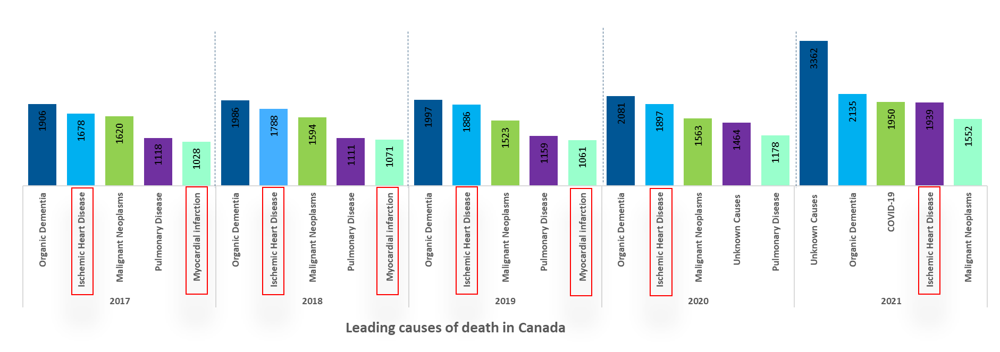

We tried to identify the following from our analysis:

·	Observing patients admitted to the hospital with diverse cardiovascular diseases.

·	Analyzing the underlying conditions associated with the patient such as heart failure, acute kidney disease.

·	Analyzing the outcome of the patient for the duration of hospital admission.

 We had selected two datasets from Kaggle and described them in the next section.

##Datasets Utilized
We have utilized the “Hospital Admissions Data” dataset (File size: 2.6 MB, Rows: 15757 K, Columns: 56) available in the Kaggle portal (https://www.kaggle.com/datasets/ashishsahani/hospital-admissions-data/discussion/302894?resource=download&select=HDHI+Admission+data.csv) [Ref. 1] in CSV format. 

The Kaggle portal provides this dataset free of charge and can be used for research/project purposes. Details of their conditions are available in https://doi.org/10.3390/diagnostics12020241 [Ref. 2]. This dataset is being provided under creative commons License (Attribution-Non-Commercial-Share Alike 4.0 International (CC BY-NC-SA 4.0)) https://creativecommons.org/licenses/by-nc-sa/4.0/ [Ref. 3].

This data was collected from patients admitted over a period of two years (1 April 2017 to 31 March 2019) at Hero DMC Heart Institute, Unit of Dayanand Medical College and Hospital, Ludhiana, Punjab, India. During the study period, the cardiology unit had 14,845 admissions corresponding to 12,238 patients. 1921 patients who had multiple admissions.


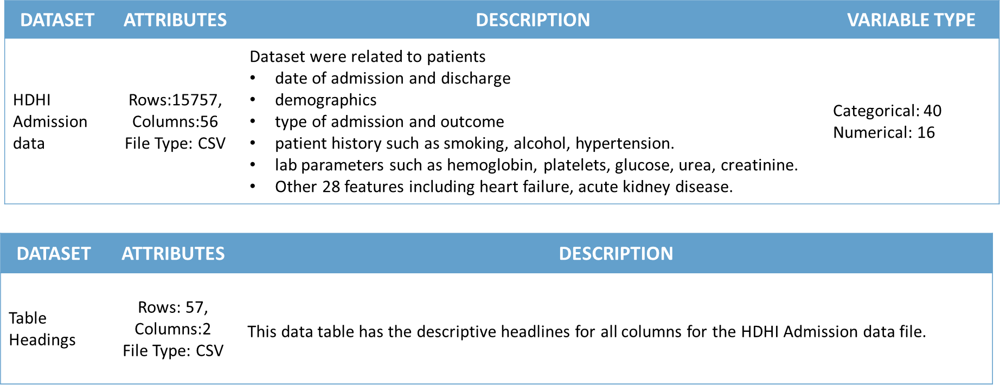

##DESCRIPTION OF SOME VARIABLES
As presented in previous item, the original dataset contained several variables. We used below elimination method:

•	Qualitative variables: By counting the “1” for the qualitative variables. When the count was less than 1000 then we dropped that variable as it was insignificant compared to the data size. 

•	Quantitative variables: Most were kept except for BNP (B-TYPE NATRIURETIC PEPTIDE) which had 10000 entries missing. We also dropped Serial No. and MRD No. as it was not relatable.

At the end the main ones used in this project (for example, indicated significant by some models) are described below.

The response variables that were investigated on this project were: HEART.FAILURE, AKI, OUTCOME and DURATION.OF.STAY.

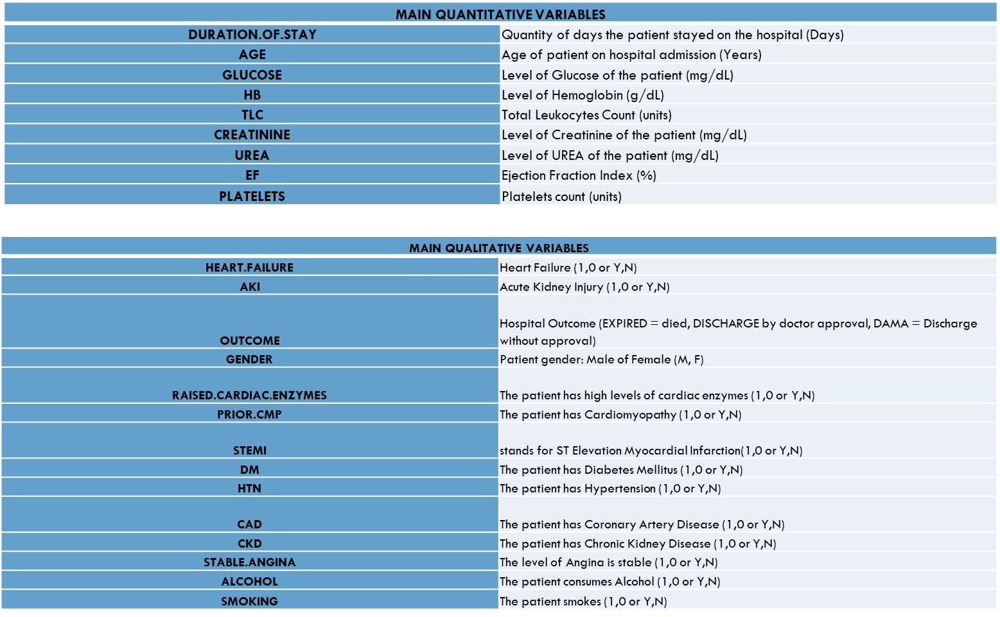

##Research Questions
1. Which independent variable is most important in predicting Heart Failure, AKI, Outcome and Duration of Stay?

2. Which statistical/Machine Learning (ML) method best predicts Heart Failure, AKI and Outcome in terms of accuracy rate?

3. Which statistical/ML method best predicts Duration of Stay in terms of mean squared error?


##Data Wrangling
Our main dataset, HDHI admission dataset had over 15757 rows and 56 columns (40 cathegorical and 16 numerical). After initial analysis we found duplicate entries based on one of the columns (MRD No.) which was the admission no for patients. Admission numbers were unique as they vary every time a patient gets admitted to the hospital. So, we removed the duplicate entries (3513 rows). We also conducted the below cleaning steps:

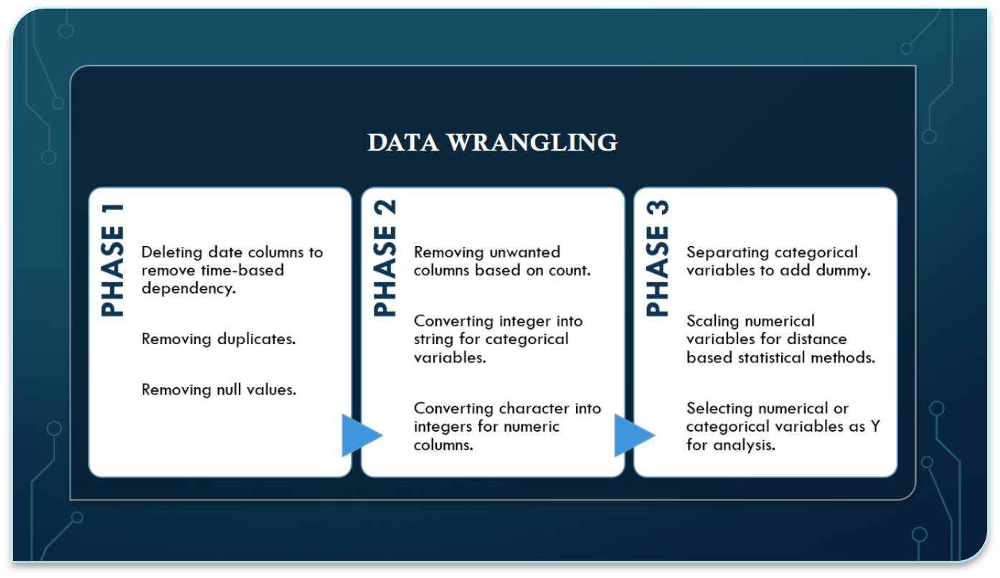

Our final dataset had 10125 rows and 29 entries after all the data cleaning.
  
It was mentioned in Kaggle that 1921 patients were admitted multiple times. However, there was no way to identify these patients as patient IDs (unique to each patient) were not provided in the dataset due to privacy issues. We had to assume independence among all the data entries as it was not possible to segregate among them.


##Statistical methods utilized
For our analysis and modelling we applied several steps and techniques. Below are 2 flow charts 



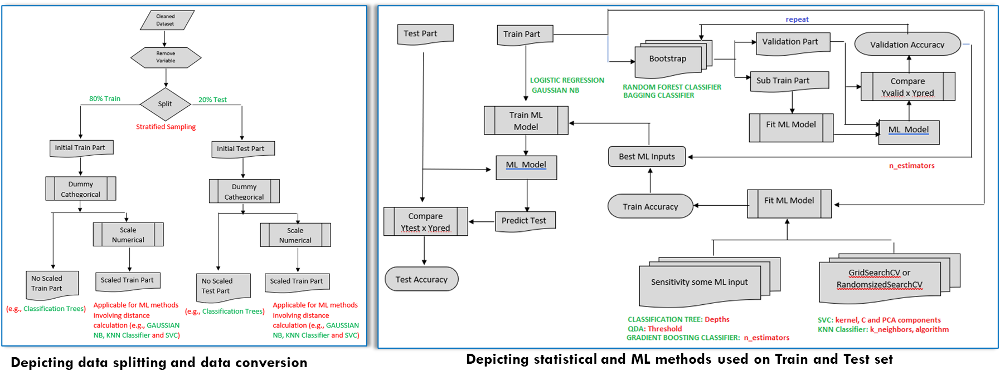

On the left flowchart, it is presented the process used to obtain the final train and test datasets, scaled or not. Basically, it was initially taken the cleaned dataset and for the specific responsible variable, it was at the beginning removed variables that were not related to the response variable (e.g. for HEART FAILURE and AKI response variables, OUTCOME and DURATION OF STAY features were removed because these responsible varialbles do not depend of these features.) After that, the dataset were splitted into 80% train part and 20% test part. Next, the categorical explanatory variables were dummified. Finally, additional dataframes were created to train and test considering scaled numerical explanatory variables. The scaled dataframes were mainly used for ML models which considers dstance calculation (e.g. KNN).

The flowchart on the right, it is shows the procedure to create the ML models. For some of them (e.g. Logistic Regression, Gaussian NB), it was created the ML model directly by applying the train part, whereas othes ML model were selected based on the best parameters found using GridSearch (e.g. kernel and C in Support Vector Classifier - SVC), or doing sensitivity directly in the ML parameter (e.g. depths of Classification Tree, number of estimators in Gradient Boosting Classiflier), or using repeatable Bootstrap for find the maximum validation part accuracy (e.g. number of estimators in Random Forest and Bagging Classifiers). Finally with the optimum model for each ML, it was applied the test part and was verified the accuracy of predicting the response variable (using Confusion Matrix as well).

##Analysis

## Libraries

In [ ]:
import random
import math
import numpy as np
from matplotlib import pyplot as plt

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.model_selection import train_test_split
import sklearn.metrics as skm
import seaborn as sns


from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

from sklearn.datasets import load_diabetes
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error, accuracy_score
import statsmodels.formula.api as smf

from sklearn.preprocessing import PolynomialFeatures

from sklearn.preprocessing import StandardScaler
from sklearn import svm
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV


from sklearn.tree import DecisionTreeClassifier, export_graphviz, DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import confusion_matrix, accuracy_score, mean_squared_error
from sklearn import tree



from sklearn.cluster import KMeans
import sklearn.preprocessing as skp
%matplotlib inline
from sklearn import preprocessing
from sklearn import utils
from sklearn.utils import shuffle
from sklearn import datasets
from sklearn import svm
from os import replace
import tensorflow as tf
%pip install icecream
from icecream import ic
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## 1. LOAD FILE

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving HDHI Admission data.csv to HDHI Admission data.csv


In [ ]:
import io
data = pd.read_csv(io.BytesIO(uploaded['HDHI Admission data.csv']), header=0, na_values='NA')

In [ ]:
#data_url='https://drive.google.com/uc?export=download&id=1HqtFIbdU2aeFCPi9f63OSMsId9U4Xp2i'
#data = pd.read_csv(data_url,header=0, na_values='NA')
#data.head()

## 2. DATA CLEANING/WRANGLING AND PRELIMINARY EDA

In [ ]:
# Checking Read Data

# Data dimensions
print(data.shape)

# Checking Head and column names
display(data.head())

# Checking the summary of each column and datatype
print(data.dtypes)

print(data.describe())

(15757, 56)


,SNO,MRD No.,D.O.A,D.O.D,AGE,GENDER,RURAL,TYPE OF ADMISSION-EMERGENCY/OPD,month year,DURATION OF STAY,...,CONGENITAL,UTI,NEURO CARDIOGENIC SYNCOPE,ORTHOSTATIC,INFECTIVE ENDOCARDITIS,DVT,CARDIOGENIC SHOCK,SHOCK,PULMONARY EMBOLISM,CHEST INFECTION
0,1,234735,4/1/2017,4/3/2017,81,M,R,E,Apr-17,3,...,0,0,0,0,0,0,0,0,0,0
1,2,234696,4/1/2017,4/5/2017,65,M,R,E,Apr-17,5,...,0,0,0,0,0,0,0,0,0,0
2,3,234882,4/1/2017,4/3/2017,53,M,U,E,Apr-17,3,...,0,0,0,0,0,0,0,0,0,0
3,4,234635,4/1/2017,4/8/2017,67,F,U,E,Apr-17,8,...,0,0,0,0,0,0,0,0,0,0
4,5,234486,4/1/2017,4/23/2017,60,F,U,E,Apr-17,23,...,0,0,0,0,0,0,0,0,0,0


SNO                                 int64
MRD No.                            object
D.O.A                              object
D.O.D                              object
AGE                                 int64
GENDER                             object
RURAL                              object
TYPE OF ADMISSION-EMERGENCY/OPD    object
month year                         object
DURATION OF STAY                    int64
duration of intensive unit stay     int64
OUTCOME                            object
SMOKING                             int64
ALCOHOL                             int64
DM                                  int64
HTN                                 int64
CAD                                 int64
PRIOR CMP                           int64
CKD                                 int64
HB                                 object
TLC                                object
PLATELETS                          object
GLUCOSE                            object
UREA                              

### 2b. Visualizing the categorical variables used  in analysis

Analyzing the available categorical variables to see which ones have enough counts to be meaningful for statistical analysis. This is the first step to eliminating variables with low impact in the dataset

In [ ]:
data2 = data.copy()
data2['SMOKING'] = data2['SMOKING ']

data_plot1 = data2[['SMOKING','ALCOHOL', 'DM', 'HTN', 'CAD', 'PRIOR CMP','CKD', 'ANAEMIA', 'STABLE ANGINA', 'ACS', 'STEMI','ATYPICAL CHEST PAIN', 'HFREF', 'HFNEF', 'VALVULAR', 'CHB', 'SSS']].copy()

In [ ]:
data_plot1b = pd.DataFrame(data_plot1)

print(data_plot1b)

       SMOKING  ALCOHOL  DM  HTN  CAD  PRIOR CMP  CKD  ANAEMIA  STABLE ANGINA  \
0            0        0   1    0    0          0    0        1              0   
1            0        1   0    1    1          0    0        0              0   
2            0        0   1    0    1          0    0        0              0   
3            0        0   0    1    1          0    0        0              0   
4            0        0   0    1    0          1    0        0              0   
...        ...      ...  ..  ...  ...        ...  ...      ...            ...   
15752        0        0   1    1    1          0    0        1              0   
15753        0        0   1    1    0          1    0        0              0   
15754        0        0   0    1    1          0    0        1              0   
15755        0        0   0    1    1          0    0        0              0   
15756        0        0   0    1    1          0    0        0              0   

       ACS  STEMI  ATYPICAL

Renaming some of the variables that were shortened to acronyms

In [ ]:
data_plot1b.rename(columns={'DM': 'DIABETES', 'HTN': 'HYPERTENSION', 'CAD': 'CORONARY DISEASE', 'PRIOR CMP': 'CARDIOMYOPATHY', 'CKD': 'CHRONIC KIDNEY DISEASE', 'ACS': 'ACUTE CORONARY SYNDROME', 'STEMI': 'MYOCARDIAL INFRACTION', 'HFREF': 'HEART FAILURE WITH REDUCED EF', 'HFNEF': 'HEART FAILURE WITH NORMAL EF', 'VALVULAR': 'VALVULAR HEART DISEASE', 'CHB': 'COMPLETE HEART BLOCK', 'SSS': 'SICK SINUS SYNDROME'}, inplace = True)


display(data_plot1b.head())

,SMOKING,ALCOHOL,DIABETES,HYPERTENSION,CORONARY DISEASE,CARDIOMYOPATHY,CHRONIC KIDNEY DISEASE,ANAEMIA,STABLE ANGINA,ACUTE CORONARY SYNDROME,MYOCARDIAL INFRACTION,ATYPICAL CHEST PAIN,HEART FAILURE WITH REDUCED EF,HEART FAILURE WITH NORMAL EF,VALVULAR HEART DISEASE,COMPLETE HEART BLOCK,SICK SINUS SYNDROME
0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0
1,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0
3,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0


Transposing the table and renaming column after aggregation

In [ ]:
data_plot1c = data_plot1b.apply(pd.value_counts).T.fillna(0).reset_index().rename(columns={'index':'Variable'})

print(data_plot1c)

                         Variable      0      1
0                         SMOKING  14964    793
1                         ALCOHOL  14736   1021
2                        DIABETES  10660   5097
3                    HYPERTENSION   8101   7656
4                CORONARY DISEASE   5206  10551
5                  CARDIOMYOPATHY  13323   2434
6          CHRONIC KIDNEY DISEASE  14207   1550
7                         ANAEMIA  12970   2787
8                   STABLE ANGINA  14468   1289
9         ACUTE CORONARY SYNDROME   9994   5763
10          MYOCARDIAL INFRACTION  13555   2202
11            ATYPICAL CHEST PAIN  15354    403
12  HEART FAILURE WITH REDUCED EF  13336   2421
13   HEART FAILURE WITH NORMAL EF  13605   2152
14         VALVULAR HEART DISEASE  15205    552
15           COMPLETE HEART BLOCK  15345    412
16            SICK SINUS SYNDROME  15650    107


Assigning 0 to 'NO' and 1 to 'YES'

In [ ]:
data_plot1c.rename(columns = {0: 'NO', 1: 'YES'}, inplace = True)

print(data_plot1c)

                         Variable     NO    YES
0                         SMOKING  14964    793
1                         ALCOHOL  14736   1021
2                        DIABETES  10660   5097
3                    HYPERTENSION   8101   7656
4                CORONARY DISEASE   5206  10551
5                  CARDIOMYOPATHY  13323   2434
6          CHRONIC KIDNEY DISEASE  14207   1550
7                         ANAEMIA  12970   2787
8                   STABLE ANGINA  14468   1289
9         ACUTE CORONARY SYNDROME   9994   5763
10          MYOCARDIAL INFRACTION  13555   2202
11            ATYPICAL CHEST PAIN  15354    403
12  HEART FAILURE WITH REDUCED EF  13336   2421
13   HEART FAILURE WITH NORMAL EF  13605   2152
14         VALVULAR HEART DISEASE  15205    552
15           COMPLETE HEART BLOCK  15345    412
16            SICK SINUS SYNDROME  15650    107


In [ ]:
import pandas as pd
import numpy as np
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
from itertools import cycle


# data and colors
columns = data_plot1c.columns[1:]
palette = cycle(px.colors.qualitative.Set1)
# palette = cycle(px.colors.sequential.PuBu)
colors = {c:next(palette) for c in columns}

# subplot setup
fig = make_subplots(rows=1, cols=1)

# add bars
for cols in columns:
    fig.add_trace(go.Bar(x=data_plot1c['Variable'],
                             y = data_plot1c[cols],
                             name = cols,
                             legendgroup = cols,
                             marker_color = colors[cols],
                             showlegend = True 
                            ), row = 1, col = 1)

fig.update_layout(barmode='stack')
fig.show()

In the plot above, it is possible to verify that some of the categorical variables just have one class (e.g. SICK SINUS SYNDROME) or few YES (e.g. ATYPICAL CHEST PAIN).

Applying the same procedure to the next set of categorical variables

In [ ]:
data_plot2 = data2[['AKI','CVA INFRACT', 'CVA BLEED', 'AF', 'VT', 'PSVT','CONGENITAL', 'UTI', 'NEURO CARDIOGENIC SYNCOPE', 'ORTHOSTATIC', 'INFECTIVE ENDOCARDITIS','DVT', 'CARDIOGENIC SHOCK', 'SHOCK', 'PULMONARY EMBOLISM']].copy()

In [ ]:
data_plot2b = pd.DataFrame(data_plot2)

print(data_plot2b)

       AKI  CVA INFRACT  CVA BLEED  AF  VT  PSVT  CONGENITAL  UTI  \
0        0            0          0   0   0     0           0    0   
1        0            0          0   0   1     0           0    0   
2        1            0          0   0   0     0           0    0   
3        0            0          0   0   0     0           0    0   
4        0            0          0   0   0     0           0    0   
...    ...          ...        ...  ..  ..   ...         ...  ...   
15752    0            0          0   0   0     0           0    0   
15753    1            0          0   0   0     0           0    0   
15754    1            0          0   0   0     0           0    0   
15755    0            0          0   0   0     0           0    0   
15756    0            0          0   0   0     0           0    0   

       NEURO CARDIOGENIC SYNCOPE  ORTHOSTATIC  INFECTIVE ENDOCARDITIS  DVT  \
0                              0            0                       0    0   
1              

Renaming some of the variables that were shortened to acronyms

In [ ]:
data_plot2b.rename(columns={'AKI': 'ACUTE KIDNEY INJURY', 'CVA INFRACT': 'CEREBROVASCULAR ACCIDENT INFRACT', 'CVA BLEED': 'CEREBROVASCULAR ACCIDENT BLEED', 'AF': 'ATRIAL FIBRILATION', 'VT': 'VENTRICULAR TACHYCARDIA', 'PSVT': 'PAROXYSMAL SUPRA VT', 'CONGENITAL': 'CONGENITAL HEART DISEASE', 'UTI': 'URINARY TRACT INFECTION', 'DVT': 'DEEP VENOUS THROMBOSIS'}, inplace = True)


display(data_plot2b.head())

,ACUTE KIDNEY INJURY,CEREBROVASCULAR ACCIDENT INFRACT,CEREBROVASCULAR ACCIDENT BLEED,ATRIAL FIBRILATION,VENTRICULAR TACHYCARDIA,PAROXYSMAL SUPRA VT,CONGENITAL HEART DISEASE,URINARY TRACT INFECTION,NEURO CARDIOGENIC SYNCOPE,ORTHOSTATIC,INFECTIVE ENDOCARDITIS,DEEP VENOUS THROMBOSIS,CARDIOGENIC SHOCK,SHOCK,PULMONARY EMBOLISM
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Transposing the table and renaming column after aggregation

In [ ]:
data_plot2c = data_plot2b.apply(pd.value_counts).T.fillna(0).reset_index().rename(columns={'index':'Variable'})

print(data_plot2c)

                            Variable      0     1
0                ACUTE KIDNEY INJURY  12253  3504
1   CEREBROVASCULAR ACCIDENT INFRACT  15293   464
2     CEREBROVASCULAR ACCIDENT BLEED  15690    67
3                 ATRIAL FIBRILATION  14957   800
4            VENTRICULAR TACHYCARDIA  15238   519
5                PAROXYSMAL SUPRA VT  15638   119
6           CONGENITAL HEART DISEASE  15592   165
7            URINARY TRACT INFECTION  14782   975
8          NEURO CARDIOGENIC SYNCOPE  15625   132
9                        ORTHOSTATIC  15633   124
10            INFECTIVE ENDOCARDITIS  15728    29
11            DEEP VENOUS THROMBOSIS  15548   209
12                 CARDIOGENIC SHOCK  14813   944
13                             SHOCK  15022   735
14                PULMONARY EMBOLISM  15515   242


Assigning 0 to 'NO' and 1 to 'YES'

In [ ]:
data_plot2c.rename(columns = {0: 'NO', 1: 'YES'}, inplace = True)

print(data_plot2c)

                            Variable     NO   YES
0                ACUTE KIDNEY INJURY  12253  3504
1   CEREBROVASCULAR ACCIDENT INFRACT  15293   464
2     CEREBROVASCULAR ACCIDENT BLEED  15690    67
3                 ATRIAL FIBRILATION  14957   800
4            VENTRICULAR TACHYCARDIA  15238   519
5                PAROXYSMAL SUPRA VT  15638   119
6           CONGENITAL HEART DISEASE  15592   165
7            URINARY TRACT INFECTION  14782   975
8          NEURO CARDIOGENIC SYNCOPE  15625   132
9                        ORTHOSTATIC  15633   124
10            INFECTIVE ENDOCARDITIS  15728    29
11            DEEP VENOUS THROMBOSIS  15548   209
12                 CARDIOGENIC SHOCK  14813   944
13                             SHOCK  15022   735
14                PULMONARY EMBOLISM  15515   242


Creating the stacked bar chart plot

In [ ]:
# data and colors
columns = data_plot2c.columns[1:]
palette = cycle(px.colors.qualitative.Set1)
# palette = cycle(px.colors.sequential.PuBu)
colors = {c:next(palette) for c in columns}

# subplot setup
fig = make_subplots(rows=1, cols=1)

# add bars
for cols in columns:
    fig.add_trace(go.Bar(x=data_plot2c['Variable'],
                             y = data_plot2c[cols],
                             name = cols,
                             legendgroup = cols,
                             marker_color = colors[cols],
                             showlegend = True 
                            ), row = 1, col = 1)

fig.update_layout(barmode='stack')
fig.show()

Except ACUTE KIDNEY INJURY(AKI), all the other categorical variables on the plot above have few YES class.

<Figure size 640x480 with 0 Axes>

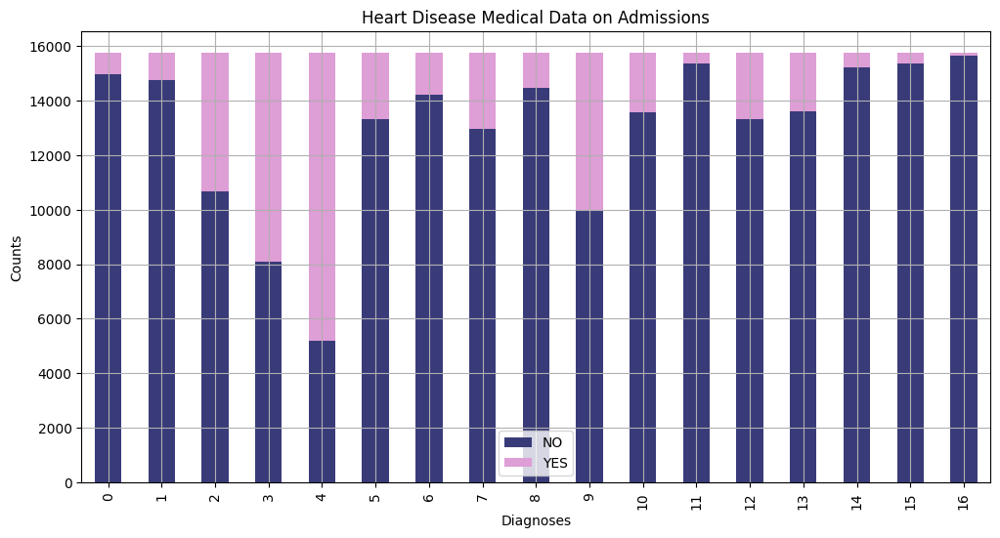

In [ ]:
# proppanttype=pd.DataFrame({'PROPPANT TYPE':maniframe_upd['Proppant Type'],'Year':df['Date - On Production Year'],'Well Count':df['Well Count']})
# #display(proppanttype)

# protype=proppanttype.groupby(['Year','PROPPANT TYPE']).sum()
# #display(protype)

main_tech=data_plot1c
#display(main_tech)
fig = plt.figure()
main_tech.plot(kind='bar',colormap='tab20b', grid=True,stacked = True,figsize=(12,6))
#fig.set_size_inches(120,80)
plt.title('Heart Disease Medical Data on Admissions')
plt.ylabel('Counts')
plt.xlabel('Diagnoses')
plt.show()

### 2c. DATA CLEANING

In [ ]:
# Changing Types 
# Qualitative variables from "int" to "str"
col_classifiers = ["OUTCOME","SMOKING ", "ALCOHOL", "DM", "HTN", "CAD",
                  "PRIOR CMP", "CKD", "RAISED CARDIAC ENZYMES", 
                  "SEVERE ANAEMIA", "ANAEMIA", "STABLE ANGINA", "ACS",
                  "STEMI", "ATYPICAL CHEST PAIN", "HEART FAILURE",
                  "HFREF", "HFNEF", "VALVULAR", "CHB", "SSS", "AKI",
                  "CVA INFRACT", "CVA BLEED", "AF", "VT", "PSVT", "CONGENITAL",
                  "UTI", "NEURO CARDIOGENIC SYNCOPE", "ORTHOSTATIC",
                  "INFECTIVE ENDOCARDITIS", "DVT", "CARDIOGENIC SHOCK", 
                  "SHOCK", "PULMONARY EMBOLISM", "GENDER", "RURAL",
                   "TYPE OF ADMISSION-EMERGENCY/OPD", "CHEST INFECTION"]

data[col_classifiers]=data[col_classifiers].astype('category')

# Quantitative variables from "object" to "numeric"
col_numeric = ["GLUCOSE","HB", "EF",  "TLC", "PLATELETS",
                  "UREA", "CREATININE"]

data[col_numeric] = data[col_numeric].apply(pd.to_numeric, errors='coerce')




print(data.dtypes)

print(data.shape)

SNO                                   int64
MRD No.                              object
D.O.A                                object
D.O.D                                object
AGE                                   int64
GENDER                             category
RURAL                              category
TYPE OF ADMISSION-EMERGENCY/OPD    category
month year                           object
DURATION OF STAY                      int64
duration of intensive unit stay       int64
OUTCOME                            category
SMOKING                            category
ALCOHOL                            category
DM                                 category
HTN                                category
CAD                                category
PRIOR CMP                          category
CKD                                category
HB                                  float64
TLC                                 float64
PLATELETS                           float64
GLUCOSE                         

We see our dataset has total 15,757 rows and 56 columns.

After analysing the dataset, we found duplicate admission entries that is MRD No. in our dataset with most of them amost identical information. Therefore, we have removed those duplicates as follows.

In [ ]:
# Remove duplicates based on MRD No which is the admission number
dataClean= data.drop_duplicates(subset=['MRD No.'])

# Creatinga copy to avoid dependenc eof original dataframe
dataClean = dataClean.copy()

print(dataClean.shape)


(12244, 56)


After removing duplicate entries, we see our dataset now has 12,224 rows and 56 columns.

Removing unwanted columns and Rows with missing data

In [ ]:
# Removing Columns which are not used in our project
dataClean.drop(columns=['SNO','MRD No.','D.O.A','D.O.D', 'month year',
                        'duration of intensive unit stay',
                        'BNP','ATYPICAL CHEST PAIN','HFREF', 'HFNEF', 'VALVULAR',
                        'CHB', 'SSS', 'CVA INFRACT', 'CVA BLEED', 'AF', 'VT',
                        'PSVT', 'CONGENITAL', 'UTI', 'NEURO CARDIOGENIC SYNCOPE',
                        'ORTHOSTATIC','INFECTIVE ENDOCARDITIS', 'DVT','CARDIOGENIC SHOCK',
                        'SHOCK', 'PULMONARY EMBOLISM','CHEST INFECTION' 
                      ], inplace=True)


# Removing rows with missing data
dataClean = dataClean.dropna(axis = 0, how ='any') 

print(dataClean.shape)

(10125, 28)


In [ ]:
print(dataClean.describe())

# Checking if there some missing data
dataClean.isna().sum()   #No missing data


                AGE  DURATION OF STAY            HB           TLC  \
count  10125.000000      10125.000000  10125.000000  10125.000000   
mean      61.101630          6.593481     12.333999     11.617083   
std       13.285198          4.834997      2.312796      7.106228   
min        4.000000          1.000000      3.000000      0.300000   
25%       53.000000          3.000000     10.800000      8.000000   
50%       62.000000          6.000000     12.500000     10.200000   
75%       70.000000          8.000000     13.900000     13.600000   
max      110.000000         98.000000     22.000000    261.000000   

          PLATELETS       GLUCOSE          UREA    CREATININE            EF  
count  10125.000000  10125.000000  10125.000000  10125.000000  10125.000000  
mean     238.934536    164.322785     47.524704      1.302624     44.058212  
std      101.986779     85.691321     38.039530      1.153683     13.352373  
min        1.380000      1.200000      0.100000      0.065000     

AGE                                0
GENDER                             0
RURAL                              0
TYPE OF ADMISSION-EMERGENCY/OPD    0
DURATION OF STAY                   0
OUTCOME                            0
SMOKING                            0
ALCOHOL                            0
DM                                 0
HTN                                0
CAD                                0
PRIOR CMP                          0
CKD                                0
HB                                 0
TLC                                0
PLATELETS                          0
GLUCOSE                            0
UREA                               0
CREATININE                         0
RAISED CARDIAC ENZYMES             0
EF                                 0
SEVERE ANAEMIA                     0
ANAEMIA                            0
STABLE ANGINA                      0
ACS                                0
STEMI                              0
HEART FAILURE                      0
A

In [ ]:
print(dataClean.dtypes)

AGE                                   int64
GENDER                             category
RURAL                              category
TYPE OF ADMISSION-EMERGENCY/OPD    category
DURATION OF STAY                      int64
OUTCOME                            category
SMOKING                            category
ALCOHOL                            category
DM                                 category
HTN                                category
CAD                                category
PRIOR CMP                          category
CKD                                category
HB                                  float64
TLC                                 float64
PLATELETS                           float64
GLUCOSE                             float64
UREA                                float64
CREATININE                          float64
RAISED CARDIAC ENZYMES             category
EF                                  float64
SEVERE ANAEMIA                     category
ANAEMIA                         

The response variable 'Outcome' which has 3 classes/levels. They show whether the patient was discharged, expired or discharged against medical advice(DAMA).So replacing the classes as Expiry=0,Discharge=1 and DAMA=2

In [ ]:
#Checking the current count in each class before the masking
print(dataClean['OUTCOME'].unique())
dataClean['OUTCOME'].value_counts()

['DISCHARGE', 'EXPIRY', 'DAMA']
Categories (3, object): ['DAMA', 'DISCHARGE', 'EXPIRY']


DISCHARGE    9086
EXPIRY        593
DAMA          446
Name: OUTCOME, dtype: int64

In [ ]:
#Now proceeding with the masking
conditions = {
    0: dataClean['OUTCOME']=='EXPIRY',
    1: dataClean['OUTCOME']=='DISCHARGE',
    2: dataClean['OUTCOME']=='DAMA'
}
dataClean['OUTCOME'] = np.select(conditions.values(), conditions.keys(), default=dataClean['OUTCOME'])
print(dataClean['OUTCOME'].unique())

# Checking the count of each class in Y after the conversion 
display(dataClean['OUTCOME'].value_counts())

dataClean['OUTCOME']=dataClean['OUTCOME'].astype('category')

print(dataClean.dtypes)

[1 0 2]


1    9086
0     593
2     446
Name: OUTCOME, dtype: int64

AGE                                   int64
GENDER                             category
RURAL                              category
TYPE OF ADMISSION-EMERGENCY/OPD    category
DURATION OF STAY                      int64
OUTCOME                            category
SMOKING                            category
ALCOHOL                            category
DM                                 category
HTN                                category
CAD                                category
PRIOR CMP                          category
CKD                                category
HB                                  float64
TLC                                 float64
PLATELETS                           float64
GLUCOSE                             float64
UREA                                float64
CREATININE                          float64
RAISED CARDIAC ENZYMES             category
EF                                  float64
SEVERE ANAEMIA                     category
ANAEMIA                         

## 3.PCA

### 3.1 PCA without Dummies Variables

In [ ]:
# Dropping columns not applicable X for the PCA Analysis
df_PCA = dataClean.drop(columns=["DURATION OF STAY", "OUTCOME", "HEART FAILURE", "AKI" ])

df_Y = pd.DataFrame()
df_Y["HEART FAILURE"] = dataClean['HEART FAILURE']
#print(df_Y.shape)
df_Y["AKI"] = dataClean['AKI']
df_Y["OUTCOME"] = dataClean['OUTCOME']

# Separating Categorical variables from the complate dataframe to scale only numerical ones
categorical_Variables = ['GENDER', 'RURAL', 'SMOKING ',
       'ALCOHOL', 'DM', 'HTN', 'CAD', 'PRIOR CMP', 'CKD', 'RAISED CARDIAC ENZYMES',
       'SEVERE ANAEMIA', 'ANAEMIA', 'STABLE ANGINA', 'ACS', 'STEMI',
       "TYPE OF ADMISSION-EMERGENCY/OPD"]

# to prepare the features(indepedent) variables and response(depedent) varisble.
dummies = pd.get_dummies(df_PCA[categorical_Variables])
X_numerical  = df_PCA.drop(categorical_Variables, axis = 1).astype('float64')

#print(dummies)


list_numerical = X_numerical.columns
print(list_numerical)

# Putting together numerica and dummies
#df_PCA_scaled = pd.concat([X_numerical, dummies], axis=1)
df_PCA_scaled = X_numerical

#df_PCA_scaled.info()


# Scalling in Qunatitative variables only
from sklearn.preprocessing import StandardScaler

# Scalling Train dataframe
scaler = StandardScaler().fit(df_PCA_scaled[list_numerical]) 

df_PCA_scaled[list_numerical] = scaler.transform(df_PCA_scaled[list_numerical])


display(df_PCA_scaled)
print(df_PCA_scaled.columns)
print(df_PCA_scaled.shape)

from sklearn.decomposition import PCA
# Selected 6 components
pca = PCA(n_components=6)
pca.fit(df_PCA_scaled)  
print(pca.components_) # << eigenvector matrix
# Dump components relations with features:
df_pca_summary = pd.DataFrame(pca.components_,columns=df_PCA_scaled.columns,index = ['PC-1','PC-2', 'PC-3', 'PC-4', 'PC-5', 'PC-6'])
display(df_pca_summary)

# Variability of each component
print(pca.explained_variance_ratio_)

print("The 6 principal components represents the variability of all the features by ", np.sum(pca.explained_variance_ratio_))

#display(df_Y["HEART FAILURE"])

Index(['AGE', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA', 'CREATININE', 'EF'], dtype='object')


,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF
0,1.497859,-1.225417,0.630874,0.961598,-0.984078,-0.355561,-0.349007,-0.678431
1,0.293452,0.590657,-0.368298,-0.881869,-0.610626,-0.776197,-0.349007,-0.154153
3,0.444003,0.201498,-0.241643,0.461509,-0.400560,-0.539589,-0.609057,-0.154153
4,-0.082926,0.547417,-0.354226,-2.087967,-0.237174,0.196524,-0.045616,-2.101469
5,-1.287333,0.504177,1.503392,0.814513,0.614763,0.091365,-0.349007,-1.427398
...,...,...,...,...,...,...,...,...
15750,-1.814261,0.850096,-0.452736,2.314782,-0.844034,-0.855066,-0.695740,1.193988
15752,1.874236,-1.528096,0.293126,1.196934,-0.388889,0.249103,0.084409,-0.453740
15753,-0.835680,0.374458,0.560510,-0.950509,0.976544,1.221823,0.431141,-1.202708
15754,1.573134,-1.311897,0.011669,1.304797,0.533070,0.512000,0.517824,-0.903121


Index(['AGE', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA', 'CREATININE', 'EF'], dtype='object')
(10125, 8)
[[ 0.2632178  -0.36397215  0.18057113 -0.01319207  0.20119357  0.58492625
   0.54939723 -0.2846152 ]
 [-0.10527347 -0.00078286  0.59583181  0.61644275  0.41704644 -0.15759247
  -0.1885527  -0.13994436]
 [-0.14956098  0.55595792  0.19150516 -0.53633114  0.31089792  0.01673609
  -0.02480945 -0.49665266]
 [-0.74070688  0.15247463  0.25565679  0.09461866 -0.40696543  0.22408484
   0.34959108  0.12547083]
 [ 0.41140585  0.16945664  0.27398872  0.15045895 -0.71172572 -0.04519403
  -0.08721725 -0.433727  ]
 [ 0.35437646  0.20672503  0.55694118 -0.29463612 -0.00334337  0.05398902
   0.05978146  0.65436102]]


,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF
PC-1,0.263218,-0.363972,0.180571,-0.013192,0.201194,0.584926,0.549397,-0.284615
PC-2,-0.105273,-0.000783,0.595832,0.616443,0.417046,-0.157592,-0.188553,-0.139944
PC-3,-0.149561,0.555958,0.191505,-0.536331,0.310898,0.016736,-0.024809,-0.496653
PC-4,-0.740707,0.152475,0.255657,0.094619,-0.406965,0.224085,0.349591,0.125471
PC-5,0.411406,0.169457,0.273989,0.150459,-0.711726,-0.045194,-0.087217,-0.433727
PC-6,0.354376,0.206725,0.556941,-0.294636,-0.003343,0.053989,0.059781,0.654361


[0.27579261 0.15082813 0.13244683 0.12109765 0.10550761 0.1022447 ]
The 6 principal components represents the variability of all the features by  0.8879175326180845


Considering only the quantitative variavles (scaled), by reducing the dimension to 6 principal companents, this represents 88.79% of the variability when considering all the features. The first principal component (PC-1) is responsible for 27.58% of this total, whereas the last one (PC-6) is responsible for 10.22%.

#### 3.1.1 PCA without dummies for Heart Failure

,PC-1,PC-2,PC-3,PC-4,PC-5,PC-6,HEART FAILURE,OUTCOME,AKI
0,0.536894,0.618316,-1.266516,-0.930370,1.767263,-0.135189,1,1,0
1,-0.917352,-0.839378,0.569321,-0.371682,0.554202,0.119205,0,1,0
2,-0.693142,0.148011,-0.290071,-0.506425,0.649497,-0.236634,0,1,0
3,0.382792,-1.317063,2.343133,-0.282290,0.722804,-0.864758,0,1,0
4,0.130012,2.040545,1.234132,0.961011,0.298152,-0.706679,1,1,0


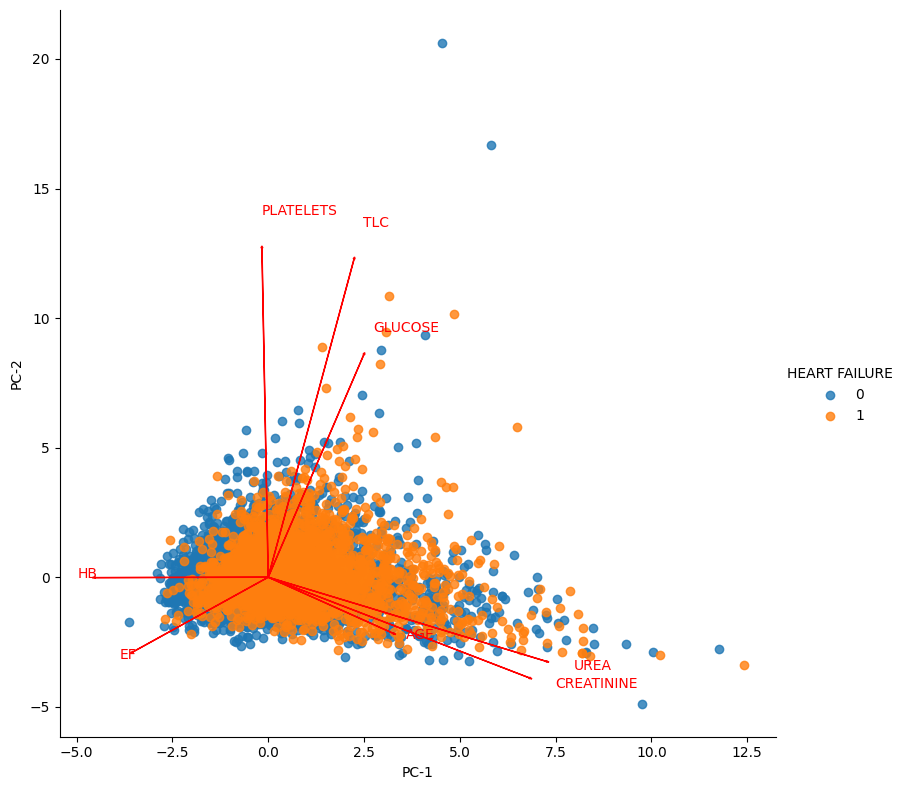

In [ ]:
# Plotting the first and second principal components

principle_components = pca.fit_transform(df_PCA_scaled)

# Reset index of df_Y
df_Y.reset_index(inplace=True)


df_pca = pd.DataFrame(principle_components)
#df_pca = pd.concat([df_pca, df_Y["HEART FAILURE"]], axis = 1)
df_pca['HEART FAILURE'] = df_Y['HEART FAILURE'].astype('category')
df_pca['OUTCOME'] = df_Y['OUTCOME'].astype('category')
df_pca['AKI'] = df_Y['AKI'].astype('category')
#display(df_pca)
df_pca.columns = ['PC-1','PC-2', 'PC-3', 'PC-4', 'PC-5', 'PC-6', 'HEART FAILURE','OUTCOME','AKI']
display(df_pca.head())

# Plot using the only the first 2 Principle Components as Axes
sns.lmplot(data=df_pca, x='PC-1', y='PC-2', hue='HEART FAILURE', fit_reg=False, height=8)

# set the maximum variance of the first two PCs
# this will be the end point of the arrow of each **original feature**
xvector = pca.components_[0]
yvector = pca.components_[1]
 
# value of the first two PCs, set the x, y axis boundary
xs = pca.transform(X_numerical)[:,0]
ys = pca.transform(X_numerical)[:,1]


# arrows project features (columns from csv) as vectors onto PC axes
for i in range(len(xvector)):
    plt.arrow(0, 0, xvector[i]*max(xs), yvector[i]*max(ys),
              color='r', width=0.005, head_width=0.05)
    plt.text(xvector[i]*max(xs)*1.1, yvector[i]*max(ys)*1.1,
             list(X_numerical.columns.values)[i], color='r')

Based on the plot above, UREA, CREATININE and AGE are approximately positively correlated, whereas HB is correlated negatively with them. In the other hand, PLATELETS, TLC and GLUCOSE are positively corelated among them, whereas EF negatively.

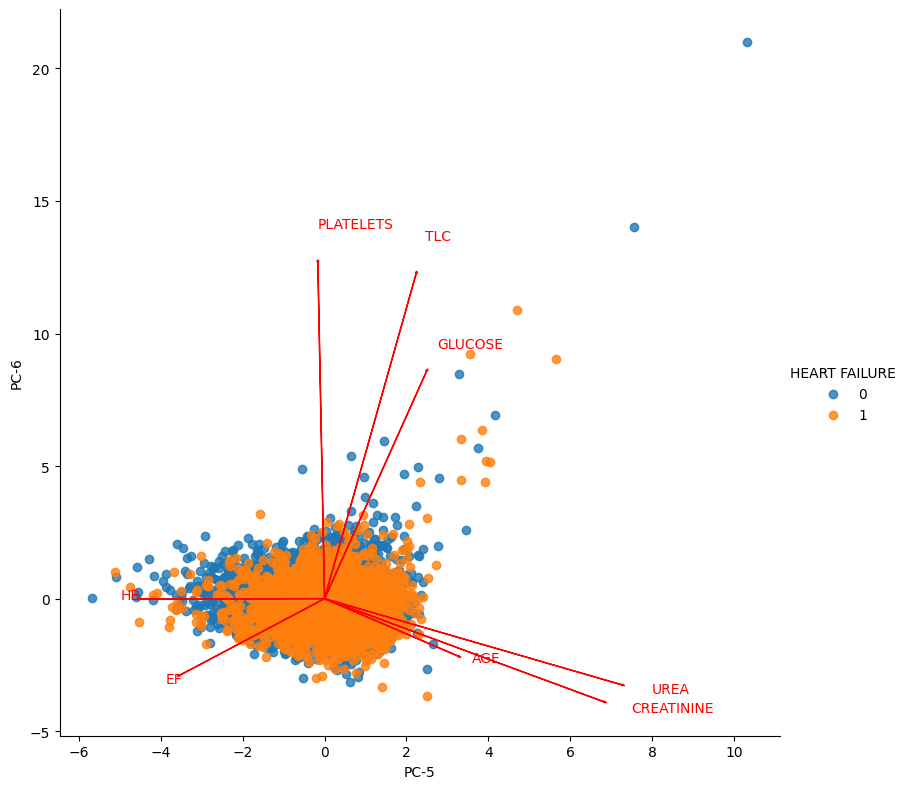

In [ ]:
# Plot using the only the last Principle Components as Axes
sns.lmplot(data=df_pca, x='PC-5', y='PC-6', hue='HEART FAILURE', fit_reg=False, height=8)

# set the maximum variance of the first two PCs
# this will be the end point of the arrow of each **original feature**
xvector = pca.components_[0]
yvector = pca.components_[1]
 
# value of the first two PCs, set the x, y axis boundary
xs = pca.transform(X_numerical)[:,0]
ys = pca.transform(X_numerical)[:,1]


# arrows project features (columns from csv) as vectors onto PC axes
for i in range(len(xvector)):
    plt.arrow(0, 0, xvector[i]*max(xs), yvector[i]*max(ys),
              color='r', width=0.005, head_width=0.05)
    plt.text(xvector[i]*max(xs)*1.1, yvector[i]*max(ys)*1.1,
             list(X_numerical.columns.values)[i], color='r')

#### 3.1.2 PCA without dummies for AKI

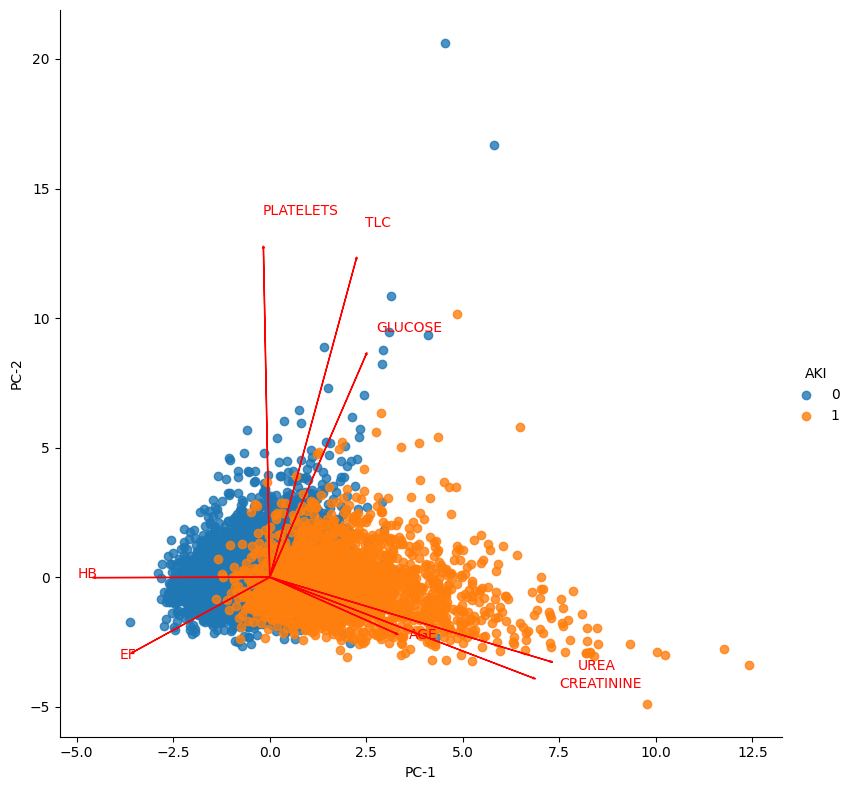

In [ ]:
# Plotting AKI using the only the first 2 Principle Components as Axes
sns.lmplot(data=df_pca, x='PC-1', y='PC-2', hue='AKI', fit_reg=False, height=8)

# set the maximum variance of the first two PCs
# this will be the end point of the arrow of each **original feature**
xvector = pca.components_[0]
yvector = pca.components_[1]
 
# value of the first two PCs, set the x, y axis boundary
xs = pca.transform(X_numerical)[:,0]
ys = pca.transform(X_numerical)[:,1]


# arrows project features (columns from csv) as vectors onto PC axes
for i in range(len(xvector)):
    plt.arrow(0, 0, xvector[i]*max(xs), yvector[i]*max(ys),
              color='r', width=0.005, head_width=0.05)
    plt.text(xvector[i]*max(xs)*1.1, yvector[i]*max(ys)*1.1,
             list(X_numerical.columns.values)[i], color='r')

Based on the plot above, UREA, CREATININE and AGE are approximately positively correlated, whereas HB is correlated negatively with them. In the other hand, PLATELETS, TLC and GLUCOSE are positively corelated among them, whereas EF negatively.

#### 3.1.3 PCA without dummies for Outcome

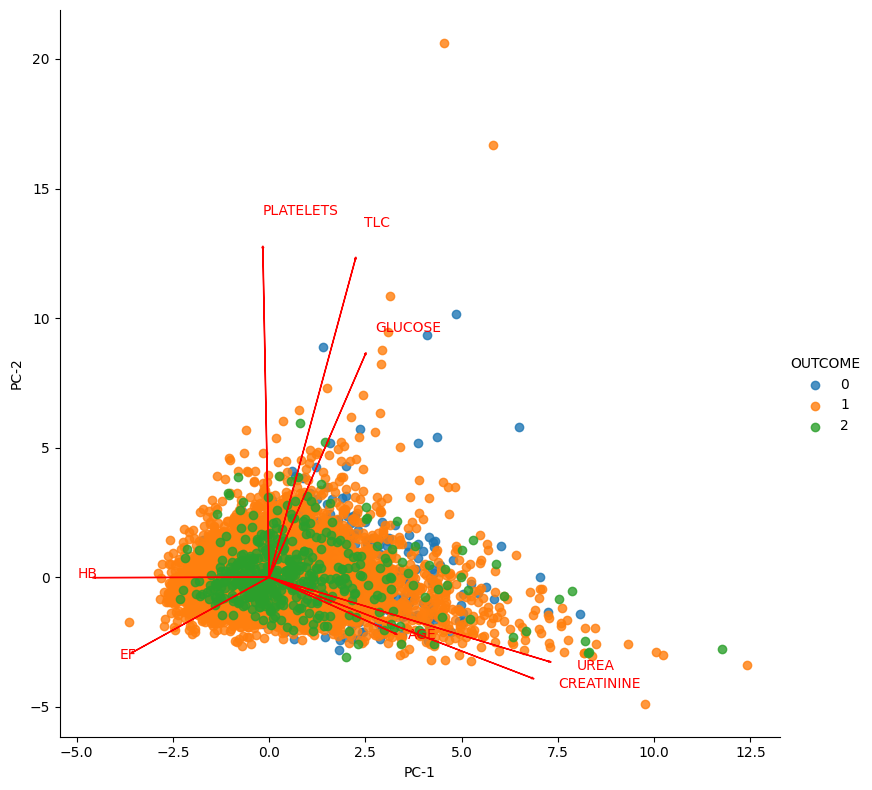

In [ ]:
# Plotting OUTCOME using the only the first 2 Principle Components as Axes
sns.lmplot(data=df_pca, x='PC-1', y='PC-2', hue='OUTCOME', fit_reg=False, height=8)

# set the maximum variance of the first two PCs
# this will be the end point of the arrow of each **original feature**
xvector = pca.components_[0]
yvector = pca.components_[1]
 
# value of the first two PCs, set the x, y axis boundary
xs = pca.transform(X_numerical)[:,0]
ys = pca.transform(X_numerical)[:,1]


# arrows project features (columns from csv) as vectors onto PC axes
for i in range(len(xvector)):
    plt.arrow(0, 0, xvector[i]*max(xs), yvector[i]*max(ys),
              color='r', width=0.005, head_width=0.05)
    plt.text(xvector[i]*max(xs)*1.1, yvector[i]*max(ys)*1.1,
             list(X_numerical.columns.values)[i], color='r')

Based on the plot above, UREA, CREATININE and AGE are approximately positively correlated, whereas HB is correlated negatively with them. In the other hand, PLATELETS, TLC and GLUCOSE are positively corelated among them, whereas EF negatively. Moreover most of the above points are for Discharge as almost 90% of the data points in the data set is for Discharge class.

### 3.2 PCA with Dummies

In [ ]:
# Dropping columns not applicable X for the PCA Analysis
df_PCA_dummies = dataClean.drop(columns=["DURATION OF STAY", "OUTCOME",
                                         "HEART FAILURE", "AKI",
                                         "TYPE OF ADMISSION-EMERGENCY/OPD"])

# to prepare the features(indepedent) variables and response(depedent) varisble.
dummies = pd.get_dummies(df_PCA[categorical_Variables])
X_numerical  = df_PCA.drop(categorical_Variables, axis = 1).astype('float64')

#print(dummies)

# Putting together numerical and dummies variables
df_PCA_scaled_dummies = pd.concat([X_numerical, dummies], axis=1)

#df_PCA_scaled_dummies.info()


# Scalling in Qunatitative variables only
from sklearn.preprocessing import StandardScaler

# Scalling Train dataframe
scaler = StandardScaler().fit(df_PCA_scaled_dummies[list_numerical]) 

df_PCA_scaled_dummies[list_numerical] = scaler.transform(df_PCA_scaled_dummies[list_numerical])

#display(df_PCA_scaled_dummies)
#print(df_PCA_scaled_dummies.columns)
#print(df_PCA_scaled_dummies.shape)

# Selected 6 components
pca = PCA(n_components=6)
pca.fit(df_PCA_scaled_dummies)  
#print(pca.components_) # << eigenvector matrix


# Variability of each component
print(pca.explained_variance_ratio_)

print("The 6 principal components represents the variability of all the features by ", np.sum(pca.explained_variance_ratio_))


[0.18877028 0.104235   0.09653387 0.08364053 0.07243566 0.06874363]
The 6 principal components represents the variability of all the features by  0.6143589786000505


Considering both quantitative variavles (scaled) and qualitative variable (dummified), by reducing the dimension to 6 principal companents, this represents 61.44% of the variability when considering all the features. The first principal component (PC-1) is responsible for 18.88% of this total, whereas the last one (PC-6) is responsible for 6.87%.

## 4 - HEART FAILURE (Qualitative Response) Analysis

### 4.1 - Separating the Cleaned Dataset in Train(80%) and Test(20%)

In [ ]:
# Dropping columns not applicable for the analysis of HEART FAILURE
df_Heart = dataClean.drop(columns=["DURATION OF STAY", "OUTCOME",
                                   "TYPE OF ADMISSION-EMERGENCY/OPD"])

from sklearn.model_selection import train_test_split

# Checking the count of each class in Y
k_name, k_count =  np.unique(df_Heart['HEART FAILURE'], return_counts=True)
print("Proporportion of ", k_name[0]," in the entire dataset is ", k_count[0]/sum(k_count))
print("Proporportion of ", k_name[1]," in the entire dataset is ", k_count[1]/sum(k_count))

# OPTION A - With Proportional Allocation (sttratified sampling) 
df_tr, df_te = train_test_split(df_Heart, test_size=0.2, stratify=df_Heart['HEART FAILURE'], random_state=2023)
counts = df_tr['HEART FAILURE'].value_counts()

# Checking the count of each class in Y of Train part
k_name_tr, k_count_tr =  np.unique(df_tr['HEART FAILURE'], return_counts=True)
print("Proporportion of ", k_name_tr[0]," in the TRAIN part is ", k_count_tr[0]/sum(k_count_tr))
print("Proporportion of ", k_name_tr[1]," in the TRAIN part is ", k_count_tr[1]/sum(k_count_tr))

# Removing Response variable and putting in separate dataframes
df_Y_tr = pd.DataFrame()
df_Y_tr["HEART FAILURE"] = df_tr['HEART FAILURE']
df_Y_te = pd.DataFrame()
df_Y_te["HEART FAILURE"] = df_te['HEART FAILURE']

df_tr.drop(columns = "HEART FAILURE", inplace=True)
df_te.drop(columns = "HEART FAILURE", inplace=True)


#df_tr.columns
#display(df_tr)
#display(df_Y_tr)





Proporportion of  0  in the entire dataset is  0.7127901234567902
Proporportion of  1  in the entire dataset is  0.2872098765432099
Proporportion of  0  in the TRAIN part is  0.7128395061728395
Proporportion of  1  in the TRAIN part is  0.28716049382716047


For the cleaned dataset, 71.3% of the total data is related to no HEART FAILURE (0), whereas 28.7% is related to patients diagnotisticated with HEART FAILURE (1). The entire dataset was splittled in 80% in train part to create the ML models, whereas the other 20% in test part to test these models. They were splitted randomly but allocating proportionaly the response variable based on the complete dataset (stratified sampling with proportional allocation) as it is possible to verify above.

In [ ]:
# Train and Test Dataframe considering Dummies and WITH Scale for quantitative variables )to be used in 

# Separating Categorical variables from train and test part to scale only numerical ones
categorical_Variables = ['GENDER', 'RURAL', 'SMOKING ',
       'ALCOHOL', 'DM', 'HTN', 'CAD', 'PRIOR CMP', 'CKD', 'RAISED CARDIAC ENZYMES',
       'SEVERE ANAEMIA', 'ANAEMIA', 'STABLE ANGINA', 'ACS', 'STEMI',
       'AKI']

# to prepare the features(indepedent) variables and response(depedent) varisble.
dummies_tr = pd.get_dummies(df_tr[categorical_Variables])
X_numerical_tr  = df_tr.drop(categorical_Variables, axis = 1).astype('float64')

#print(dummies_tr)


list_numerical = X_numerical_tr.columns
print(list_numerical)

# Putting together numerica and dummies
df_tr_Xscaled = pd.concat([X_numerical_tr, dummies_tr], axis=1)

#df_tr_Xscaled.info()

# to prepare the features(indepedent) variables and response(depedent) varisble.
dummies_te = pd.get_dummies(df_te[categorical_Variables])
X_numerical_te  = df_te.drop(categorical_Variables, axis = 1).astype('float64')

# Putting together numerica and dummies
df_te_Xscaled = pd.concat([X_numerical_te, dummies_te], axis=1)
#df_te_Xscaled.info()


# Scalling in Qunatitative variables only
from sklearn.preprocessing import StandardScaler

# Scalling Train dataframe
scaler = StandardScaler().fit(df_tr_Xscaled[list_numerical]) 

df_tr_Xscaled[list_numerical] = scaler.transform(df_tr_Xscaled[list_numerical])

# Scalling Test dataframe
scaler = StandardScaler().fit(df_te_Xscaled[list_numerical]) 

df_te_Xscaled[list_numerical] = scaler.transform(df_te_Xscaled[list_numerical])


display(df_tr_Xscaled.head())
print(df_tr_Xscaled.columns)


Index(['AGE', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA', 'CREATININE', 'EF'], dtype='object')


,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF,GENDER_F,GENDER_M,...,ANAEMIA_0,ANAEMIA_1,STABLE ANGINA_0,STABLE ANGINA_1,ACS_0,ACS_1,STEMI_0,STEMI_1,AKI_0,AKI_1
13152,0.144873,0.458840,-0.453270,-0.000438,1.023166,0.801739,-0.177085,-1.654515,0,1,...,1,0,1,0,1,0,1,0,1,0
2087,-0.988476,1.277947,0.725825,0.636747,-0.674485,-0.486659,-0.347607,-0.606350,0,1,...,1,0,1,0,0,1,0,1,1,0
6839,-0.232910,0.545062,-0.602351,0.430887,-0.917007,-0.434071,-0.177085,0.292078,0,1,...,1,0,1,0,0,1,0,1,1,0
2243,1.051551,-0.489599,-0.493928,-0.588610,-0.270283,0.249569,0.846050,0.292078,0,1,...,1,0,1,0,1,0,1,0,0,1
12265,1.807117,-0.230934,-0.073791,-0.225904,-0.108602,1.117265,0.436796,1.190505,1,0,...,1,0,1,0,1,0,1,0,0,1


Index(['AGE', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA', 'CREATININE', 'EF',
       'GENDER_F', 'GENDER_M', 'RURAL_R', 'RURAL_U', 'SMOKING _0',
       'SMOKING _1', 'ALCOHOL_0', 'ALCOHOL_1', 'DM_0', 'DM_1', 'HTN_0',
       'HTN_1', 'CAD_0', 'CAD_1', 'PRIOR CMP_0', 'PRIOR CMP_1', 'CKD_0',
       'CKD_1', 'RAISED CARDIAC ENZYMES_0', 'RAISED CARDIAC ENZYMES_1',
       'SEVERE ANAEMIA_0', 'SEVERE ANAEMIA_1', 'ANAEMIA_0', 'ANAEMIA_1',
       'STABLE ANGINA_0', 'STABLE ANGINA_1', 'ACS_0', 'ACS_1', 'STEMI_0',
       'STEMI_1', 'AKI_0', 'AKI_1'],
      dtype='object')


The explanatory quantitative variables for train and test parts were scaled separately to avoid dependence between them as well as the qualitative variables were dummified. The final train and test dataframes with scaled variables and dummified variables were created. This will be mainly applicable when fit ML models that depends on the distance (e.g. KNN).

Forother ML methods which does not requires the calculation of distance, it was a created below another dataframe for the explanatory quantitative variables without scale, but considering the qualitative variables dummified.

In [ ]:
# Column names with only X quantivative variables
x_variables = ['AGE', 'HB', 'TLC',
       'PLATELETS', 'GLUCOSE', 'UREA', 'CREATININE']

y_variable = ["HEART FAILURE"]


In [ ]:
# Train and Test Dataframe considering Dummies and No Scale for quantitative variables
x_variables_withDummies = ['AGE', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA', 'CREATININE', 'EF',
       'GENDER_F', 'GENDER_M', 'RURAL_R', 'RURAL_U', 'SMOKING _0',
       'SMOKING _1', 'ALCOHOL_0', 'ALCOHOL_1', 'DM_0', 'DM_1', 'HTN_0',
       'HTN_1', 'CAD_0', 'CAD_1', 'PRIOR CMP_0', 'PRIOR CMP_1', 'CKD_0',
       'CKD_1', 'RAISED CARDIAC ENZYMES_0', 'RAISED CARDIAC ENZYMES_1',
       'SEVERE ANAEMIA_0', 'SEVERE ANAEMIA_1', 'ANAEMIA_0', 'ANAEMIA_1',
       'STABLE ANGINA_0', 'STABLE ANGINA_1', 'ACS_0', 'ACS_1', 'STEMI_0',
       'STEMI_1', 'AKI_0', 'AKI_1']


# Putting together numerical (no scaled) and dummies
df_tr_withDummies= pd.concat([X_numerical_tr, dummies_tr], axis=1)
df_te_withDummies = pd.concat([X_numerical_te, dummies_te], axis=1)

display(df_tr_withDummies.head())

y_variable = ["HEART FAILURE"]

,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF,GENDER_F,GENDER_M,...,ANAEMIA_0,ANAEMIA_1,STABLE ANGINA_0,STABLE ANGINA_1,ACS_0,ACS_1,STEMI_0,STEMI_1,AKI_0,AKI_1
13152,63.0,13.4,8.3,239.0,253.0,78.0,1.10,22.0,0,1,...,1,0,1,0,1,0,1,0,1,0
2087,48.0,15.3,17.0,304.0,106.0,29.0,0.90,36.0,0,1,...,1,0,1,0,0,1,0,1,1,0
6839,58.0,13.6,7.2,283.0,85.0,31.0,1.10,48.0,0,1,...,1,0,1,0,0,1,0,1,1,0
2243,75.0,11.2,8.0,179.0,141.0,57.0,2.30,48.0,0,1,...,1,0,1,0,1,0,1,0,0,1
12265,85.0,11.8,11.1,216.0,155.0,90.0,1.82,60.0,1,0,...,1,0,1,0,1,0,1,0,0,1


After this stage, we had already created the dataframes (X and Y) with the train and test parts separately. For the explanatory datasets, 2 differents were created for each part, ones with scaled values (train and test sclaed apart) named df_tr_Xscaled and df_te_Xscaled,  and others without scale named df_tr_withDummies and df_te_withDummies.

### 4.2 - HEART FAILURE ML MODELS

#### Automated dataframe creation

For the ML models for HEART FAILURE prediction presented in this section, it was created initially some datframes to be used to store the accuracy, true negatives and positives predicted of each ML to allow us to generate automatic the plots at the end.

In [ ]:
# Dataframe to storage Accuracy Score of Train and Test Part
# [0] Name of ML   [1] Acc_tr      [2] Acc_te
acc_summary_HeartFailure = pd.DataFrame(columns=["ML_Model", "Accuracy_Tr", "Accuracy_Te"])

# Dataframes to store Total Number of Negatives and Positives indicated in Train and Test Parts
# [0] Name of ML   [1] True Negatives      [2] True Positives
trues_tr_HeartFailure = pd.DataFrame(columns=["ML_Model", "True_Negative", "True_Positive"])

trues_te_HeartFailure = pd.DataFrame(columns=["ML_Model", "True_Negative", "True_Positive"])

# Adding in each dataframe the total number of positives
k_name_tr, k_count_tr =  np.unique(df_Y_tr['HEART FAILURE'], return_counts=True)
new_row = {'ML_Model': 'REAL - TRAIN PART', 'True_Negative':k_count_tr[0], 'True_Positive': k_count_tr[1]}
trues_tr_HeartFailure.loc[len(trues_tr_HeartFailure)] = new_row

k_name_te, k_count_te =  np.unique(df_Y_te['HEART FAILURE'], return_counts=True)
new_row = {'ML_Model': 'REAL - TEST PART', 'True_Negative':k_count_te[0], 'True_Positive': k_count_te[1]}
trues_te_HeartFailure.loc[len(trues_te_HeartFailure)] = new_row

display(trues_tr_HeartFailure)
display(trues_te_HeartFailure)


,ML_Model,True_Negative,True_Positive
0,REAL - TRAIN PART,5774,2326


,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582


It was also created a function to allow to visualize better the Confusion Matrix of each ML model

In [ ]:
# Function to create confusion matrix
def confMatrixPlot(cm):
  # cm is a dataframe with the values of True/False Negative or Positive calculated by a Statistical Learning Method
  cm = np.array(cm)
  group_names = ["True Neg","False Pos","False Neg","True Pos"]

  group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
  group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]
  labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
  labels = np.asarray(labels).reshape(2,2)
  sns.heatmap(cm, annot=labels, fmt="", cmap='Blues')

#### 4.2.1 - LOGISTIC REGRESSION

In [ ]:
%%time
# Logistic Regression - Creating the model
model = LogisticRegression(max_iter=10000) # It was necessary to increase the number of iterations
model.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

#Plotting Coefficients
print(model.intercept_, model.coef_, model.score(df_tr_Xscaled, np.ravel(df_Y_tr)))

# Accuracy of apply training points of the generated model
y_pred_tr = model.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted LOGISTIC REGRESSION model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = model.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted LOGISTIC REGRESSION model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'LOGISTIC REGRESSION', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_HeartFailure.loc[len(acc_summary_HeartFailure)] = new_row

display(acc_summary_HeartFailure)

[-1.96173082] [[ 0.20982755 -0.23562548  0.08564682 -0.00908531  0.11863634  0.1791768
  -0.0962435  -0.78038651  0.14878692 -0.14858403  0.00177613 -0.00157324
   0.0543578  -0.05415491  0.09112136 -0.09091847  0.10270089 -0.102498
  -0.05068471  0.0508876   0.08239359 -0.0821907  -0.22639832  0.22660121
   0.11449872 -0.11429583 -0.15010513  0.15030802  0.17879489 -0.178592
   0.06114394 -0.06094105  0.63903456 -0.63883167 -0.01032432  0.01052721
   0.23325453 -0.23305164 -0.10231626  0.10251915]] 0.7675308641975309
Classification Accuracy of the fitted LOGISTIC REGRESSION model to predict TRAIN part:  0.7675308641975309
Classification Accuracy of the fitted LOGISTIC REGRESSION model to predict TEST part:  0.774320987654321


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.767531,0.774321


CPU times: user 215 ms, sys: 124 ms, total: 339 ms
Wall time: 375 ms


Based on the results above, the LOGISTIC REGRESSION fitted model presented an accuracy in the TRAIN part of 76.8%, wheraes this model could predict 77.4% of accuracy in predicting HEART FAILURE in the TEST part.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of LOGISTIC REGRESSION")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model': 'LOGISTIC REGRESSION', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_HeartFailure.loc[len(trues_tr_HeartFailure)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of LOGISTIC REGRESSION")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model': 'LOGISTIC REGRESSION', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_HeartFailure.loc[len(trues_te_HeartFailure)] = new_row

display(trues_tr_HeartFailure)
display(trues_te_HeartFailure)

CONFUSION MATRIX - TRAIN PART of LOGISTIC REGRESSION
       No   Yes
No   5237  1346
Yes   537   980
CONFUSION MATRIX - TEST PART of LOGISTIC REGRESSION
       No  Yes
No   1310  324
Yes   133  258


,ML_Model,True_Negative,True_Positive
0,REAL - TRAIN PART,5774,2326
1,LOGISTIC REGRESSION,5237,980


,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582
1,LOGISTIC REGRESSION,1310,258


CONFUSION MATRIX - TRAIN PART of LOGISTIC REGRESSION


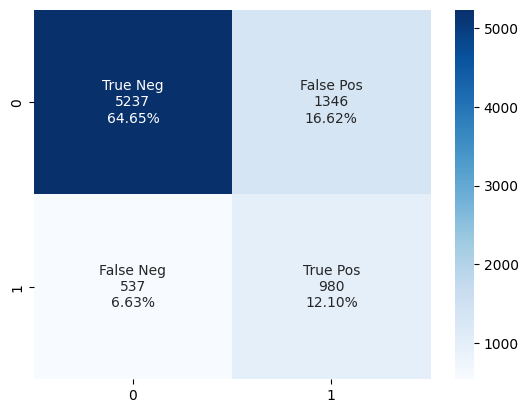

In [ ]:
print("CONFUSION MATRIX - TRAIN PART of LOGISTIC REGRESSION")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TRAIN part, the LOGISTIC REGRESSION fitted model predicted correctly 5237 no HEART FAILURE diagnostic, whereas 1346 of patient without the diagnoticof HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 980 were predictly correctly, where 537 were predicted incorrectly.

CONFUSION MATRIX - TEST PART of LOGISTIC REGRESSION


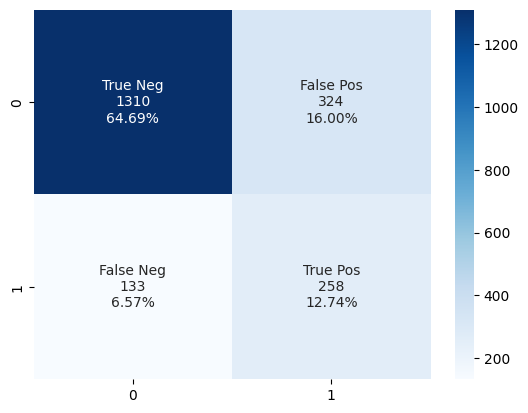

In [ ]:
print("CONFUSION MATRIX - TEST PART of LOGISTIC REGRESSION")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the LOGISTIC REGRESSION fitted model predicted correctly 1310 no HEART FAILURE diagnostic, whereas 324 of patient without the diagnoticof HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 258 were predictly correctly, where 133 were predicted incorrectly.

(2025, 1)
(2025,)
AUC score =  0.6755649384515364


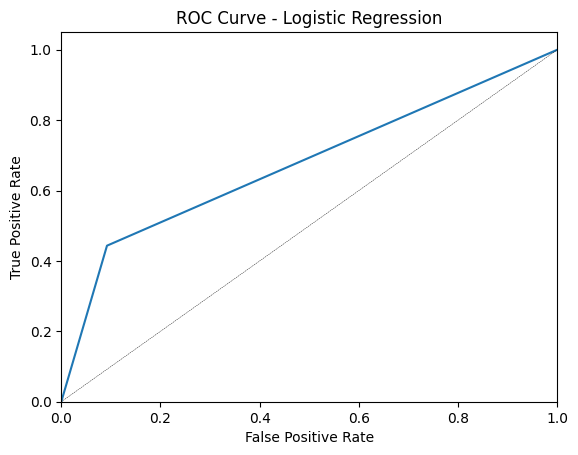

In [ ]:
# Checking Area under the ROC Curve

from sklearn.metrics import roc_curve, auc, roc_auc_score

y_pred = model.predict(df_te_Xscaled)

print(df_Y_te.shape)
print(y_pred.shape)

fpr, tpr, _ = roc_curve(df_Y_te, y_pred)
roc_auc = auc(fpr, tpr)

# AUC score
print("AUC score = ", roc_auc_score(df_Y_te, y_pred))

# Plotting ROC (Receiver operating characteristic)
plt.figure()
plt.plot(fpr, tpr)
plt.plot([0.0, 1.0], [0.0, 1.0], ls='--', lw=0.3, c='black')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Logistic Regression')
plt.show()

The Receiver Operating Curve (ROC Curve) tat presents the relation of predicted True Positive Rate versus False Positive Rate indicates that the percentage of correct prediction of HEART FAILURE overcomes the wrong ones which indicated the model is some way in good.

#### 4.2.2 - QDA

In [ ]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA

sklearn_qda = QDA(priors=None,store_covariance=True) #creating a QDA object
qda = sklearn_qda.fit(df_tr_Xscaled, np.ravel(df_Y_tr)) #learning the projection matrix

Y_tr_labels = qda.predict(df_tr_Xscaled) #gives you the predicted label for each sample
Y_tr_prob = qda.predict_proba(df_tr_Xscaled) #the probability of each sample to belong to each class

Y_tr_labels = np.array(Y_tr_labels).reshape(-1,1)

Y_test_labels=qda.predict(df_te_Xscaled)
Y_test_prob = qda.predict_proba(df_te_Xscaled) 

#print(Y_test_labels.shape)
#print(df_Y_te.shape)

Y_test_labels = np.array(Y_test_labels).reshape(-1,1)

#np.mean(df_Y_te==Y_test_labels)
#print(qda.means_)
#print(qda.covariance_)


# Accuracy of apply training points of the generated model
acc_train = accuracy_score(df_Y_tr, Y_tr_labels)
print('Classification Accuracy of the fitted QDA model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
acc_test = accuracy_score(df_Y_te, Y_test_labels)
print('Classification Accuracy of the fitted QDA model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'QDA (threshold = 0.5)', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_HeartFailure.loc[len(acc_summary_HeartFailure)] = new_row

display(acc_summary_HeartFailure)

Classification Accuracy of the fitted QDA model to predict TRAIN part:  0.6758024691358024
Classification Accuracy of the fitted QDA model to predict TEST part:  0.6785185185185185


/usr/local/lib/python3.9/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning:

Variables are collinear



,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.767531,0.774321
1,QDA (threshold = 0.5),0.675802,0.678519


Based on the results above, the QDA (deault threshold of 0.5) fitted model presented an accuracy in the TRAIN part of 67.6%, whereas this model could predict HEART FAILURE in the TEST part with 67.9% of accuracy.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of QDA with Threshold = 0.5")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, Y_tr_labels).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model': 'QDA (threshold = 0.5)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_HeartFailure.loc[len(trues_tr_HeartFailure)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of QDA with Threshold = 0.5")
cm = pd.DataFrame(confusion_matrix(df_Y_te, Y_test_labels).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model': 'QDA (threshold = 0.5)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_HeartFailure.loc[len(trues_te_HeartFailure)] = new_row

display(trues_tr_HeartFailure)
display(trues_te_HeartFailure)

CONFUSION MATRIX - TRAIN PART of QDA with Threshold = 0.5
       No   Yes
No   4192  1044
Yes  1582  1282
CONFUSION MATRIX - TEST PART of QDA with Threshold = 0.5
       No  Yes
No   1038  246
Yes   405  336


,ML_Model,True_Negative,True_Positive
0,REAL - TRAIN PART,5774,2326
1,LOGISTIC REGRESSION,5237,980
2,QDA (threshold = 0.5),4192,1282


,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582
1,LOGISTIC REGRESSION,1310,258
2,QDA (threshold = 0.5),1038,336


CONFUSION MATRIX - TRAIN PART of QDA with Threshold = 0.5


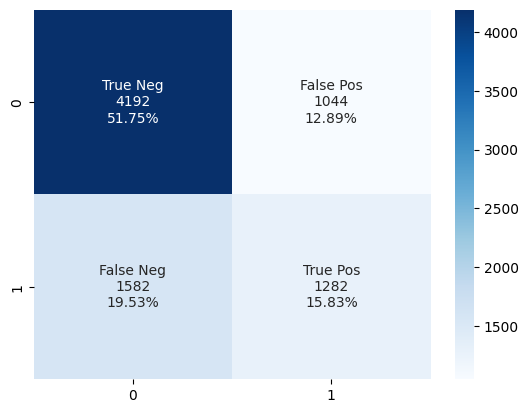

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of QDA with Threshold = 0.5")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, Y_tr_labels).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)


For the TRAIN part, the QGA (default threshold = 0.5) fitted model predicted correctly 4192 no HEART FAILURE diagnostic, whereas 1044 of patients without the diagnoticof HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 1282 were predictly correctly, where 1582 were predicted incorrectly.

CONFUSION MATRIX - TEST PART of QDA with Threshold = 0.5


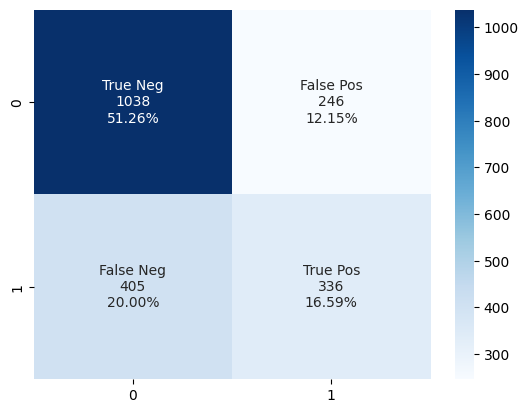

In [ ]:
print("CONFUSION MATRIX - TEST PART of QDA with Threshold = 0.5")
cm = pd.DataFrame(confusion_matrix(df_Y_te, Y_test_labels).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)


For the TEST part, the QGA (default threshold = 0.5) fitted model predicted correctly 1038 no HEART FAILURE diagnostic, whereas 246 of patients without the diagnoticof HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 336 were predictly correctly, where 405 were predicted incorrectly.

As threshold of probability is something that we can manage, it was done some sensitivity on this parameter as presented below.

/usr/local/lib/python3.9/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning:

In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'



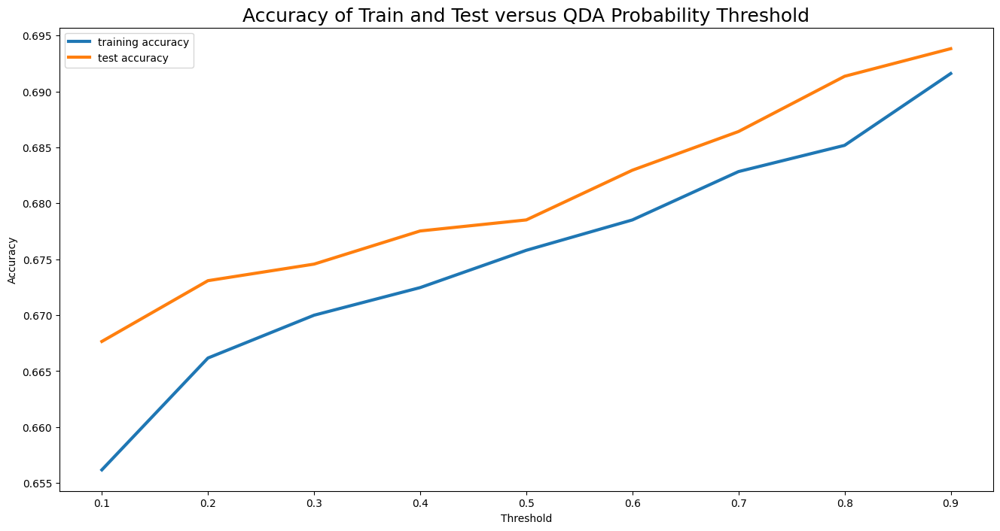

In [ ]:
# Sensitivity in the threshold
minThreshold = 0.1
nThreshold = np.arange(minThreshold, 1.0, step=0.1)
#print(nThreshold)
len(nThreshold)
 
# Arrays to storage accuracy 
acc_train_by_n = []
acc_te_by_n = []

for i in nThreshold:
  threshold = i

  # Train Part
  df_train=pd.DataFrame()
  df_train = np.array(Y_tr_prob[:,1].reshape(-1,1))

  #print(np.mean(df_Y_tr==(df_train>=threshold)))
  acc_train = np.mean(df_Y_tr==(df_train>=threshold))
  acc_train_by_n.append(acc_train)

  # Test Part
  df_test=pd.DataFrame()
  df_test = np.array(Y_test_prob[:,1].reshape(-1,1))

  #print(np.mean(df_Y_te==(df_test>=threshold)))
  acc_te = np.mean(df_Y_te==(df_test>=threshold))
  acc_te_by_n.append(np.mean(acc_te))

  # Just to print the summary of each iteraction (number of depths)
  #print(threshold, acc_train, acc_te)

# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(nThreshold, acc_train_by_n, label="training accuracy", lw=3)
plt.plot(nThreshold, acc_te_by_n, label="test accuracy", lw=3)
plt.ylabel("Accuracy")
plt.xlabel("Threshold")
plt.title("Accuracy of Train and Test versus QDA Probability Threshold", fontsize=18)
plt.legend()




Based on threshold senstivity results presented above, increasing the threshold improves the performance of QDA model, but this just increases because themodel start to predict more units with coreect prediction of no HEART FAILURE and consequently reducing the correct predict of patients diagnosticated with HEART FAILURE. As the majority of the dataset is related to no HEART FAILURE, this pushes the accuracy to higher values.

#### 4.2.3 - CLASSIFICATION TREE

For Classification Tree, as this ML method requires to set in PYTHON the maximum depth, it was done initially some sensitivity in this parameter.

2 0.7490123456790123 0.7441975308641975
3 0.7603703703703704 0.76
4 0.7617283950617284 0.7585185185185185
5 0.774320987654321 0.7530864197530864
6 0.7830864197530865 0.745679012345679
7 0.7996296296296296 0.7451851851851852
8 0.8149382716049383 0.7466666666666667
9 0.8333333333333334 0.7288888888888889
10 0.8520987654320987 0.7274074074074074
11 0.8722222222222222 0.7254320987654321
12 0.8909876543209877 0.7219753086419753
CPU times: user 775 ms, sys: 11.3 ms, total: 786 ms
Wall time: 787 ms


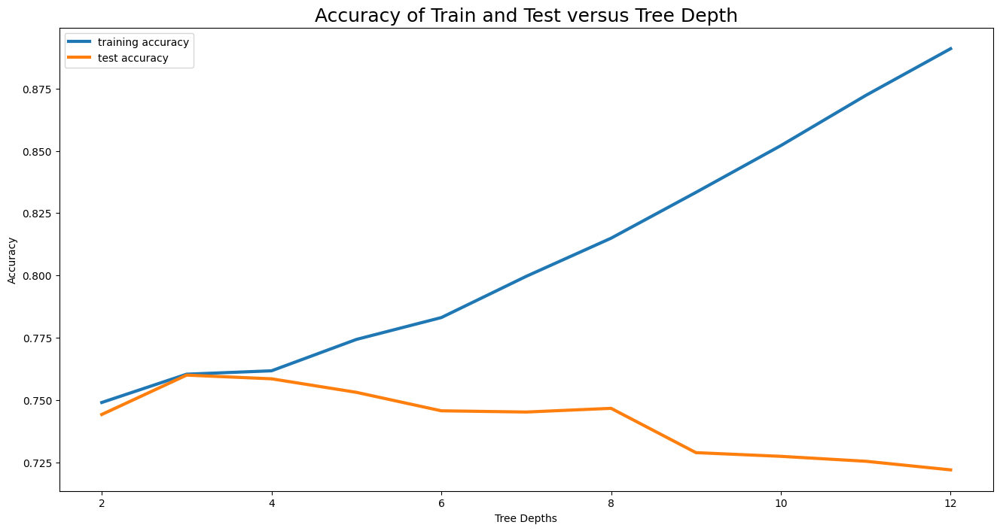

In [ ]:
%%time
minTreeDepth = 2
maxTreeDepth = 12
nDepths = np.arange(minTreeDepth, maxTreeDepth+1, step=1)
#print(nDepths)
len(nDepths)
 

# Arrays to storage accuracy 
acc_train_by_n = []
acc_te_by_n = []

for i in nDepths:
  criteria = "gini" 
  max_depth = nDepths
  min_sample_leaf = 2
  clf_gini = DecisionTreeClassifier(criterion=criteria, random_state=100,
                                max_depth=i, min_samples_leaf=min_sample_leaf)
  clf_gini.fit(df_tr_withDummies[x_variables_withDummies], df_Y_tr[y_variable]) 

  # Checking accuracy of Train
  acc_train = accuracy_score(df_Y_tr[y_variable], clf_gini.predict(df_tr_withDummies[x_variables_withDummies]))
  #print(acc_train)
  acc_train_by_n.append(acc_train)

  # Accuracy of apply all test point
  acc_te = accuracy_score(df_Y_te[y_variable], clf_gini.predict(df_te_withDummies[x_variables_withDummies]))
  #print(acc_te)
  acc_te_by_n.append(acc_te)

  # Just to print the summary of each iteraction (number of depths)
  print(i, acc_train, acc_te)

# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(nDepths, acc_train_by_n, label="training accuracy", lw=3)
plt.plot(nDepths, acc_te_by_n, label="test accuracy", lw=3)
plt.ylabel("Accuracy")
plt.xlabel("Tree Depths")
plt.title("Accuracy of Train and Test versus Tree Depth", fontsize=18)
plt.legend()
#major_ticks = np.arange(1, maxTreeDepth+1, 1)
#plt.xticks(major_ticks)


Based on the results of the sensitivity in the depth of the tree, it is possible to see that the maximum test accuracy is reached with 3 depths. The accuracy similar of the train part. Increasing the depths difference of them increases due to to improment in the performance of train part. However, this indicates that the model starts being overfitted. 

It was select Depth of 3 for the Classification Tree to predict Heart failure, which the model contruction and its performance is presented below.

In [ ]:
%%time
# to build a tree, we could use 'gini' or 'entropy' as split criterion at each node. 
# here we use an example use 'gini' and with a few other hyperparameters.
criteria = "gini" 
max_depth = 3
min_sample_leaf = 2
clf_gini = DecisionTreeClassifier(criterion=criteria, random_state=100,
                                max_depth=max_depth, min_samples_leaf=min_sample_leaf)
clf_gini.fit(df_tr_withDummies[x_variables_withDummies], df_Y_tr[y_variable])
print(clf_gini.score(df_tr_withDummies[x_variables_withDummies], df_Y_tr[y_variable]))

# Accuracy of apply training points of the generated model
y_pred_tr = clf_gini.predict(df_tr_withDummies[x_variables_withDummies])
acc_train = accuracy_score(df_Y_tr[y_variable], y_pred_tr)
print('Classification Accuracy of the fitted Classification Tree model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = clf_gini.predict(df_te_withDummies[x_variables_withDummies])
acc_test = accuracy_score(df_Y_te[y_variable], y_pred_te)
print('Classification Accuracy of the fitted Classification Tree model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'CLASSIFICATION TREE (Depth = 3)', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_HeartFailure.loc[len(acc_summary_HeartFailure)] = new_row

display(acc_summary_HeartFailure)



0.7603703703703704
Classification Accuracy of the fitted Classification Tree model to predict TRAIN part:  0.7603703703703704
Classification Accuracy of the fitted Classification Tree model to predict TEST part:  0.76


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.767531,0.774321
1,QDA (threshold = 0.5),0.675802,0.678519
2,CLASSIFICATION TREE (Depth = 3),0.760370,0.760000


CPU times: user 96 ms, sys: 725 µs, total: 96.8 ms
Wall time: 251 ms


Based on the results above, the CLASSIFICATION TREE fitted model presented an accuracy in the TRAIN and TEST part of 76.0%.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of CLASSIFICATION TREE")
cm = pd.DataFrame(confusion_matrix(df_Y_tr[y_variable], y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model': 'CLASSIFICATION TREE (Depth = 3)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_HeartFailure.loc[len(trues_tr_HeartFailure)] = new_row


CONFUSION MATRIX - TRAIN PART of CLASSIFICATION TREE
       No   Yes
No   5070  1237
Yes   704  1089


In [ ]:
# TEST Part
print("CONFUSION MATRIX - TEST PART of CLASSIFICATION TREE")
cm = pd.DataFrame(confusion_matrix(df_Y_te[y_variable], y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model': 'CLASSIFICATION TREE (Depth = 3)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_HeartFailure.loc[len(trues_te_HeartFailure)] = new_row

display(trues_tr_HeartFailure)
display(trues_te_HeartFailure)


CONFUSION MATRIX - TEST PART of CLASSIFICATION TREE
       No  Yes
No   1260  303
Yes   183  279


,ML_Model,True_Negative,True_Positive
0,REAL - TRAIN PART,5774,2326
1,LOGISTIC REGRESSION,5237,980
2,QDA (threshold = 0.5),4192,1282
3,CLASSIFICATION TREE (Depth = 3),5070,1089


,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582
1,LOGISTIC REGRESSION,1310,258
2,QDA (threshold = 0.5),1038,336
3,CLASSIFICATION TREE (Depth = 3),1260,279


CONFUSION MATRIX - TRAIN PART of CLASSIFICATION TREE


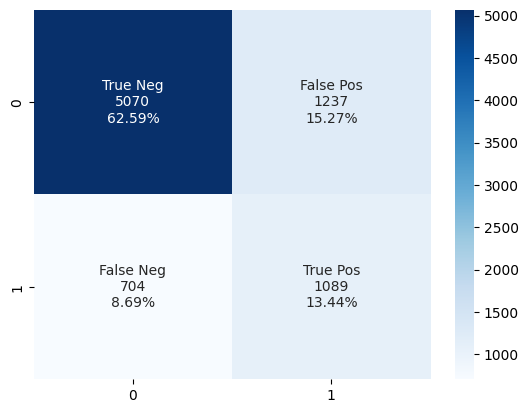

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of CLASSIFICATION TREE")
cm = pd.DataFrame(confusion_matrix(df_Y_tr[y_variable], y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)


For the TRAIN part, the CLASSIFICATION TREE fitted model predicted correctly 5070 no HEART FAILURE diagnostic, whereas 1237 of patients without the diagnoticof HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 1089 were predictly correctly, where 704 were predicted incorrectly.

CONFUSION MATRIX - TEST PART of CLASSIFICATION TREE


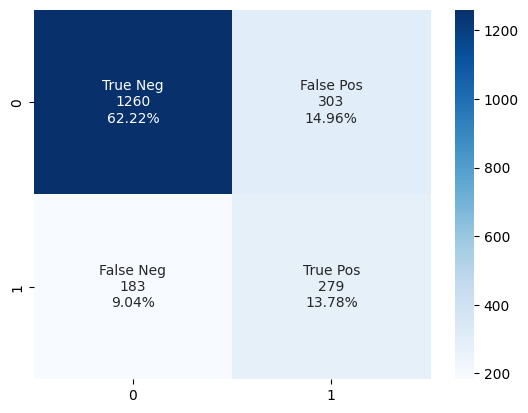

In [ ]:
print("CONFUSION MATRIX - TEST PART of CLASSIFICATION TREE")
cm = pd.DataFrame(confusion_matrix(df_Y_te[y_variable], y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)


For the TEST part, the CLASSIFICATION TREE fitted model predicted correctly 1260 no HEART FAILURE diagnostic, whereas 303 of patients without the diagnoticof HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 279 were predictly correctly, where 183 were predicted incorrectly.

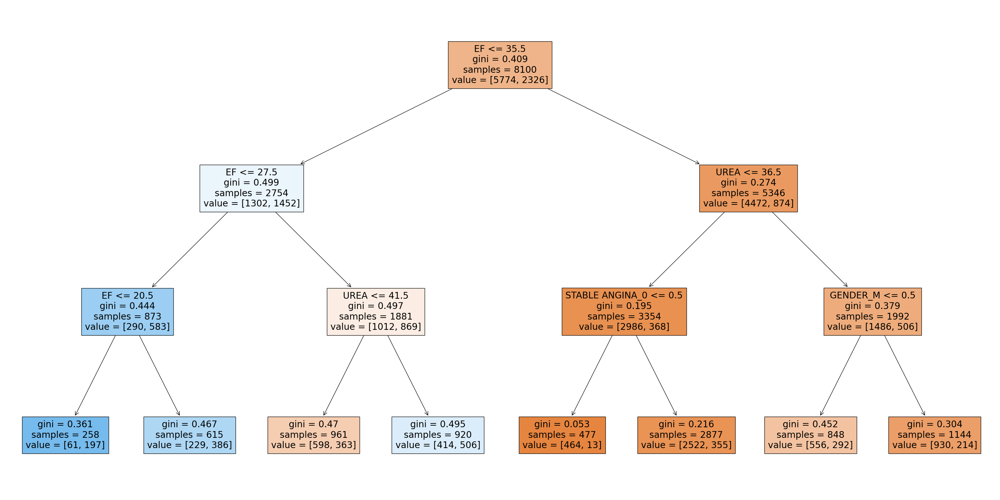

In [ ]:
# one attractive feature of a tree is visualization. 
plt.figure(figsize=(40,20))  # customize according to the size of your tree
plot_tree(clf_gini, feature_names = df_tr_withDummies[x_variables_withDummies].columns, filled=True)
plt.show()


For the final tree (Depth = 3), it is important the most relevant explanatory variables to predict HEART FAILURE are presented at the top of the Tree (EF and UREA). EF values higher or equal than 35.5, the model indicates NO HEART FAILURE, but values lower than 35.5 the model usually predicts HEART FAILURE, except in the situations of EF > 27.5 and UREA <= 41.5. No purity was indicated for any terminal node (leaf), but the condition of EF>35.5, UREA<=36.5 and STABLE_ANGINA = 0, it reaches the best purity (Gini almost 0). 

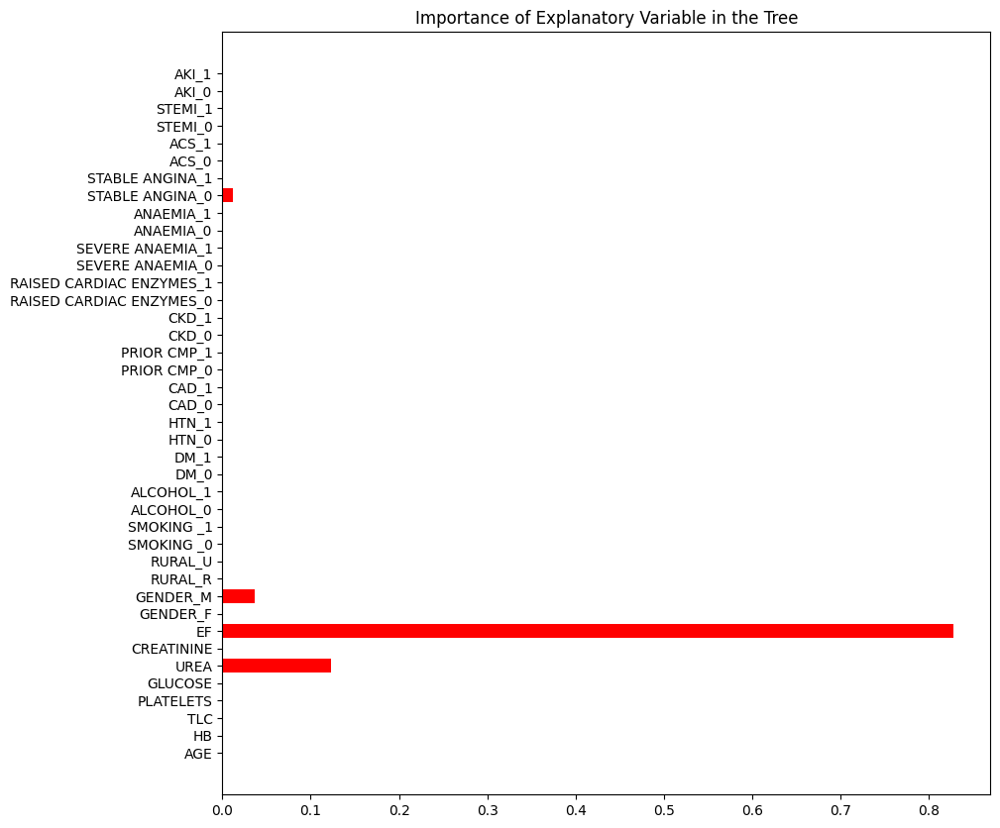

In [ ]:
# Plotting the variables based on the importance
plt.figure(figsize=(10,10))
plt.barh(np.arange(len(x_variables_withDummies)), clf_gini.feature_importances_, color = "red")
plt.yticks(ticks=np.arange(len(x_variables_withDummies)), labels=x_variables_withDummies)
plt.title("Importance of Explanatory Variable in the Tree")
plt.show()

It is possible to verify in the plot above related to the importance of the explanatory variables in HEART FAILURE that EF is far away the most relevant variable, followed be UREA. For this reason, It is plotted below the most important regions of UREA versus EF.

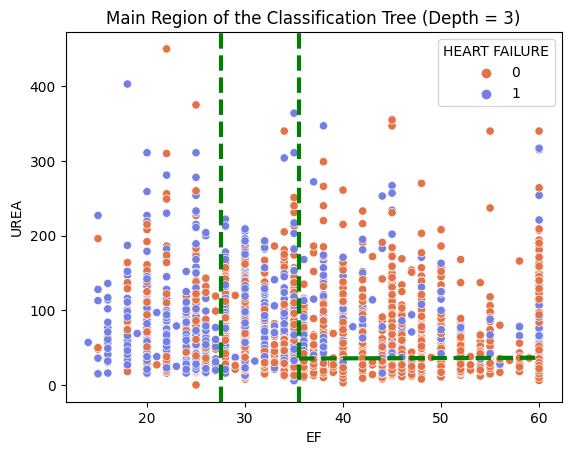

In [ ]:
# Plotting UREA and EF
df_tr_main_Xtree = pd.DataFrame()
df_tr_main_Xtree["UREA"] = df_tr_withDummies["UREA"]
df_tr_main_Xtree["EF"] = df_tr_withDummies["EF"]
df_tr_main_Xtree["HEART FAILURE"] = df_Y_tr[y_variable]

sns.scatterplot(data=df_tr_main_Xtree, x="EF", y="UREA", hue="HEART FAILURE", palette=["#E37346", "#747FE3"])
plt.title("Main Region of the Classification Tree (Depth = 3)")
plt.axvline(35.5, ls='--', linewidth=3, color='green')
plt.axvline(27.5, ls='--', linewidth=3, color='green')
plt.plot([35.5,60], [35.5,36.5], ls='--', linewidth=3, color='green')
#plt.axhline(200, ls='--', linewidth=3, color='red')

#### 4.2.4 - GAUSSIAN NB

In [ ]:
%%time
from sklearn.naive_bayes import GaussianNB

#print(df_tr_Xscaled.shape)
#print(df_Y_tr.shape)

#print(df_tr_Xscaled.shape)
#print(df_Y_tr.shape)

# Fitting the scaled dataframe
model = GaussianNB()
model.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

# Accuracy of apply training points of the generated model
y_pred_tr = model.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted Gaussian Naives Bayes model to\
 predict TRAIN part: ',acc_train)


# Accuracy of apply all test point
y_pred_te = model.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted Gaussian Naives Bayes model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'GAUSSIAN NB', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_HeartFailure.loc[len(acc_summary_HeartFailure)] = new_row

display(acc_summary_HeartFailure)


Classification Accuracy of the fitted Gaussian Naives Bayes model to predict TRAIN part:  0.7132098765432099
Classification Accuracy of the fitted Gaussian Naives Bayes model to predict TEST part:  0.7234567901234568


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.767531,0.774321
1,QDA (threshold = 0.5),0.675802,0.678519
2,CLASSIFICATION TREE (Depth = 3),0.760370,0.760000
3,GAUSSIAN NB,0.713210,0.723457


CPU times: user 36.3 ms, sys: 2.06 ms, total: 38.4 ms
Wall time: 47 ms


Based on the results above, the GAUSSIAN NAIVE BAYES fitted model presented an accuracy in the TRAIN part of 71.3%, whereas this model could predict HEART FAILURE in the TEST part with 72.3% of accuracy.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of GAUSSIAN NAIVE BAYES")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model': 'GAUSSIAN NB', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_HeartFailure.loc[len(trues_tr_HeartFailure)] = new_row


# Test Part
print("CONFUSION MATRIX - TEST PART of GAUSSIAN NAIVE BAYES")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model': 'GAUSSIAN NB', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_HeartFailure.loc[len(trues_te_HeartFailure)] = new_row

display(trues_tr_HeartFailure)
display(trues_te_HeartFailure)

CONFUSION MATRIX - TRAIN PART of GAUSSIAN NAIVE BAYES
       No   Yes
No   4355   904
Yes  1419  1422
CONFUSION MATRIX - TEST PART of GAUSSIAN NAIVE BAYES
       No  Yes
No   1103  220
Yes   340  362


,ML_Model,True_Negative,True_Positive
0,REAL - TRAIN PART,5774,2326
1,LOGISTIC REGRESSION,5237,980
2,QDA (threshold = 0.5),4192,1282
3,CLASSIFICATION TREE (Depth = 3),5070,1089
4,GAUSSIAN NB,4355,1422


,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582
1,LOGISTIC REGRESSION,1310,258
2,QDA (threshold = 0.5),1038,336
3,CLASSIFICATION TREE (Depth = 3),1260,279
4,GAUSSIAN NB,1103,362


CONFUSION MATRIX - TRAIN PART of GAUSSIAN NAIVE BAYES


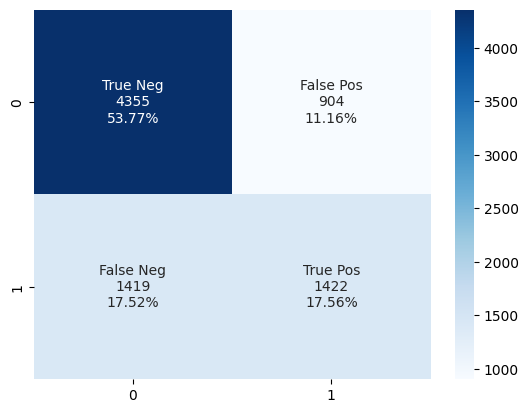

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of GAUSSIAN NAIVE BAYES")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)


For the TRAIN part, the GAUSSIAN NAIVE BAYES fitted model predicted correctly 4355 no HEART FAILURE diagnostic, whereas 904 of patients without the diagnoticof HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 1422 were predictly correctly, where 1419 were predicted incorrectly.

CONFUSION MATRIX - TEST PART of GAUSSIAN NAIVE BAYES


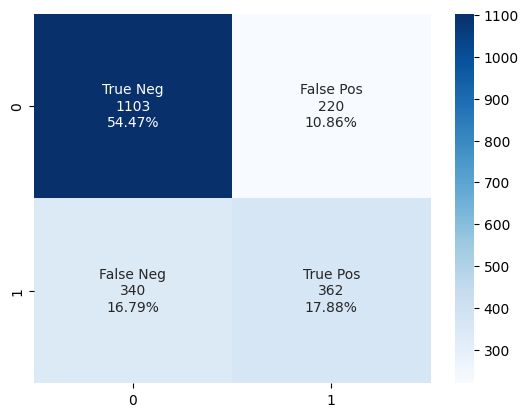

In [ ]:
print("CONFUSION MATRIX - TEST PART of GAUSSIAN NAIVE BAYES")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the GAUSSIAN NAIVE BAYES fitted model predicted correctly 1103 no HEART FAILURE diagnostic, whereas 220 of patients without the diagnotic of HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 362 were predictly correctly, where 340 were predicted incorrectly.

#### 4.2.5 - SVC with GridSearchCV

For Support Vector Classifier (SVC) which two parameters (kernel and C) are inputs, it was adopted to use GridSearch to find the opimum input values.

In [ ]:
%%time
from sklearn.datasets import load_breast_cancer
from sklearn import svm
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV


# Setting parameters
#parameters = {'kernel':('linear', 'rbf', 'poly'), 'C':[ 0.001, 0.01, 0.1, 1, 10]}
parameters = {'kernel':['linear', 'rbf', 'poly'], 'C':[0.001, 0.01, 0.1, 1, 10]}
#parameters = {'kernel':['poly'], 'C':[0.1, 1]}
svc = svm.SVC()
cvGrid = GridSearchCV(svc, parameters, cv=5)

# Fitting the model based on Train Part
cvGrid.fit(df_tr_Xscaled, np.ravel(df_Y_tr))


print("The best parameters for the Support Vector Classifier are: ", cvGrid.best_params_)

# Accuracy of apply training points of the generated model
y_pred_tr = cvGrid.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted SVC model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = cvGrid.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted SVC model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'SVC C=1 kernel=poly', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_HeartFailure.loc[len(acc_summary_HeartFailure)] = new_row

display(acc_summary_HeartFailure)

The best parameters for the Support Vector Classifier are:  {'C': 1, 'kernel': 'poly'}
Classification Accuracy of the fitted SVC model to predict TRAIN part:  0.8007407407407408
Classification Accuracy of the fitted SVC model to predict TEST part:  0.7604938271604939


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.767531,0.774321
1,QDA (threshold = 0.5),0.675802,0.678519
2,CLASSIFICATION TREE (Depth = 3),0.760370,0.760000
3,GAUSSIAN NB,0.713210,0.723457
4,SVC C=1 kernel=poly,0.800741,0.760494


CPU times: user 32.1 s, sys: 103 ms, total: 32.2 s
Wall time: 32.3 s


GridSearchCV indicated the best C = 1 and Kernal="poly" for SVC model. With those inputs,  SVC model presented an accuracy in the TRAIN part of 80.1%, whereas this model could predict HEART FAILURE in the TEST part with 76.0% of accuracy.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model': 'SVC C=1 kernel=poly', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_HeartFailure.loc[len(trues_tr_HeartFailure)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model': 'SVC C=1 kernel=poly', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_HeartFailure.loc[len(trues_te_HeartFailure)] = new_row

display(trues_tr_HeartFailure)
display(trues_te_HeartFailure)

CONFUSION MATRIX - TRAIN PART of SVC with  {'C': 1, 'kernel': 'poly'}
       No   Yes
No   5366  1206
Yes   408  1120
CONFUSION MATRIX - TEST PART of SVC with  {'C': 1, 'kernel': 'poly'}
       No  Yes
No   1307  349
Yes   136  233


,ML_Model,True_Negative,True_Positive
0,REAL - TRAIN PART,5774,2326
1,LOGISTIC REGRESSION,5237,980
2,QDA (threshold = 0.5),4192,1282
3,CLASSIFICATION TREE (Depth = 3),5070,1089
4,GAUSSIAN NB,4355,1422
5,SVC C=1 kernel=poly,5366,1120


,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582
1,LOGISTIC REGRESSION,1310,258
2,QDA (threshold = 0.5),1038,336
3,CLASSIFICATION TREE (Depth = 3),1260,279
4,GAUSSIAN NB,1103,362
5,SVC C=1 kernel=poly,1307,233


CONFUSION MATRIX - TRAIN PART of SVC with  {'C': 1, 'kernel': 'poly'}


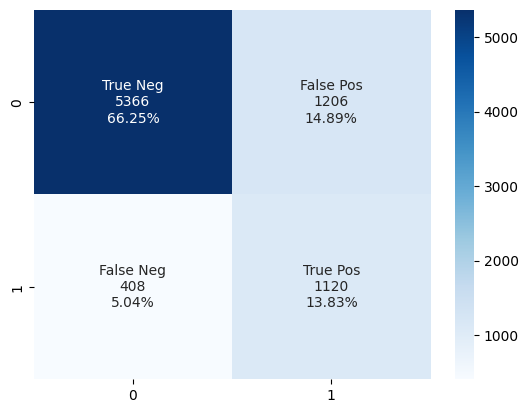

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

CONFUSION MATRIX - TEST PART of SVC with  {'C': 1, 'kernel': 'poly'}


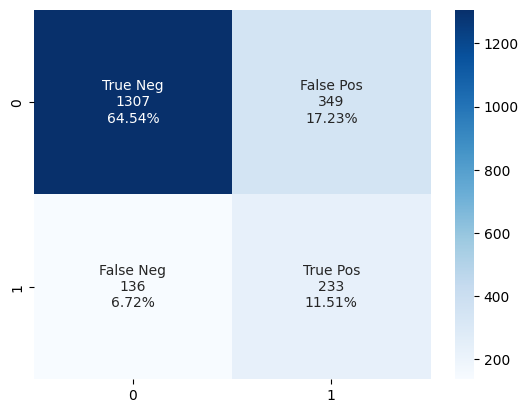

In [ ]:
print("CONFUSION MATRIX - TEST PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the SVC (with C=1 and kernel="poly") fitted model predicted correctly 1307 no HEART FAILURE diagnostic, whereas 349 of patients without the diagnotic of HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 233 were predictly correctly, where 136 were predicted incorrectly.

In addition, it was also adopted to verify with GridSearchCV in SVC what would be the optimum number of Principal Component in PCA and respective SVC inputs (C and Kernel) to see the effect in the accuracies with reduction on the dimensions. 

In [ ]:
%%time
from sklearn.datasets import load_breast_cancer
from sklearn import svm
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV


# OPTION 2 - using make_pipeline and Scalling inside
model = make_pipeline(StandardScaler(), PCA(), SVC())
param_grid = {
    "pca__n_components": [4, 5, 6, 7],
    "svc__C": [0.1, 1, 10],
    "svc__kernel": ['linear', 'rbf', 'poly']
}
#cvGrid = GridSearchCV(model, param_grid=param_grid, scoring="accuracy", cv=5)
cvGrid = GridSearchCV(model, param_grid=param_grid, cv=5)

# Fitting the model based on Train Part
cvGrid.fit(df_tr_Xscaled, np.ravel(df_Y_tr))


print("The best parameters for the Support Vector Classifier are: ", cvGrid.best_params_)

# Accuracy of apply training points of the generated model
y_pred_tr = cvGrid.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted SVC model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = cvGrid.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted SVC model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'SVC pca__n_components=6 C=10 kernel=rbf', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_HeartFailure.loc[len(acc_summary_HeartFailure)] = new_row

display(acc_summary_HeartFailure)

The best parameters for the Support Vector Classifier are:  {'pca__n_components': 6, 'svc__C': 10, 'svc__kernel': 'rbf'}
Classification Accuracy of the fitted SVC model to predict TRAIN part:  0.7733333333333333
Classification Accuracy of the fitted SVC model to predict TEST part:  0.7441975308641975


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.767531,0.774321
1,QDA (threshold = 0.5),0.675802,0.678519
2,CLASSIFICATION TREE (Depth = 3),0.760370,0.760000
3,GAUSSIAN NB,0.713210,0.723457
4,SVC C=1 kernel=poly,0.800741,0.760494
5,SVC pca__n_components=6 C=10 kernel=rbf,0.773333,0.744198


CPU times: user 13min 11s, sys: 37.5 s, total: 13min 49s
Wall time: 13min 38s


GridSearchCV indicated the best number of Pricncipal Components of 6 and the optimum C = 10 and Kernal="rbf" for SVC model. With those inputs, SVC model presented an accuracy in the TRAIN part of 77.3%, whereas this model could predict HEART FAILURE in the TEST part with 74.4% of accuracy.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model': 'SVC pca__n_components=6 C=10 kernel=rbf', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_HeartFailure.loc[len(trues_tr_HeartFailure)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model': 'SVC pca__n_components=6 C=10 kernel=rbf', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_HeartFailure.loc[len(trues_te_HeartFailure)] = new_row

display(trues_tr_HeartFailure)
display(trues_te_HeartFailure)

CONFUSION MATRIX - TRAIN PART of SVC with  {'pca__n_components': 6, 'svc__C': 10, 'svc__kernel': 'rbf'}
       No   Yes
No   5301  1363
Yes   473   963
CONFUSION MATRIX - TEST PART of SVC with  {'pca__n_components': 6, 'svc__C': 10, 'svc__kernel': 'rbf'}
       No  Yes
No   1309  384
Yes   134  198


,ML_Model,True_Negative,True_Positive
0,REAL - TRAIN PART,5774,2326
1,LOGISTIC REGRESSION,5237,980
2,QDA (threshold = 0.5),4192,1282
3,CLASSIFICATION TREE (Depth = 3),5070,1089
4,GAUSSIAN NB,4355,1422
5,SVC C=1 kernel=poly,5366,1120
6,SVC pca__n_components=6 C=10 kernel=rbf,5301,963


,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582
1,LOGISTIC REGRESSION,1310,258
2,QDA (threshold = 0.5),1038,336
3,CLASSIFICATION TREE (Depth = 3),1260,279
4,GAUSSIAN NB,1103,362
5,SVC C=1 kernel=poly,1307,233
6,SVC pca__n_components=6 C=10 kernel=rbf,1309,198


CONFUSION MATRIX - TRAIN PART of SVC with  {'pca__n_components': 6, 'svc__C': 10, 'svc__kernel': 'rbf'}


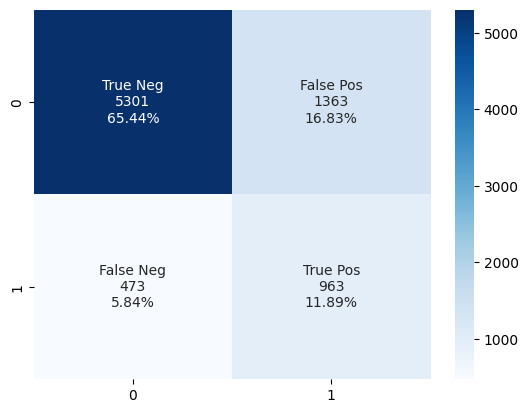

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

CONFUSION MATRIX - TEST PART of SVC with  {'pca__n_components': 6, 'svc__C': 10, 'svc__kernel': 'rbf'}


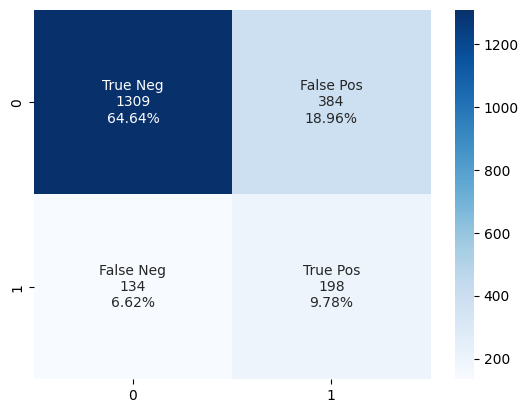

In [ ]:
print("CONFUSION MATRIX - TEST PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the SVC (with 6 Principal Components, C=10 and kernel="rbf") fitted model predicted correctly 1309 no HEART FAILURE diagnostic, whereas 384 of patients without the diagnotic of HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 198 were predictly correctly, where 134 were predicted incorrectly.

#### 4.2.6 - KNN Classifier

For KNN Classifier that requires a selection of number of neighbors (n_neighbors) and the algorithm, it was adopted to use GridSearchCV and RandomizedSearchCV to tune the models with the best inputs that they found.

In [ ]:
%%time
from sklearn.model_selection import GridSearchCV

knn = KNeighborsClassifier()
grid_param = { 'n_neighbors' : list(range(1,101,2)) , 
              'algorithm' : ['auto','ball_tree','kd_tree','brute'] }
              
cvGrid = GridSearchCV(knn,grid_param,cv = 10)
cvGrid.fit(df_tr_Xscaled, np.ravel(df_Y_tr))


print("The best parameters for the KNN Classifier are: ", cvGrid.best_params_)

#best parameter combination
print(cvGrid.best_params_)

#Score achieved with best parameter combination
print(cvGrid.best_score_)

#all combinations of hyperparameters
print(cvGrid.cv_results_['params'])

#average scores of cross-validation
print(cvGrid.cv_results_['mean_test_score'])

# Accuracy of apply training points of the generated model
y_pred_tr = cvGrid.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted KNN model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = cvGrid.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted KNN model to\
 predict TEST part: ',acc_test)


The best parameters for the KNN Classifier are:  {'algorithm': 'auto', 'n_neighbors': 39}
{'algorithm': 'auto', 'n_neighbors': 39}
0.76
[{'algorithm': 'auto', 'n_neighbors': 1}, {'algorithm': 'auto', 'n_neighbors': 3}, {'algorithm': 'auto', 'n_neighbors': 5}, {'algorithm': 'auto', 'n_neighbors': 7}, {'algorithm': 'auto', 'n_neighbors': 9}, {'algorithm': 'auto', 'n_neighbors': 11}, {'algorithm': 'auto', 'n_neighbors': 13}, {'algorithm': 'auto', 'n_neighbors': 15}, {'algorithm': 'auto', 'n_neighbors': 17}, {'algorithm': 'auto', 'n_neighbors': 19}, {'algorithm': 'auto', 'n_neighbors': 21}, {'algorithm': 'auto', 'n_neighbors': 23}, {'algorithm': 'auto', 'n_neighbors': 25}, {'algorithm': 'auto', 'n_neighbors': 27}, {'algorithm': 'auto', 'n_neighbors': 29}, {'algorithm': 'auto', 'n_neighbors': 31}, {'algorithm': 'auto', 'n_neighbors': 33}, {'algorithm': 'auto', 'n_neighbors': 35}, {'algorithm': 'auto', 'n_neighbors': 37}, {'algorithm': 'auto', 'n_neighbors': 39}, {'algorithm': 'auto', 'n_nei

In [ ]:
# Storing the accuracies
new_row = {'ML_Model': 'KNN Classifier (algorithm=auto n_neighbors=39)', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_HeartFailure.loc[len(acc_summary_HeartFailure)] = new_row

display(acc_summary_HeartFailure)

,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.767531,0.774321
1,QDA (threshold = 0.5),0.675802,0.678519
2,CLASSIFICATION TREE (Depth = 3),0.760370,0.760000
3,GAUSSIAN NB,0.713210,0.723457
4,SVC C=1 kernel=poly,0.800741,0.760494
5,SVC pca__n_components=6 C=10 kernel=rbf,0.773333,0.744198
6,KNN Classifier (algorithm=auto n_neighbors=39),0.769136,0.759012


GridSearchCV indicated the best n_neighbors = 39 and algorithm = "rbf" for KNN model. With those inputs, KNN model presented an accuracy in the TRAIN part of 76.9%, whereas this model could predict HEART FAILURE in the TEST part with 75.9% of accuracy.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model': 'KNN Classifier (algorithm=auto n_neighbors=39)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_HeartFailure.loc[len(trues_tr_HeartFailure)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model': 'KNN Classifier (algorithm=auto n_neighbors=39)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_HeartFailure.loc[len(trues_te_HeartFailure)] = new_row

display(trues_tr_HeartFailure)
display(trues_te_HeartFailure)

CONFUSION MATRIX - TRAIN PART of KNN model with  {'algorithm': 'auto', 'n_neighbors': 39}
       No   Yes
No   5335  1431
Yes   439   895
CONFUSION MATRIX - TEST PART of KNN model with  {'algorithm': 'auto', 'n_neighbors': 39}
       No  Yes
No   1327  372
Yes   116  210


,ML_Model,True_Negative,True_Positive
0,REAL - TRAIN PART,5774,2326
1,LOGISTIC REGRESSION,5237,980
2,QDA (threshold = 0.5),4192,1282
3,CLASSIFICATION TREE (Depth = 3),5070,1089
4,GAUSSIAN NB,4355,1422
5,SVC C=1 kernel=poly,5366,1120
6,SVC pca__n_components=6 C=10 kernel=rbf,5301,963
7,KNN Classifier (algorithm=auto n_neighbors=39),5335,895


,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582
1,LOGISTIC REGRESSION,1310,258
2,QDA (threshold = 0.5),1038,336
3,CLASSIFICATION TREE (Depth = 3),1260,279
4,GAUSSIAN NB,1103,362
5,SVC C=1 kernel=poly,1307,233
6,SVC pca__n_components=6 C=10 kernel=rbf,1309,198
7,KNN Classifier (algorithm=auto n_neighbors=39),1327,210


CONFUSION MATRIX - TRAIN PART of KNN model with  {'algorithm': 'auto', 'n_neighbors': 39}


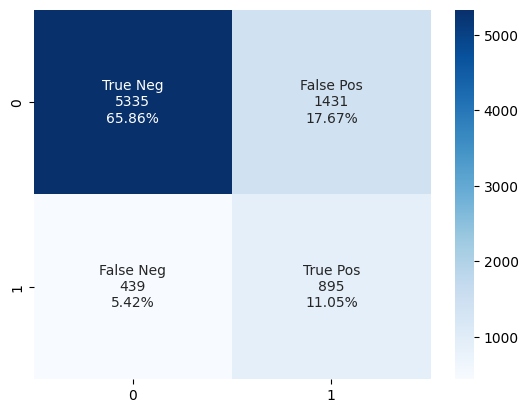

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)


CONFUSION MATRIX - TEST PART of KNN model with  {'algorithm': 'auto', 'n_neighbors': 39}


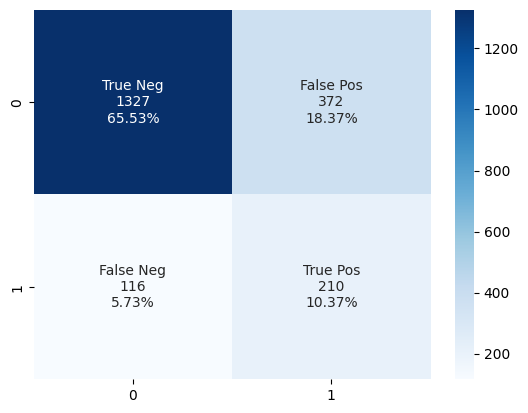

In [ ]:
print("CONFUSION MATRIX - TEST PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the KNN CLASSIFIER (with n_neighbors=39 and kernel="auto") fitted model predicted correctly 1327 no HEART FAILURE diagnostic, whereas 372 of patients without the diagnotic of HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 210 were predictly correctly, where 116 were predicted incorrectly.

In [ ]:
%%time
from sklearn.model_selection import RandomizedSearchCV

knn = KNeighborsClassifier()
grid_param = { 'n_neighbors' : list(range(1,101,2)) , 
              'algorithm' : ['auto','ball_tree','kd_tree','brute'] }
              
cvGrid = RandomizedSearchCV(knn,grid_param,cv = 10)
cvGrid.fit(df_tr_Xscaled, np.ravel(df_Y_tr))


print("The best parameters for the KNN Classifier are: ", cvGrid.best_params_)

#best parameter combination
print(cvGrid.best_params_)

#Score achieved with best parameter combination
print(cvGrid.best_score_)

#all combinations of hyperparameters
print(cvGrid.cv_results_['params'])

#average scores of cross-validation
print(cvGrid.cv_results_['mean_test_score'])

# Accuracy of apply training points of the generated model
y_pred_tr = cvGrid.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted KNN model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = cvGrid.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted KNN model to\
 predict TEST part: ',acc_test)



The best parameters for the KNN Classifier are:  {'n_neighbors': 41, 'algorithm': 'kd_tree'}
{'n_neighbors': 41, 'algorithm': 'kd_tree'}
0.7598765432098765
[{'n_neighbors': 77, 'algorithm': 'kd_tree'}, {'n_neighbors': 41, 'algorithm': 'kd_tree'}, {'n_neighbors': 97, 'algorithm': 'ball_tree'}, {'n_neighbors': 37, 'algorithm': 'kd_tree'}, {'n_neighbors': 95, 'algorithm': 'brute'}, {'n_neighbors': 51, 'algorithm': 'auto'}, {'n_neighbors': 85, 'algorithm': 'kd_tree'}, {'n_neighbors': 21, 'algorithm': 'auto'}, {'n_neighbors': 15, 'algorithm': 'ball_tree'}, {'n_neighbors': 25, 'algorithm': 'ball_tree'}]
[0.7582716  0.75987654 0.75580247 0.75975309 0.7562963  0.75864198
 0.7582716  0.75320988 0.74654321 0.75716049]
Classification Accuracy of the fitted KNN model to predict TRAIN part:  0.7671604938271605
Classification Accuracy of the fitted KNN model to predict TEST part:  0.7555555555555555
CPU times: user 48.4 s, sys: 83.6 ms, total: 48.5 s
Wall time: 46.4 s


In [ ]:
# Storing the accuracies
new_row = {'ML_Model': 'KNN Classifier (algorithm=kd_tree n_neighbors=41)', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_HeartFailure.loc[len(acc_summary_HeartFailure)] = new_row

display(acc_summary_HeartFailure)

,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.767531,0.774321
1,QDA (threshold = 0.5),0.675802,0.678519
2,CLASSIFICATION TREE (Depth = 3),0.760370,0.760000
3,GAUSSIAN NB,0.713210,0.723457
4,SVC C=1 kernel=poly,0.800741,0.760494
5,SVC pca__n_components=6 C=10 kernel=rbf,0.773333,0.744198
6,KNN Classifier (algorithm=auto n_neighbors=39),0.769136,0.759012
7,KNN Classifier (algorithm=kd_tree n_neighbors=41),0.767160,0.755556


RandomizedSearchCV indicated the best n_neighbors = 81 and algorithm = "auto" for KNN model. With those inputs, KNN model presented an accuracy in the TRAIN part of 76.2%, whereas this model could predict HEART FAILURE in the TEST part with 76.1% of accuracy.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model': 'KNN Classifier (algorithm=kd_tree n_neighbors=41)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_HeartFailure.loc[len(trues_tr_HeartFailure)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model': 'KNN Classifier (algorithm=kd_tree n_neighbors=41)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_HeartFailure.loc[len(trues_te_HeartFailure)] = new_row

display(trues_tr_HeartFailure)
display(trues_te_HeartFailure)

CONFUSION MATRIX - TRAIN PART of KNN model with  {'n_neighbors': 41, 'algorithm': 'kd_tree'}
       No   Yes
No   5340  1452
Yes   434   874
CONFUSION MATRIX - TEST PART of KNN model with  {'n_neighbors': 41, 'algorithm': 'kd_tree'}
       No  Yes
No   1324  376
Yes   119  206


,ML_Model,True_Negative,True_Positive
0,REAL - TRAIN PART,5774,2326
1,LOGISTIC REGRESSION,5237,980
2,QDA (threshold = 0.5),4192,1282
3,CLASSIFICATION TREE (Depth = 3),5070,1089
4,GAUSSIAN NB,4355,1422
5,SVC C=1 kernel=poly,5366,1120
6,SVC pca__n_components=6 C=10 kernel=rbf,5301,963
7,KNN Classifier (algorithm=auto n_neighbors=39),5335,895
8,KNN Classifier (algorithm=kd_tree n_neighbors=41),5340,874


,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582
1,LOGISTIC REGRESSION,1310,258
2,QDA (threshold = 0.5),1038,336
3,CLASSIFICATION TREE (Depth = 3),1260,279
4,GAUSSIAN NB,1103,362
5,SVC C=1 kernel=poly,1307,233
6,SVC pca__n_components=6 C=10 kernel=rbf,1309,198
7,KNN Classifier (algorithm=auto n_neighbors=39),1327,210
8,KNN Classifier (algorithm=kd_tree n_neighbors=41),1324,206


CONFUSION MATRIX - TRAIN PART of KNN model with  {'n_neighbors': 41, 'algorithm': 'kd_tree'}


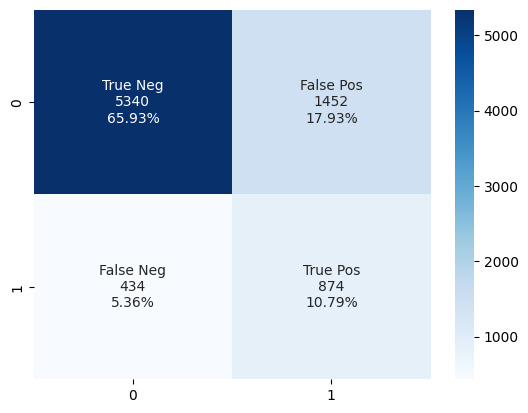

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

CONFUSION MATRIX - TEST PART of KNN model with  {'n_neighbors': 41, 'algorithm': 'kd_tree'}


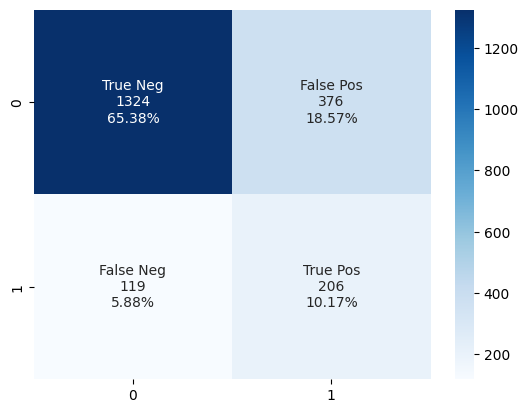

In [ ]:
print("CONFUSION MATRIX - TEST PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the KNN CLASSIFIER (with n_neighbors=41 and kernekd_tree") fitted model predicted correctly 1324 no HEART FAILURE diagnostic, whereas 376 of patients without the diagnotic of HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 206 were predictly correctly, where 119 were predicted incorrectly.

#### 4.2.7 - RANDOM FOREST CLASSIFIER

As one of the parameters of the random forest is the number of estimators (trees), it is necessary to do some sensitivity on this to determine the values of this in train part that takes the lowest Classification Rate error (OOB = out-of-bag error for model validation). For this, it was used BOOTSTRAP 50 times (just to avoid takes a long time) for each n_estimators.

(8100, 39)
(8100,)
Running the estimator 50


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.24108039180186236
Running the estimator 100


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.24080679223518087
Running the estimator 150


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.23963891648668922
Running the estimator 200


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.2396048365509157
Running the estimator 250


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.23724792210655476
Running the estimator 300


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.23721236524449152
Running the estimator 350


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.2366559608035942
Running the estimator 400


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.23825326044851447
Running the estimator 450


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.23806536585122262
Running the estimator 500


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.23799908224646482
Running the estimator 550


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.23670210277460646
CPU times: user 37min 15s, sys: 5.11 s, total: 37min 20s
Wall time: 37min 42s


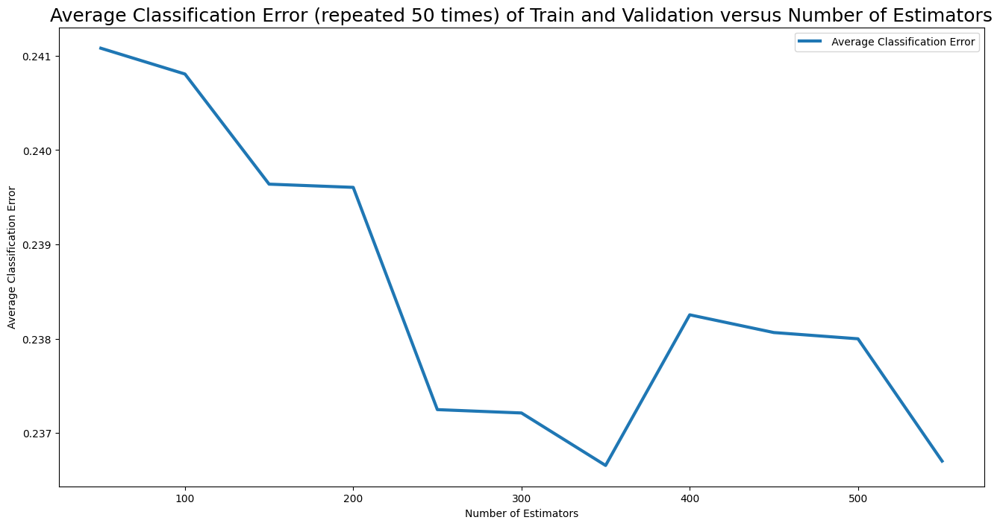

In [ ]:
%%time
from tqdm.notebook import tqdm
from sklearn .ensemble import RandomForestClassifier

# Number of estimators in Random Forest
n_estimator = np.arange(50, 600, step=50)

# Number of repetions in Bootstrap
n_repeats = 50

# Index
all_I = np.array(df_tr_Xscaled.index)
#print(all_I)


# Creating vector to storage oob (out-of-bag error) values
#oob = np.zeros((n_tr, n_repeats))
oobScores = []

#Reshaping 
X_tr_shape = df_tr_Xscaled.values[:, :-1]
y_tr_shape = df_Y_tr.values[:, -1]

print(X_tr_shape.shape)
print(y_tr_shape.shape)

# Taking the size of train part
n_tr = len(X_tr_shape)

for n in n_estimator:
  print("Running the estimator", n)

  # Vector to storage the oob value for each repetition
  oob = np.zeros((n_tr, n_repeats))

  # Bootstrap
  for j in tqdm(range(n_repeats)):
    I = np.random.choice(n_tr, size=n_tr, replace=True) # boostrap replicate
    #print(I)
    II = [i for i in np.arange(n_tr) if i not in I] # not in boostrap replicate (use for testing)
    #print(II)

    # Random Forest with the current number of estimators
    model = RandomForestClassifier(n_estimators = n)
    model.fit(X_tr_shape[I], y_tr_shape[I])
    y_pred= model.predict(X_tr_shape[II])

    # Calculating Accuracy
    oob[II, j] = accuracy_score(y_tr_shape[II], y_pred)

  # Storing Accuracy Valuesin the current BOOTSTRAP
  y_oob = oob.sum(axis=1)/np.count_nonzero(oob, axis=1)
  #print(y_oob)

  # Calculating the Average OOB in the current BOOTSTRAP
  y_oob=1-np.mean(y_oob)
  
  print(i, y_oob)

  # Storing the Average OOB for the current n_estimator
  oobScores.append(y_oob)


# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(n_estimator, oobScores, label=" Average Classification Error", lw=3)
plt.ylabel("Average Classification Error")
plt.xlabel("Number of Estimators")
plt.title("Average Classification Error (repeated 50 times) of Train and Validation versus Number of Estimators", fontsize=18)
plt.legend()
#major_ticks = np.arange(1, maxTreeDepth+1, 1)
#plt.xticks(major_ticks)




Based on the results on the sensitivity of n_estimators with BOOTSTRAP in the train part, n_estimators = 350 that indicated the lowest classification error (0.2367), and it was adopted this value to fit the model below.

In [ ]:
%%time
from sklearn .ensemble import RandomForestClassifier

# Accuracy of Train based on the results of previous sensitivity (n = 350)
acc_train = 1 - 0.2366559608035942

# Random Forest Classifier - Creating the model with the minimum error obatined with bootstrap in train part 
model = RandomForestClassifier(n_estimators = 350)
model.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

# Accuracy of apply training points of the generated model
y_pred_tr = model.predict(df_tr_Xscaled)
#acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print(acc_train)
print('Classification Accuracy of the fitted RANDOM FOREST CLASSIFIER (n = 350) model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = model.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted RANDOM FOREST CLASSIFIER (n = 350) model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'RANDOM FOREST CLASSIFIER (n = 350)', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_HeartFailure.loc[len(acc_summary_HeartFailure)] = new_row

display(acc_summary_HeartFailure)

0.7633440391964058
Classification Accuracy of the fitted RANDOM FOREST CLASSIFIER (n = 350) model to predict TRAIN part:  0.7633440391964058
Classification Accuracy of the fitted RANDOM FOREST CLASSIFIER (n = 350) model to predict TEST part:  0.7767901234567901


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.767531,0.774321
1,QDA (threshold = 0.5),0.675802,0.678519
2,CLASSIFICATION TREE (Depth = 3),0.760370,0.760000
3,GAUSSIAN NB,0.713210,0.723457
4,SVC C=1 kernel=poly,0.800741,0.760494
5,SVC pca__n_components=6 C=10 kernel=rbf,0.773333,0.744198
6,KNN Classifier (algorithm=auto n_neighbors=39),0.769136,0.759012
7,KNN Classifier (algorithm=kd_tree n_neighbors=41),0.767160,0.755556
8,RANDOM FOREST CLASSIFIER (n = 300),0.763000,0.771358
9,GRADIENT BOOSTING CLASSIFIER (n = 110),0.792963,0.776296


CPU times: user 6.85 s, sys: 17.5 ms, total: 6.87 s
Wall time: 7.16 s


In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of RANDOM FOREST CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model': 'RANDOM FOREST CLASSIFIER (n = 350)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_HeartFailure.loc[len(trues_tr_HeartFailure)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of RANDOM FOREST CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model': 'RANDOM FOREST CLASSIFIER (n = 350)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_HeartFailure.loc[len(trues_te_HeartFailure)] = new_row

display(trues_tr_HeartFailure)
display(trues_te_HeartFailure)

CONFUSION MATRIX - TRAIN PART of RANDOM FOREST CLASSIFIER model
       No   Yes
No   5774     0
Yes     0  2326
CONFUSION MATRIX - TEST PART of RANDOM FOREST CLASSIFIER model
       No  Yes
No   1302  311
Yes   141  271


,ML_Model,True_Negative,True_Positive
0,REAL - TRAIN PART,5774,2326
1,LOGISTIC REGRESSION,5237,980
2,QDA (threshold = 0.5),4192,1282
3,CLASSIFICATION TREE (Depth = 3),5070,1089
4,GAUSSIAN NB,4355,1422
5,SVC C=1 kernel=poly,5366,1120
6,SVC pca__n_components=6 C=10 kernel=rbf,5301,963
7,KNN Classifier (algorithm=auto n_neighbors=39),5335,895
8,KNN Classifier (algorithm=kd_tree n_neighbors=41),5340,874
9,RANDOM FOREST CLASSIFIER (n = 300),5774,2326


,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582
1,LOGISTIC REGRESSION,1310,258
2,QDA (threshold = 0.5),1038,336
3,CLASSIFICATION TREE (Depth = 3),1260,279
4,GAUSSIAN NB,1103,362
5,SVC C=1 kernel=poly,1307,233
6,SVC pca__n_components=6 C=10 kernel=rbf,1309,198
7,KNN Classifier (algorithm=auto n_neighbors=39),1327,210
8,KNN Classifier (algorithm=kd_tree n_neighbors=41),1324,206
9,RANDOM FOREST CLASSIFIER (n = 300),1301,261


CONFUSION MATRIX - TEST PART of RANDOM CLASSIFIER model


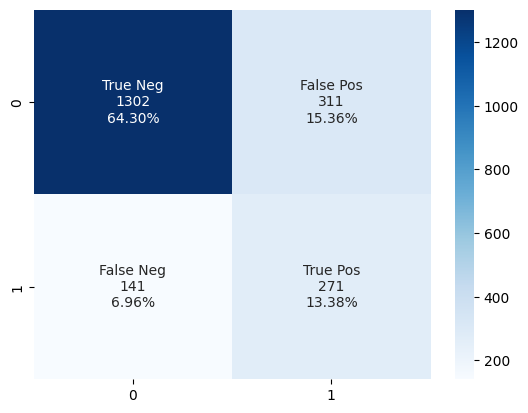

In [ ]:
#display(trues_tr_HeartFailure)
#display(trues_te_HeartFailure)

print("CONFUSION MATRIX - TEST PART of RANDOM CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the RANDOM FOREST CLASSIFIER (with n_estimator=350) fitted model predicted correctly 1302 no HEART FAILURE diagnostic, whereas 311 of patients without the diagnotic of HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 271 were predictly correctly, where 141 were predicted incorrectly.

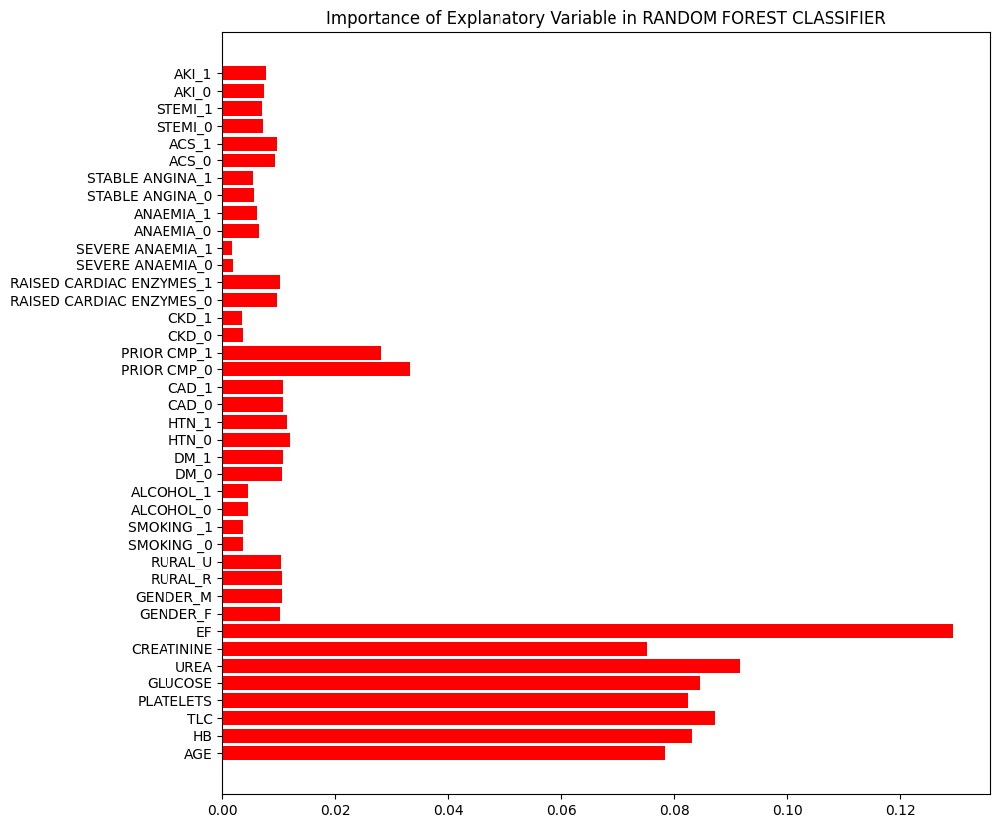

In [ ]:
# Plotting the variables based on the importance
plt.figure(figsize=(10,10))
plt.barh(np.arange(len(x_variables_withDummies)), model.feature_importances_, color = "red")
plt.yticks(ticks=np.arange(len(x_variables_withDummies)), labels=x_variables_withDummies)
plt.title("Importance of Explanatory Variable in RANDOM FOREST CLASSIFIER")
plt.show()

For RANDOM FOREST CLASSIFIER, all the variables have some importance, EF continues in the top, but this is not extremelly significant as Classification Tree indicated.

#### 4.2.8 - GRADIENT BOOSTING CLASSIFIER

For GRADIENT BOOSTING CLASSIFIER that requires the number of estimators as input, it was done initially a sensitivity on this.

10 0.7493827160493827 0.7397530864197531
20 0.7730864197530865 0.7659259259259259
30 0.7777777777777778 0.7703703703703704
40 0.7792592592592592 0.7683950617283951
50 0.7808641975308642 0.7708641975308642
60 0.7824691358024691 0.7708641975308642
70 0.7855555555555556 0.7713580246913581
80 0.7875308641975308 0.7733333333333333
90 0.7902469135802469 0.7748148148148148
100 0.7917283950617284 0.7753086419753087
110 0.792962962962963 0.7762962962962963
120 0.7955555555555556 0.774320987654321
130 0.7965432098765433 0.7728395061728395
140 0.7991358024691358 0.7733333333333333
150 0.7996296296296296 0.7728395061728395
160 0.8003703703703704 0.7728395061728395
170 0.8017283950617284 0.7713580246913581
180 0.8030864197530864 0.7718518518518519
190 0.8039506172839506 0.7718518518518519
200 0.8058024691358024 0.7713580246913581
210 0.8067901234567901 0.7728395061728395
220 0.8080246913580247 0.7723456790123456
230 0.8090123456790124 0.7703703703703704
240 0.8097530864197531 0.7683950617283951
250

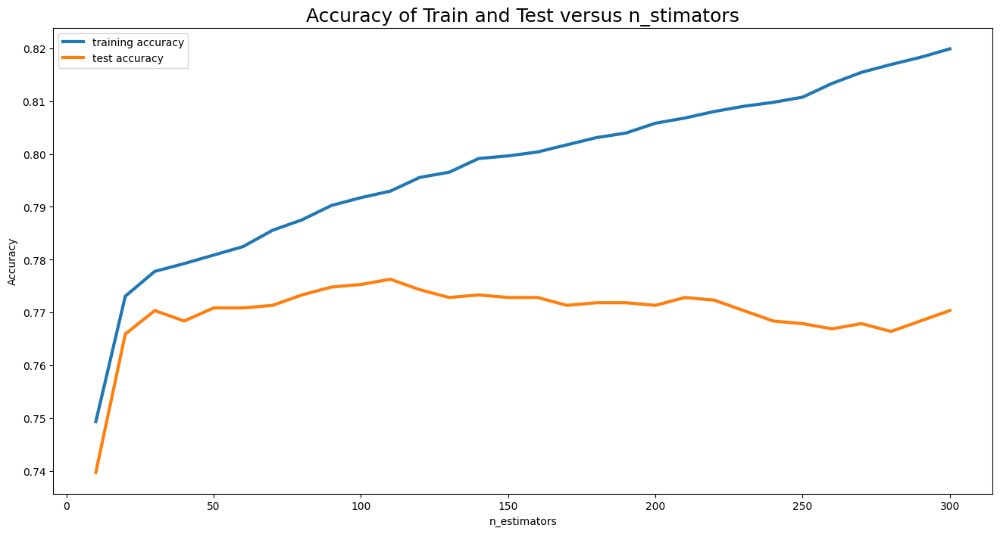

In [ ]:
%%time
from sklearn .ensemble  import GradientBoostingClassifier

nEstimator = np.arange(10, 310, step=10)
#print(nDepths)
len(nDepths)
 
# Arrays to storage accuracy 
acc_train_by_n = []
acc_te_by_n = []

for i in nEstimator :
  model = GradientBoostingClassifier(n_estimators=i)
  model.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

  # Checking accuracy of Train
  y_pred_tr = model.predict(df_tr_Xscaled)
  acc_train = accuracy_score(df_Y_tr, y_pred_tr)

  acc_train_by_n.append(acc_train)

  # Accuracy of apply all test point
  y_pred_te = model.predict(df_te_Xscaled)
  acc_test = accuracy_score(df_Y_te, y_pred_te)

  acc_te_by_n.append(acc_test)

  # Just to print the summary of each iteraction (number of estimators)
  print(i, acc_train, acc_test)

# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(nEstimator, acc_train_by_n, label="training accuracy", lw=3)
plt.plot(nEstimator, acc_te_by_n, label="test accuracy", lw=3)
plt.ylabel("Accuracy")
plt.xlabel("n_estimators")
plt.title("Accuracy of Train and Test versus n_estimators", fontsize=18)
plt.legend()
#major_ticks = np.arange(1, maxTreeDepth+1, 1)
#plt.xticks(major_ticks)

Based on the plot above, the n_estimators = 110 indicated the highest accuracy in the test part for GRADIENT BOOSTING CLASSIFIER and this number was used for fitting the model below.

In [ ]:
from sklearn .ensemble  import GradientBoostingClassifier

# GRADIENT BOOSTING Classifier - Creating the model
model = GradientBoostingClassifier(n_estimators = 110)
model.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

# Accuracy of apply training points of the generated model
y_pred_tr = model.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted GRADIENT BOOSTING CLASSIFIER model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = model.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted GRADIENT BOOSTING CLASSIFIER model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'GRADIENT BOOSTING CLASSIFIER (n = 110)', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_HeartFailure.loc[len(acc_summary_HeartFailure)] = new_row

display(acc_summary_HeartFailure)

Classification Accuracy of the fitted GRADIENT BOOSTING CLASSIFIER model to predict TRAIN part:  0.792962962962963
Classification Accuracy of the fitted GRADIENT BOOSTING CLASSIFIER model to predict TEST part:  0.7762962962962963


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.767531,0.774321
1,QDA (threshold = 0.5),0.675802,0.678519
2,CLASSIFICATION TREE (Depth = 3),0.760370,0.760000
3,GAUSSIAN NB,0.713210,0.723457
4,SVC C=1 kernel=poly,0.800741,0.760494
5,SVC pca__n_components=6 C=10 kernel=rbf,0.773333,0.744198
6,KNN Classifier (algorithm=auto n_neighbors=39),0.769136,0.759012
7,KNN Classifier (algorithm=kd_tree n_neighbors=41),0.767160,0.755556
8,RANDOM FOREST CLASSIFIER (n = 300),0.763000,0.771358
9,GRADIENT BOOSTING CLASSIFIER (n = 110),0.792963,0.776296


In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of GRADIENT BOOSTING CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model': 'GRADIENT BOOSTING CLASSIFIER (n = 110)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_HeartFailure.loc[len(trues_tr_HeartFailure)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of GRADIENT BOOSTING CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model': 'GRADIENT BOOSTING CLASSIFIER (n = 110)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_HeartFailure.loc[len(trues_te_HeartFailure)] = new_row

display(trues_tr_HeartFailure)
display(trues_te_HeartFailure)

CONFUSION MATRIX - TRAIN PART of GRADIENT BOOSTING CLASSIFIER model
       No   Yes
No   5234  1137
Yes   540  1189
CONFUSION MATRIX - TEST PART of GRADIENT BOOSTING CLASSIFIER model
       No  Yes
No   1290  300
Yes   153  282


,ML_Model,True_Negative,True_Positive
0,REAL - TRAIN PART,5774,2326
1,LOGISTIC REGRESSION,5237,980
2,QDA (threshold = 0.5),4192,1282
3,CLASSIFICATION TREE (Depth = 3),5070,1089
4,GAUSSIAN NB,4355,1422
5,SVC C=1 kernel=poly,5366,1120
6,SVC pca__n_components=6 C=10 kernel=rbf,5301,963
7,KNN Classifier (algorithm=auto n_neighbors=39),5335,895
8,KNN Classifier (algorithm=kd_tree n_neighbors=41),5340,874
9,RANDOM FOREST CLASSIFIER (n = 300),5774,2326


,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582
1,LOGISTIC REGRESSION,1310,258
2,QDA (threshold = 0.5),1038,336
3,CLASSIFICATION TREE (Depth = 3),1260,279
4,GAUSSIAN NB,1103,362
5,SVC C=1 kernel=poly,1307,233
6,SVC pca__n_components=6 C=10 kernel=rbf,1309,198
7,KNN Classifier (algorithm=auto n_neighbors=39),1327,210
8,KNN Classifier (algorithm=kd_tree n_neighbors=41),1324,206
9,RANDOM FOREST CLASSIFIER (n = 300),1301,261


CONFUSION MATRIX - TEST PART of GRADIENT BOOSTING model


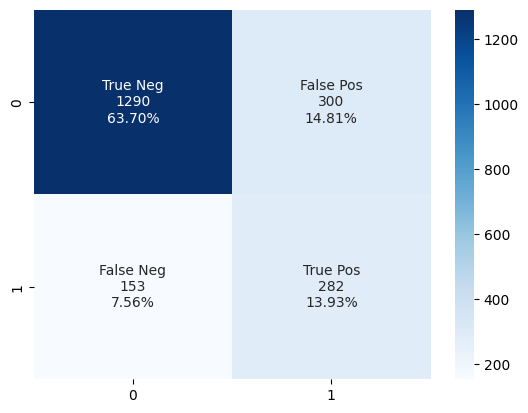

In [ ]:
print("CONFUSION MATRIX - TEST PART of GRADIENT BOOSTING model")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the GRADIENT BOOSTING CLASSIFIER (with n_estimator=110) fitted model predicted correctly 1290 no HEART FAILURE diagnostic, whereas 300 of patients without the diagnotic of HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 282 were predictly correctly, where 153 were predicted incorrectly.

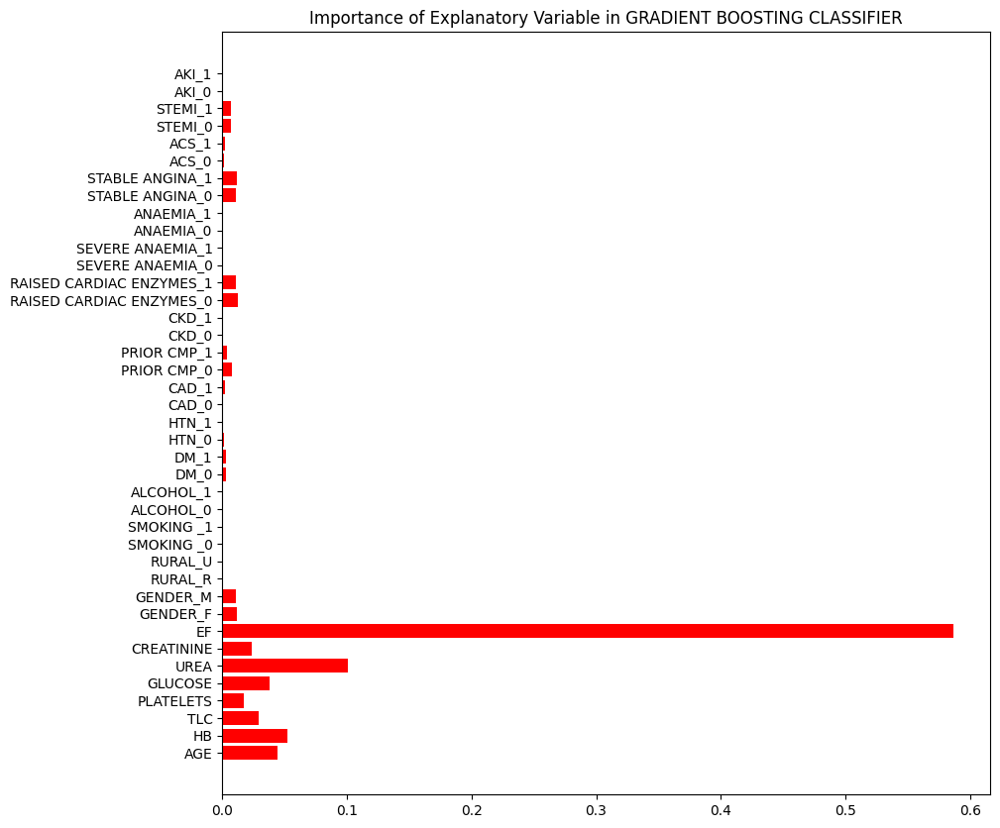

In [ ]:
# Plotting the variables based on the importance
plt.figure(figsize=(10,10))
plt.barh(np.arange(len(x_variables_withDummies)), model.feature_importances_, color = "red")
plt.yticks(ticks=np.arange(len(x_variables_withDummies)), labels=x_variables_withDummies)
plt.title("Importance of Explanatory Variable in GRADIENT BOOSTING CLASSIFIER")
plt.show()

For GRADIENT BOOSTING CLASSIFIER, EF is the most important explanatory variables. However, less variables are significant compared with RANDOM FOREST, but more than CLASSIFICATION TREE.

#### 4.2.9 - BAGGING CLASSIFIER

Similar what was done RANDOM FOREST CLASSIFIER, it was done initially in BAGGING CLASSIFIER a sensitivity in the number of estimators with BOOTSTRAP in train part.

(8100, 39)
(8100,)
Running the estimator 10


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.26241721560592723
Running the estimator 30


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.25138897798222515
Running the estimator 50


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.2470552509578029
Running the estimator 70


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.2487058046759809
Running the estimator 90


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.24636575095318158
Running the estimator 110


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.24672106933737337
Running the estimator 130


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.24660135699746044
Running the estimator 150


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.24569791382161799
Running the estimator 170


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.24642019575332685
Running the estimator 190


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.24501834576180492
CPU times: user 47min 10s, sys: 4.13 s, total: 47min 14s
Wall time: 47min 29s


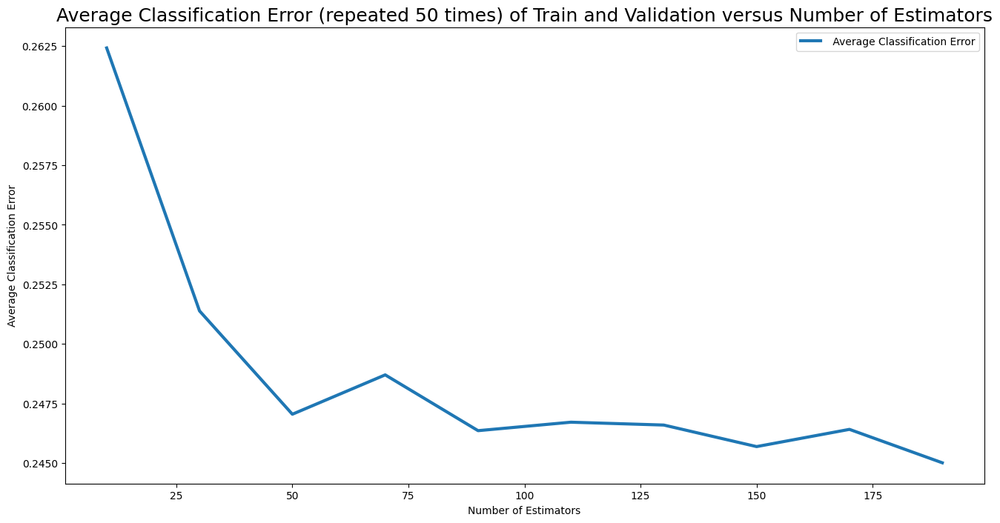

In [ ]:
%%time
from tqdm.notebook import tqdm
from sklearn .ensemble  import BaggingClassifier

# Number of estimators in Random Forest
n_estimator = np.arange(10, 210, step=20)

# Number of repetions in Bootstrap
n_repeats = 50

# Index
all_I = np.array(df_tr_Xscaled.index)
#print(all_I)


# Creating vector to storage oob (out-of-bag error) values
#oob = np.zeros((n_tr, n_repeats))
oobScores = []

#Reshaping 
X_tr_shape = df_tr_Xscaled.values[:, :-1]
y_tr_shape = df_Y_tr.values[:, -1]

print(X_tr_shape.shape)
print(y_tr_shape.shape)

# Taking the size of train part
n_tr = len(X_tr_shape)

for n in n_estimator:
  print("Running the estimator", n)

  # Vector to storage the oob value for each repetition
  oob = np.zeros((n_tr, n_repeats))

  # Bootstrap
  for j in tqdm(range(n_repeats)):
    I = np.random.choice(n_tr, size=n_tr, replace=True) # boostrap replicate
    #print(I)
    II = [i for i in np.arange(n_tr) if i not in I] # not in boostrap replicate (use for testing)
    #print(II)

    # Random Forest with the current number of estimators
    model = BaggingClassifier(n_estimators = n)
    model.fit(X_tr_shape[I], y_tr_shape[I])
    y_pred= model.predict(X_tr_shape[II])

    # Calculating Accuracy
    oob[II, j] = accuracy_score(y_tr_shape[II], y_pred)

  # Storing Accuracy Valuesin the current BOOTSTRAP
  y_oob = oob.sum(axis=1)/np.count_nonzero(oob, axis=1)
  #print(y_oob)

  # Calculating the Average OOB in the current BOOTSTRAP
  y_oob=1-np.mean(y_oob)
  
  print(i, y_oob)

  # Storing the Average OOB for the current n_estimator
  oobScores.append(y_oob)


# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(n_estimator, oobScores, label=" Average Classification Error", lw=3)
plt.ylabel("Average Classification Error")
plt.xlabel("Number of Estimators")
plt.title("Average Classification Error (repeated 50 times) of Train and Validation versus Number of Estimators", fontsize=18)
plt.legend()
#major_ticks = np.arange(1, maxTreeDepth+1, 1)
#plt.xticks(major_ticks)


Based on the plot above, BAGGING CLASSIFIER with n_estimator = 190 that presented the lowest Classification Error. For this reason, it was taken this value for fitting the final BAGGING CLASSIFIER model.

In [ ]:
from sklearn .ensemble  import BaggingClassifier

# Accuracy of Train based on the results of previous sensitivity (n = 190)
acc_train = 1 - 0.24501834576180492

# BAGGING Classifier - Creating the model
model = BaggingClassifier(n_estimators = 190)
model.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

# Accuracy of apply training points of the generated model
y_pred_tr = model.predict(df_tr_Xscaled)
#acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted BAGGING CLASSIFIER model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = model.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted BAGGING CLASSIFIER model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'BAGGING CLASSIFIER (n = 190)', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_HeartFailure.loc[len(acc_summary_HeartFailure)] = new_row

display(acc_summary_HeartFailure)

Classification Accuracy of the fitted BAGGING CLASSIFIER model to predict TRAIN part:  0.7549816542381951
Classification Accuracy of the fitted BAGGING CLASSIFIER model to predict TEST part:  0.762962962962963


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.767531,0.774321
1,QDA (threshold = 0.5),0.675802,0.678519
2,CLASSIFICATION TREE (Depth = 3),0.760370,0.760000
3,GAUSSIAN NB,0.713210,0.723457
4,SVC C=1 kernel=poly,0.800741,0.760494
5,SVC pca__n_components=6 C=10 kernel=rbf,0.773333,0.744198
6,KNN Classifier (algorithm=auto n_neighbors=39),0.769136,0.759012
7,KNN Classifier (algorithm=kd_tree n_neighbors=41),0.767160,0.755556
8,RANDOM FOREST CLASSIFIER (n = 300),0.763000,0.771358
9,GRADIENT BOOSTING CLASSIFIER (n = 110),0.792963,0.776296


In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of BAGGING CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model': 'BAGGING CLASSIFIER (n = 190)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_HeartFailure.loc[len(trues_tr_HeartFailure)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of BAGGING CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model': 'BAGGING CLASSIFIER (n = 190)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_HeartFailure.loc[len(trues_te_HeartFailure)] = new_row

display(trues_tr_HeartFailure)
display(trues_te_HeartFailure)

CONFUSION MATRIX - TRAIN PART of BAGGING CLASSIFIER model
       No   Yes
No   5774     0
Yes     0  2326
CONFUSION MATRIX - TEST PART of BAGGING CLASSIFIER model
       No  Yes
No   1274  311
Yes   169  271


,ML_Model,True_Negative,True_Positive
0,REAL - TRAIN PART,5774,2326
1,LOGISTIC REGRESSION,5237,980
2,QDA (threshold = 0.5),4192,1282
3,CLASSIFICATION TREE (Depth = 3),5070,1089
4,GAUSSIAN NB,4355,1422
5,SVC C=1 kernel=poly,5366,1120
6,SVC pca__n_components=6 C=10 kernel=rbf,5301,963
7,KNN Classifier (algorithm=auto n_neighbors=39),5335,895
8,KNN Classifier (algorithm=kd_tree n_neighbors=41),5340,874
9,RANDOM FOREST CLASSIFIER (n = 300),5774,2326


,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582
1,LOGISTIC REGRESSION,1310,258
2,QDA (threshold = 0.5),1038,336
3,CLASSIFICATION TREE (Depth = 3),1260,279
4,GAUSSIAN NB,1103,362
5,SVC C=1 kernel=poly,1307,233
6,SVC pca__n_components=6 C=10 kernel=rbf,1309,198
7,KNN Classifier (algorithm=auto n_neighbors=39),1327,210
8,KNN Classifier (algorithm=kd_tree n_neighbors=41),1324,206
9,RANDOM FOREST CLASSIFIER (n = 300),1301,261


CONFUSION MATRIX - TEST PART of BAGGING model


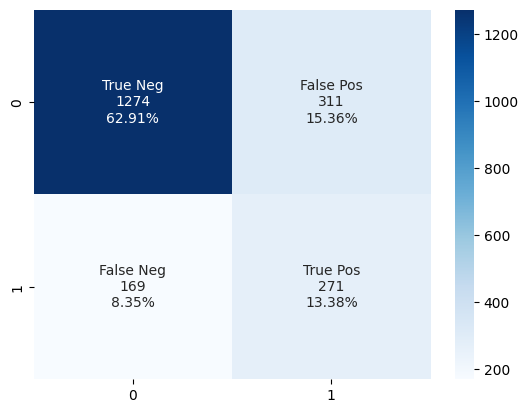

In [ ]:
print("CONFUSION MATRIX - TEST PART of BAGGING model")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the BAGGING CLASSIFIER (with n_estimator=190) fitted model predicted correctly 1274 no HEART FAILURE diagnostic, whereas 311 of patients without the diagnotic of HEART FAILURE were wrong. In terms of predicting patients with real HEART FAILURE diagnostic, 271 were predictly correctly, where 169 were predicted incorrectly.

### 4.3 - SUMMARY OF ML MODEL FOR PREDICTING HEART FAILURE

This sections shows the summary of all the fitted model done for HEART FAILURE response variable. 

,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.767531,0.774321
1,QDA (threshold = 0.5),0.675802,0.678519
2,CLASSIFICATION TREE (Depth = 3),0.760370,0.760000
3,GAUSSIAN NB,0.713210,0.723457
4,SVC C=1 kernel=poly,0.800741,0.760494
5,SVC pca__n_components=6 C=10 kernel=rbf,0.773333,0.744198
6,KNN Classifier (algorithm=auto n_neighbors=39),0.769136,0.759012
7,KNN Classifier (algorithm=kd_tree n_neighbors=41),0.767160,0.755556
8,RANDOM FOREST CLASSIFIER (n = 300),0.763000,0.771358
9,GRADIENT BOOSTING CLASSIFIER (n = 110),0.792963,0.776296


(0.6, 0.9)

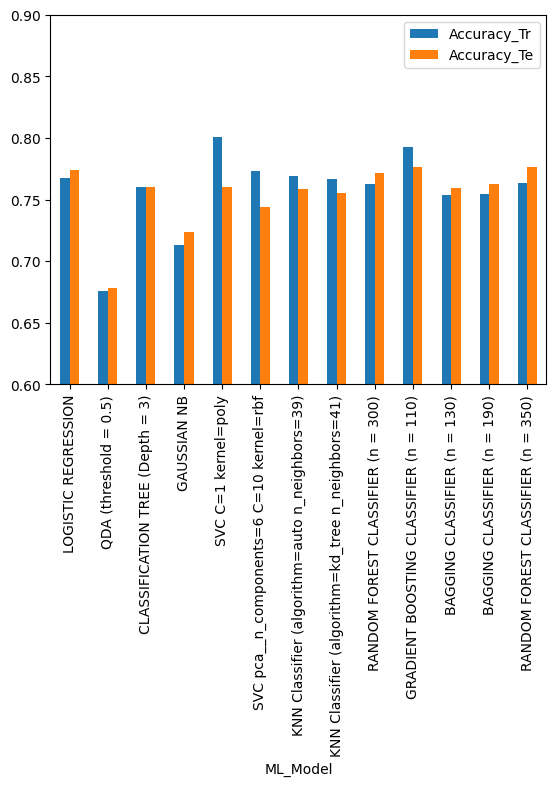

In [ ]:
# Plotting the Accuracy of Train and Test ML model
display(acc_summary_HeartFailure)


ax = acc_summary_HeartFailure.plot.bar(rot = 90,
                                       x="ML_Model")
ax.set_ylim([0.6,0.9])
#ax.grid(True)


Based on the bar plot above, it is possible to verify that SVC (C=1 and Kernel = Poly) and GRADIENT BOOSTING CLASSIFIER (n_estimator = 110) indicated the best performance one the TRAIN part, but for the TEST part, the RANDOM FOREST with n_estimator = 350 (77.7% test accuracy), GRADIENT BOOSTING CLASSIFIER with n_estimator = 110 (77.6% test accuracy) and LOGISTIC REGRESSION (77.4% test accuracy) are the top 3 models.

In addition, QDA (threshold = 0.5) and GAUSSIAN NAIVE BAYES that presented the worst overall performance (67.8 and 72.3% test accuracy, respectively). However, these were the models which predicted the most correct True_Positives (real HEAT FAILURE) in the test part as it is possible to see in the table and plot below.

It is interesting to verify that the SVC model with 6 Principal Components (dimension reduction) indicated the test accuracy of 74.4% when compared with SVC with all the explanatory variables this accuracy was not significantly different (SVC with all explanatory variables presented 76% test accuracy).

,ML_Model,True_Negative,True_Positive
0,REAL - TEST PART,1443,582
1,LOGISTIC REGRESSION,1310,258
2,QDA (threshold = 0.5),1038,336
3,CLASSIFICATION TREE (Depth = 3),1260,279
4,GAUSSIAN NB,1103,362
5,SVC C=1 kernel=poly,1307,233
6,SVC pca__n_components=6 C=10 kernel=rbf,1309,198
7,KNN Classifier (algorithm=auto n_neighbors=39),1327,210
8,KNN Classifier (algorithm=kd_tree n_neighbors=41),1324,206
9,RANDOM FOREST CLASSIFIER (n = 300),1301,261


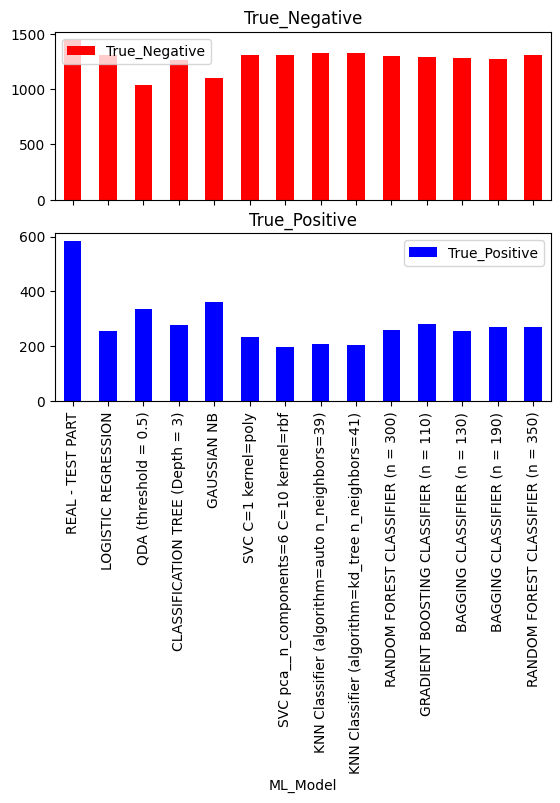

In [ ]:
# Plotting True Negatives and Positives obatined in TEST Part for each ML model

# Plotting True Negatives and Positives obatined in Test Part for each ML model
display(trues_te_HeartFailure)



axes = trues_te_HeartFailure.plot.bar(
    rot = 90, subplots=True, 
    x="ML_Model",
    color={"True_Negative": "red","True_Positive": "blue",}
)
axes[1].legend()




The summary table of everything done with HEART FAILURE is presented below.

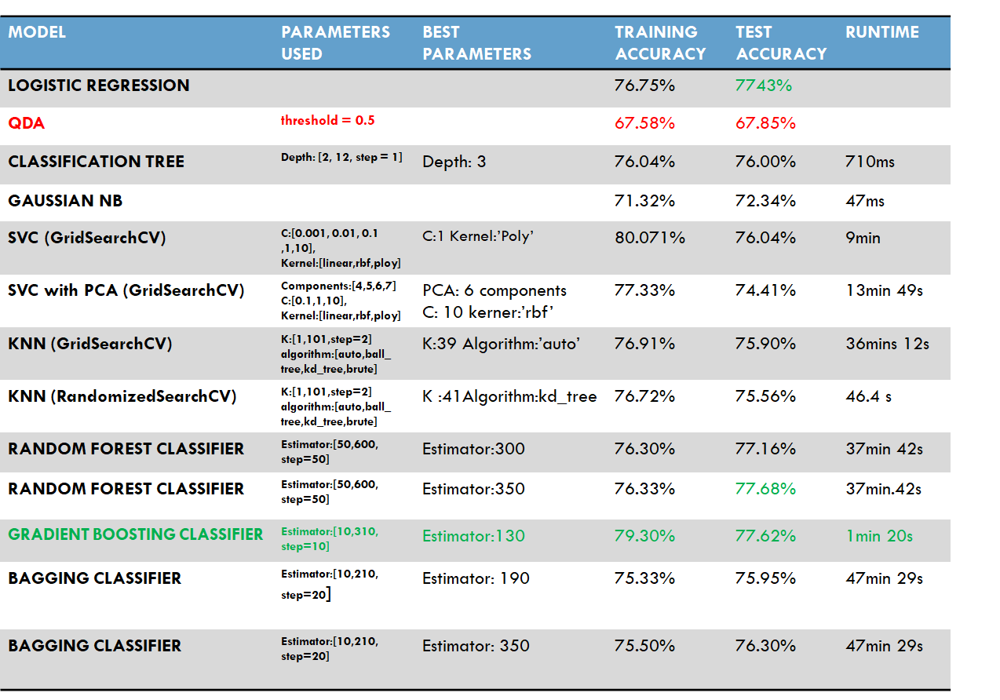

In [ ]:
Image('Summary of HEART Models.png')

## 5 - Acute Kidney Injury [AKI] (Qualitative Response) Analysis

### correlation matrix with pyspark

In [ ]:
# Run this cell if you are running PySpark on Colab

!apt-get install openjdk-8-jdk-headless -qq > /dev/null
!wget -q http://archive.apache.org/dist/spark/spark-3.1.1/spark-3.1.1-bin-hadoop3.2.tgz
!tar xf spark-3.1.1-bin-hadoop3.2.tgz
!pip install -q findspark

In [ ]:
# Run this cell if you are running PySpark on Colab
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.1.1-bin-hadoop3.2"

In [ ]:
import findspark
findspark.init()
from pyspark import SparkConf
from pyspark.context import SparkContext
from pyspark.sql import SparkSession
spark = SparkSession.builder.master("local[*]").config('spark.ui.port', '4050').getOrCreate()
spark

In [ ]:
import os
import seaborn as sns
from pyspark import SparkConf, SparkContext
from pyspark.sql import SparkSession, SQLContext
from pyspark.sql.types import *
import pyspark.sql.functions as F
from pyspark.sql.functions import udf, col

from pyspark.ml.regression import LinearRegression
from pyspark.mllib.evaluation import RegressionMetrics

from pyspark.ml.tuning import ParamGridBuilder, CrossValidator, CrossValidatorModel
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.evaluation import RegressionEvaluator

In [ ]:
dataClean.head()

,AGE,GENDER,RURAL,TYPE OF ADMISSION-EMERGENCY/OPD,DURATION OF STAY,OUTCOME,SMOKING,ALCOHOL,DM,HTN,...,CREATININE,RAISED CARDIAC ENZYMES,EF,SEVERE ANAEMIA,ANAEMIA,STABLE ANGINA,ACS,STEMI,HEART FAILURE,AKI
0,81,M,R,E,3,DISCHARGE,0,0,1,0,...,0.90,1,35.0,0,1,0,1,0,1,0
1,65,M,R,E,5,DISCHARGE,0,1,0,1,...,0.90,0,42.0,0,0,0,0,0,0,0
3,67,F,U,E,8,DISCHARGE,0,0,0,1,...,0.60,0,42.0,0,0,0,0,0,0,0
4,60,F,U,E,23,DISCHARGE,0,0,0,1,...,1.25,0,16.0,0,0,0,0,0,0,0
5,44,M,U,E,10,DISCHARGE,0,0,1,1,...,0.90,0,25.0,0,0,0,1,0,1,0


In [ ]:
dfh=dataClean.copy()
dfh.columns = dfh.columns.str.strip() # at both ends
dfh = dfh.drop(columns=[#'GENDER',
                        'RURAL',
               "TYPE OF ADMISSION-EMERGENCY/OPD",
               'SMOKING','ALCOHOL','DM','HTN','CAD','PRIOR CMP','CKD',
               "RAISED CARDIAC ENZYMES","SEVERE ANAEMIA","ANAEMIA","STABLE ANGINA","STEMI",
               "ACS",
               "HEART FAILURE",
               #"AKI",
               "OUTCOME"
               ])
#dfh = dfh.select('AGE').show(3)


dfh.head()

,AGE,GENDER,DURATION OF STAY,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF,AKI
0,81,M,3,9.5,16.1,337.0,80.0,34.0,0.90,35.0,0
1,65,M,5,13.7,9.0,149.0,112.0,18.0,0.90,42.0,0
3,67,F,8,12.8,9.9,286.0,130.0,27.0,0.60,42.0,0
4,60,F,23,13.6,9.1,26.0,144.0,55.0,1.25,16.0,0
5,44,M,10,13.5,22.3,322.0,217.0,51.0,0.90,25.0,0


In [ ]:
# converting panda dataframe to pyspark dataframe
from pyspark.sql import SQLContext
sc = SparkContext.getOrCreate()
sqlContext = SQLContext(sc)

spark_dff = sqlContext.createDataFrame(dfh)

In [ ]:
from pyspark.ml.feature import StringIndexer
from pyspark.sql.functions import col
indexer = StringIndexer(inputCol="GENDER", outputCol="GENDER_index") 
dfh = indexer.fit(spark_dff).transform(spark_dff)
dfh.show()

+---+------+----------------+----+----+---------+-------+----+----------+----+---+------------+
|AGE|GENDER|DURATION OF STAY|  HB| TLC|PLATELETS|GLUCOSE|UREA|CREATININE|  EF|AKI|GENDER_index|
+---+------+----------------+----+----+---------+-------+----+----------+----+---+------------+
| 81|     M|               3| 9.5|16.1|    337.0|   80.0|34.0|       0.9|35.0|  0|         0.0|
| 65|     M|               5|13.7| 9.0|    149.0|  112.0|18.0|       0.9|42.0|  0|         0.0|
| 67|     F|               8|12.8| 9.9|    286.0|  130.0|27.0|       0.6|42.0|  0|         1.0|
| 60|     F|              23|13.6| 9.1|     26.0|  144.0|55.0|      1.25|16.0|  0|         1.0|
| 44|     M|              10|13.5|22.3|    322.0|  217.0|51.0|       0.9|25.0|  0|         0.0|
| 56|     F|               6|13.3|12.6|    166.0|  277.0|28.0|       0.6|30.0|  0|         1.0|
| 47|     M|              13|12.6| 9.5|    328.0|  159.0|30.0|       1.0|45.0|  0|         0.0|
| 52|     M|              15|13.2| 7.9| 

In [ ]:
dfh = dfh.drop('GENDER')
dfh.select('GENDER_index').show(3)
dfh.show()

+------------+
|GENDER_index|
+------------+
|         0.0|
|         0.0|
|         1.0|
+------------+
only showing top 3 rows

+---+----------------+----+----+---------+-------+----+----------+----+---+------------+
|AGE|DURATION OF STAY|  HB| TLC|PLATELETS|GLUCOSE|UREA|CREATININE|  EF|AKI|GENDER_index|
+---+----------------+----+----+---------+-------+----+----------+----+---+------------+
| 81|               3| 9.5|16.1|    337.0|   80.0|34.0|       0.9|35.0|  0|         0.0|
| 65|               5|13.7| 9.0|    149.0|  112.0|18.0|       0.9|42.0|  0|         0.0|
| 67|               8|12.8| 9.9|    286.0|  130.0|27.0|       0.6|42.0|  0|         1.0|
| 60|              23|13.6| 9.1|     26.0|  144.0|55.0|      1.25|16.0|  0|         1.0|
| 44|              10|13.5|22.3|    322.0|  217.0|51.0|       0.9|25.0|  0|         0.0|
| 56|               6|13.3|12.6|    166.0|  277.0|28.0|       0.6|30.0|  0|         1.0|
| 47|              13|12.6| 9.5|    328.0|  159.0|30.0|       1.0|45.

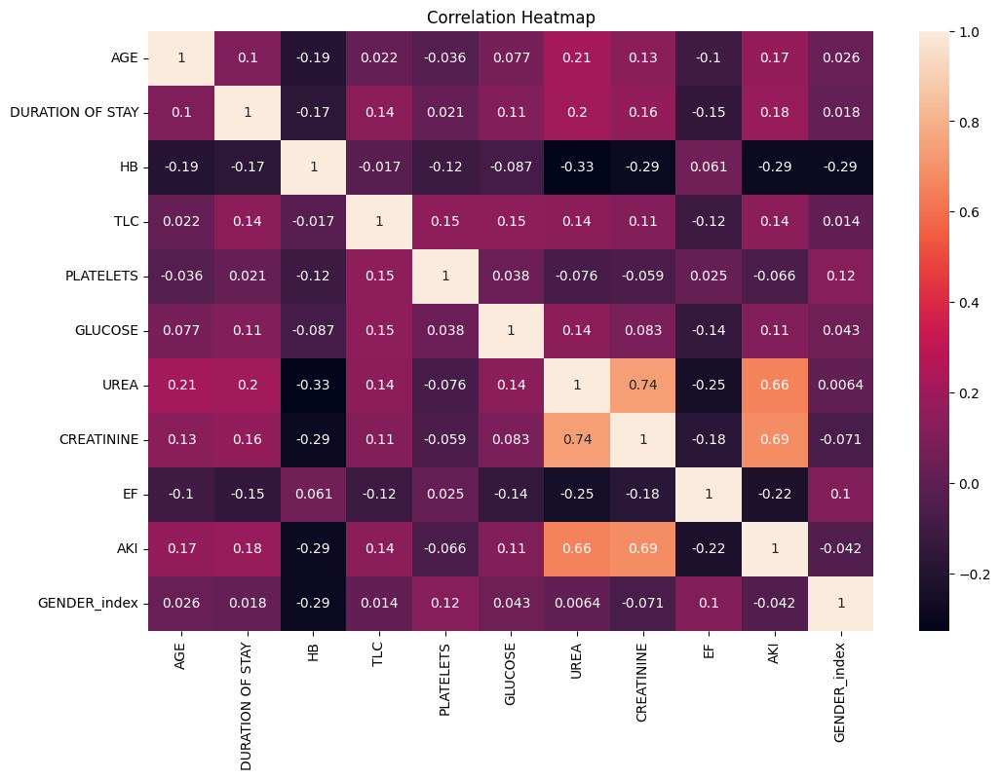

In [ ]:
from pyspark.ml.stat import Correlation
from pyspark.ml.feature import VectorAssembler
from matplotlib import pyplot as plt

# convert to vector column first
assembler = VectorAssembler(inputCols=dfh.columns, outputCol="features")
df_vector = assembler.transform(dfh).select("features")

# get correlation matrix
matrix = Correlation.corr(df_vector, 'features')
corrmatrix = matrix.collect()[0][0].toArray().tolist()

#Converst to pandas dataframe
df_corr = pd.DataFrame(corrmatrix, columns = dfh.columns, index = dfh.columns)

#plot correlation matrix by using seaborn

plt.rcParams["figure.figsize"] = (12, 8)
sns.heatmap(df_corr, annot=True)
plt.title("Correlation Heatmap")
plt.show()

Here we see only UREA and CREATININE are correlated for AKI.

### 5.1 - Separating the Cleaned Dataset in Train(80%) and Test(20%)

In [ ]:
# Dropping columns not applicable for the analysis of AKI
df_AKI = dataClean.drop(columns=["DURATION OF STAY", "OUTCOME",
                                   "TYPE OF ADMISSION-EMERGENCY/OPD"])

from sklearn.model_selection import train_test_split

# Checking the count of each class in Y
k_name, k_count =  np.unique(df_AKI['AKI'], return_counts=True)
print("Proporportion of ", k_name[0]," in the entire dataset is ", k_count[0]/sum(k_count))
print("Proporportion of ", k_name[1]," in the entire dataset is ", k_count[1]/sum(k_count))

# OPTION A - With Proportional Allocation (sttratified sampling) 
df_tr, df_te = train_test_split(df_AKI, test_size=0.2, stratify=df_AKI['AKI'], random_state=2023)
counts = df_tr['AKI'].value_counts()

# Checking the count of each class in Y of Train part
k_name_tr, k_count_tr =  np.unique(df_tr['AKI'], return_counts=True)
print("Proporportion of ", k_name_tr[0]," in the TRAIN part is ", k_count_tr[0]/sum(k_count_tr))
print("Proporportion of ", k_name_tr[1]," in the TRAIN part is ", k_count_tr[1]/sum(k_count_tr))

# Removing Response variable and putting in separate dataframes
df_Y_tr = pd.DataFrame()
df_Y_tr["AKI"] = df_tr['AKI']
df_Y_te = pd.DataFrame()
df_Y_te["AKI"] = df_te['AKI']

df_tr.drop(columns = "AKI", inplace=True)
df_te.drop(columns = "AKI", inplace=True)


#df_tr.columns
#display(df_tr)
#display(df_Y_tr)





Proporportion of  0  in the entire dataset is  0.7882469135802469
Proporportion of  1  in the entire dataset is  0.21175308641975307
Proporportion of  0  in the TRAIN part is  0.7882716049382716
Proporportion of  1  in the TRAIN part is  0.21172839506172839


For the cleaned dataset, 78.8% of the total data is related to no AKI (0), whereas 21.2% is related to patients diagnotisticated with AKI (1). The entire dataset was splittled in 80% in train part to create the ML models, whereas the other 20% in test part to test these models. They were splitted randomly but allocating proportionaly the response variable based on the complete dataset (stratified sampling with proportional allocation) as it is possible to verify above.

In [ ]:
# Train and Test Dataframe considering Dummies and WITH Scale for quantitative variables )to be used in 

# Separating Categorical variables from train and test part to scale only numerical ones
categorical_Variables = ['GENDER', 'RURAL', 'SMOKING ',
       'ALCOHOL', 'DM', 'HTN', 'CAD', 'PRIOR CMP', 'CKD', 'RAISED CARDIAC ENZYMES',
       'SEVERE ANAEMIA', 'ANAEMIA', 'STABLE ANGINA', 'ACS', 'STEMI',
       'HEART FAILURE']

# to prepare the features(indepedent) variables and response(depedent) varisble.
dummies_tr = pd.get_dummies(df_tr[categorical_Variables])
X_numerical_tr  = df_tr.drop(categorical_Variables, axis = 1).astype('float64')

#print(dummies_tr)


list_numerical = X_numerical_tr.columns
print(list_numerical)

# Putting together numerica and dummies
df_tr_Xscaled = pd.concat([X_numerical_tr, dummies_tr], axis=1)

#df_tr_Xscaled.info()

# to prepare the features(indepedent) variables and response(depedent) varisble.
dummies_te = pd.get_dummies(df_te[categorical_Variables])
X_numerical_te  = df_te.drop(categorical_Variables, axis = 1).astype('float64')

# Putting together numerica and dummies
df_te_Xscaled = pd.concat([X_numerical_te, dummies_te], axis=1)
#df_te_Xscaled.info()


# Scalling in Qunatitative variables only
from sklearn.preprocessing import StandardScaler

# Scalling Train dataframe
scaler = StandardScaler().fit(df_tr_Xscaled[list_numerical]) 

df_tr_Xscaled[list_numerical] = scaler.transform(df_tr_Xscaled[list_numerical])

# Scalling Test dataframe
scaler = StandardScaler().fit(df_te_Xscaled[list_numerical]) 

df_te_Xscaled[list_numerical] = scaler.transform(df_te_Xscaled[list_numerical])


display(df_tr_Xscaled.head())
print(df_tr_Xscaled.columns)


Index(['AGE', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA', 'CREATININE', 'EF'], dtype='object')


,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF,GENDER_F,GENDER_M,...,ANAEMIA_0,ANAEMIA_1,STABLE ANGINA_0,STABLE ANGINA_1,ACS_0,ACS_1,STEMI_0,STEMI_1,HEART FAILURE_0,HEART FAILURE_1
192,-1.288495,0.499444,-1.306024,-1.801557,-0.796962,-0.943754,-0.523741,1.198628,0,1,...,1,0,1,0,1,0,1,0,1,0
13693,-0.836110,1.018746,0.083806,-0.939181,1.627676,-0.412623,-0.610206,-0.300182,0,1,...,1,0,1,0,1,0,1,0,1,0
7060,1.275016,-1.015188,0.206438,0.766192,0.842555,0.304405,-0.004948,-1.199468,1,0,...,0,1,1,0,0,1,1,0,0,1
14281,-0.006739,-1.621041,-0.324968,0.020092,-0.531407,3.039733,2.848415,-1.049587,1,0,...,0,1,1,0,1,0,1,0,0,1
14928,-0.232931,0.672545,-0.229587,-0.115563,-0.069571,-0.518849,3.799536,1.198628,0,1,...,1,0,1,0,0,1,1,0,1,0


Index(['AGE', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA', 'CREATININE', 'EF',
       'GENDER_F', 'GENDER_M', 'RURAL_R', 'RURAL_U', 'SMOKING _0',
       'SMOKING _1', 'ALCOHOL_0', 'ALCOHOL_1', 'DM_0', 'DM_1', 'HTN_0',
       'HTN_1', 'CAD_0', 'CAD_1', 'PRIOR CMP_0', 'PRIOR CMP_1', 'CKD_0',
       'CKD_1', 'RAISED CARDIAC ENZYMES_0', 'RAISED CARDIAC ENZYMES_1',
       'SEVERE ANAEMIA_0', 'SEVERE ANAEMIA_1', 'ANAEMIA_0', 'ANAEMIA_1',
       'STABLE ANGINA_0', 'STABLE ANGINA_1', 'ACS_0', 'ACS_1', 'STEMI_0',
       'STEMI_1', 'HEART FAILURE_0', 'HEART FAILURE_1'],
      dtype='object')


The explanatory quantitative variables for train and test parts were scaled separately to avoid dependence between them as well as the qualitative variables were dummified. The final train and test dataframes with scaled variables and dummified variables were created. This will be mainly applicable when fit ML models that depends on the distance (e.g. KNN).

For other ML methods which does not requires the calculation of distance, it was a created below another dataframe for the explanatory quantitative variables without scale, but considering the qualitative variables dummified.

In [ ]:
# Column names with only X quantivative variables
x_variables = ['AGE', 'HB', 'TLC',
       'PLATELETS', 'GLUCOSE', 'UREA', 'CREATININE']

y_variable = ["AKI"]


In [ ]:
# Train and Test Dataframe considering Dummies and No Scale for quantitative variables
x_variables_withDummies = ['AGE', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA', 'CREATININE', 'EF',
       'GENDER_F', 'GENDER_M', 'RURAL_R', 'RURAL_U', 'SMOKING _0',
       'SMOKING _1', 'ALCOHOL_0', 'ALCOHOL_1', 'DM_0', 'DM_1', 'HTN_0',
       'HTN_1', 'CAD_0', 'CAD_1', 'PRIOR CMP_0', 'PRIOR CMP_1', 'CKD_0',
       'CKD_1', 'RAISED CARDIAC ENZYMES_0', 'RAISED CARDIAC ENZYMES_1',
       'SEVERE ANAEMIA_0', 'SEVERE ANAEMIA_1', 'ANAEMIA_0', 'ANAEMIA_1',
       'STABLE ANGINA_0', 'STABLE ANGINA_1', 'ACS_0', 'ACS_1', 'STEMI_0',
       'STEMI_1', 'HEART FAILURE_0', 'HEART FAILURE_1']


# Putting together numerical (no scaled) and dummies
df_tr_withDummies= pd.concat([X_numerical_tr, dummies_tr], axis=1)
df_te_withDummies = pd.concat([X_numerical_te, dummies_te], axis=1)

display(df_tr_withDummies.head())

y_variable = ["AKI"]

,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF,GENDER_F,GENDER_M,...,ANAEMIA_0,ANAEMIA_1,STABLE ANGINA_0,STABLE ANGINA_1,ACS_0,ACS_1,STEMI_0,STEMI_1,HEART FAILURE_0,HEART FAILURE_1
192,44.0,13.5,2.1,53.0,96.0,12.0,0.7,60.0,0,1,...,1,0,1,0,1,0,1,0,1,0
13693,50.0,14.7,12.3,142.0,306.0,32.0,0.6,40.0,0,1,...,1,0,1,0,1,0,1,0,1,0
7060,78.0,10.0,13.2,318.0,238.0,59.0,1.3,28.0,1,0,...,0,1,1,0,0,1,1,0,0,1
14281,61.0,8.6,9.3,241.0,119.0,162.0,4.6,30.0,1,0,...,0,1,1,0,1,0,1,0,0,1
14928,58.0,13.9,10.0,227.0,159.0,28.0,5.7,60.0,0,1,...,1,0,1,0,0,1,1,0,1,0


After this stage, we had already created the dataframes (X and Y) with the train and test parts separately. For the explanatory datasets, 2 differents were created for each part, ones with scaled values (train and test sclaed apart) named df_tr_Xscaled and df_te_Xscaled,  and others without scale named df_tr_withDummies and df_te_withDummies.

### 5.2 - Acute Kidney Injury (AKI) Analysis with diff ML MODELs

####Automated dataframe creation

For the ML models for AKI prediction presented in this section, it was created initially some datframes to be used to store the accuracy, true negatives and positives predicted of each ML to allow us to generate automatic the plots at the end.

In [ ]:
# Dataframe to storage Accuracy Score of Train and Test Part
# [0] Name of ML   [1] Acc_tr      [2] Acc_te
acc_summary_AKI = pd.DataFrame(columns=["ML_Model", "Accuracy_Tr", "Accuracy_Te"])

# Dataframes to store Total Number of Negatives and Positives indicated in Train and Test Parts
# [0] Name of ML   [1] True Negatives      [2] True Positives
trues_tr_AKI = pd.DataFrame(columns=["ML_Model_train", "True_Negative", "True_Positive"])

trues_te_AKI = pd.DataFrame(columns=["ML_Model_test", "True_Negative", "True_Positive"])

# Adding in each dataframe the total number of positives
k_name_tr, k_count_tr =  np.unique(df_Y_tr['AKI'], return_counts=True)
new_row = {'ML_Model_train': 'REAL - TRAIN PART', 'True_Negative':k_count_tr[0], 'True_Positive': k_count_tr[1]}
trues_tr_AKI.loc[len(trues_tr_AKI)] = new_row

k_name_te, k_count_te =  np.unique(df_Y_te['AKI'], return_counts=True)
new_row = {'ML_Model_test': 'REAL - TEST PART', 'True_Negative':k_count_te[0], 'True_Positive': k_count_te[1]}
trues_te_AKI.loc[len(trues_te_AKI)] = new_row

display(trues_tr_AKI)
display(trues_te_AKI)


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429


It was also created a function to allow to visualize better the Confusion Matrix of each ML model

In [ ]:
# Function to create confusion matrix
def confMatrixPlot(cm):
  # cm is a dataframe with the values of True/False Negative or Positive calculated by a Statistical Learning Method
  cm = np.array(cm)
  group_names = ["True Neg","False Pos","False Neg","True Pos"]

  group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
  group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]
  labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
  labels = np.asarray(labels).reshape(2,2)
  sns.heatmap(cm, annot=labels, fmt="", cmap='GnBu') # cmap= YlGnBu/YlGn/BuGn

####5.2.1 - LOGISTIC REGRESSION

In [ ]:
%%time
# Logistic Regression - Creating the model
model = LogisticRegression(max_iter=10000) # It was necessary to increase the number of iterations
model.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

#Plotting Coefficients
print(model.intercept_, model.coef_, model.score(df_tr_Xscaled, np.ravel(df_Y_tr)))

# Accuracy of apply training points of the generated model
y_pred_tr = model.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted LOGISTIC REGRESSION model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = model.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted LOGISTIC REGRESSION model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'LOGISTIC REGRESSION', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_AKI.loc[len(acc_summary_AKI)] = new_row

display(acc_summary_AKI)

[-2.44658178] [[-6.75207443e-03 -1.10528687e-01  2.95577286e-02 -9.15524447e-03
  -1.15774749e-01  2.76776810e-01  1.58430048e+01 -7.23248748e-02
  -8.92042048e-02  8.81438112e-02  5.00246612e-02 -5.10850548e-02
   4.53011300e-02 -4.63615236e-02  9.96550742e-02 -1.00715468e-01
  -1.09437174e-01  1.08376780e-01 -1.14038798e-01  1.12978404e-01
   1.89527098e-01 -1.90587492e-01 -5.94255464e-02  5.83651529e-02
   4.55725575e-02 -4.66329510e-02 -6.08271973e-02  5.97668037e-02
  -1.27131365e-01  1.26070971e-01  1.06374888e-01 -1.07435281e-01
  -2.27139661e-01  2.26079267e-01  2.57081493e-02 -2.67685429e-02
  -1.77778102e-01  1.76717709e-01  4.01611049e-02 -4.12214984e-02]] 0.9906172839506173
Classification Accuracy of the fitted LOGISTIC REGRESSION model to predict TRAIN part:  0.9906172839506173
Classification Accuracy of the fitted LOGISTIC REGRESSION model to predict TEST part:  0.9901234567901235


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.990617,0.990123


CPU times: user 156 ms, sys: 88.4 ms, total: 244 ms
Wall time: 149 ms


Based on the results above, the LOGISTIC REGRESSION fitted model presented an accuracy in the TRAIN part of 99.1%, wheraes this model could predict 99% of accuracy in predicting AKI in the TEST part.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of LOGISTIC REGRESSION")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model_train': 'LOGISTIC REGRESSION', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_AKI.loc[len(trues_tr_AKI)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of LOGISTIC REGRESSION")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model_test': 'LOGISTIC REGRESSION', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_AKI.loc[len(trues_te_AKI)] = new_row

display(trues_tr_AKI)
display(trues_te_AKI)

CONFUSION MATRIX - TRAIN PART of LOGISTIC REGRESSION
       No   Yes
No   6361    52
Yes    24  1663
CONFUSION MATRIX - TEST PART of LOGISTIC REGRESSION
       No  Yes
No   1584    8
Yes    12  421


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421


CONFUSION MATRIX - TRAIN PART of LOGISTIC REGRESSION


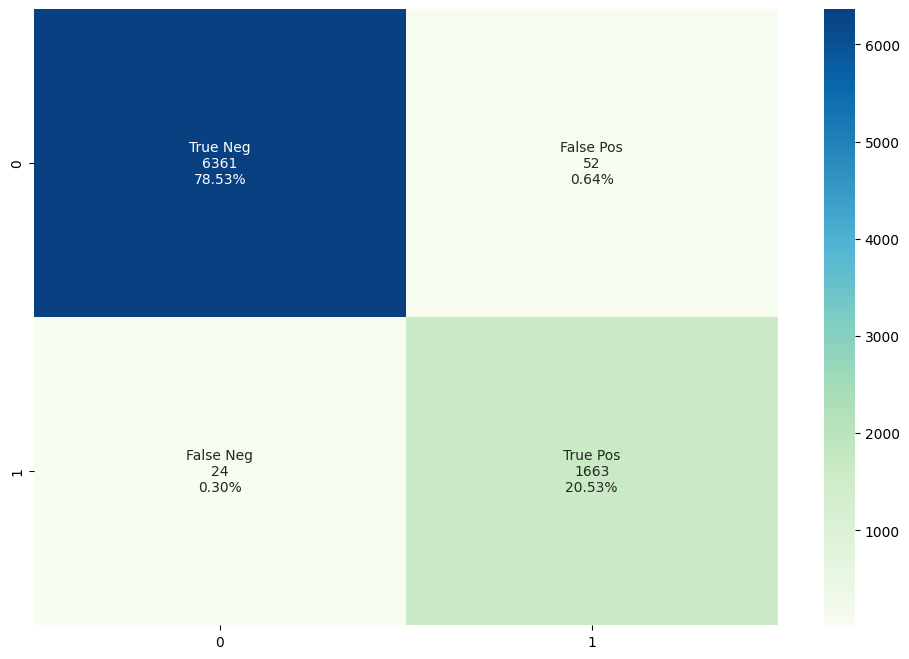

In [ ]:
print("CONFUSION MATRIX - TRAIN PART of LOGISTIC REGRESSION")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TRAIN part, the LOGISTIC REGRESSION fitted model predicted correctly 6361 patients having AKI, whereas 52 of patient predicted incorrectly. In terms of predicting patients with real AKI diagnostic, 1663 were predictly correctly, where only 24 were predicted incorrectly.

CONFUSION MATRIX - TEST PART of LOGISTIC REGRESSION


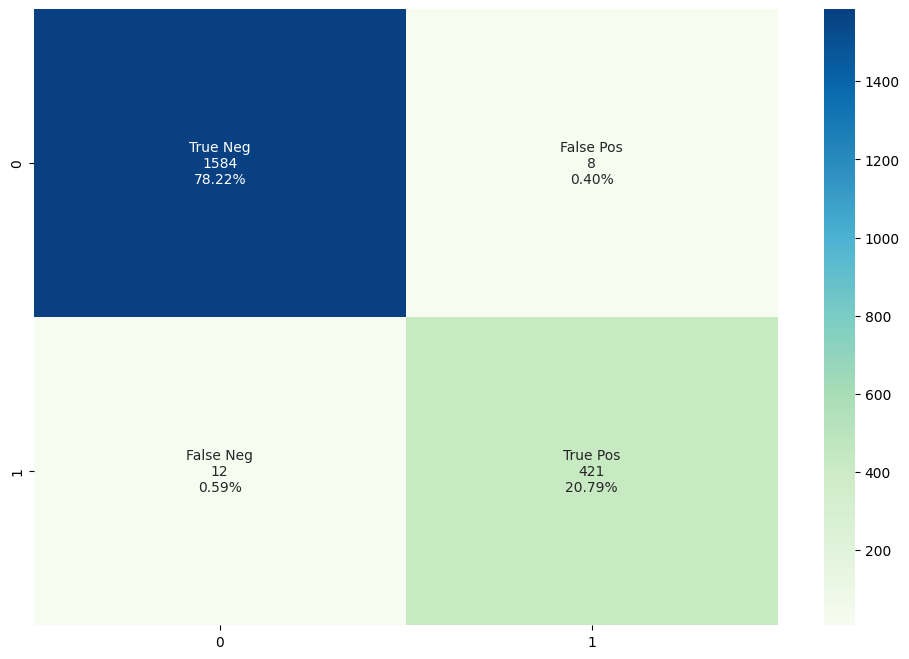

In [ ]:
print("CONFUSION MATRIX - TEST PART of LOGISTIC REGRESSION")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the LOGISTIC REGRESSION fitted model predicted correctly 1584 patients having AKI, whereas 8 patients were predicted incorrectly. In terms of predicting patients with real AKI diagnostic, 421 were predictly correctly, where 12 were predicted incorrectly.

(2025, 1)
(2025,)
AUC score =  0.98691659217975


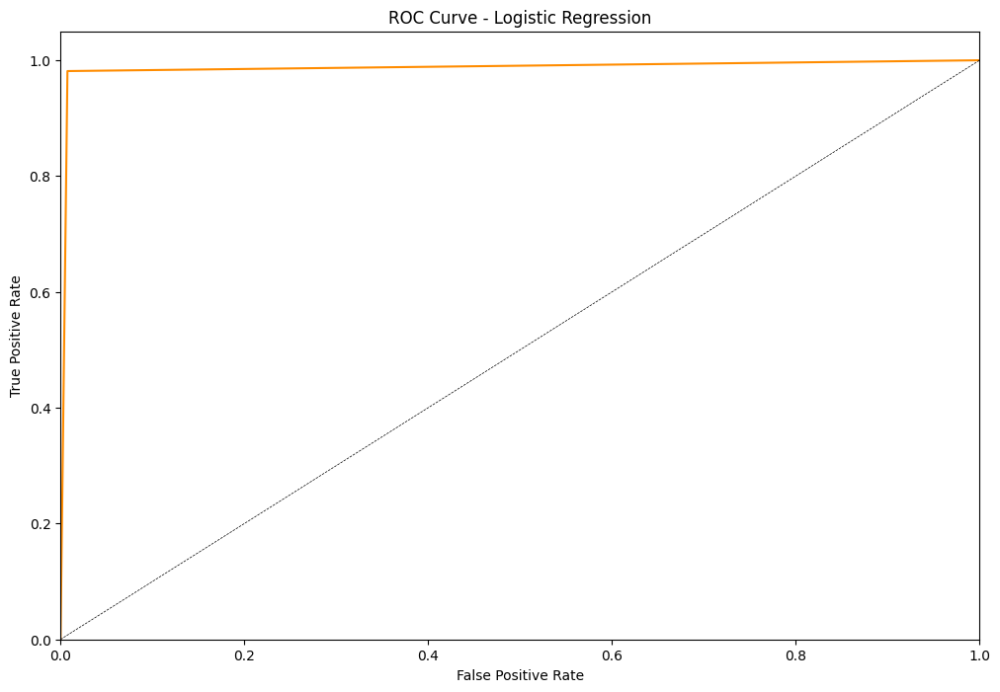

In [ ]:
# Checking Area under the ROC Curve

from sklearn.metrics import roc_curve, auc, roc_auc_score

y_pred = model.predict(df_te_Xscaled)

print(df_Y_te.shape)
print(y_pred.shape)

fpr, tpr, _ = roc_curve(df_Y_te, y_pred)
roc_auc = auc(fpr, tpr)

# AUC score
AUC_score = roc_auc_score(df_Y_te, y_pred)
print("AUC score = ", AUC_score)

# Plotting ROC (Receiver operating characteristic)
plt.figure()
plt.plot(fpr, tpr, 
         label=f"ROC curve (AUC = {AUC_score:.2f})", color="darkorange") #linewidth=4,
plt.plot([0.0, 1.0], [0.0, 1.0], ls='--', lw=0.5, c='black', label="chance level (AUC = 0.5)")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Logistic Regression')
plt.show()

From calculation, we see AUC score is 0.9869 which is nearly 1, means that the model has good discriminatory ability: 98.7% of the time, the model will correctly assign AKI to a randomly selected patient with an event than to a randomly selected patient without an AKI.

The Receiver Operating Curve (ROC Curve) that presents the relation of predicted True Positive Rate versus False Positive Rate indicates that the percentage of correct prediction of AKI overcomes the wrong ones which indicated the model is in Excellent performance. 

####5.2.2 - QDA

In [ ]:
%%time
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA

sklearn_qda = QDA(priors=None,store_covariance=True) #creating a QDA object
qda = sklearn_qda.fit(df_tr_Xscaled, np.ravel(df_Y_tr)) #learning the projection matrix

Y_tr_labels = qda.predict(df_tr_Xscaled) #gives you the predicted label for each sample
Y_tr_prob = qda.predict_proba(df_tr_Xscaled) #the probability of each sample to belong to each class

Y_tr_labels = np.array(Y_tr_labels).reshape(-1,1)

Y_test_labels=qda.predict(df_te_Xscaled)
Y_test_prob = qda.predict_proba(df_te_Xscaled) 

#print(Y_test_labels.shape)
#print(df_Y_te.shape)

Y_test_labels = np.array(Y_test_labels).reshape(-1,1)

#np.mean(df_Y_te==Y_test_labels)
#print(qda.means_)
#print(qda.covariance_)


# Accuracy of apply training points of the generated model
acc_train = accuracy_score(df_Y_tr, Y_tr_labels)
print('Classification Accuracy of the fitted QDA model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
acc_test = accuracy_score(df_Y_te, Y_test_labels)
print('Classification Accuracy of the fitted QDA model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'QDA (threshold = 0.5)', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_AKI.loc[len(acc_summary_AKI)] = new_row

display(acc_summary_AKI)

Classification Accuracy of the fitted QDA model to predict TRAIN part:  0.7096296296296296
Classification Accuracy of the fitted QDA model to predict TEST part:  0.7111111111111111


/usr/local/lib/python3.9/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.990617,0.990123
1,QDA (threshold = 0.5),0.709630,0.711111


CPU times: user 119 ms, sys: 70.3 ms, total: 190 ms
Wall time: 120 ms


Based on the results above, the QDA (deault threshold of 0.5) fitted model presented an accuracy in the TRAIN part of 70.96%, whereas this model could predict AKI in the TEST part with 71.11% of accuracy.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of QDA with Threshold = 0.5")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, Y_tr_labels).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model_train': 'QDA (threshold = 0.5)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_AKI.loc[len(trues_tr_AKI)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of QDA with Threshold = 0.5")
cm = pd.DataFrame(confusion_matrix(df_Y_te, Y_test_labels).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model_test': 'QDA (threshold = 0.5)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_AKI.loc[len(trues_te_AKI)] = new_row

display(trues_tr_AKI)
display(trues_te_AKI)

CONFUSION MATRIX - TRAIN PART of QDA with Threshold = 0.5
       No   Yes
No   4154   121
Yes  2231  1594
CONFUSION MATRIX - TEST PART of QDA with Threshold = 0.5
       No  Yes
No   1051   40
Yes   545  389


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663
2,QDA (threshold = 0.5),4154,1594


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421
2,QDA (threshold = 0.5),1051,389


CONFUSION MATRIX - TRAIN PART of QDA with Threshold = 0.5


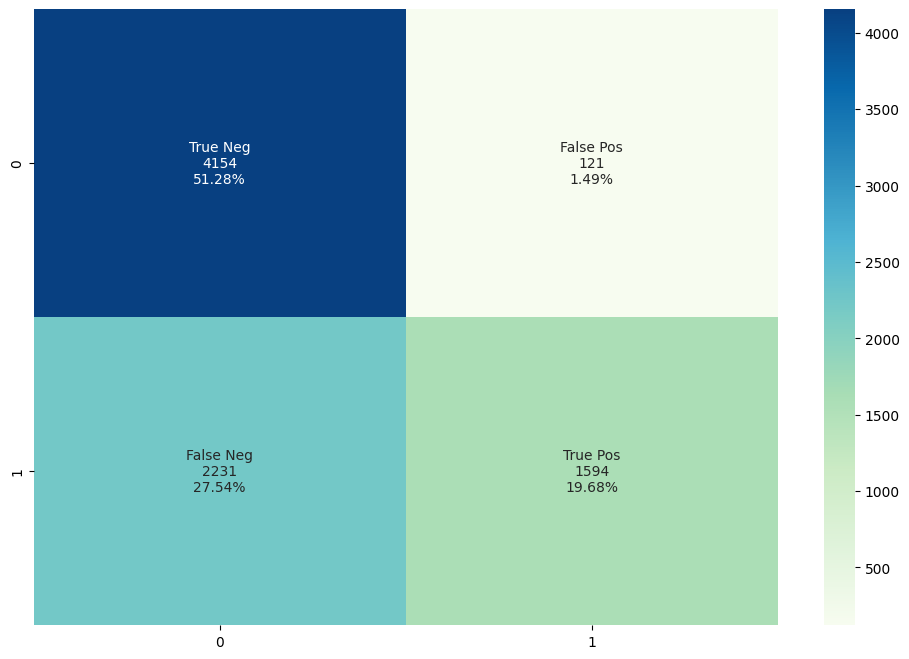

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of QDA with Threshold = 0.5")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, Y_tr_labels).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)


For the TRAIN part, the QDA (default threshold = 0.5) fitted model predicted correctly 4154 no AKI diagnostic, whereas 121 of patients without the diagnoticof AKI were wrong. In terms of predicting patients with real AKI diagnostic, 1594 were predictly correctly, where 2231 were predicted incorrectly.

CONFUSION MATRIX - TEST PART of QDA with Threshold = 0.5


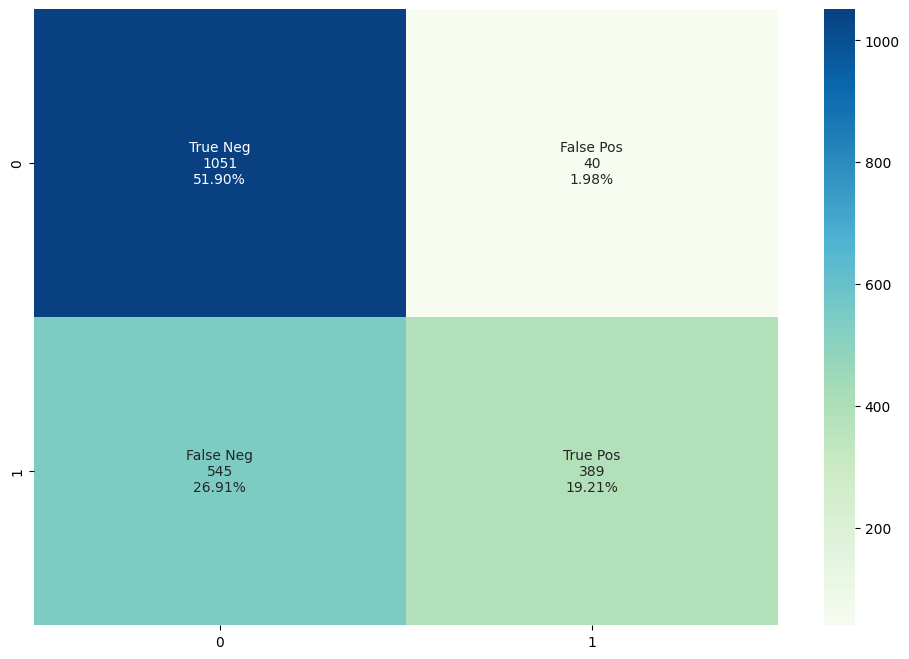

In [ ]:
print("CONFUSION MATRIX - TEST PART of QDA with Threshold = 0.5")
cm = pd.DataFrame(confusion_matrix(df_Y_te, Y_test_labels).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)


For the TEST part, the QDA (default threshold = 0.5) fitted model predicted correctly 1051 no AKI diagnostic, whereas 40 of patients without the diagnoticof AKi were wrong. In terms of predicting patients with real AKI diagnostic, 389 were predictly correctly, where 545 were predicted incorrectly.

As threshold of probability is something that we can manage, it was done some sensitivity on this parameter as presented below.

/usr/local/lib/python3.9/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


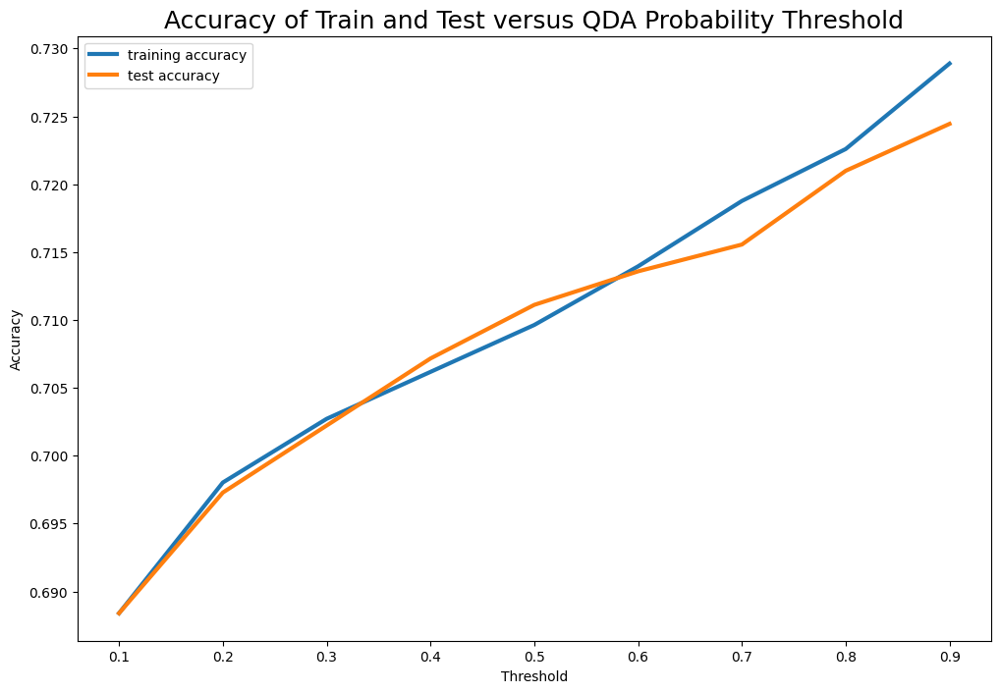

In [ ]:
# Sensitivity in the threshold
minThreshold = 0.1
nThreshold = np.arange(minThreshold, 1.0, step=0.1)
#print(nThreshold)
len(nThreshold)
 
# Arrays to storage accuracy 
acc_train_by_n = []
acc_te_by_n = []

for i in nThreshold:
  threshold = i

  # Train Part
  df_train=pd.DataFrame()
  df_train = np.array(Y_tr_prob[:,1].reshape(-1,1))

  #print(np.mean(df_Y_tr==(df_train>=threshold)))
  acc_train = np.mean(df_Y_tr==(df_train>=threshold))
  acc_train_by_n.append(acc_train)

  # Test Part
  df_test=pd.DataFrame()
  df_test = np.array(Y_test_prob[:,1].reshape(-1,1))

  #print(np.mean(df_Y_te==(df_test>=threshold)))
  acc_te = np.mean(df_Y_te==(df_test>=threshold))
  acc_te_by_n.append(np.mean(acc_te))

  # Just to print the summary of each iteraction (number of depths)
  #print(threshold, acc_train, acc_te)

# Plotting acc train versus acc
plt.figure(figsize=(12,8))
plt.plot(nThreshold, acc_train_by_n, label="training accuracy", lw=3)
plt.plot(nThreshold, acc_te_by_n, label="test accuracy", lw=3)
plt.ylabel("Accuracy")
plt.xlabel("Threshold")
plt.title("Accuracy of Train and Test versus QDA Probability Threshold", fontsize=18)
plt.legend()




Based on threshold senstivity results presented above, increasing the threshold improves the performance of QDA model, but this just increases because the model start to predict more units with correct prediction of no AKI and consequently reducing the correct predict of patients diagnosticated with AKi. As the majority of the dataset is related to no AKI, this pushes the accuracy to higher values.

####5.2.3 - CLASSIFICATION TREE

For Classification Tree, as this ML method requires to set in PYTHON the maximum depth, it was done initially some sensitivity in this parameter.

2 0.9890123456790123 0.9891358024691358
3 0.9893827160493828 0.9881481481481481
4 0.9907407407407407 0.9866666666666667
5 0.9907407407407407 0.9866666666666667
6 0.9922222222222222 0.9891358024691358
7 0.9939506172839506 0.9896296296296296
8 0.9954320987654321 0.988641975308642
9 0.9964197530864197 0.9871604938271605
10 0.997037037037037 0.9876543209876543
11 0.9976543209876543 0.9881481481481481
12 0.9979012345679013 0.9881481481481481

 optimal tree depth: 2 

CPU times: user 565 ms, sys: 13.3 ms, total: 579 ms
Wall time: 581 ms


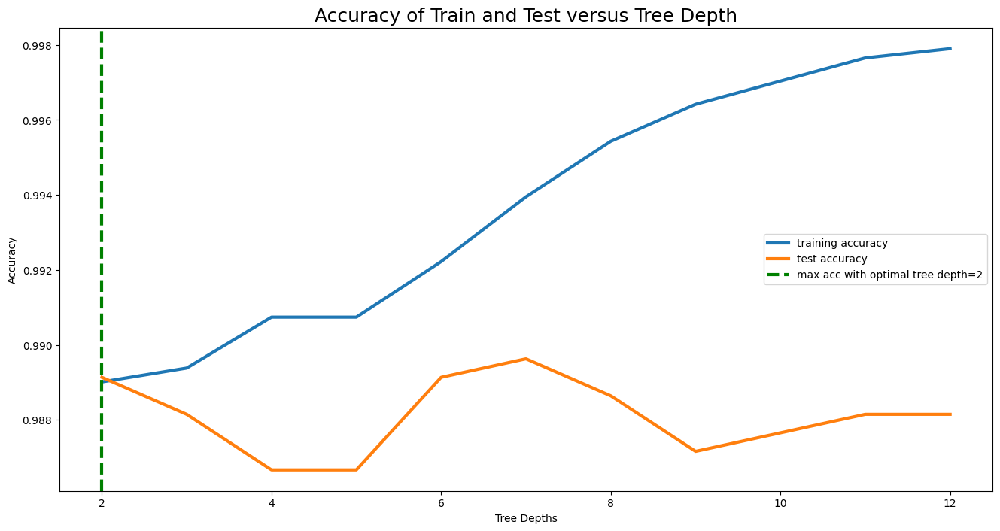

In [ ]:
%%time
minTreeDepth = 2
maxTreeDepth = 12
nDepths = np.arange(minTreeDepth, maxTreeDepth+1, step=1)
#print(nDepths)
len(nDepths)
 

# Arrays to storage accuracy 
acc_train_by_n = []
acc_te_by_n = []

for i in nDepths:
  criteria = "gini" 
  max_depth = nDepths
  min_sample_leaf = 2
  clf_gini = DecisionTreeClassifier(criterion=criteria, random_state=100,
                                max_depth=i, min_samples_leaf=min_sample_leaf)
  clf_gini.fit(df_tr_withDummies[x_variables_withDummies], df_Y_tr[y_variable]) 

  # Checking accuracy of Train
  acc_train = accuracy_score(df_Y_tr[y_variable], clf_gini.predict(df_tr_withDummies[x_variables_withDummies]))
  #print(acc_train)
  acc_train_by_n.append(acc_train)

  # Accuracy of apply all test point
  acc_te = accuracy_score(df_Y_te[y_variable], clf_gini.predict(df_te_withDummies[x_variables_withDummies]))
  #print(acc_te)
  acc_te_by_n.append(acc_te)

  # Just to print the summary of each iteraction (number of depths)
  print(i, acc_train, acc_te)


k = nDepths[np.argmax(acc_te)]
print("\n optimal tree depth:", k,"\n")
#m= nDepths[np.argmax(acc_te_by_n)] 
#print("\n optimal tree depth:", m,"\n")

# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(nDepths, acc_train_by_n, label="training accuracy", lw=3)
plt.plot(nDepths, acc_te_by_n, label="test accuracy", lw=3)

#plt.axvline(m, ls='--', linewidth=3, color='green',label=f"max acc with optimal tree depth={m}")
plt.axvline(k, ls='--', linewidth=3, color='green',label=f"max acc with optimal tree depth={k}")

plt.ylabel("Accuracy")
plt.xlabel("Tree Depths")
plt.title("Accuracy of Train and Test versus Tree Depth", fontsize=18)
plt.legend()
#major_ticks = np.arange(1, maxTreeDepth+1, 1)
#plt.xticks(major_ticks)


Based on the results of the sensitivity in the depth of the tree, we see that the ideal maximum test accuracy is reached with 2 depths. 
For depth 4 and 7 , the accuracy is also increased for the train part whereas the test part is nearly like 2 depths. 

Increasing the depths, the difference of both train and test part increases due to improvement in the performance of train part. However, this indicates that the model starts being overfitted. Thus, we considered depth 2 for the Classification Tree to predict AKI. 

Thus, we considered depth 2 for the Classification Tree to predict AKI, the model construction with its performance is presented below.


In [ ]:
%%time
# to build a tree, we could use 'gini' or 'entropy' as split criterion at each node. 
# here we use an example use 'gini' and with a few other hyperparameters.
criteria = "gini" 
max_depth = 2
min_sample_leaf = 2
clf_gini = DecisionTreeClassifier(criterion=criteria, random_state=100,
                                max_depth=max_depth, min_samples_leaf=min_sample_leaf)
clf_gini.fit(df_tr_withDummies[x_variables_withDummies], df_Y_tr[y_variable])
print(clf_gini.score(df_tr_withDummies[x_variables_withDummies], df_Y_tr[y_variable]))

# Accuracy of apply training points of the generated model
y_pred_tr = clf_gini.predict(df_tr_withDummies[x_variables_withDummies])
acc_train = accuracy_score(df_Y_tr[y_variable], y_pred_tr)
print('Classification Accuracy of the fitted Classification Tree model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = clf_gini.predict(df_te_withDummies[x_variables_withDummies])
acc_test = accuracy_score(df_Y_te[y_variable], y_pred_te)
print('Classification Accuracy of the fitted Classification Tree model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': f'CLASSIFICATION TREE (Depth = {k})', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_AKI.loc[len(acc_summary_AKI)] = new_row

display(acc_summary_AKI)



0.9890123456790123
Classification Accuracy of the fitted Classification Tree model to predict TRAIN part:  0.9890123456790123
Classification Accuracy of the fitted Classification Tree model to predict TEST part:  0.9891358024691358


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.990617,0.990123
1,QDA (threshold = 0.5),0.709630,0.711111
2,CLASSIFICATION TREE (Depth = 2),0.989012,0.989136


CPU times: user 61.5 ms, sys: 0 ns, total: 61.5 ms
Wall time: 64.5 ms


Based on the results above, the CLASSIFICATION TREE fitted model presented an accuracy in the TRAIN and TEST part of 99%.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of CLASSIFICATION TREE")
cm = pd.DataFrame(confusion_matrix(df_Y_tr[y_variable], y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model_train': f'CLASSIFICATION TREE (Depth = {k})', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_AKI.loc[len(trues_tr_AKI)] = new_row


CONFUSION MATRIX - TRAIN PART of CLASSIFICATION TREE
       No   Yes
No   6312    16
Yes    73  1699


In [ ]:
# TEST Part
print("CONFUSION MATRIX - TEST PART of CLASSIFICATION TREE")
cm = pd.DataFrame(confusion_matrix(df_Y_te[y_variable], y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model_test': f'CLASSIFICATION TREE (Depth = {k})', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_AKI.loc[len(trues_te_AKI)] = new_row

display(trues_tr_AKI)
display(trues_te_AKI)


CONFUSION MATRIX - TEST PART of CLASSIFICATION TREE
       No  Yes
No   1579    5
Yes    17  424


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663
2,QDA (threshold = 0.5),4154,1594
3,CLASSIFICATION TREE (Depth = 2),6312,1699


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421
2,QDA (threshold = 0.5),1051,389
3,CLASSIFICATION TREE (Depth = 2),1579,424


CONFUSION MATRIX - TRAIN PART of CLASSIFICATION TREE


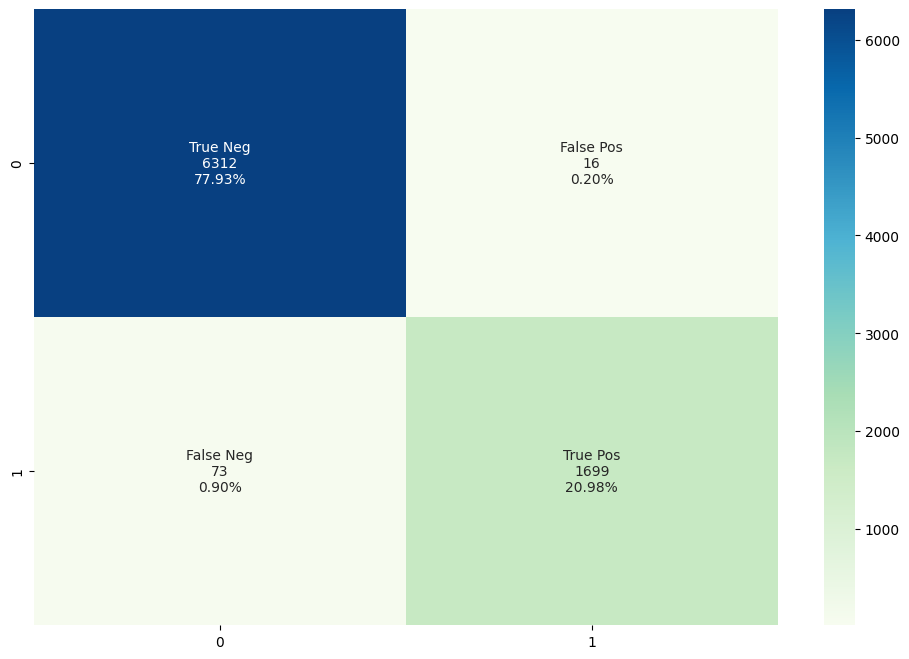

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of CLASSIFICATION TREE")
cm = pd.DataFrame(confusion_matrix(df_Y_tr[y_variable], y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)


For the TRAIN part, the CLASSIFICATION TREE fitted model predicted correctly 6312 no AKI diagnostic, whereas 16 of patients without the diagnoticof AKI were wrong. In terms of predicting patients with real AKI diagnostic, 1699 were predictly correctly, where 73 were predicted incorrectly.

CONFUSION MATRIX - TEST PART of CLASSIFICATION TREE


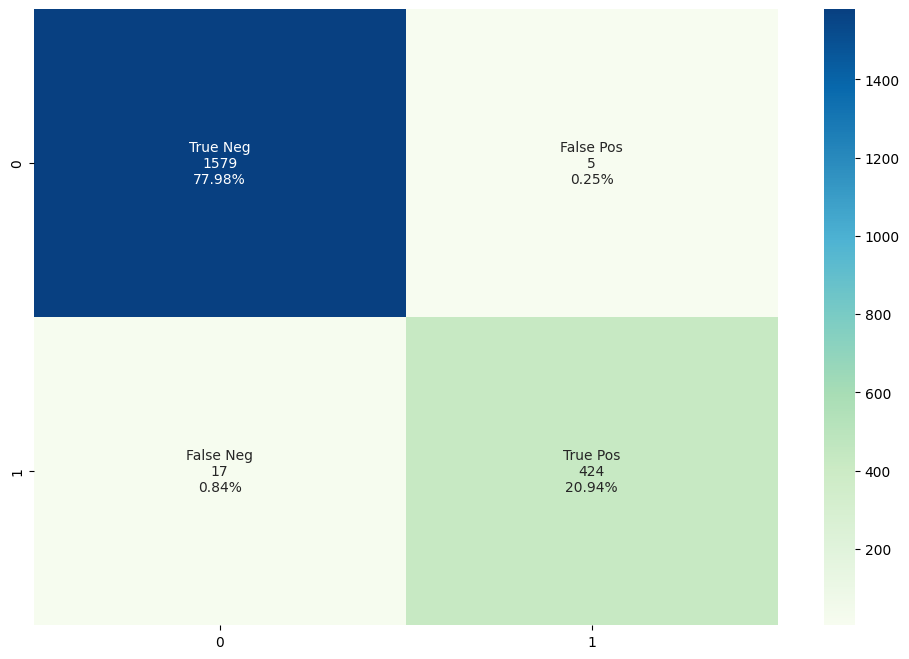

In [ ]:
print("CONFUSION MATRIX - TEST PART of CLASSIFICATION TREE")
cm = pd.DataFrame(confusion_matrix(df_Y_te[y_variable], y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)


For the TEST part, the CLASSIFICATION TREE fitted model predicted correctly 1579 no AKI diagnostic, whereas 5 of patients without the diagnoticof AKI were wrong. In terms of predicting patients with real AKI diagnostic, 424 were predictly correctly, where 17 were predicted incorrectly.

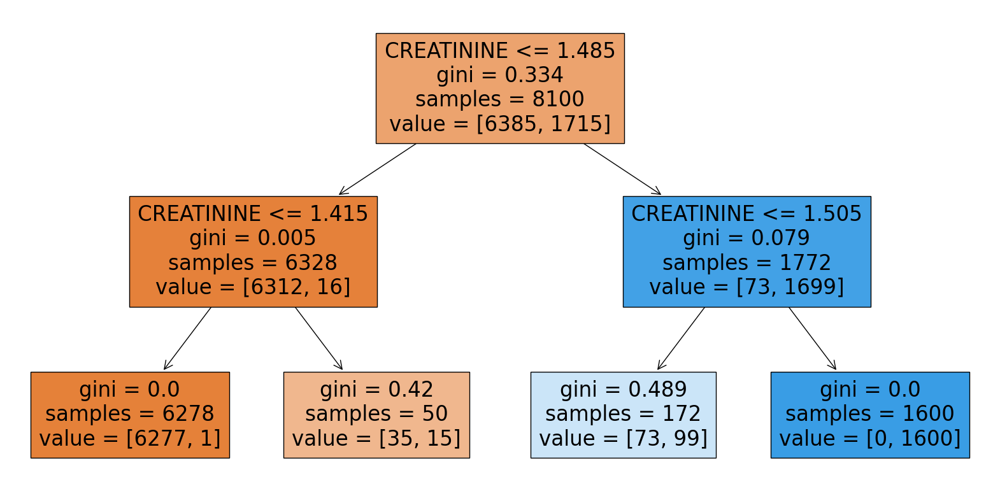

In [ ]:
# one attractive feature of a tree is visualization. 
plt.figure(figsize=(20,10))  # customize according to the size of your tree
plot_tree(clf_gini, feature_names = df_tr_withDummies[x_variables_withDummies].columns, filled=True)
plt.show()


In [ ]:
text_representation = tree.export_text(clf_gini)
print(text_representation)

|--- feature_6 <= 1.49
|   |--- feature_6 <= 1.41
|   |   |--- class: 0
|   |--- feature_6 >  1.41
|   |   |--- class: 0
|--- feature_6 >  1.49
|   |--- feature_6 <= 1.50
|   |   |--- class: 1
|   |--- feature_6 >  1.50
|   |   |--- class: 1



For the final tree (Depth = 2), it is important the most relevant explanatory variables to predict AKI are presented at the top of the Tree (CREATININE). Creatinine values higher than 1.49, the model will indicate AKI, but values lower than 1.49 usually predicts no AKI. Also we see that, Creatinine values higher than 1.505, Gini reaches to 0 which indicate the purity of the node. 


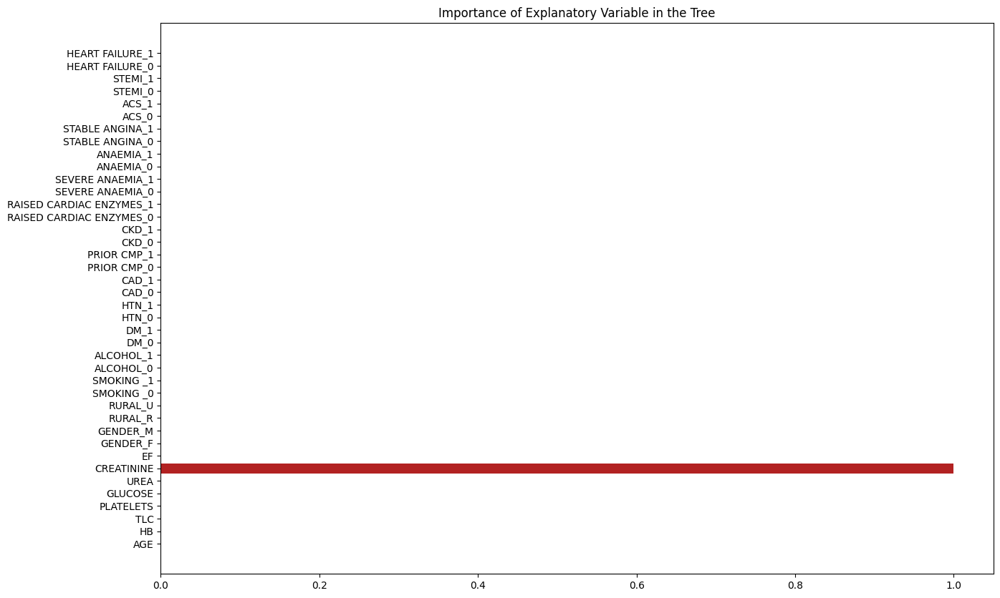

In [ ]:
# Plotting the variables based on the importance
plt.figure(figsize=(15,10))
plt.barh(np.arange(len(x_variables_withDummies)), clf_gini.feature_importances_, color = "firebrick")
plt.yticks(ticks=np.arange(len(x_variables_withDummies)), labels=x_variables_withDummies)
plt.title("Importance of Explanatory Variable in the Tree")
plt.show()

It is possible to verify in the plot above related to the importance of the explanatory variables in AKI that CREATININE is far away the most relevant variable, followed be UREA (very less significant compare to creatine). For this reason, It is plotted below the most important regions of UREA versus CREATININE.

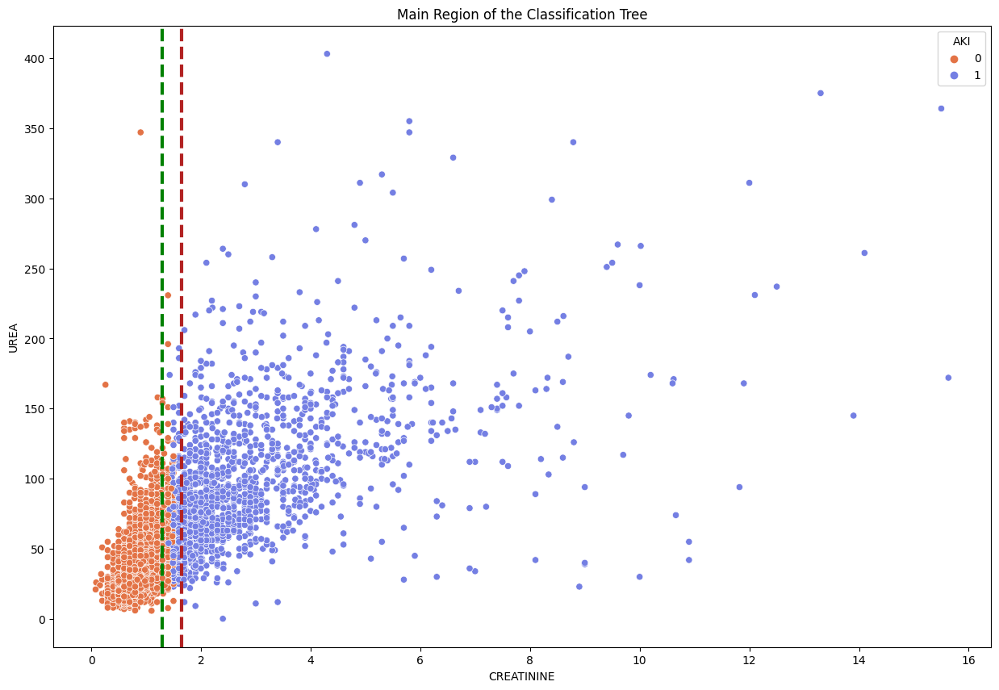

In [ ]:
# Plotting UREA and EF
df_tr_main_Xtree = pd.DataFrame()
df_tr_main_Xtree["UREA"] = df_tr_withDummies["UREA"]
df_tr_main_Xtree["CREATININE"] = df_tr_withDummies["CREATININE"]
df_tr_main_Xtree["AKI"] = df_Y_tr[y_variable]
plt.figure(figsize=(15,10))
sns.scatterplot(data=df_tr_main_Xtree, x="CREATININE", y="UREA", hue="AKI", palette=["#E37346", "#747FE3"])
plt.title("Main Region of the Classification Tree")
plt.axvline(1.3, ls='--', linewidth=3, color='green')
plt.axvline(1.65, ls='--', linewidth=3, color='firebrick')
#plt.plot([1.65,16], [1.5,2.5], ls='--', linewidth=3, color='orange')
#plt.axhline(200, ls='--', linewidth=3, color='red')

From the Scattered plot for classification tree regions of AKI we see that patients who have AKI that is “1” and who do not have AKI that is “0”, are well divided into two regions. Both having and not having AKI data merged within the dotted lines where the creatinine value is around 1.5 and most of the wrong predictions were happened here.  



####5.2.4 - GAUSSIAN NB

In [ ]:
%%time
from sklearn.naive_bayes import GaussianNB

#print(df_tr_Xscaled.shape)
#print(df_Y_tr.shape)

#print(df_tr_Xscaled.shape)
#print(df_Y_tr.shape)

# Fitting the scaled dataframe
model = GaussianNB()
model.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

# Accuracy of apply training points of the generated model
y_pred_tr = model.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted Gaussian Naives Bayes model to\
 predict TRAIN part: ',acc_train)


# Accuracy of apply all test point
y_pred_te = model.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted Gaussian Naives Bayes model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'GAUSSIAN NB', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_AKI.loc[len(acc_summary_AKI)] = new_row

display(acc_summary_AKI)


Classification Accuracy of the fitted Gaussian Naives Bayes model to predict TRAIN part:  0.9122222222222223
Classification Accuracy of the fitted Gaussian Naives Bayes model to predict TEST part:  0.9081481481481481


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.990617,0.990123
1,QDA (threshold = 0.5),0.709630,0.711111
2,CLASSIFICATION TREE (Depth = 2),0.989012,0.989136
3,GAUSSIAN NB,0.912222,0.908148


CPU times: user 48.5 ms, sys: 12 µs, total: 48.5 ms
Wall time: 53.6 ms


Based on the results above, the GAUSSIAN NAIVE BAYES fitted model presented an accuracy in the TRAIN part of 91.2%, whereas this model could predict AKI in the TEST part with 90.8% of accuracy.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of GAUSSIAN NAIVE BAYES")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model_train': 'GAUSSIAN NB', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_AKI.loc[len(trues_tr_AKI)] = new_row


# Test Part
print("CONFUSION MATRIX - TEST PART of GAUSSIAN NAIVE BAYES")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model_test': 'GAUSSIAN NB', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_AKI.loc[len(trues_te_AKI)] = new_row

display(trues_tr_AKI)
display(trues_te_AKI)

CONFUSION MATRIX - TRAIN PART of GAUSSIAN NAIVE BAYES
       No   Yes
No   6072   398
Yes   313  1317
CONFUSION MATRIX - TEST PART of GAUSSIAN NAIVE BAYES
       No  Yes
No   1514  104
Yes    82  325


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663
2,QDA (threshold = 0.5),4154,1594
3,CLASSIFICATION TREE (Depth = 2),6312,1699
4,GAUSSIAN NB,6072,1317


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421
2,QDA (threshold = 0.5),1051,389
3,CLASSIFICATION TREE (Depth = 2),1579,424
4,GAUSSIAN NB,1514,325


CONFUSION MATRIX - TRAIN PART of GAUSSIAN NAIVE BAYES


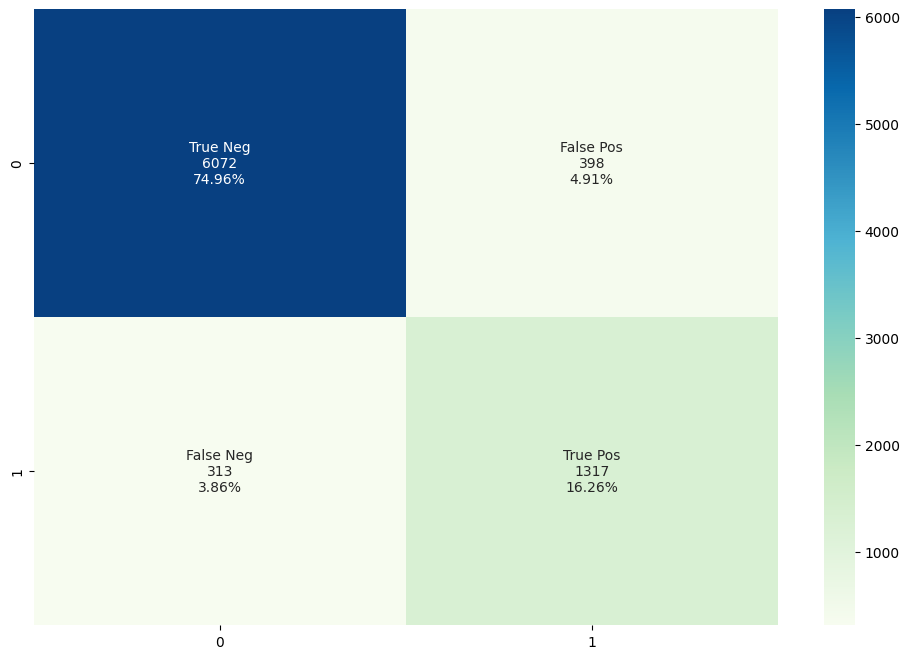

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of GAUSSIAN NAIVE BAYES")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)


For the TRAIN part, the GAUSSIAN NAIVE BAYES fitted model predicted correctly 6072 no AKI diagnostic, whereas 398 of patients without the diagnotic of AKI were wrong. In terms of predicting patients with real AKI diagnostic, 1317 were predictly correctly, where 313 were predicted incorrectly.

CONFUSION MATRIX - TEST PART of GAUSSIAN NAIVE BAYES


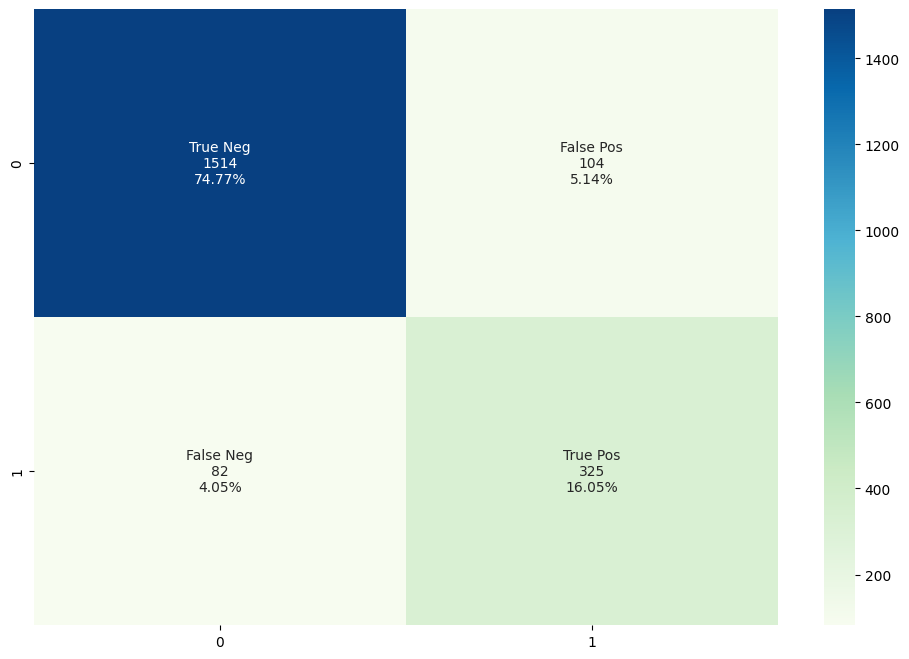

In [ ]:
print("CONFUSION MATRIX - TEST PART of GAUSSIAN NAIVE BAYES")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the GAUSSIAN NAIVE BAYES fitted model predicted correctly 1514 no AKI diagnostic, whereas 104 of patients without the diagnotic of AKI were wrong. In terms of predicting patients with real AKI diagnostic, 325 were predictly correctly, where 82 were predicted incorrectly.

####5.2.5 - SVC with GridSearchCV

For Support Vector Classifier (SVC) which two parameters (kernel and C) are inputs, it was adopted to use GridSearch to find the opimum input values.

In [ ]:
%%time
from sklearn.datasets import load_breast_cancer
from sklearn import svm
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV


# Define the parameter grid for the SVC model
#param_grid = {"C": [0.001, 0.01, 0.1, 1, 10, 100, 1000], "kernel": ["linear", "rbf", "poly"]}
parameters = {'kernel':['linear', 'rbf', 'poly'], 'C':[0.001, 0.01, 0.1, 1, 10]}


# Perform a grid search with cross-validation to find the best SVC model
#svc = SVC()
#grid_search = GridSearchCV(svc, param_grid=param_grid, cv=10,scoring = 'accuracy')

svc = svm.SVC()
cvGrid = GridSearchCV(svc, parameters, cv=5, scoring = 'accuracy')

# Fitting the model based on Train Part
cvGrid.fit(df_tr_Xscaled, np.ravel(df_Y_tr))


print("The best parameters for the Support Vector Classifier are: ", cvGrid.best_params_)

# Accuracy of apply training points of the generated model
y_pred_tr = cvGrid.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted SVC model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = cvGrid.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted SVC model to\
 predict TEST part: ',acc_test)

#plt.vlines(max(acc_te), *plt.ylim(), colors="g", linestyles="--", linewidth=3, label=f"SVC, {cvGrid.best_params_}")

# Storing the accuracies

new_row = {'ML_Model': f"SVC {cvGrid.best_params_}", 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_AKI.loc[len(acc_summary_AKI)] = new_row

display(acc_summary_AKI)

The best parameters for the Support Vector Classifier are:  {'C': 1, 'kernel': 'linear'}
Classification Accuracy of the fitted SVC model to predict TRAIN part:  0.9906172839506173
Classification Accuracy of the fitted SVC model to predict TEST part:  0.9891358024691358


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.990617,0.990123
1,QDA (threshold = 0.5),0.709630,0.711111
2,CLASSIFICATION TREE (Depth = 2),0.989012,0.989136
3,GAUSSIAN NB,0.912222,0.908148
4,"SVC {'C': 1, 'kernel': 'linear'}",0.990617,0.989136


CPU times: user 1min 2s, sys: 920 ms, total: 1min 3s
Wall time: 1min 11s


GridSearchCV indicated the best C = 1 and Kernal="linear" for SVC model. With those inputs, SVC model presented an accuracy in the TRAIN part of 99.1%, whereas this model could predict AKI in the TEST part with 98.9% of accuracy.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives

new_row = {'ML_Model_train': f"SVC {cvGrid.best_params_}", 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_AKI.loc[len(trues_tr_AKI)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model_test': f"SVC {cvGrid.best_params_}", 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_AKI.loc[len(trues_te_AKI)] = new_row

display(trues_tr_AKI)
display(trues_te_AKI)

CONFUSION MATRIX - TRAIN PART of SVC with  {'C': 1, 'kernel': 'linear'}
       No   Yes
No   6347    38
Yes    38  1677
CONFUSION MATRIX - TEST PART of SVC with  {'C': 1, 'kernel': 'linear'}
       No  Yes
No   1579    5
Yes    17  424


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663
2,QDA (threshold = 0.5),4154,1594
3,CLASSIFICATION TREE (Depth = 2),6312,1699
4,GAUSSIAN NB,6072,1317
5,"SVC {'C': 1, 'kernel': 'linear'}",6347,1677


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421
2,QDA (threshold = 0.5),1051,389
3,CLASSIFICATION TREE (Depth = 2),1579,424
4,GAUSSIAN NB,1514,325
5,"SVC {'C': 1, 'kernel': 'linear'}",1579,424


CONFUSION MATRIX - TRAIN PART of SVC with  {'C': 1, 'kernel': 'linear'}


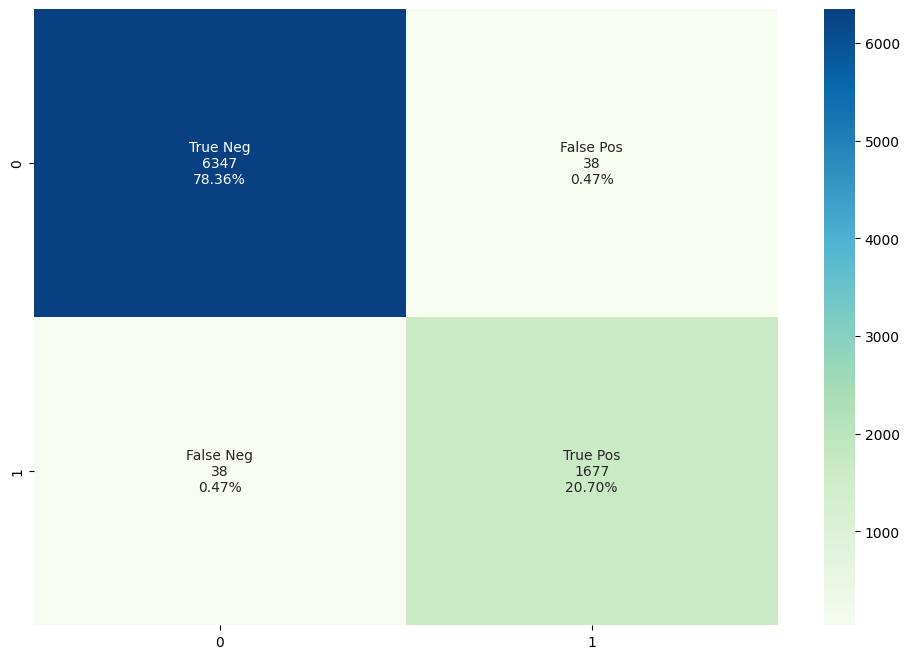

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

CONFUSION MATRIX - TEST PART of SVC with  {'C': 1, 'kernel': 'linear'}


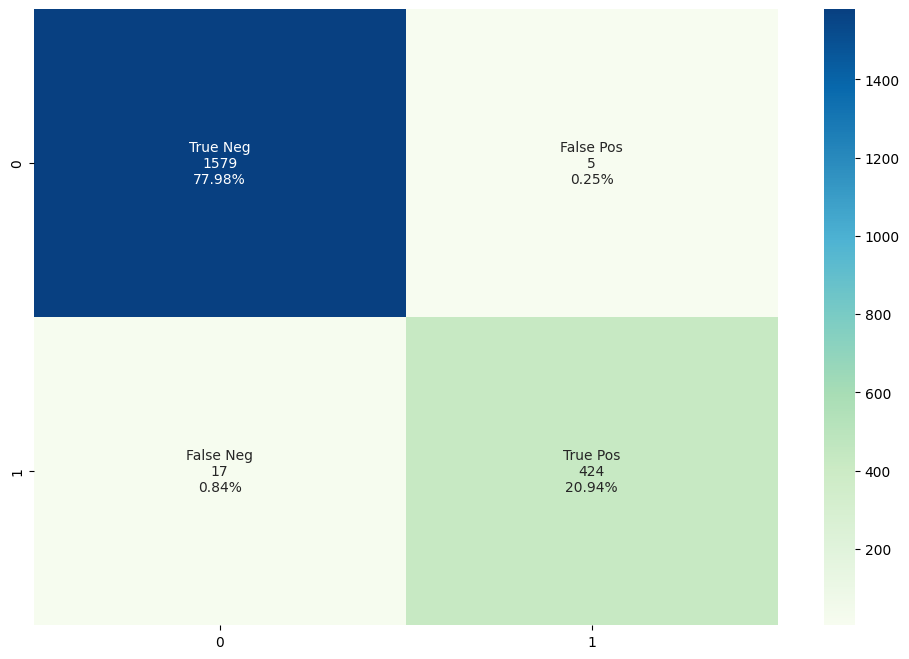

In [ ]:
print("CONFUSION MATRIX - TEST PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the SVC (with C=1 and kernel="linear") fitted model predicted correctly 1579 no AKI diagnostic, whereas 5 of patients without the diagnotic of AKI were wrong. In terms of predicting patients with real AKI diagnostic, 424 were predictly correctly, where 17 were predicted incorrectly.



In addition, it was also adopted to verify with GridSearchCV in SVC what would be the optimum number of Principal Component in PCA and respective SVC inputs (C and Kernel) to see the effect in the accuracies with reduction on the dimensions.

In [ ]:
%%time
from sklearn.datasets import load_breast_cancer
from sklearn import svm
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV


# OPTION 2 - using make_pipeline and Scalling inside
model = make_pipeline(StandardScaler(), PCA(), SVC())
param_grid = {
    "pca__n_components": [2,3,4, 5, 6, 7],
    "svc__C": [0.1, 1, 10],
    "svc__kernel": ['linear', 'rbf', 'poly']
}

cvGrid = GridSearchCV(model, param_grid=param_grid, cv=5, scoring="accuracy")

# Fitting the model based on Train Part
cvGrid.fit(df_tr_Xscaled, np.ravel(df_Y_tr))


print("The best parameters for the Support Vector Classifier are: ", cvGrid.best_params_)

# Accuracy of apply training points of the generated model
y_pred_tr = cvGrid.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted SVC model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = cvGrid.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted SVC model to\
 predict TEST part: ',acc_test)

# Storing the accuracies

new_row = {'ML_Model': f"SVC {cvGrid.best_params_}", 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_AKI.loc[len(acc_summary_AKI)] = new_row

display(acc_summary_AKI)

The best parameters for the Support Vector Classifier are:  {'pca__n_components': 7, 'svc__C': 10, 'svc__kernel': 'rbf'}
Classification Accuracy of the fitted SVC model to predict TRAIN part:  0.9364197530864198
Classification Accuracy of the fitted SVC model to predict TEST part:  0.9269135802469136


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.990617,0.990123
1,QDA (threshold = 0.5),0.709630,0.711111
2,CLASSIFICATION TREE (Depth = 2),0.989012,0.989136
3,GAUSSIAN NB,0.912222,0.908148
4,"SVC {'C': 1, 'kernel': 'linear'}",0.990617,0.989136
5,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",0.936420,0.926914


CPU times: user 8min 8s, sys: 52.1 s, total: 9min
Wall time: 8min 21s


GridSearchCV indicated the best number of Pricncipal Components of 7 and the optimum C = 10 and Kernal="rbf" for SVC model. With those inputs, SVC model presented an accuracy in the TRAIN part of 93.6%, whereas this model could predict AKI in the TEST part with 92.7% of accuracy.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives

new_row = {'ML_Model_train': f"SVC {cvGrid.best_params_}", 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}

trues_tr_AKI.loc[len(trues_tr_AKI)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)


new_row = {'ML_Model_test': f"SVC {cvGrid.best_params_}", 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}

trues_te_AKI.loc[len(trues_te_AKI)] = new_row


display(trues_tr_AKI)
display(trues_te_AKI)

CONFUSION MATRIX - TRAIN PART of SVC with  {'pca__n_components': 7, 'svc__C': 10, 'svc__kernel': 'rbf'}
       No   Yes
No   6233   363
Yes   152  1352
CONFUSION MATRIX - TEST PART of SVC with  {'pca__n_components': 7, 'svc__C': 10, 'svc__kernel': 'rbf'}
       No  Yes
No   1548  100
Yes    48  329


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663
2,QDA (threshold = 0.5),4154,1594
3,CLASSIFICATION TREE (Depth = 2),6312,1699
4,GAUSSIAN NB,6072,1317
5,"SVC {'C': 1, 'kernel': 'linear'}",6347,1677
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",6233,1352


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421
2,QDA (threshold = 0.5),1051,389
3,CLASSIFICATION TREE (Depth = 2),1579,424
4,GAUSSIAN NB,1514,325
5,"SVC {'C': 1, 'kernel': 'linear'}",1579,424
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",1548,329


CONFUSION MATRIX - TRAIN PART of SVC with  {'pca__n_components': 7, 'svc__C': 10, 'svc__kernel': 'rbf'}


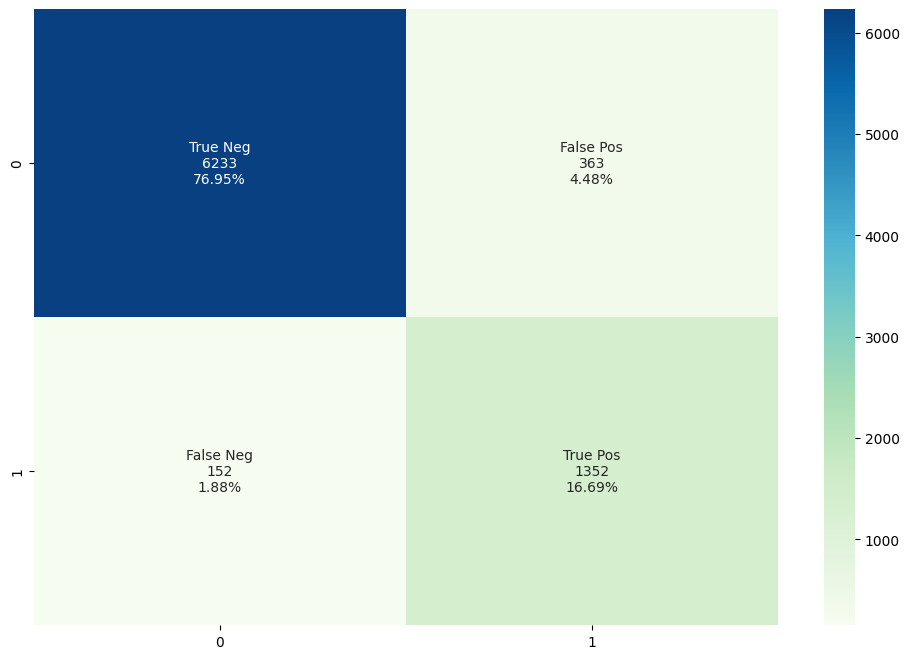

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

CONFUSION MATRIX - TEST PART of SVC with  {'pca__n_components': 7, 'svc__C': 10, 'svc__kernel': 'rbf'}


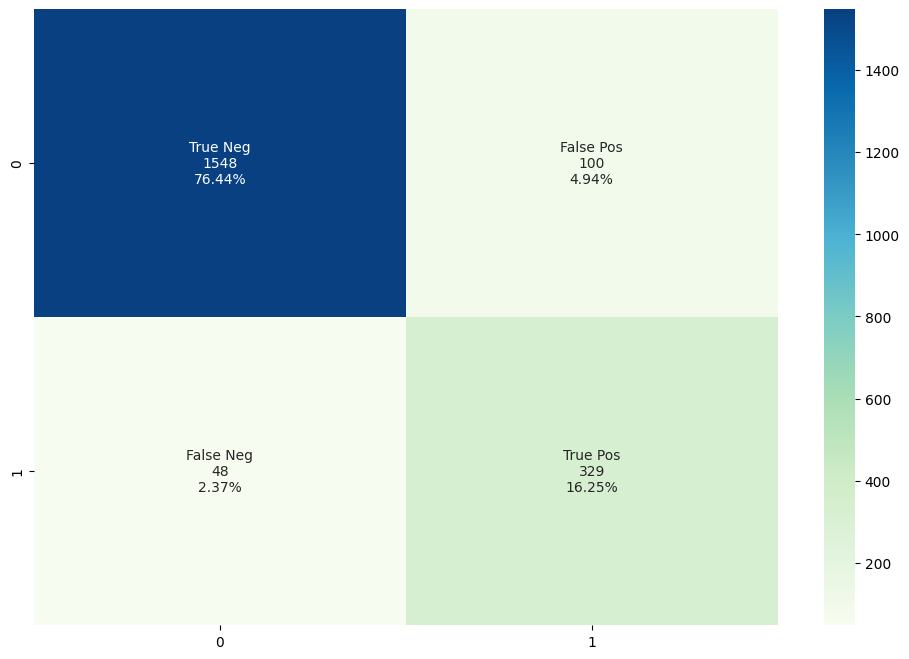

In [ ]:
print("CONFUSION MATRIX - TEST PART of SVC with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the SVC (with 7 Principal Components, C=10 and kernel="rbf") fitted model predicted correctly 1551 no AKI diagnostic, whereas 102 of patients without the diagnotic of AKI were wrong. In terms of predicting patients with real AKI diagnostic, 327 were predictly correctly, where 45 were predicted incorrectly.

####5.2.6 - KNN Classifier

For KNN Classifier that requires a selection of number of neighbors (n_neighbors) and the algorithm, it was adopted to use GridSearchCV and RandomizedSearchCV to tune the models with the best inputs that they found.

In [ ]:
%%time
from sklearn.model_selection import GridSearchCV

knn = KNeighborsClassifier()
grid_param = { 'n_neighbors' : list(range(2,21)) , 
              'algorithm' : ['auto','ball_tree','kd_tree','brute'] }
              
cvGrid = GridSearchCV(knn,grid_param,cv = 10)
cvGrid.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

#best parameter combination
print("The best parameters for the KNN Classifier are: ", cvGrid.best_params_)

#Score achieved with best parameter combination
print("Best Score:", cvGrid.best_score_)

#all combinations of hyperparameters
#print(cvGrid.cv_results_['params'])

#average scores of cross-validation
#print(cvGrid.cv_results_['mean_test_score'])

# Accuracy of apply training points of the generated model
y_pred_tr = cvGrid.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted KNN model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = cvGrid.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted KNN model to\
 predict TEST part: ',acc_test)


The best parameters for the KNN Classifier are:  {'algorithm': 'auto', 'n_neighbors': 7}
Best Score: 0.9018518518518519
Classification Accuracy of the fitted KNN model to predict TRAIN part:  0.9175308641975308
Classification Accuracy of the fitted KNN model to predict TEST part:  0.9061728395061729
CPU times: user 4min 5s, sys: 649 ms, total: 4min 6s
Wall time: 3min 52s


In [ ]:
# Storing the accuracies

new_row = {'ML_Model': f"KNN Classifier with GSCV {cvGrid.best_params_}", 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}

acc_summary_AKI.loc[len(acc_summary_AKI)] = new_row

display(acc_summary_AKI)

,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.990617,0.990123
1,QDA (threshold = 0.5),0.709630,0.711111
2,CLASSIFICATION TREE (Depth = 2),0.989012,0.989136
3,GAUSSIAN NB,0.912222,0.908148
4,"SVC {'C': 1, 'kernel': 'linear'}",0.990617,0.989136
5,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",0.936420,0.926914
6,"KNN Classifier with GSCV {'algorithm': 'auto',...",0.917531,0.906173


GridSearchCV indicated the best n_neighbors = 7 and algorithm = "auto" for KNN model. With those inputs, KNN model presented an accuracy in the TRAIN part of 91.8%, whereas this model could predict AKI in the TEST part with 90.6% of accuracy.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives

new_row = {'ML_Model_train': f"KNN Classifier with GSCV {cvGrid.best_params_}", 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}

trues_tr_AKI.loc[len(trues_tr_AKI)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)


new_row = {'ML_Model_test': f"KNN Classifier with GSCV {cvGrid.best_params_}", 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}

trues_te_AKI.loc[len(trues_te_AKI)] = new_row

display(trues_tr_AKI)
display(trues_te_AKI)

CONFUSION MATRIX - TRAIN PART of KNN model with  {'algorithm': 'auto', 'n_neighbors': 7}
       No   Yes
No   6325   608
Yes    60  1107
CONFUSION MATRIX - TEST PART of KNN model with  {'algorithm': 'auto', 'n_neighbors': 7}
       No  Yes
No   1583  177
Yes    13  252


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663
2,QDA (threshold = 0.5),4154,1594
3,CLASSIFICATION TREE (Depth = 2),6312,1699
4,GAUSSIAN NB,6072,1317
5,"SVC {'C': 1, 'kernel': 'linear'}",6347,1677
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",6233,1352
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",6325,1107


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421
2,QDA (threshold = 0.5),1051,389
3,CLASSIFICATION TREE (Depth = 2),1579,424
4,GAUSSIAN NB,1514,325
5,"SVC {'C': 1, 'kernel': 'linear'}",1579,424
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",1548,329
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",1583,252


CONFUSION MATRIX - TRAIN PART of KNN model with  {'algorithm': 'auto', 'n_neighbors': 7}


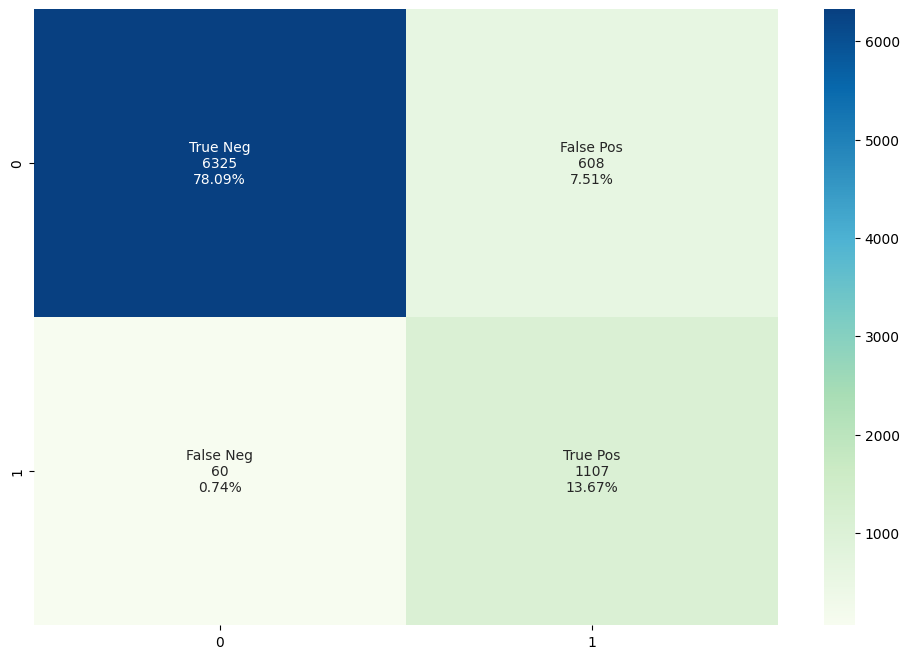

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)


CONFUSION MATRIX - TEST PART of KNN model with  {'algorithm': 'auto', 'n_neighbors': 7}


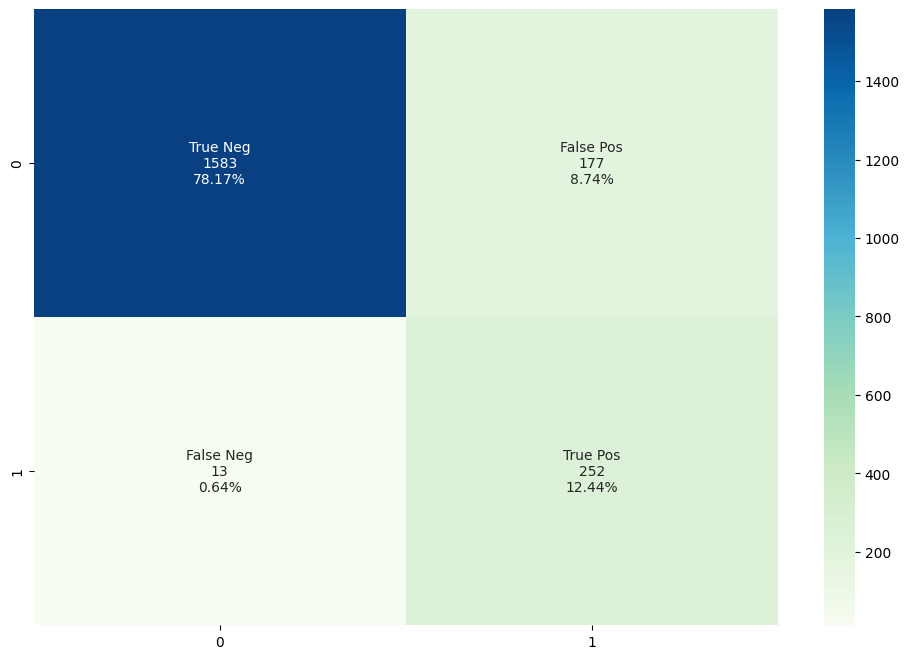

In [ ]:
print("CONFUSION MATRIX - TEST PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the KNN CLASSIFIER (with n_neighbors=7 and kernel="auto") fitted model predicted correctly 1583 no AKI diagnostic, whereas 177 of patients without the diagnotic of AKI were wrong. In terms of predicting patients with real AKI diagnostic, 252 were predictly correctly, where 13 were predicted incorrectly.

In [ ]:
%%time
from sklearn.model_selection import RandomizedSearchCV

knn = KNeighborsClassifier()
grid_param = { 'n_neighbors' : list(range(2,21)) , 
              'algorithm' : ['auto','ball_tree','kd_tree','brute'] }
              
cvGrid = RandomizedSearchCV(knn,grid_param,cv = 10)
cvGrid.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

#best parameter combination
print("The best parameters for the KNN Classifier are: ", cvGrid.best_params_)

#Score achieved with best parameter combination
print("Score achieved with best parameter for the KNN Classifier are:",cvGrid.best_score_)

#all combinations of hyperparameters
#print(cvGrid.cv_results_['params'])

#average scores of cross-validation
#print(cvGrid.cv_results_['mean_test_score'])

# Accuracy of apply training points of the generated model
y_pred_tr = cvGrid.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted KNN model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = cvGrid.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted KNN model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': f"KNN Classifier with RSCV {cvGrid.best_params_}", 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_AKI.loc[len(acc_summary_AKI)] = new_row

display(acc_summary_AKI)


The best parameters for the KNN Classifier are:  {'n_neighbors': 11, 'algorithm': 'auto'}
Score achieved with best parameter for the KNN Classifier are: 0.8992592592592594
Classification Accuracy of the fitted KNN model to predict TRAIN part:  0.909753086419753
Classification Accuracy of the fitted KNN model to predict TEST part:  0.9012345679012346


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.990617,0.990123
1,QDA (threshold = 0.5),0.709630,0.711111
2,CLASSIFICATION TREE (Depth = 2),0.989012,0.989136
3,GAUSSIAN NB,0.912222,0.908148
4,"SVC {'C': 1, 'kernel': 'linear'}",0.990617,0.989136
5,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",0.936420,0.926914
6,"KNN Classifier with GSCV {'algorithm': 'auto',...",0.917531,0.906173
7,"KNN Classifier with RSCV {'n_neighbors': 11, '...",0.909753,0.901235


CPU times: user 33.1 s, sys: 133 ms, total: 33.2 s
Wall time: 30.8 s


RandomizedSearchCV indicated the best n_neighbors = 17 and algorithm = "kd_tree" for KNN model. With those inputs, KNN model presented an accuracy in the TRAIN part of 90.4%, whereas this model could predict AKI in the TEST part with 90.2% of accuracy.

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives

new_row = {'ML_Model_train':  f"KNN Classifier with RSCV {cvGrid.best_params_}", 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_AKI.loc[len(trues_tr_AKI)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model_test': f"KNN Classifier with RSCV {cvGrid.best_params_}", 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}

trues_te_AKI.loc[len(trues_te_AKI)] = new_row

display(trues_tr_AKI)
display(trues_te_AKI)

CONFUSION MATRIX - TRAIN PART of KNN model with  {'n_neighbors': 11, 'algorithm': 'auto'}
       No   Yes
No   6336   682
Yes    49  1033
CONFUSION MATRIX - TEST PART of KNN model with  {'n_neighbors': 11, 'algorithm': 'auto'}
       No  Yes
No   1584  188
Yes    12  241


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663
2,QDA (threshold = 0.5),4154,1594
3,CLASSIFICATION TREE (Depth = 2),6312,1699
4,GAUSSIAN NB,6072,1317
5,"SVC {'C': 1, 'kernel': 'linear'}",6347,1677
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",6233,1352
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",6325,1107
8,"KNN Classifier with RSCV {'n_neighbors': 11, '...",6336,1033


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421
2,QDA (threshold = 0.5),1051,389
3,CLASSIFICATION TREE (Depth = 2),1579,424
4,GAUSSIAN NB,1514,325
5,"SVC {'C': 1, 'kernel': 'linear'}",1579,424
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",1548,329
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",1583,252
8,"KNN Classifier with RSCV {'n_neighbors': 11, '...",1584,241


CONFUSION MATRIX - TRAIN PART of KNN model with  {'n_neighbors': 11, 'algorithm': 'auto'}


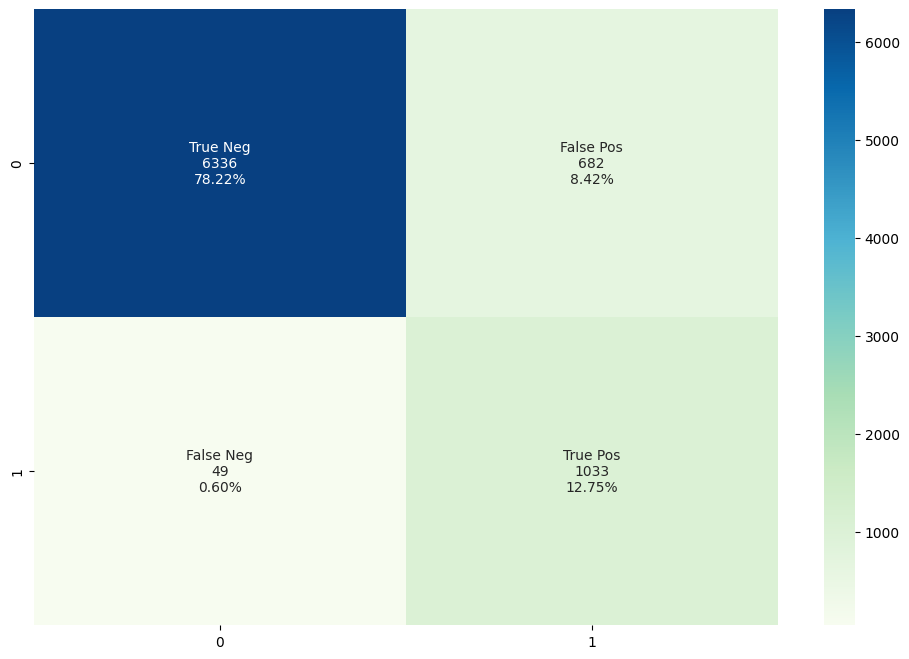

In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

CONFUSION MATRIX - TEST PART of KNN model with  {'n_neighbors': 11, 'algorithm': 'auto'}


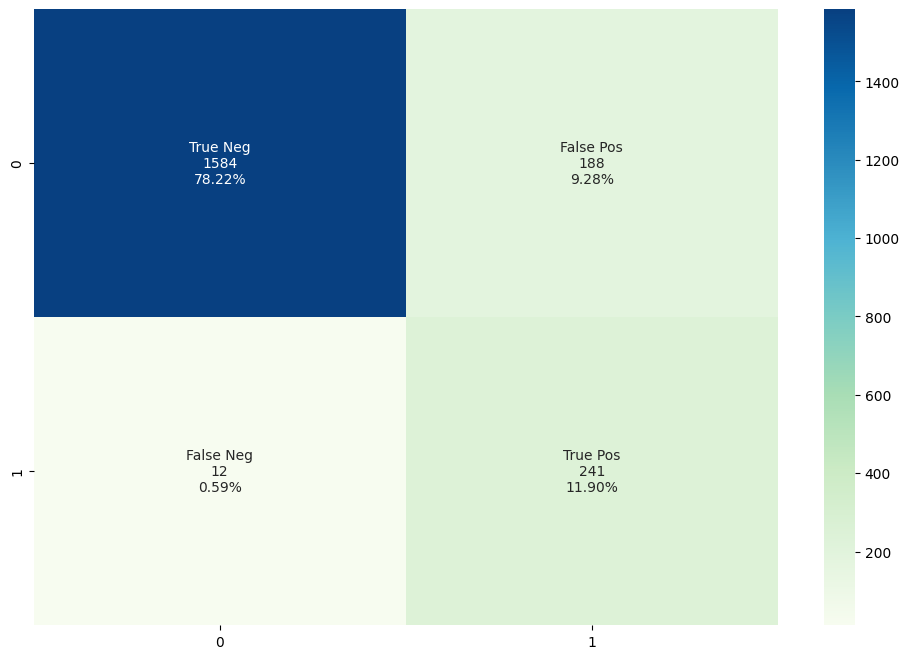

In [ ]:
print("CONFUSION MATRIX - TEST PART of KNN model with ", cvGrid.best_params_)
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the KNN CLASSIFIER (with n_neighbors=5 and algorithm = auto") fitted model predicted correctly 1579 no AKI diagnostic, whereas 171 of patients without the diagnotic of AKI were wrong. In terms of predicting patients with real AKI diagnostic, 258 were predictly correctly, where 17 were predicted incorrectly.

####5.2.7 - RANDOM FOREST CLASSIFIER

As one of the parameters of the random forest is the number of estimators (trees), it is necessary to do some sensitivity on this to determine the values of this in train part that takes the lowest Classification Rate error (OOB = out-of-bag error for model validation). For this, it was used BOOTSTRAP 50 times (just to avoid takes a long time) for each n_estimators.

(8100, 39)
(8100,)
Running the estimator 50


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.011728499166949957
Running the estimator 100


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.011412359605029287
Running the estimator 150


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.011417729256814835
Running the estimator 200


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.011438602613173865
Running the estimator 250


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.011707966000597314
Running the estimator 300


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.011633710815974085
Running the estimator 350


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.011165483688560962
Running the estimator 400


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.011520519228563564
Running the estimator 450


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.011368384452667968
Running the estimator 500


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.011984124055587797
Running the estimator 550


  0%|          | 0/50 [00:00<?, ?it/s]

12 0.011711366990991956
CPU times: user 24min 16s, sys: 5.15 s, total: 24min 22s
Wall time: 24min 41s


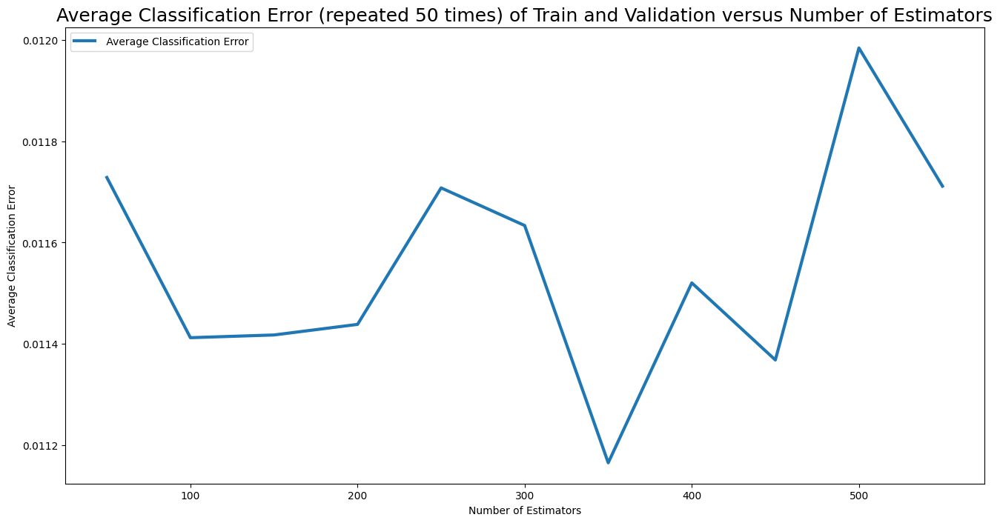

In [ ]:
%%time
from tqdm.notebook import tqdm
from sklearn .ensemble import RandomForestClassifier

# Number of estimators in Random Forest
n_estimator = np.arange(50, 600, step=50)

# Number of repetions in Bootstrap
n_repeats = 50

# Index
all_I = np.array(df_tr_Xscaled.index)
#print(all_I)


# Creating vector to storage oob (out-of-bag error) values
#oob = np.zeros((n_tr, n_repeats))
oobScores = []

#Reshaping 
X_tr_shape = df_tr_Xscaled.values[:, :-1]
y_tr_shape = df_Y_tr.values[:, -1]

print(X_tr_shape.shape)
print(y_tr_shape.shape)

# Taking the size of train part
n_tr = len(X_tr_shape)

for n in n_estimator:
  print("Running the estimator", n)

  # Vector to storage the oob value for each repetition
  oob = np.zeros((n_tr, n_repeats))

  # Bootstrap
  for j in tqdm(range(n_repeats)):
    I = np.random.choice(n_tr, size=n_tr, replace=True) # boostrap replicate
    #print(I)
    II = [i for i in np.arange(n_tr) if i not in I] # not in boostrap replicate (use for testing)
    #print(II)

    # Random Forest with the current number of estimators
    model = RandomForestClassifier(n_estimators = n)
    model.fit(X_tr_shape[I], y_tr_shape[I])
    y_pred= model.predict(X_tr_shape[II])

    # Calculating Accuracy
    oob[II, j] = accuracy_score(y_tr_shape[II], y_pred)

  # Storing Accuracy Valuesin the current BOOTSTRAP
  y_oob = oob.sum(axis=1)/np.count_nonzero(oob, axis=1)
  #print(y_oob)

  # Calculating the Average OOB in the current BOOTSTRAP
  y_oob=1-np.mean(y_oob)
  
  print(i, y_oob)

  # Storing the Average OOB for the current n_estimator
  oobScores.append(y_oob)


# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(n_estimator, oobScores, label=" Average Classification Error", lw=3)
plt.ylabel("Average Classification Error")
plt.xlabel("Number of Estimators")
plt.title("Average Classification Error (repeated 50 times) of Train and Validation versus Number of Estimators", fontsize=18)
plt.legend()
#major_ticks = np.arange(1, maxTreeDepth+1, 1)
#plt.xticks(major_ticks)

#m= nDepths[np.argmax(acc_te_by_n)] 
#print("\n optimal n_estimators:", m,"\n")

#plt.axvline(m, ls='--', linewidth=3, color='green',label=f"max acc with optimal n_estimators={m}")


Based on the results on the sensitivity of n_estimators with BOOTSTRAP in the train part, n_estimators = 350 that indicated the lowest classification error (0.01116548), and it was adopted this value to fit the model below.

In [ ]:
%%time
from sklearn .ensemble import RandomForestClassifier

# Accuracy of Train based on the results of previous sensitivity (n = 350)
acc_train = 1 - 0.2366559608035942

# Random Forest Classifier - Creating the model with the minimum error obatined with bootstrap in train part 
model = RandomForestClassifier(n_estimators = 350)
model.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

# Accuracy of apply training points of the generated model
y_pred_tr = model.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted RANDOM FOREST CLASSIFIER model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = model.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted RANDOM FOREST CLASSIFIER model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'RANDOM FOREST CLASSIFIER (n = 350)', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_AKI.loc[len(acc_summary_AKI)] = new_row

display(acc_summary_AKI)

Classification Accuracy of the fitted RANDOM FOREST CLASSIFIER model to predict TRAIN part:  1.0
Classification Accuracy of the fitted RANDOM FOREST CLASSIFIER model to predict TEST part:  0.9891358024691358


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.990617,0.990123
1,QDA (threshold = 0.5),0.709630,0.711111
2,CLASSIFICATION TREE (Depth = 2),0.989012,0.989136
3,GAUSSIAN NB,0.912222,0.908148
4,"SVC {'C': 1, 'kernel': 'linear'}",0.990617,0.989136
5,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",0.936420,0.926914
6,"KNN Classifier with GSCV {'algorithm': 'auto',...",0.917531,0.906173
7,"KNN Classifier with RSCV {'n_neighbors': 11, '...",0.909753,0.901235
8,RANDOM FOREST CLASSIFIER (n = 350),1.000000,0.989136


CPU times: user 4.57 s, sys: 19.3 ms, total: 4.59 s
Wall time: 5.61 s


In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of RANDOM FOREST CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model_train': 'RANDOM FOREST CLASSIFIER (n=350)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_AKI.loc[len(trues_tr_AKI)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of RANDOM FOREST CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model_test': 'RANDOM FOREST CLASSIFIER (n=350)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_AKI.loc[len(trues_te_AKI)] = new_row

display(trues_tr_AKI)
display(trues_te_AKI)

CONFUSION MATRIX - TRAIN PART of RANDOM FOREST CLASSIFIER model
       No   Yes
No   6385     0
Yes     0  1715
CONFUSION MATRIX - TEST PART of RANDOM FOREST CLASSIFIER model
       No  Yes
No   1577    3
Yes    19  426


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663
2,QDA (threshold = 0.5),4154,1594
3,CLASSIFICATION TREE (Depth = 2),6312,1699
4,GAUSSIAN NB,6072,1317
5,"SVC {'C': 1, 'kernel': 'linear'}",6347,1677
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",6233,1352
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",6325,1107
8,"KNN Classifier with RSCV {'n_neighbors': 11, '...",6336,1033
9,RANDOM FOREST CLASSIFIER (n=350),6385,1715


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421
2,QDA (threshold = 0.5),1051,389
3,CLASSIFICATION TREE (Depth = 2),1579,424
4,GAUSSIAN NB,1514,325
5,"SVC {'C': 1, 'kernel': 'linear'}",1579,424
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",1548,329
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",1583,252
8,"KNN Classifier with RSCV {'n_neighbors': 11, '...",1584,241
9,RANDOM FOREST CLASSIFIER (n=350),1577,426


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663
2,QDA (threshold = 0.5),4154,1594
3,CLASSIFICATION TREE (Depth = 2),6312,1699
4,GAUSSIAN NB,6072,1317
5,"SVC {'C': 1, 'kernel': 'linear'}",6347,1677
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",6233,1352
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",6325,1107
8,"KNN Classifier with RSCV {'n_neighbors': 11, '...",6336,1033
9,RANDOM FOREST CLASSIFIER (n=350),6385,1715


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421
2,QDA (threshold = 0.5),1051,389
3,CLASSIFICATION TREE (Depth = 2),1579,424
4,GAUSSIAN NB,1514,325
5,"SVC {'C': 1, 'kernel': 'linear'}",1579,424
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",1548,329
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",1583,252
8,"KNN Classifier with RSCV {'n_neighbors': 11, '...",1584,241
9,RANDOM FOREST CLASSIFIER (n=350),1577,426


CONFUSION MATRIX - TEST PART of RANDOM CLASSIFIER model


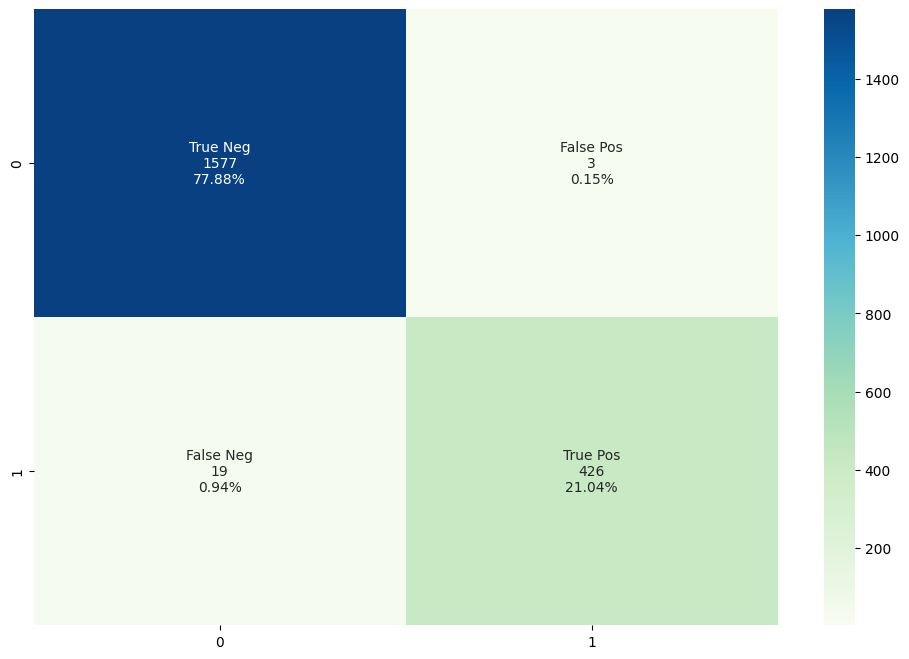

In [ ]:
display(trues_tr_AKI)
display(trues_te_AKI)

print("CONFUSION MATRIX - TEST PART of RANDOM CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the RANDOM FOREST CLASSIFIER (with n_estimator=350) fitted model predicted correctly 1577 no AKI diagnostic, whereas 3 of patients without the diagnotic of AKI were wrong. In terms of predicting patients with real AKI diagnostic, 426 were predictly correctly, where 19 were predicted incorrectly.

In [ ]:
# Plotting the variables based on the importance
plt.figure(figsize=(10,10))
plt.barh(np.arange(len(x_variables_withDummies)), model.feature_importances_, color = "red")
plt.yticks(ticks=np.arange(len(x_variables_withDummies)), labels=x_variables_withDummies)
plt.title("Importance of Explanatory Variable in RANDOM FOREST CLASSIFIER")
plt.show()

For RANDOM FOREST CLASSIFIER, all the variables have some importance, CREATININE continues in the top, and others not extremelly significant as Classification Tree indicated.

####5.2.8 - GRADIENT BOOSTING CLASSIFIER

For GRADIENT BOOSTING CLASSIFIER that requires the number of estimators as input, it was done initially a sensitivity on this.

In [ ]:
%%time
from sklearn .ensemble  import GradientBoostingClassifier

nEstimator = np.arange(10, 150, step=10)

len(nEstimator)
 
# Arrays to storage accuracy 
acc_train_by_n = []
acc_te_by_n = []

for i in nEstimator :
  model = GradientBoostingClassifier(n_estimators=i)
  model.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

  # Checking accuracy of Train
  y_pred_tr = model.predict(df_tr_Xscaled)
  acc_train = accuracy_score(df_Y_tr, y_pred_tr)

  acc_train_by_n.append(acc_train)

  # Accuracy of apply all test point
  y_pred_te = model.predict(df_te_Xscaled)
  acc_test = accuracy_score(df_Y_te, y_pred_te)

  acc_te_by_n.append(acc_test)

  # Just to print the summary of each iteraction (number of estimators)
  print(i, acc_train, acc_test)


10 0.9875308641975309 0.9891358024691358
20 0.9917283950617284 0.988641975308642
30 0.9920987654320987 0.9891358024691358
40 0.9919753086419754 0.9891358024691358
50 0.9928395061728396 0.9891358024691358
60 0.9934567901234568 0.9891358024691358
70 0.9953086419753087 0.9876543209876543
80 0.9958024691358025 0.9881481481481481
90 0.9969135802469136 0.988641975308642
100 0.9974074074074074 0.9881481481481481
110 0.9979012345679013 0.988641975308642
120 0.9982716049382716 0.988641975308642
130 0.998641975308642 0.9881481481481481
140 0.9987654320987654 0.9876543209876543
CPU times: user 21.9 s, sys: 36.6 ms, total: 21.9 s
Wall time: 22.2 s


CPU times: user 40.5 ms, sys: 9.01 ms, total: 49.6 ms
Wall time: 44.9 ms


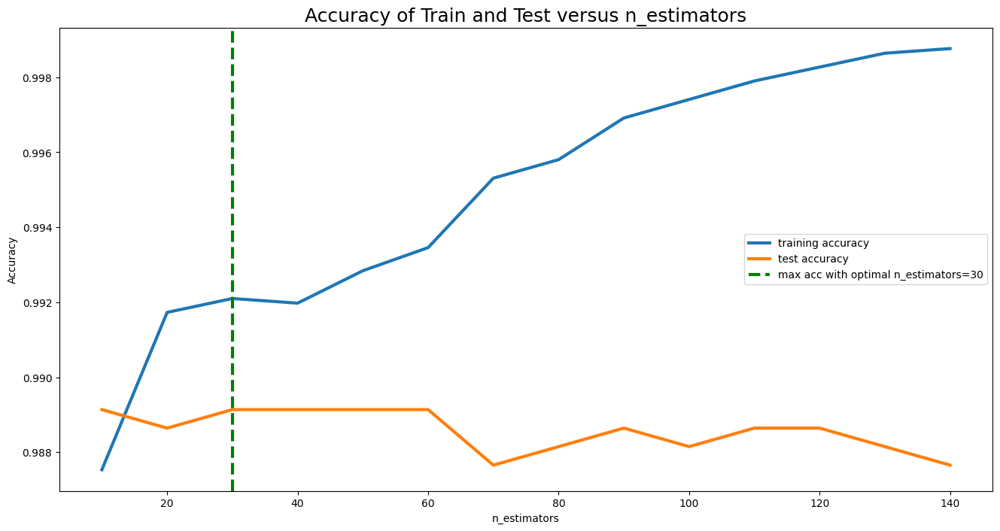

In [ ]:
%%time
# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(nEstimator, acc_train_by_n, label="training accuracy", lw=3)
plt.plot(nEstimator, acc_te_by_n, label="test accuracy", lw=3)
plt.axvline(30, ls='--', linewidth=3, color='green',label=f"max acc with optimal n_estimators={30}")

plt.ylabel("Accuracy")
plt.xlabel("n_estimators")
plt.title("Accuracy of Train and Test versus n_estimators", fontsize=18)
plt.legend()
#major_ticks = np.arange(1, maxTreeDepth+1, 1)
#plt.xticks(major_ticks)

Based on the plot above, the n_estimateor 30 to 60 showing same testing accuracy whereas training accuracy is increasing whcih indicate the higher estimator number will overfit the model. Hence, we took the n_estimators = 30 that indicated the highest accuracy in the test part for GRADIENT BOOSTING CLASSIFIER and this number was used for fitting the model as below.

In [ ]:
%%time
from sklearn .ensemble  import GradientBoostingClassifier

# GRADIENT BOOSTING Classifier - Creating the model
model = GradientBoostingClassifier(n_estimators = 30)
model.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

# Accuracy of apply training points of the generated model
y_pred_tr = model.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted GRADIENT BOOSTING CLASSIFIER model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = model.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted GRADIENT BOOSTING CLASSIFIER model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'GRADIENT BOOSTING CLASSIFIER (n=30)', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_AKI.loc[len(acc_summary_AKI)] = new_row

display(acc_summary_AKI)

Classification Accuracy of the fitted GRADIENT BOOSTING CLASSIFIER model to predict TRAIN part:  0.9920987654320987
Classification Accuracy of the fitted GRADIENT BOOSTING CLASSIFIER model to predict TEST part:  0.9891358024691358


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.990617,0.990123
1,QDA (threshold = 0.5),0.709630,0.711111
2,CLASSIFICATION TREE (Depth = 2),0.989012,0.989136
3,GAUSSIAN NB,0.912222,0.908148
4,"SVC {'C': 1, 'kernel': 'linear'}",0.990617,0.989136
5,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",0.936420,0.926914
6,"KNN Classifier with GSCV {'algorithm': 'auto',...",0.917531,0.906173
7,"KNN Classifier with RSCV {'n_neighbors': 11, '...",0.909753,0.901235
8,RANDOM FOREST CLASSIFIER (n = 350),1.000000,0.989136
9,GRADIENT BOOSTING CLASSIFIER (n=30),0.992099,0.989136


CPU times: user 844 ms, sys: 8.54 ms, total: 853 ms
Wall time: 2.19 s


In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of GRADIENT BOOSTING CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model_train': 'GRADIENT BOOSTING CLASSIFIER (n=30)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_AKI.loc[len(trues_tr_AKI)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of GRADIENT BOOSTING CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model_test': 'GRADIENT BOOSTING CLASSIFIER (n=30)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_AKI.loc[len(trues_te_AKI)] = new_row

display(trues_tr_AKI)
display(trues_te_AKI)

CONFUSION MATRIX - TRAIN PART of GRADIENT BOOSTING CLASSIFIER model
       No   Yes
No   6334    13
Yes    51  1702
CONFUSION MATRIX - TEST PART of GRADIENT BOOSTING CLASSIFIER model
       No  Yes
No   1577    3
Yes    19  426


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663
2,QDA (threshold = 0.5),4154,1594
3,CLASSIFICATION TREE (Depth = 2),6312,1699
4,GAUSSIAN NB,6072,1317
5,"SVC {'C': 1, 'kernel': 'linear'}",6347,1677
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",6233,1352
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",6325,1107
8,"KNN Classifier with RSCV {'n_neighbors': 11, '...",6336,1033
9,RANDOM FOREST CLASSIFIER (n=350),6385,1715


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421
2,QDA (threshold = 0.5),1051,389
3,CLASSIFICATION TREE (Depth = 2),1579,424
4,GAUSSIAN NB,1514,325
5,"SVC {'C': 1, 'kernel': 'linear'}",1579,424
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",1548,329
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",1583,252
8,"KNN Classifier with RSCV {'n_neighbors': 11, '...",1584,241
9,RANDOM FOREST CLASSIFIER (n=350),1577,426


CONFUSION MATRIX - TEST PART of GRADIENT BOOSTING model


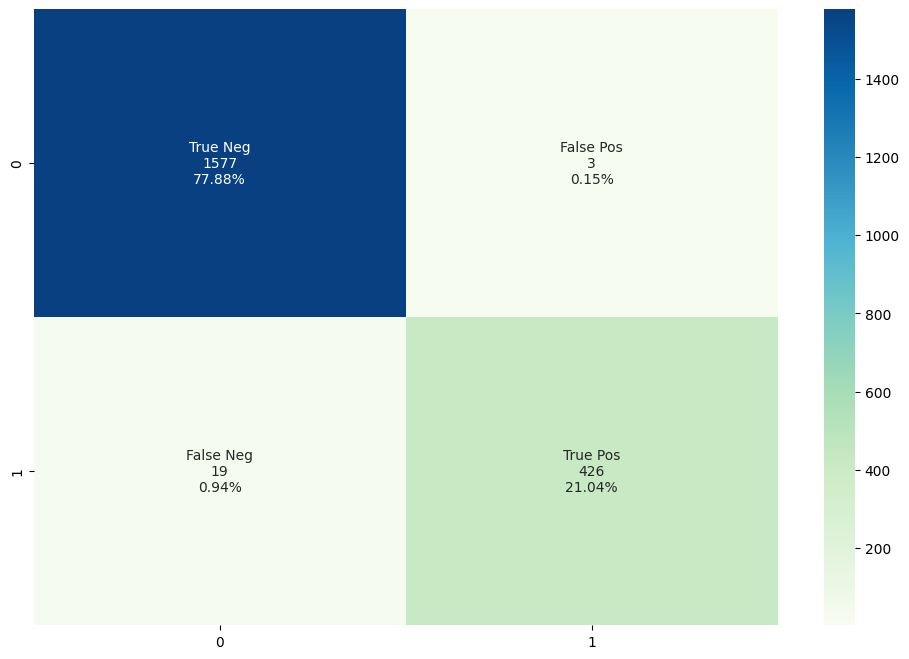

In [ ]:
print("CONFUSION MATRIX - TEST PART of GRADIENT BOOSTING model")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the GRADIENT BOOSTING CLASSIFIER (with n_estimator=30) fitted model predicted correctly 1577 no AKI diagnostic, whereas 3 of patients without the diagnotic of AKI were wrong. In terms of predicting patients with real AKI diagnostic, 426 were predictly correctly, where 19 were predicted incorrectly.

In [ ]:
# Plotting the variables based on the importance
plt.figure(figsize=(10,10))
plt.barh(np.arange(len(x_variables_withDummies)), model.feature_importances_, color = "red")
plt.yticks(ticks=np.arange(len(x_variables_withDummies)), labels=x_variables_withDummies)
plt.title("Importance of Explanatory Variable in GRADIENT BOOSTING CLASSIFIER")
plt.show()

For GRADIENT BOOSTING CLASSIFIER, Creatinine is the most important explanatory variables. However, less variables are significant compared with RANDOM FOREST, but more than CLASSIFICATION TREE.

####5.2.9 - BAGGING CLASSIFIER

Similar what was done RANDOM FOREST CLASSIFIER, it was done initially in BAGGING CLASSIFIER a sensitivity in the number of estimators with BOOTSTRAP in train part.

In [ ]:
%%time
from tqdm.notebook import tqdm
from sklearn .ensemble  import BaggingClassifier

# Number of estimators in Random Forest
n_estimator = np.arange(10, 210, step=20)

# Number of repetions in Bootstrap
n_repeats = 50

# Index
all_I = np.array(df_tr_Xscaled.index)
#print(all_I)


# Creating vector to storage oob (out-of-bag error) values
#oob = np.zeros((n_tr, n_repeats))
oobScores = []

#Reshaping 
X_tr_shape = df_tr_Xscaled.values[:, :-1]
y_tr_shape = df_Y_tr.values[:, -1]

print(X_tr_shape.shape)
print(y_tr_shape.shape)

# Taking the size of train part
n_tr = len(X_tr_shape)

for n in n_estimator:
  print("Running the estimator", n)

  # Vector to storage the oob value for each repetition
  oob = np.zeros((n_tr, n_repeats))

  # Bootstrap
  for j in tqdm(range(n_repeats)):
    I = np.random.choice(n_tr, size=n_tr, replace=True) # boostrap replicate
    #print(I)
    II = [i for i in np.arange(n_tr) if i not in I] # not in boostrap replicate (use for testing)
    #print(II)

    # Random Forest with the current number of estimators
    model = BaggingClassifier(n_estimators = n)
    model.fit(X_tr_shape[I], y_tr_shape[I])
    y_pred= model.predict(X_tr_shape[II])

    # Calculating Accuracy
    oob[II, j] = accuracy_score(y_tr_shape[II], y_pred)

  # Storing Accuracy Valuesin the current BOOTSTRAP
  y_oob = oob.sum(axis=1)/np.count_nonzero(oob, axis=1)
  #print(y_oob)

  # Calculating the Average OOB in the current BOOTSTRAP
  y_oob=1-np.mean(y_oob)
  
  print(i, y_oob)

  # Storing the Average OOB for the current n_estimator
  oobScores.append(y_oob)



(8100, 39)
(8100,)
Running the estimator 10


  0%|          | 0/50 [00:00<?, ?it/s]

140 0.012708648846918469
Running the estimator 30


  0%|          | 0/50 [00:00<?, ?it/s]

140 0.012343975846328625
Running the estimator 50


  0%|          | 0/50 [00:00<?, ?it/s]

140 0.012053654038828965
Running the estimator 70


  0%|          | 0/50 [00:00<?, ?it/s]

140 0.012647792669447822
Running the estimator 90


  0%|          | 0/50 [00:00<?, ?it/s]

140 0.012689683412745234
Running the estimator 110


  0%|          | 0/50 [00:00<?, ?it/s]

140 0.012462589852582306
Running the estimator 130


  0%|          | 0/50 [00:00<?, ?it/s]

140 0.012573570532406597
Running the estimator 150


  0%|          | 0/50 [00:00<?, ?it/s]

140 0.012158752285184038
Running the estimator 170


  0%|          | 0/50 [00:00<?, ?it/s]

140 0.012202384393537935
Running the estimator 190


  0%|          | 0/50 [00:00<?, ?it/s]

140 0.012325417201314859
CPU times: user 12min 39s, sys: 2.58 s, total: 12min 41s
Wall time: 12min 54s


CPU times: user 40.8 ms, sys: 4.93 ms, total: 45.8 ms
Wall time: 50.5 ms


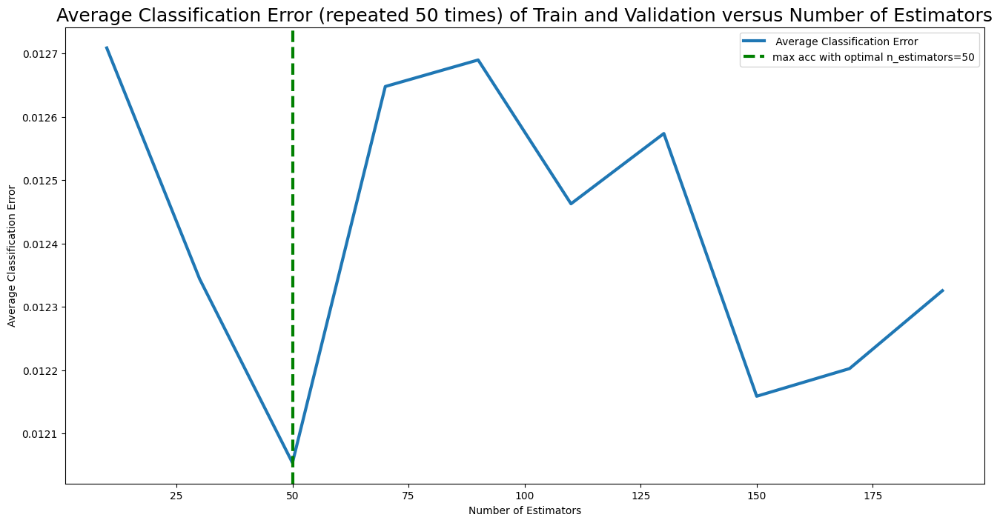

In [ ]:
%%time

# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(n_estimator, oobScores, label=" Average Classification Error", lw=3)
#plt.axvline(50, ls='--', linewidth=3, color='green',label=f"max acc with optimal n_estimators={50}")
plt.ylabel("Average Classification Error")
plt.xlabel("Number of Estimators")
plt.title("Average Classification Error (repeated 50 times) of Train and Validation versus Number of Estimators", fontsize=18)
plt.legend()
#major_ticks = np.arange(1, maxTreeDepth+1, 1)
#plt.xticks(major_ticks)

Based on the plot above, BAGGING CLASSIFIER with n_estimator = 50 that presented the lowest Classification Error. For this reason, it was taken this value for fitting the final BAGGING CLASSIFIER model.

In [ ]:
%%time

from sklearn .ensemble  import BaggingClassifier

# BAGGING Classifier - Creating the model
model = BaggingClassifier(n_estimators = 50)
model.fit(df_tr_Xscaled, np.ravel(df_Y_tr))

# Accuracy of apply training points of the generated model
y_pred_tr = model.predict(df_tr_Xscaled)
acc_train = accuracy_score(df_Y_tr, y_pred_tr)
print('Classification Accuracy of the fitted BAGGING CLASSIFIER model to\
 predict TRAIN part: ',acc_train)

# Accuracy of apply all test point
y_pred_te = model.predict(df_te_Xscaled)
acc_test = accuracy_score(df_Y_te, y_pred_te)
print('Classification Accuracy of the fitted BAGGING CLASSIFIER model to\
 predict TEST part: ',acc_test)

# Storing the accuracies
new_row = {'ML_Model': 'BAGGING CLASSIFIER (n=50)', 'Accuracy_Tr':acc_train, 'Accuracy_Te': acc_test}
acc_summary_AKI.loc[len(acc_summary_AKI)] = new_row

display(acc_summary_AKI)

Classification Accuracy of the fitted BAGGING CLASSIFIER model to predict TRAIN part:  1.0
Classification Accuracy of the fitted BAGGING CLASSIFIER model to predict TEST part:  0.988641975308642


,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.990617,0.990123
1,QDA (threshold = 0.5),0.709630,0.711111
2,CLASSIFICATION TREE (Depth = 2),0.989012,0.989136
3,GAUSSIAN NB,0.912222,0.908148
4,"SVC {'C': 1, 'kernel': 'linear'}",0.990617,0.989136
5,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",0.936420,0.926914
6,"KNN Classifier with GSCV {'algorithm': 'auto',...",0.917531,0.906173
7,"KNN Classifier with RSCV {'n_neighbors': 11, '...",0.909753,0.901235
8,RANDOM FOREST CLASSIFIER (n = 350),1.000000,0.989136
9,GRADIENT BOOSTING CLASSIFIER (n=30),0.992099,0.989136


CPU times: user 1.12 s, sys: 12.6 ms, total: 1.14 s
Wall time: 2.39 s


In [ ]:
# Generating Confusion matrix
print("CONFUSION MATRIX - TRAIN PART of BAGGING CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

# Storing the amount of True Negatives and positives
new_row = {'ML_Model_train': 'BAGGING CLASSIFIER (n=50)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_tr_AKI.loc[len(trues_tr_AKI)] = new_row


# TEST Part
print("CONFUSION MATRIX - TEST PART of BAGGING CLASSIFIER model")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])
print(cm)

new_row = {'ML_Model_test': 'BAGGING CLASSIFIER (n=50)', 'True_Negative':cm.loc['No','No'], 'True_Positive': cm.loc['Yes','Yes']}
trues_te_AKI.loc[len(trues_te_AKI)] = new_row

display(trues_tr_AKI)
display(trues_te_AKI)

CONFUSION MATRIX - TRAIN PART of BAGGING CLASSIFIER model
       No   Yes
No   6385     0
Yes     0  1715
CONFUSION MATRIX - TEST PART of BAGGING CLASSIFIER model
       No  Yes
No   1575    2
Yes    21  427


,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663
2,QDA (threshold = 0.5),4154,1594
3,CLASSIFICATION TREE (Depth = 2),6312,1699
4,GAUSSIAN NB,6072,1317
5,"SVC {'C': 1, 'kernel': 'linear'}",6347,1677
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",6233,1352
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",6325,1107
8,"KNN Classifier with RSCV {'n_neighbors': 11, '...",6336,1033
9,RANDOM FOREST CLASSIFIER (n=350),6385,1715


,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421
2,QDA (threshold = 0.5),1051,389
3,CLASSIFICATION TREE (Depth = 2),1579,424
4,GAUSSIAN NB,1514,325
5,"SVC {'C': 1, 'kernel': 'linear'}",1579,424
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",1548,329
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",1583,252
8,"KNN Classifier with RSCV {'n_neighbors': 11, '...",1584,241
9,RANDOM FOREST CLASSIFIER (n=350),1577,426


CONFUSION MATRIX - TRAIN PART of BAGGING model


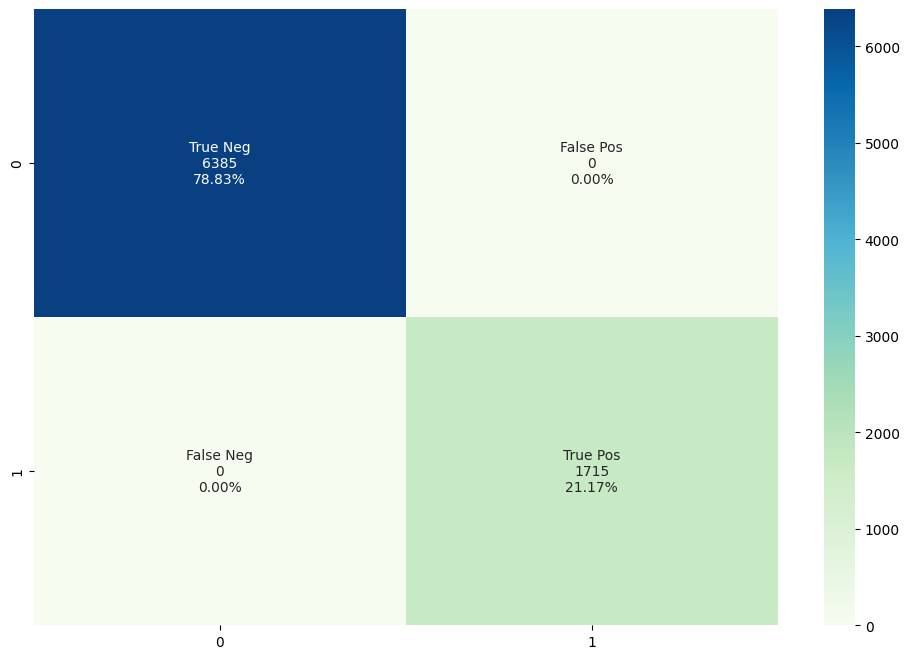

In [ ]:
print("CONFUSION MATRIX - TRAIN PART of BAGGING model")
cm = pd.DataFrame(confusion_matrix(df_Y_tr, y_pred_tr).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

CONFUSION MATRIX - TEST PART of BAGGING model


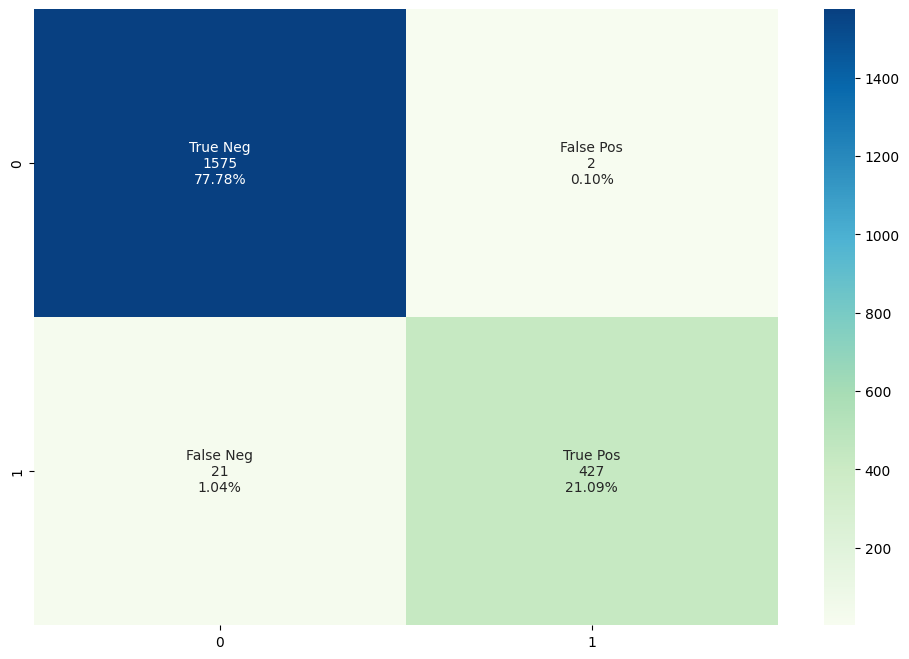

In [ ]:
print("CONFUSION MATRIX - TEST PART of BAGGING model")
cm = pd.DataFrame(confusion_matrix(df_Y_te, y_pred_te).T, index=['No', 'Yes'], columns=['No', 'Yes'])

# Calling the function to plot Conf Matrix.
confMatrixPlot(cm)

For the TEST part, the BAGGING CLASSIFIER (with n_estimator=50) fitted model predicted correctly 1575 no AKI diagnostic, whereas 2 of patients without the diagnotic of AKI were wrong. In terms of predicting patients with real AKI diagnostic, 427 were predictly correctly, where 21 were predicted incorrectly.

###5.3 - SUMMARY OF ML MODELs FOR PREDICTING AKI (Acute Kidney Injury)

In [ ]:
#Colab includes an extension that renders pandas dataframes into interactive displays that can be filtered, sorted, and explored dynamically.

#Data table display for Pandas dataframes can be enabled by running:

from google.colab import data_table
data_table.enable_dataframe_formatter()



In [ ]:
#and disabled by running

#from google.colab import data_table
#data_table.disable_dataframe_formatter()

This sections shows the summary of all the fitted model done for AKI response variable.

,ML_Model,Accuracy_Tr,Accuracy_Te
0,LOGISTIC REGRESSION,0.990617,0.990123
1,QDA (threshold = 0.5),0.709630,0.711111
2,CLASSIFICATION TREE (Depth = 2),0.989012,0.989136
3,GAUSSIAN NB,0.912222,0.908148
4,"SVC {'C': 1, 'kernel': 'linear'}",0.990617,0.989136
5,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",0.936420,0.926914
6,"KNN Classifier with GSCV {'algorithm': 'auto',...",0.917531,0.906173
7,"KNN Classifier with RSCV {'n_neighbors': 11, '...",0.909753,0.901235
8,RANDOM FOREST CLASSIFIER (n = 350),1.000000,0.989136
9,GRADIENT BOOSTING CLASSIFIER (n=30),0.992099,0.989136


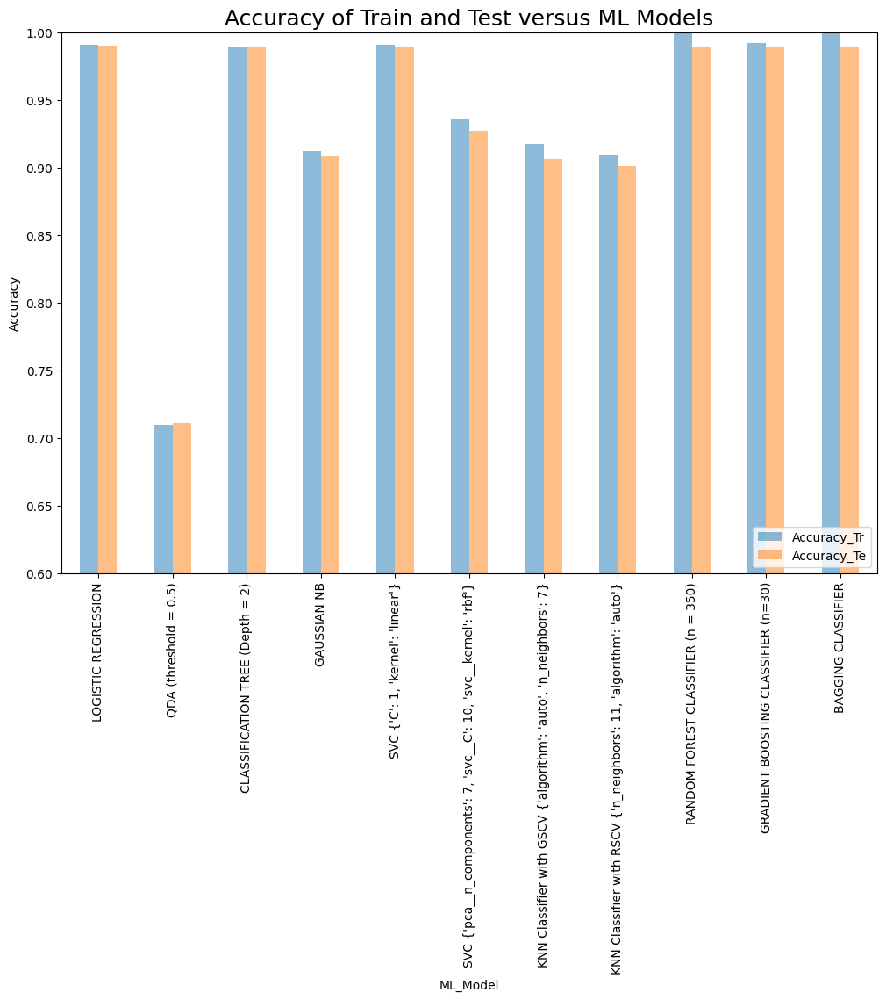

In [ ]:
# Plotting the Accuracy of Train and Test ML model
display(acc_summary_AKI)


ax = acc_summary_AKI.plot.bar(rot = 90, x="ML_Model", alpha=0.5)
ax.set_ylim([0.6,1])
#ax.grid(True)

plt.ylabel("Accuracy")
#plt.xlabel("ML Models")
plt.title("Accuracy of Train and Test versus ML Models", fontsize=18)
plt.legend( loc='lower right')
plt.show()



Based on the bar plot above, it is possible to verify that RANDOM FOREST with n_estimator = 350 and BAGGING CLASSIFIER (n_estimator = 50) indicated the best performance on the TRAIN part ( 100% test accuracy), but for the TEST part, the RANDOM FOREST with n_estimator = 350, GRADIENT BOOSTING CLASSIFIER with n_estimator = 30, Classification Tree, GridSerchCV SVC, Bagging classifier all shows 98.9% test accuracy and LOGISTIC REGRESSION (99.01% test accuracy) are the top 6 models.

However, if we consider the run time, then logistic regression model is best.

In addition, QDA presented the worst overall performance (71.1% test accuracy) in our analysis. 


Summary given below

In [ ]:
from google.colab import files
from IPython.display import Image

uploaded = files.upload()

Saving Summary of AKI Models.png to Summary of AKI Models.png


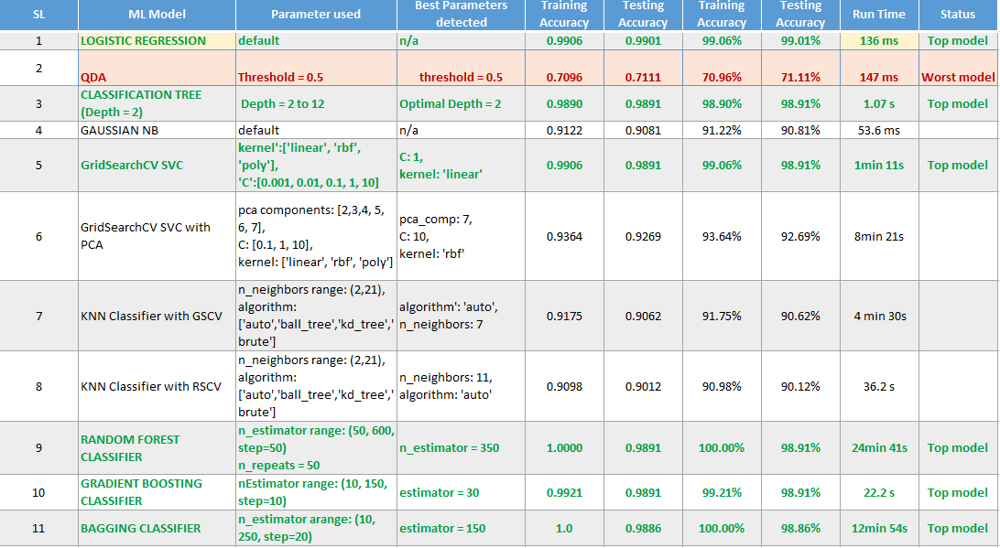

In [ ]:

Image('Summary of AKI Models.png')

Summary of True Negatives and Positives obatined in Train Part for each ML model

,ML_Model_train,True_Negative,True_Positive
0,REAL - TRAIN PART,6385,1715
1,LOGISTIC REGRESSION,6361,1663
2,QDA (threshold = 0.5),4154,1594
3,CLASSIFICATION TREE (Depth = 2),6312,1699
4,GAUSSIAN NB,6072,1317
5,"SVC {'C': 1, 'kernel': 'linear'}",6347,1677
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",6233,1352
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",6325,1107
8,"KNN Classifier with RSCV {'n_neighbors': 11, '...",6336,1033
9,RANDOM FOREST CLASSIFIER (n=350),6385,1715


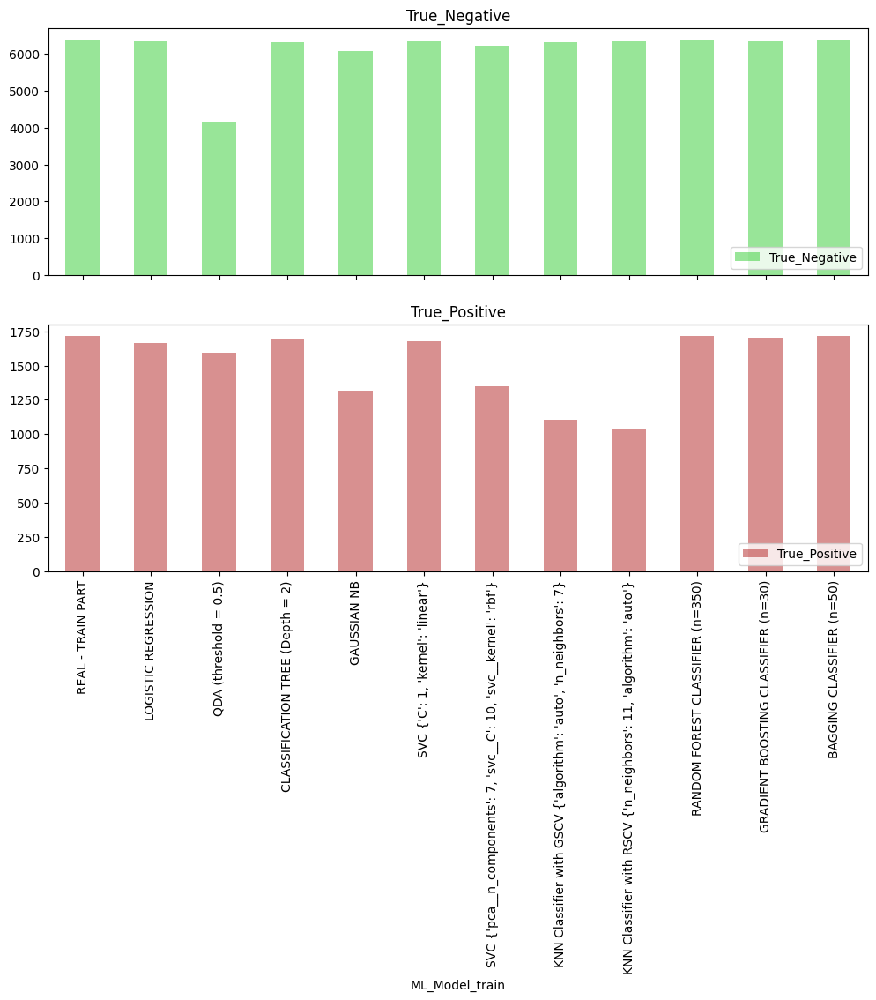

In [ ]:
# Plotting True Negatives and Positives obatined in Train Part for each ML model
display(trues_tr_AKI)

axes = trues_tr_AKI.plot.bar(
    rot = 90, subplots=True, 
    x="ML_Model_train",
    color={"True_Negative": "limegreen","True_Positive": "firebrick"},
     alpha=0.5
)
axes[1].legend(loc="lower right")
axes[0].legend(loc="lower right")



Summary of True Negatives and Positives obatined in Test Part for each ML model

,ML_Model_test,True_Negative,True_Positive
0,REAL - TEST PART,1596,429
1,LOGISTIC REGRESSION,1584,421
2,QDA (threshold = 0.5),1051,389
3,CLASSIFICATION TREE (Depth = 2),1579,424
4,GAUSSIAN NB,1514,325
5,"SVC {'C': 1, 'kernel': 'linear'}",1579,424
6,"SVC {'pca__n_components': 7, 'svc__C': 10, 'sv...",1548,329
7,"KNN Classifier with GSCV {'algorithm': 'auto',...",1583,252
8,"KNN Classifier with RSCV {'n_neighbors': 11, '...",1584,241
9,RANDOM FOREST CLASSIFIER (n=350),1577,426


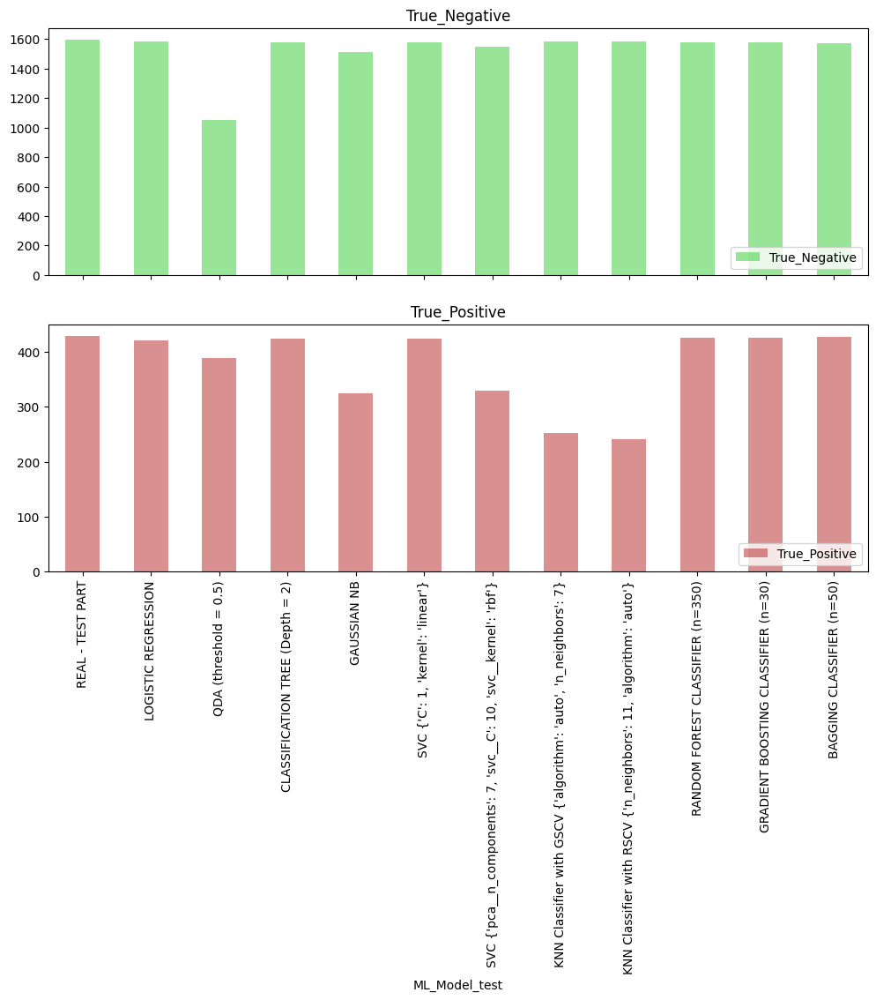

In [ ]:
# Plotting True Negatives and Positives obatined in TEST Part for each ML model

# Plotting True Negatives and Positives obatined in Test Part for each ML model
display(trues_te_AKI)



axes = trues_te_AKI.plot.bar(
    rot = 90, subplots=True, 
    x="ML_Model_test",
    color={"True_Negative": "limegreen","True_Positive": "firebrick"},
    alpha=0.5   
)
axes[1].legend(loc="lower right")
axes[0].legend(loc="lower right")



Stacked bar plot for true negative and true positive of test of each ML model

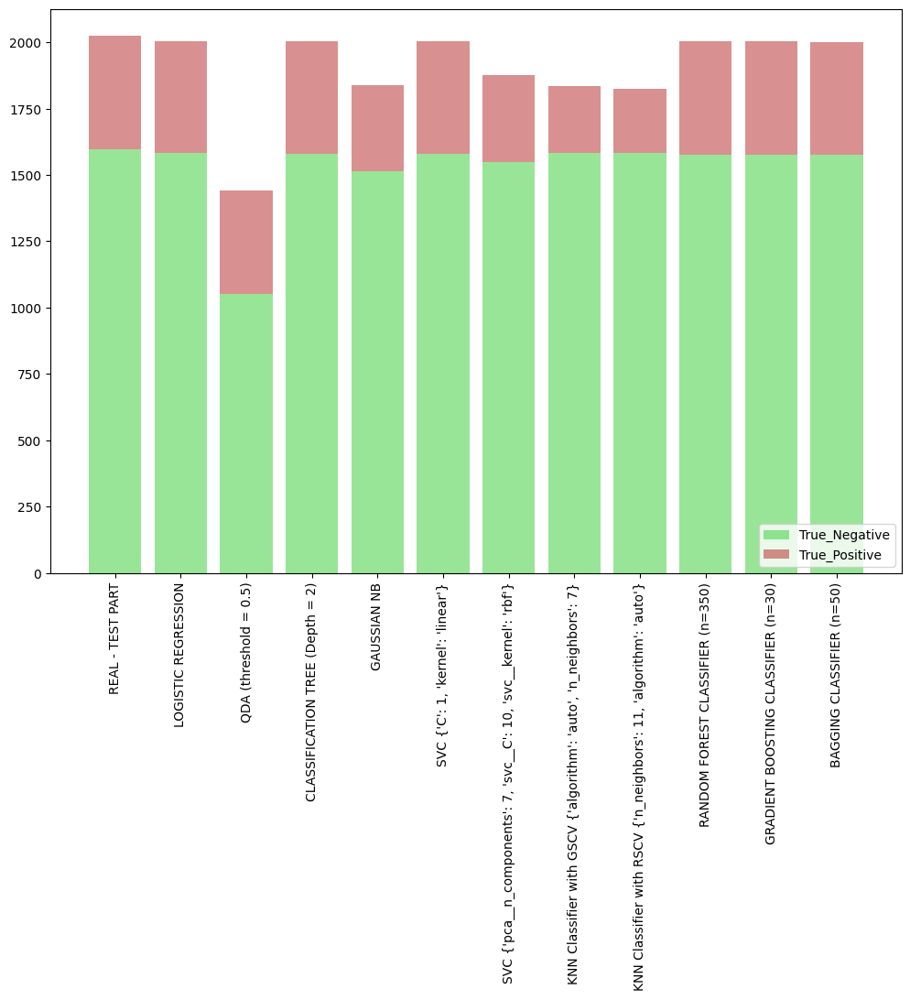

In [ ]:


plt.bar(trues_te_AKI["ML_Model_test"], trues_te_AKI["True_Negative"], color="limegreen",alpha=0.5)
plt.bar(trues_te_AKI["ML_Model_test"], trues_te_AKI["True_Positive"], bottom=trues_te_AKI["True_Negative"], color="firebrick",alpha=0.5)
plt.legend(["True_Negative", "True_Positive"],loc="lower right")
plt.xticks(rotation = 90)
plt.show()

In [ ]:
#Data table display disabled by running

from google.colab import data_table
data_table.disable_dataframe_formatter()

## 6- OUTCOME (Qualitative Response) Analysis
(Expiry,Discharge,DAMA) 

###6.1 - Separating the Cleaned Dataset in Train(80%) and Test(20%)

In [ ]:
from sklearn.model_selection import train_test_split

# Checking the count of each class in Y(OUTCOME)
kout_name, kout_count =  np.unique(df_Outcome['OUTCOME'], return_counts=True)
print("Proporportion of ", kout_name[0]," in the entire dataset is ", kout_count[0]/sum(kout_count))
print("Proporportion of ", kout_name[1]," in the entire dataset is ", kout_count[1]/sum(kout_count))
print("Proporportion of ", kout_name[2]," in the entire dataset is ", kout_count[2]/sum(kout_count))

Proporportion of  0  in the entire dataset is  0.0585679012345679
Proporportion of  1  in the entire dataset is  0.8973827160493827
Proporportion of  2  in the entire dataset is  0.044049382716049384


In [ ]:
# With Proportional Allocation (stratified sampling) 
dfout_tr, dfout_te = train_test_split(df_Outcome, test_size=0.2, stratify=df_Outcome['OUTCOME'], random_state=2023)
countsout = dfout_tr['OUTCOME'].value_counts()
print(countsout)

# Checking the count of each class in Y of Train part
kout_name_tr, kout_count_tr =  np.unique(dfout_tr['OUTCOME'], return_counts=True)
print("Proporportion of ", kout_name_tr[0]," in the TRAIN part is ", kout_count_tr[0]/sum(kout_count_tr))
print("Proporportion of ", kout_name_tr[1]," in the TRAIN part is ", kout_count_tr[1]/sum(kout_count_tr))
print("Proporportion of ", kout_name_tr[2]," in the TRAIN part is ", kout_count_tr[2]/sum(kout_count_tr))

# Checking the count of each class in Y of TEST part
kout_name_te, kout_count_te =  np.unique(dfout_te['OUTCOME'], return_counts=True)
print("Proporportion of ", kout_name_te[0]," in the TEST part is ", kout_count_te[0]/sum(kout_count_te))
print("Proporportion of ", kout_name_te[1]," in the TEST part is ", kout_count_te[1]/sum(kout_count_te))
print("Proporportion of ", kout_name_te[2]," in the TEST part is ", kout_count_te[2]/sum(kout_count_te))

1    7269
0     474
2     357
Name: OUTCOME, dtype: int64
Proporportion of  0  in the TRAIN part is  0.05851851851851852
Proporportion of  1  in the TRAIN part is  0.8974074074074074
Proporportion of  2  in the TRAIN part is  0.04407407407407407
Proporportion of  0  in the TEST part is  0.05876543209876543
Proporportion of  1  in the TEST part is  0.8972839506172839
Proporportion of  2  in the TEST part is  0.04395061728395062


Here it is observerd that the class 'Discharge' constitutes of 90% of the dataset while the remaining 10% is shared between 'Expiry' and 'DAMA'.

In [ ]:
# Removing Response variable and putting in separate dataframes
dfout_Y_tr = pd.DataFrame()
dfout_Y_tr["OUTCOME"] = dfout_tr['OUTCOME']
dfout_Y_te = pd.DataFrame()
dfout_Y_te["OUTCOME"] = dfout_te['OUTCOME']

dfout_tr.drop(columns = "OUTCOME", inplace=True)
dfout_te.drop(columns = "OUTCOME", inplace=True)


#df_tr.columns
display(dfout_Y_tr)

,OUTCOME
4636,1
10078,1
11934,1
13340,1
6268,1
...,...
13728,1
13751,1
128,1
13258,1


In [ ]:
# Separating Categorical variables from train and test part to scale only numerical ones
categorical_Variables_out = ['TYPE OF ADMISSION-EMERGENCY/OPD','GENDER', 'RURAL', 'SMOKING ',
       'ALCOHOL', 'DM', 'HTN', 'CAD', 'PRIOR CMP', 'CKD', 'RAISED CARDIAC ENZYMES',
       'SEVERE ANAEMIA', 'ANAEMIA', 'STABLE ANGINA', 'ACS', 'STEMI',
       'AKI','HEART FAILURE']

# to prepare the features(independent) variables and response(dependent) variables for train set.
dummiesout_tr = pd.get_dummies(dfout_tr[categorical_Variables_out])
X_numericalout_tr  = dfout_tr.drop(categorical_Variables_out, axis = 1).astype('float64')

list_numericalout = X_numericalout_tr.columns
print(list_numericalout)

#print(dummiesout_tr)

Index(['AGE', 'DURATION OF STAY', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA',
       'CREATININE', 'EF'],
      dtype='object')


In [ ]:
#print(X_numericalout_tr)
# Putting together numerical and dummies
dfout_tr_Xscaled = pd.concat([X_numericalout_tr, dummiesout_tr], axis=1)

dfout_tr_Xscaled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8100 entries, 4636 to 3145
Data columns (total 45 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   AGE                                8100 non-null   float64
 1   DURATION OF STAY                   8100 non-null   float64
 2   HB                                 8100 non-null   float64
 3   TLC                                8100 non-null   float64
 4   PLATELETS                          8100 non-null   float64
 5   GLUCOSE                            8100 non-null   float64
 6   UREA                               8100 non-null   float64
 7   CREATININE                         8100 non-null   float64
 8   EF                                 8100 non-null   float64
 9   TYPE OF ADMISSION-EMERGENCY/OPD_E  8100 non-null   uint8  
 10  TYPE OF ADMISSION-EMERGENCY/OPD_O  8100 non-null   uint8  
 11  GENDER_F                           8100 non-null   ui

In [ ]:
# to prepare the features(indepedent) variables and response(dependent) variable from test set.
dummiesout_te = pd.get_dummies(dfout_te[categorical_Variables_out])
X_numericalout_te  = dfout_te.drop(categorical_Variables_out, axis = 1).astype('float64')

# Putting together numerical and dummies
dfout_te_Xscaled = pd.concat([X_numericalout_te, dummiesout_te], axis=1)
dfout_te_Xscaled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2025 entries, 14325 to 12150
Data columns (total 45 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   AGE                                2025 non-null   float64
 1   DURATION OF STAY                   2025 non-null   float64
 2   HB                                 2025 non-null   float64
 3   TLC                                2025 non-null   float64
 4   PLATELETS                          2025 non-null   float64
 5   GLUCOSE                            2025 non-null   float64
 6   UREA                               2025 non-null   float64
 7   CREATININE                         2025 non-null   float64
 8   EF                                 2025 non-null   float64
 9   TYPE OF ADMISSION-EMERGENCY/OPD_E  2025 non-null   uint8  
 10  TYPE OF ADMISSION-EMERGENCY/OPD_O  2025 non-null   uint8  
 11  GENDER_F                           2025 non-null   

Scaling data for performing analysis which are distance based.

In [ ]:
# Scaling in Quantitative variables only
from sklearn.preprocessing import StandardScaler

# Scaling Train dataframe
scaler = StandardScaler().fit(dfout_tr_Xscaled[list_numericalout]) 

dfout_tr_Xscaled[list_numericalout] = scaler.transform(dfout_tr_Xscaled[list_numericalout])

# Scaling Test dataframe
scaler = StandardScaler().fit(dfout_te_Xscaled[list_numericalout]) 

dfout_te_Xscaled[list_numericalout] = scaler.transform(dfout_te_Xscaled[list_numericalout])



display(dfout_tr_Xscaled.head())
print(dfout_tr_Xscaled.columns)

,AGE,DURATION OF STAY,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF,TYPE OF ADMISSION-EMERGENCY/OPD_E,...,STABLE ANGINA_0,STABLE ANGINA_1,ACS_0,ACS_1,STEMI_0,STEMI_1,AKI_0,AKI_1,HEART FAILURE_0,HEART FAILURE_1
4636,1.048109,-0.332580,0.591954,2.373415,0.621192,0.608279,-0.098024,-0.345684,1.194905,1,...,1,0,1,0,1,0,1,0,1,0
10078,0.065052,-0.127549,0.808128,1.408831,0.895005,3.560164,-0.537797,-0.133367,1.194905,1,...,1,0,0,1,1,0,1,0,0,1
11934,0.140671,-0.127549,0.246074,-0.194280,2.430314,-0.633388,0.522833,0.418657,-0.453342,0,...,1,0,0,1,1,0,0,1,1,0
13340,2.258026,-0.127549,-0.878033,-0.683365,-0.180689,-0.891092,0.626309,0.248803,1.194905,1,...,1,0,1,0,1,0,0,1,0,1
6268,-0.237427,-0.537611,1.067538,0.634447,0.435391,0.245150,-0.796487,-0.608957,-0.678103,1,...,1,0,1,0,1,0,1,0,0,1


Index(['AGE', 'DURATION OF STAY', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA',
       'CREATININE', 'EF', 'TYPE OF ADMISSION-EMERGENCY/OPD_E',
       'TYPE OF ADMISSION-EMERGENCY/OPD_O', 'GENDER_F', 'GENDER_M', 'RURAL_R',
       'RURAL_U', 'SMOKING _0', 'SMOKING _1', 'ALCOHOL_0', 'ALCOHOL_1', 'DM_0',
       'DM_1', 'HTN_0', 'HTN_1', 'CAD_0', 'CAD_1', 'PRIOR CMP_0',
       'PRIOR CMP_1', 'CKD_0', 'CKD_1', 'RAISED CARDIAC ENZYMES_0',
       'RAISED CARDIAC ENZYMES_1', 'SEVERE ANAEMIA_0', 'SEVERE ANAEMIA_1',
       'ANAEMIA_0', 'ANAEMIA_1', 'STABLE ANGINA_0', 'STABLE ANGINA_1', 'ACS_0',
       'ACS_1', 'STEMI_0', 'STEMI_1', 'AKI_0', 'AKI_1', 'HEART FAILURE_0',
       'HEART FAILURE_1'],
      dtype='object')


In [ ]:
# Column names with only X quantivative variables
x_variables_out = ['AGE', 'HB', 'TLC','EF'
       'PLATELETS', 'GLUCOSE', 'UREA', 'CREATININE']

y_variable_out = ["OUTCOME"]

In [ ]:
# Train and Test Dataframe considering Dummies and No Scale for quantitative variables
x_variables_out_withDummies = ['AGE', 'DURATION OF STAY', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA',
       'CREATININE', 'EF', 'TYPE OF ADMISSION-EMERGENCY/OPD_E',
       'TYPE OF ADMISSION-EMERGENCY/OPD_O', 'GENDER_F', 'GENDER_M', 'RURAL_R',
       'RURAL_U', 'SMOKING _0', 'SMOKING _1', 'ALCOHOL_0', 'ALCOHOL_1', 'DM_0',
       'DM_1', 'HTN_0', 'HTN_1', 'CAD_0', 'CAD_1', 'PRIOR CMP_0',
       'PRIOR CMP_1', 'CKD_0', 'CKD_1', 'RAISED CARDIAC ENZYMES_0',
       'RAISED CARDIAC ENZYMES_1', 'SEVERE ANAEMIA_0', 'SEVERE ANAEMIA_1',
       'ANAEMIA_0', 'ANAEMIA_1', 'STABLE ANGINA_0', 'STABLE ANGINA_1', 'ACS_0',
       'ACS_1', 'STEMI_0', 'STEMI_1', 'AKI_0', 'AKI_1', 'HEART FAILURE_0',
       'HEART FAILURE_1']

# Putting together numerical (no scaled) and dummies
dfout_tr_withDummies= pd.concat([X_numericalout_tr, dummiesout_tr], axis=1)
dfout_te_withDummies = pd.concat([X_numericalout_te, dummiesout_te], axis=1)

display(dfout_tr_withDummies.head())

y_variable_out = ["OUTCOME"]

,AGE,DURATION OF STAY,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF,TYPE OF ADMISSION-EMERGENCY/OPD_E,...,STABLE ANGINA_0,STABLE ANGINA_1,ACS_0,ACS_1,STEMI_0,STEMI_1,AKI_0,AKI_1,HEART FAILURE_0,HEART FAILURE_1
4636,75.0,5.0,13.7,29.1,302.0,216.0,44.0,0.90,60.0,1,...,1,0,1,0,1,0,1,0,1,0
10078,62.0,6.0,14.2,22.0,330.0,468.0,27.0,1.15,60.0,1,...,1,0,0,1,1,0,1,0,0,1
11934,63.0,6.0,12.9,10.2,487.0,110.0,68.0,1.80,38.0,0,...,1,0,0,1,1,0,0,1,1,0
13340,91.0,6.0,10.3,6.6,220.0,88.0,72.0,1.60,60.0,1,...,1,0,1,0,1,0,0,1,0,1
6268,58.0,4.0,14.8,16.3,283.0,185.0,17.0,0.59,35.0,1,...,1,0,1,0,1,0,1,0,0,1


### 6.2 OUTCOME ML Models

In [ ]:
# Dataframe to store Accuracy Score of Train and Test Part
# [0] Name of ML   [1] Acc_tr      [2] Acc_te
acc_summary_OUTCOME = pd.DataFrame(columns=["ML_Model", "Accuracy_Tr", "Accuracy_Te"])

####6.2.1 QDA

In [ ]:
%%time
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA

sklearn_qda = QDA(priors=None,store_covariance=True) #creating a QDA object
qda = sklearn_qda.fit(dfout_tr_Xscaled, np.ravel(dfout_Y_tr)) #learning the projection matrix

Yout_tr_labels = qda.predict(dfout_tr_Xscaled) #gives you the predicted label for each sample
Yout_tr_prob = qda.predict_proba(dfout_tr_Xscaled) #the probability of each sample to belong to each class

Yout_tr_labels = np.array(Yout_tr_labels).reshape(-1,1)

Yout_test_labels=qda.predict(dfout_te_Xscaled)
Yout_test_prob = qda.predict_proba(dfout_te_Xscaled) 

print(Yout_test_labels.shape)
print(dfout_Y_te.shape)

Yout_test_labels = np.array(Yout_test_labels).reshape(-1,1)

print(Yout_test_labels.shape)


(2025,)
(2025, 1)
(2025, 1)
CPU times: user 115 ms, sys: 64.4 ms, total: 179 ms
Wall time: 122 ms


/usr/local/lib/python3.9/dist-packages/sklearn/discriminant_analysis.py:926: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


In [ ]:
#Calculatig the accuracy for QDA
# Accuracy by applying training points on the generated model
accout_train = accuracy_score(dfout_Y_tr, Yout_tr_labels)
print('Classification Accuracy of the fitted QDA model to\
 predict TRAIN part: ',accout_train)

# Accuracy by applying test points on the generated model
accout_test = accuracy_score(dfout_Y_te, Yout_test_labels)
print('Classification Accuracy of the fitted QDA model to\
 predict TEST part: ',accout_test)

# Storing the accuracies
new_row = {'ML_Model': 'QDA (threshold = 0.5)', 'Accuracy_Tr':accout_train, 'Accuracy_Te': accout_test}
acc_summary_OUTCOME.loc[len(acc_summary_OUTCOME)] = new_row

display(acc_summary_OUTCOME)

Classification Accuracy of the fitted QDA model to predict TRAIN part:  0.5309876543209876
Classification Accuracy of the fitted QDA model to predict TEST part:  0.5624691358024692


,ML_Model,Accuracy_Tr,Accuracy_Te
0,QDA (threshold = 0.5),0.530988,0.562469


In [ ]:
#Confusion matrix creation
cmout = confusion_matrix(dfout_Y_te, Yout_test_labels)
print(cmout)

# Creating a dataframe for a array-formatted Confusion matrix,so it will be easy for plotting.
cm_df = pd.DataFrame(cmout,
                     index = ['EXPIRY','DISCHARGE','DAMA'], 
                     columns = ['EXPIRY','DISCHARGE','DAMA'])

[[  94    8   17]
 [ 506 1024  287]
 [  34   34   21]]


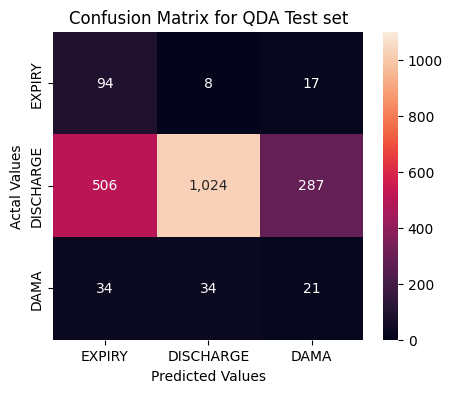

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(5,4))
from matplotlib.colors import LinearSegmentedColormap


sns.heatmap(cm_df,annot=True,vmax=1100,vmin=0,fmt=',d')
plt.title('Confusion Matrix for QDA Test set')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

Based on the results above, the QDA (deault threshold of 0.5) fitted model presented an accuracy in the TRAIN part of 53.1%, whereas this model could predict OUTCOME in the TEST part with 56.2% of accuracy.

/usr/local/lib/python3.9/dist-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


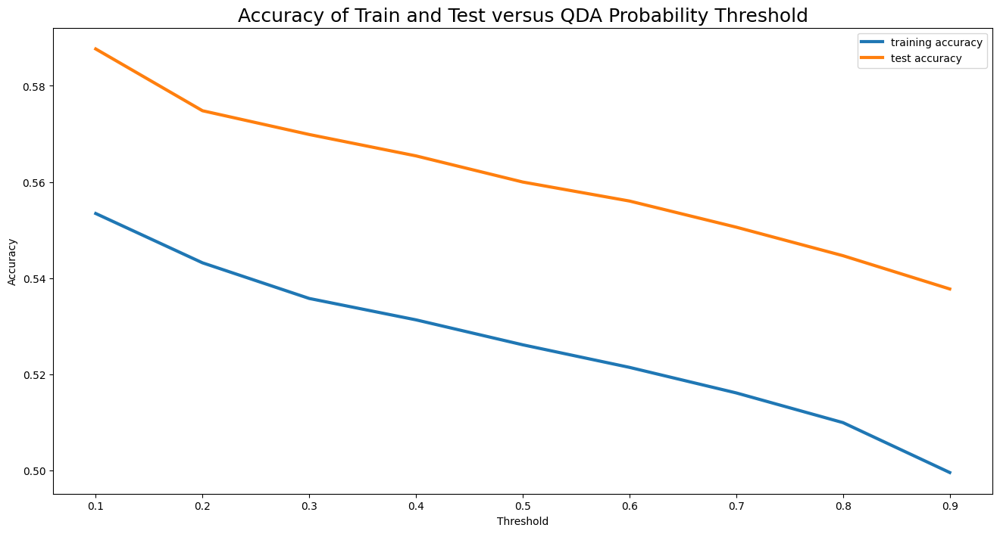

In [ ]:
#Testing sensitivity in the threshold
minThreshold = 0.1
nThreshold = np.arange(minThreshold, 1.0, step=0.1)
#print(nThreshold)
len(nThreshold)

# Arrays to store accuracy 
accout_train_by_n = []
accout_te_by_n = []

for i in nThreshold:
  threshold = i

  # Train Part
  dfout_train=pd.DataFrame()
  dfout_train = np.array(Yout_tr_prob[:,1].reshape(-1,1))

  accout_train = np.mean(dfout_Y_tr==(dfout_train>=threshold))
  accout_train_by_n.append(accout_train)

  # Test Part
  dfout_test=pd.DataFrame()
  dfout_test = np.array(Yout_test_prob[:,1].reshape(-1,1))

  accout_te = np.mean(dfout_Y_te==(dfout_test>=threshold))
  accout_te_by_n.append(np.mean(accout_te))

# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(nThreshold, accout_train_by_n, label="training accuracy", lw=3)
plt.plot(nThreshold, accout_te_by_n, label="test accuracy", lw=3)
plt.ylabel("Accuracy")
plt.xlabel("Threshold")
plt.title("Accuracy of Train and Test versus QDA Probability Threshold", fontsize=18)
plt.legend()


Based on threshold senstivity results presented above, increasing the threshold degrades the performance of QDA model. The accuracy is at its peak at threshold=0.1.

#### 6.2.2 Gaussian Naive Bayes

In [ ]:
%%time
from sklearn.naive_bayes import GaussianNB
print(dfout_tr_Xscaled.shape)
#print(dfout_tr_Xscaled.dtypes)
print(dfout_Y_tr.shape)
print(dfout_Y_tr.dtypes)
NB=GaussianNB()
NB.fit(dfout_tr_Xscaled,np.ravel(dfout_Y_tr))
acc_NB_tr=accuracy_score(dfout_Y_tr,NB.predict(dfout_tr_Xscaled))
acc_NB_te=accuracy_score(dfout_Y_te,NB.predict(dfout_te_Xscaled))
print(f'{acc_NB_tr:.3f}',f'{acc_NB_te:.3f}') 

# Storing the accuracies
new_row = {'ML_Model': 'GAUSSIAN NB', 'Accuracy_Tr':acc_NB_tr, 'Accuracy_Te': acc_NB_te}
acc_summary_OUTCOME.loc[len(acc_summary_OUTCOME)] = new_row

display(acc_summary_OUTCOME)

(8100, 45)
(8100, 1)
OUTCOME    category
dtype: object
0.379 0.395


,ML_Model,Accuracy_Tr,Accuracy_Te
0,QDA (threshold = 0.5),0.530988,0.562469
1,GAUSSIAN NB,0.379259,0.394568


CPU times: user 55.3 ms, sys: 645 µs, total: 55.9 ms
Wall time: 72.7 ms


In [ ]:
#Confusion matrix creation
cmout_gb = confusion_matrix(dfout_Y_te, NB.predict(dfout_te_Xscaled))
print(cmout_gb)

# Creating a dataframe for a array-formatted Confusion matrix,so it will be easy for plotting.
cmgb_df = pd.DataFrame(cmout_gb,
                     index = ['EXPIRY','DISCHARGE','DAMA'], 
                     columns = ['EXPIRY','DISCHARGE','DAMA'])

[[ 116    1    2]
 [1062  677   78]
 [  66   17    6]]


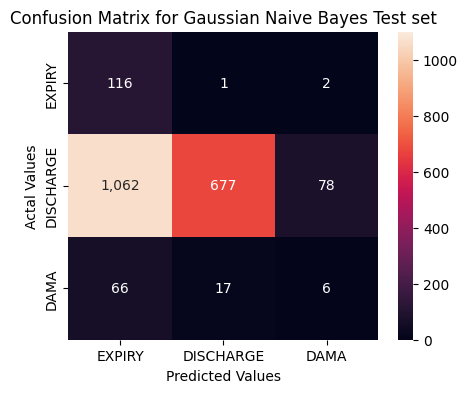

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(5,4))
from matplotlib.colors import LinearSegmentedColormap
sns.heatmap(cmgb_df,annot=True,vmax=1100,vmin=0,fmt=',d')
plt.title('Confusion Matrix for Gaussian Naive Bayes Test set')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

Based on the results above, the Gaussian Naive Bayes fitted model presented an accuracy in the TRAIN part of 37.9%, whereas this model could predict OUTCOME in the TEST part with 39.5% of accuracy. This accuracy is very low showing that this model may not be perfect for this dataset. It maybe due to the fact that it is predicting more true postives for 'Expiry' than QDA model and since the proportion of 'Expiry' is only 5% of the entire dataset so accuracy falls.

####6.2.3 SVM with GridSearchCV





In [ ]:
%%time
from sklearn.svm import SVC
model = make_pipeline(StandardScaler(), SVC())
param_grid = {"svc__C": [0.001, 0.01, 0.1, 1, 10], "svc__kernel": ["linear", "rbf", "poly"]}
searchout = GridSearchCV(model, param_grid=param_grid, scoring="accuracy", cv=5)
searchout.fit(dfout_tr_Xscaled, np.ravel(dfout_Y_tr))
print(f"searchout.best_parameters_ = {searchout.best_params_}")


searchout.best_parameters_ = {'svc__C': 1, 'svc__kernel': 'rbf'}
CPU times: user 2min 18s, sys: 1.42 s, total: 2min 19s
Wall time: 2min 22s


In [ ]:
model = searchout.best_estimator_
model.fit(dfout_tr_Xscaled, np.ravel(dfout_Y_tr))
accsvc_tr = accuracy_score(dfout_Y_tr,model.predict(dfout_tr_Xscaled))
accsvc_te = accuracy_score(dfout_Y_te,model.predict(dfout_te_Xscaled))
print(f"training accuracy (SVC) = {accsvc_tr:.2f}",f"testing accuracy (SVC) = {accsvc_te:.2f}")

# Storing the accuracies
new_row = {'ML_Model': 'SVC C=1 kernel=rbf', 'Accuracy_Tr':accsvc_tr, 'Accuracy_Te': accsvc_te}
acc_summary_OUTCOME.loc[len(acc_summary_OUTCOME)] = new_row

display(acc_summary_OUTCOME)

training accuracy (SVC) = 0.93 testing accuracy (SVC) = 0.92


,ML_Model,Accuracy_Tr,Accuracy_Te
0,QDA (threshold = 0.5),0.530988,0.562469
1,GAUSSIAN NB,0.379259,0.394568
2,SVC C=1 kernel=rbf,0.926296,0.921975


In [ ]:
#Confusion matrix creation
cmout_svc = confusion_matrix(dfout_Y_te, model.predict(dfout_te_Xscaled))
print(cmout_svc)

# Creating a dataframe for a array-formatted Confusion matrix,so it will be easy for plotting.
cmsvc_df = pd.DataFrame(cmout_svc,
                     index = ['EXPIRY','DISCHARGE','DAMA'], 
                     columns = ['EXPIRY','DISCHARGE','DAMA'])

[[  57   62    0]
 [   7 1810    0]
 [   1   88    0]]


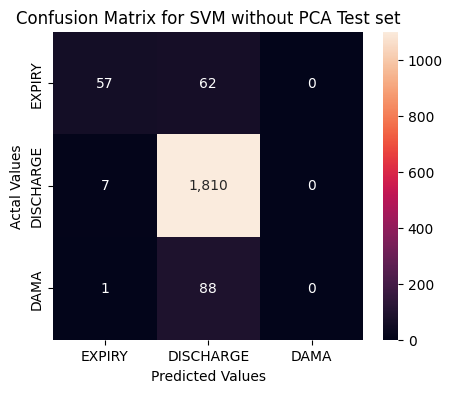

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(5,4))
from matplotlib.colors import LinearSegmentedColormap
sns.heatmap(cmsvc_df,annot=True,vmax=1100,vmin=0,fmt=',d')
plt.title('Confusion Matrix for SVM without PCA Test set')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

Based on the results above, SVM using GridSearch CV('C': 1, 'kernel': 'rbf',CV=5)fitted model presented an accuracy in the TRAIN part of 93%, whereas this model could predict OUTCOME in the TEST part with 92% of accuracy.A reason for that maybe is that it predicts a very high true positive for 'Discharge' and since 'Discharge' constitutes of 90% of the dataset so the overall accuracy increases.

####6.2.4 KNN with GridSearch CV

In [ ]:
%%time
from sklearn.model_selection import GridSearchCV

knn = KNeighborsClassifier()
grid_param = { 'n_neighbors' : list(range(2,21)) , 
              'algorithm' : ['auto','ball_tree','kd_tree','brute'] }
              
cvGridout = GridSearchCV(knn,grid_param,cv = 10)
cvGridout.fit(dfout_tr_Xscaled, np.ravel(dfout_Y_tr))


print("The best parameters for the KNN Classifier are: ", cvGridout.best_params_)

The best parameters for the KNN Classifier are:  {'algorithm': 'auto', 'n_neighbors': 6}
CPU times: user 4min 16s, sys: 564 ms, total: 4min 17s
Wall time: 3min 57s


In [ ]:
#best parameter combination
print(cvGridout.best_params_)

#Score achieved with best parameter combination
print(cvGridout.best_score_)

#all combinations of hyperparameters
print(cvGridout.cv_results_['params'])

#average scores of cross-validation
print(cvGridout.cv_results_['mean_test_score'])

accknn_train = accuracy_score(dfout_Y_tr,cvGridout.predict(dfout_tr_Xscaled))
print('Classification Accuracy of the fitted KNN model to\
 predict TRAIN part: ',accknn_train)

accknn_test = accuracy_score(dfout_Y_te, cvGridout.predict(dfout_te_Xscaled))
print('Classification Accuracy of the fitted KNN model to\
 predict TEST part: ',accknn_test)

# Storing the accuracies
new_row = {'ML_Model': 'KNN Classifier (algorithm=auto n_neighbors=6)', 'Accuracy_Tr':accknn_train, 'Accuracy_Te': accknn_test}
acc_summary_OUTCOME.loc[len(acc_summary_OUTCOME)] = new_row

display(acc_summary_OUTCOME)

{'algorithm': 'auto', 'n_neighbors': 6}
0.9106172839506173
[{'algorithm': 'auto', 'n_neighbors': 2}, {'algorithm': 'auto', 'n_neighbors': 3}, {'algorithm': 'auto', 'n_neighbors': 4}, {'algorithm': 'auto', 'n_neighbors': 5}, {'algorithm': 'auto', 'n_neighbors': 6}, {'algorithm': 'auto', 'n_neighbors': 7}, {'algorithm': 'auto', 'n_neighbors': 8}, {'algorithm': 'auto', 'n_neighbors': 9}, {'algorithm': 'auto', 'n_neighbors': 10}, {'algorithm': 'auto', 'n_neighbors': 11}, {'algorithm': 'auto', 'n_neighbors': 12}, {'algorithm': 'auto', 'n_neighbors': 13}, {'algorithm': 'auto', 'n_neighbors': 14}, {'algorithm': 'auto', 'n_neighbors': 15}, {'algorithm': 'auto', 'n_neighbors': 16}, {'algorithm': 'auto', 'n_neighbors': 17}, {'algorithm': 'auto', 'n_neighbors': 18}, {'algorithm': 'auto', 'n_neighbors': 19}, {'algorithm': 'auto', 'n_neighbors': 20}, {'algorithm': 'ball_tree', 'n_neighbors': 2}, {'algorithm': 'ball_tree', 'n_neighbors': 3}, {'algorithm': 'ball_tree', 'n_neighbors': 4}, {'algorithm'

,ML_Model,Accuracy_Tr,Accuracy_Te
0,QDA (threshold = 0.5),0.530988,0.562469
1,GAUSSIAN NB,0.379259,0.394568
2,SVC C=1 kernel=rbf,0.926296,0.921975
3,KNN Classifier (algorithm=auto n_neighbors=6),0.920988,0.918025


In [ ]:
#Confusion matrix creation
cmout_KNN = confusion_matrix(dfout_Y_te, cvGridout.predict(dfout_te_Xscaled))
print(cmout_KNN)

# Creating a dataframe for a array-formatted Confusion matrix,so it will be easy for plotting.
cmKNN_df = pd.DataFrame(cmout_svc,
                     index = ['EXPIRY','DISCHARGE','DAMA'], 
                     columns = ['EXPIRY','DISCHARGE','DAMA'])

[[  53   63    3]
 [   9 1806    2]
 [   5   84    0]]


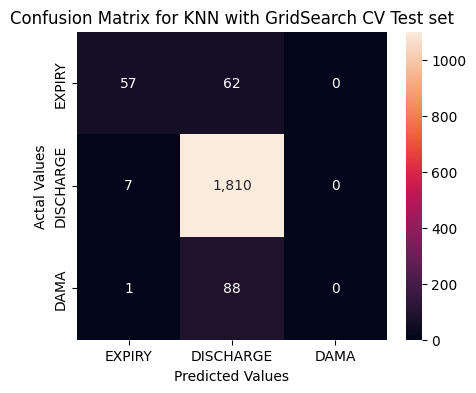

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(5,4))
from matplotlib.colors import LinearSegmentedColormap
sns.heatmap(cmKNN_df,annot=True,vmax=1100,vmin=0,fmt=',d')
plt.title('Confusion Matrix for KNN with GridSearch CV Test set')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

Based on the results above, KNN using Grid Search CV(algorithm: 'auto', n_neighbors: 6,CV=10)fitted model presented an accuracy in the TRAIN part of 92%, whereas this model could predict OUTCOME in the TEST part with 91.8% of accuracy which is simialr to SVM with GridSearch CV.A Again we observe that it predicts a very high true positive for 'Discharge'.

####6.2.5 Random Forest Classifier

(8100, 44)
(8100,)
Running the estimator 50


  0%|          | 0/50 [00:00<?, ?it/s]

Running the estimator 100


  0%|          | 0/50 [00:00<?, ?it/s]

Running the estimator 150


  0%|          | 0/50 [00:00<?, ?it/s]

Running the estimator 200


  0%|          | 0/50 [00:00<?, ?it/s]

Running the estimator 250


  0%|          | 0/50 [00:00<?, ?it/s]

Running the estimator 300


  0%|          | 0/50 [00:00<?, ?it/s]

Running the estimator 350


  0%|          | 0/50 [00:00<?, ?it/s]

Running the estimator 400


  0%|          | 0/50 [00:00<?, ?it/s]

Running the estimator 450


  0%|          | 0/50 [00:00<?, ?it/s]

Running the estimator 500


  0%|          | 0/50 [00:00<?, ?it/s]

Running the estimator 550


  0%|          | 0/50 [00:00<?, ?it/s]

CPU times: user 34min 58s, sys: 6.64 s, total: 35min 5s
Wall time: 37min 32s


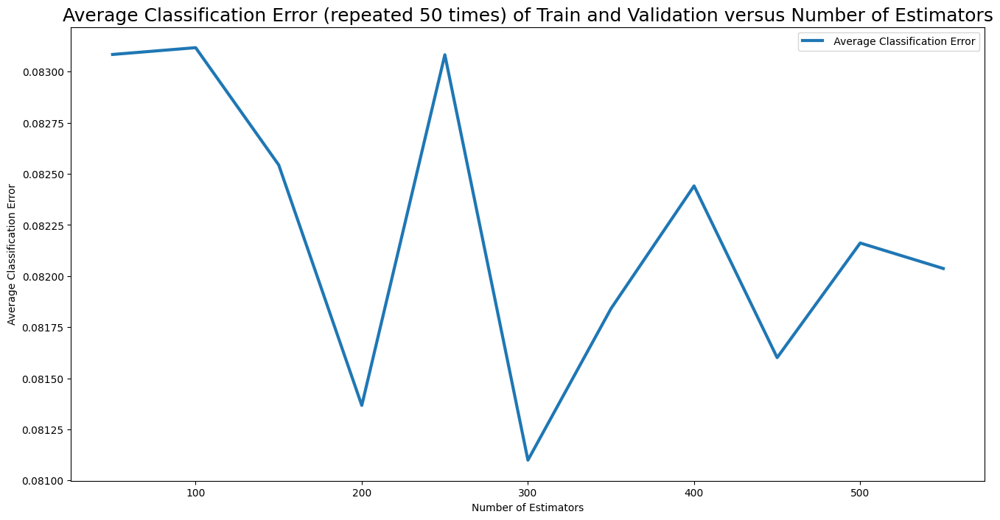

In [ ]:
%%time
from tqdm.notebook import tqdm
from sklearn .ensemble import RandomForestClassifier

# Number of estimators in Random Forest
n_estimator = np.arange(50, 600, step=50)

# Number of repetions in Bootstrap
n_repeats = 50

# Index
all_I = np.array(dfout_tr_Xscaled.index)
#print(all_I)


# Creating vector to storage oob (out-of-bag error) values
#oob = np.zeros((n_tr, n_repeats))
oobScores = []

#Reshaping 
X_tr_shape = dfout_tr_Xscaled.values[:, :-1]
y_tr_shape = dfout_Y_tr.values[:, -1]

print(X_tr_shape.shape)
print(y_tr_shape.shape)

# Taking the size of train part
n_tr = len(X_tr_shape)

for n in n_estimator:
  print("Running the estimator", n)

  # Vector to storage the oob value for each repetition
  oob = np.zeros((n_tr, n_repeats))

  # Bootstrap
  for j in tqdm(range(n_repeats)):
    I = np.random.choice(n_tr, size=n_tr, replace=True) # boostrap replicate
    #print(I)
    II = [i for i in np.arange(n_tr) if i not in I] # not in boostrap replicate (use for testing)
    #print(II)

    # Random Forest with the current number of estimators
    model = RandomForestClassifier(n_estimators = n)
    model.fit(X_tr_shape[I], y_tr_shape[I])
    y_pred= model.predict(X_tr_shape[II])

    # Calculating Accuracy
    oob[II, j] = accuracy_score(y_tr_shape[II], y_pred)

  # Storing Accuracy Valuesin the current BOOTSTRAP
  y_oob = oob.sum(axis=1)/np.count_nonzero(oob, axis=1)
  #print(y_oob)

  # Calculating the Average OOB in the current BOOTSTRAP
  y_oob=1-np.mean(y_oob)
  
  #print(i, y_oob)

  # Storing the Average OOB for the current n_estimator
  oobScores.append(y_oob)


# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(n_estimator, oobScores, label=" Average Classification Error", lw=3)
plt.ylabel("Average Classification Error")
plt.xlabel("Number of Estimators")
plt.title("Average Classification Error (repeated 50 times) of Train and Validation versus Number of Estimators", fontsize=18)
plt.legend()
#major_ticks = np.arange(1, maxTreeDepth+1, 1)
#plt.xticks(major_ticks)










Based on the above plot selecting n_estimators=350.

In [ ]:

%%time
from tqdm.notebook import tqdm
from sklearn .ensemble import RandomForestClassifier

# Number of estimators in Random Forest
n_estimator = np.arange(50, 651, step=100)

# Number of repetions in Bootstrap
n_repeats = 50

# Index
all_I_out = np.array(dfout_tr_Xscaled.index)
print(all_I_out)

# Creating vector to storage oob (out-of-bag error) values
oobScores = []

#Reshaping 
Xout_tr_shape = dfout_tr_Xscaled.values[:, :-1]
yout_tr_shape = dfout_Y_tr.values[:, -1]

print(Xout_tr_shape.shape)
print(yout_tr_shape.shape)

# Taking the size of train part
n_tr = len(Xout_tr_shape)

for n in n_estimator:
  print("Running the estimator", n)

  # Vector to store the oob value for each repetition
  oob = np.zeros((n_tr, n_repeats))

  # Bootstrap
  for j in tqdm(range(n_repeats)):
    I = np.random.choice(n_tr, size=n_tr, replace=True) # boostrap replicate
    II = [i for i in np.arange(n_tr) if i not in I] # not in boostrap replicate (use for testing)

    # Random Forest with the current number of estimators
    modelrf = RandomForestClassifier(n_estimators = n)
    modelrf.fit(Xout_tr_shape[I], yout_tr_shape[I])

    # Calculating Accuracy
    oob[II, j] = accuracy_score(yout_tr_shape[II], modelrf.predict(Xout_tr_shape[II]))

  # Storing Accuracy Valuesin the current BOOTSTRAP
  y_oob = oob.sum(axis=1)/np.count_nonzero(oob, axis=1)
  

  # Calculating the Average OOB in the current BOOTSTRAP
  y_oob=1-np.mean(y_oob)
  
  print(i, y_oob)

  # Storing the Average OOB for the current n_estimator
  oobScores.append(y_oob)


# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(n_estimator, oobScores, label=" Average Classification Error", lw=3)
plt.ylabel("Average Classification Error")
plt.xlabel("Number of Estimators")
plt.title("Average Classification Error (repeated 50 times) of Train and Validation versus Number of Estimators", fontsize=18)
plt.legend()


In [ ]:
from sklearn .ensemble import RandomForestClassifier

# Accuracy of Train based on the results of previous sensitivity (n = 350)
accrf_train = 1 - 0.08187595423109173

# Random Forest Classifier - Creating the model with the minimum error obatined with bootstrap in train part 
modelrf = RandomForestClassifier(n_estimators = 450)
modelrf.fit(dfout_tr_Xscaled, np.ravel(dfout_Y_tr))

print('Classification Accuracy of the fitted RANDOM FOREST CLASSIFIER (n = 350) model to\
 predict TRAIN part: ',accrf_train)

accrf_test = accuracy_score(dfout_Y_te, modelrf.predict(dfout_te_Xscaled))
print('Classification Accuracy of the fitted RANDOM FOREST CLASSIFIER (n = 350) model to\
 predict TEST part: ',accrf_test)

# Storing the accuracies
new_row = {'ML_Model': 'RANDOM FOREST CLASSIFIER (n = 350)', 'Accuracy_Tr':accrf_train, 'Accuracy_Te': accrf_test}
acc_summary_OUTCOME.loc[len(acc_summary_OUTCOME)] = new_row

display(acc_summary_OUTCOME)

Classification Accuracy of the fitted RANDOM FOREST CLASSIFIER (n = 350) model to predict TRAIN part:  0.9181240457689083
Classification Accuracy of the fitted RANDOM FOREST CLASSIFIER (n = 350) model to predict TEST part:  0.9274074074074075


,ML_Model,Accuracy_Tr,Accuracy_Te
0,QDA (threshold = 0.5),0.530988,0.562469
1,GAUSSIAN NB,0.379259,0.394568
2,SVC C=1 kernel=rbf,0.926296,0.921975
3,RANDOM FOREST CLASSIFIER (n = 350),0.918124,0.927407


In [ ]:
#Confusion matrix creation
cmout_RF = confusion_matrix(dfout_Y_te, modelrf.predict(dfout_te_Xscaled))
print(cmout_RF)

# Creating a dataframe for a array-formatted Confusion matrix,so it will be easy for plotting.
cmRF_df = pd.DataFrame(cmout_RF,
                     index = ['EXPIRY','DISCHARGE','DAMA'], 
                     columns = ['EXPIRY','DISCHARGE','DAMA'])

[[  66   53    0]
 [   3 1811    3]
 [   5   83    1]]


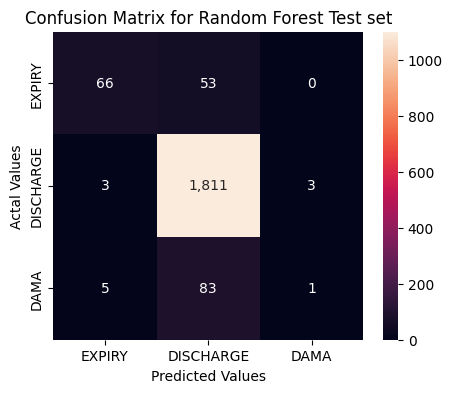

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(5,4))
from matplotlib.colors import LinearSegmentedColormap
sns.heatmap(cmRF_df,annot=True,vmax=1100,vmin=0,fmt=',d')
plt.title('Confusion Matrix for Random Forest Test set')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

Based on the results above,Random Forest fitted model(n=450) presented an accuracy in the TRAIN part of 91.8%, whereas this model could predict OUTCOME in the TEST part with 92.7% of accuracy which is simialr to SVM and KNN. However, the value of n modifies eact time the model is run.

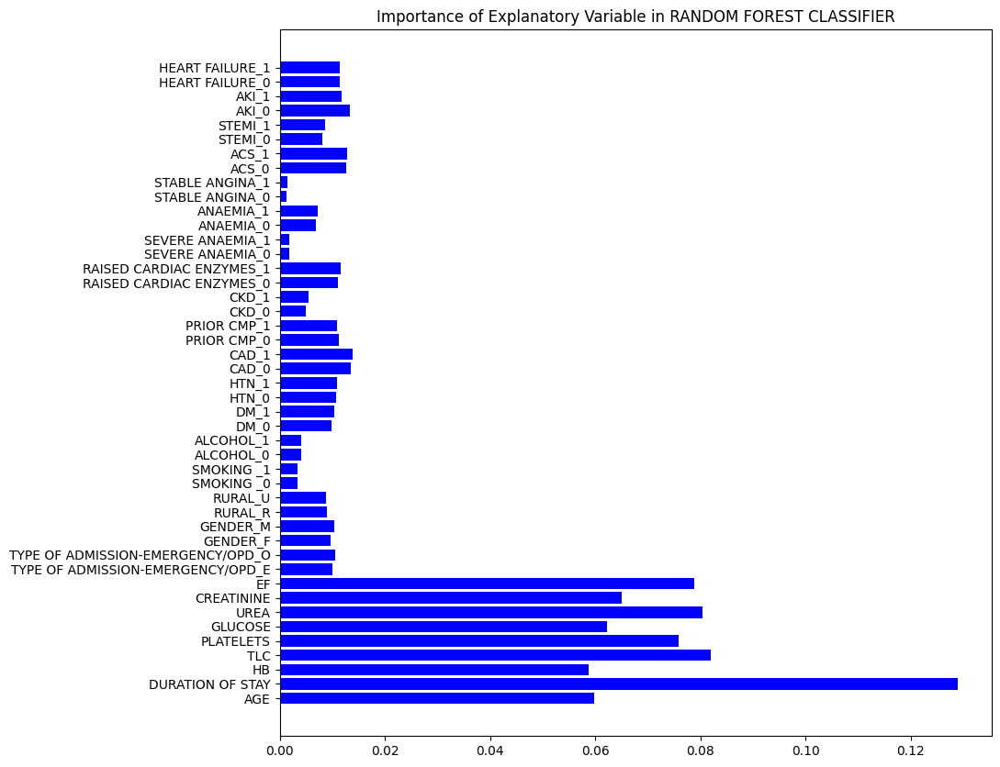

In [ ]:
# Plotting the variables based on the importance
plt.figure(figsize=(10,10))
plt.barh(np.arange(len(x_variables_out_withDummies)), modelrf.feature_importances_, color = "blue")
plt.yticks(ticks=np.arange(len(x_variables_out_withDummies)), labels=x_variables_out_withDummies)
plt.title("Importance of Explanatory Variable in RANDOM FOREST CLASSIFIER")
plt.show()

From the above features of Importance plot we observe that 'Duration of Stay' is the most influential for OUTCOME.

####6.2.6 Gradient Boosting Classifier

10 0.9128395061728395 0.9150617283950617
60 0.9350617283950617 0.9214814814814815
110 0.9432098765432099 0.9234567901234568
160 0.9490123456790124 0.9254320987654321
210 0.9543209876543209 0.9269135802469136
260 0.9612345679012345 0.9249382716049382
CPU times: user 57.8 s, sys: 79.3 ms, total: 57.8 s
Wall time: 58.3 s


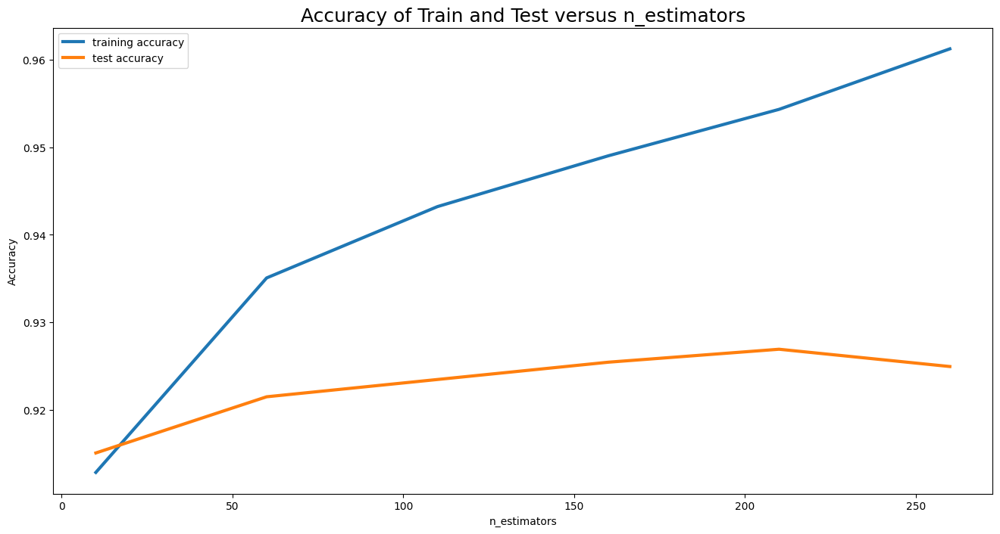

In [ ]:
%%time
from sklearn .ensemble  import GradientBoostingClassifier

nEstimator = np.arange(10, 310, step=50)
#len(nDepths)
 
# Arrays to storage accuracy 
accgbc_tr_by_n = []
accgbc_te_by_n = []

for i in nEstimator :
  modelgbc = GradientBoostingClassifier(n_estimators=i)
  modelgbc.fit(dfout_tr_Xscaled, np.ravel(dfout_Y_tr))

  accgbc_tr = accuracy_score(dfout_Y_tr, modelgbc.predict(dfout_tr_Xscaled))
  accgbc_tr_by_n.append(accgbc_tr)

  accgbc_te = accuracy_score(dfout_Y_te, modelgbc.predict(dfout_te_Xscaled))
  accgbc_te_by_n.append(accgbc_te)

  # Just to print the summary of each iteraction (number of estimators)
  print(i, accgbc_tr, accgbc_te)

# Plotting acc train versus acc
plt.figure(figsize=(16,8))
plt.plot(nEstimator, accgbc_tr_by_n, label="training accuracy", lw=3)
plt.plot(nEstimator, accgbc_te_by_n, label="test accuracy", lw=3)
plt.ylabel("Accuracy")
plt.xlabel("n_estimators")
plt.title("Accuracy of Train and Test versus n_estimators", fontsize=18)
plt.legend()


From the above plot it is visible that n_estimators=60 gives the best result. So using this value to do the modelling using gradient booster.

In [ ]:
from sklearn .ensemble  import GradientBoostingClassifier

# GRADIENT BOOSTING Classifier - Creating the model
modelgbc = GradientBoostingClassifier(n_estimators = 60)
modelgbc.fit(dfout_tr_Xscaled, np.ravel(dfout_Y_tr))

accgbc_train = accuracy_score(dfout_Y_tr, modelgbc.predict(dfout_tr_Xscaled))
print('Classification Accuracy of the fitted GRADIENT BOOSTING CLASSIFIER model to\
 predict TRAIN part: ',accgbc_train)

accgbc_te = accuracy_score(dfout_Y_te, modelgbc.predict(dfout_te_Xscaled))
print('Classification Accuracy of the fitted GRADIENT BOOSTING CLASSIFIER model to\
 predict Test part: ',accgbc_te)

# Storing the accuracies
new_row = {'ML_Model': 'GRADIENT BOOSTING CLASSIFIER (n = 60)', 'Accuracy_Tr':accgbc_train, 'Accuracy_Te': accgbc_te}
acc_summary_OUTCOME.loc[len(acc_summary_OUTCOME)] = new_row

display(acc_summary_OUTCOME)

Classification Accuracy of the fitted GRADIENT BOOSTING CLASSIFIER model to predict TRAIN part:  0.9350617283950617
Classification Accuracy of the fitted GRADIENT BOOSTING CLASSIFIER model to predict Test part:  0.9214814814814815


,ML_Model,Accuracy_Tr,Accuracy_Te
0,QDA (threshold = 0.5),0.530988,0.562469
1,GAUSSIAN NB,0.379259,0.394568
2,SVC C=1 kernel=rbf,0.926296,0.921975
3,RANDOM FOREST CLASSIFIER (n = 350),0.918124,0.927407
4,GRADIENT BOOSTING CLASSIFIER (n = 60),0.935062,0.921481


In [ ]:
#Confusion matrix creation
cmout_GBC = confusion_matrix(dfout_Y_te, modelgbc.predict(dfout_te_Xscaled))
print(cmout_GBC)

# Creating a dataframe for a array-formatted Confusion matrix,so it will be easy for plotting.
cmgbc_df = pd.DataFrame(cmout_GBC,
                     index = ['EXPIRY','DISCHARGE','DAMA'], 
                     columns = ['EXPIRY','DISCHARGE','DAMA'])

[[  66   51    2]
 [  14 1796    7]
 [  10   75    4]]


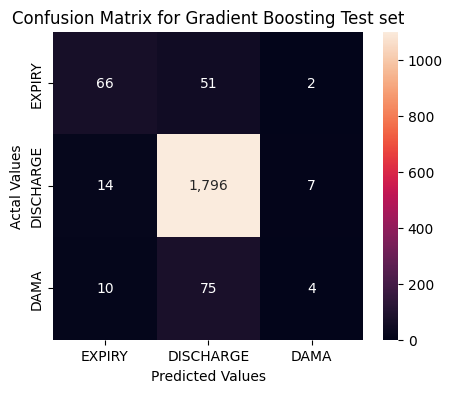

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(5,4))
from matplotlib.colors import LinearSegmentedColormap
sns.heatmap(cmgbc_df,annot=True,vmax=1100,vmin=0,fmt=',d')
plt.title('Confusion Matrix for Gradient Boosting Test set')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

Based on the results above,Gradient Bossting Classifier (n_estimator=60) presented an accuracy in the TRAIN part of 93.5%, whereas this model could predict OUTCOME in the TEST part with 92.1% of accuracy. 

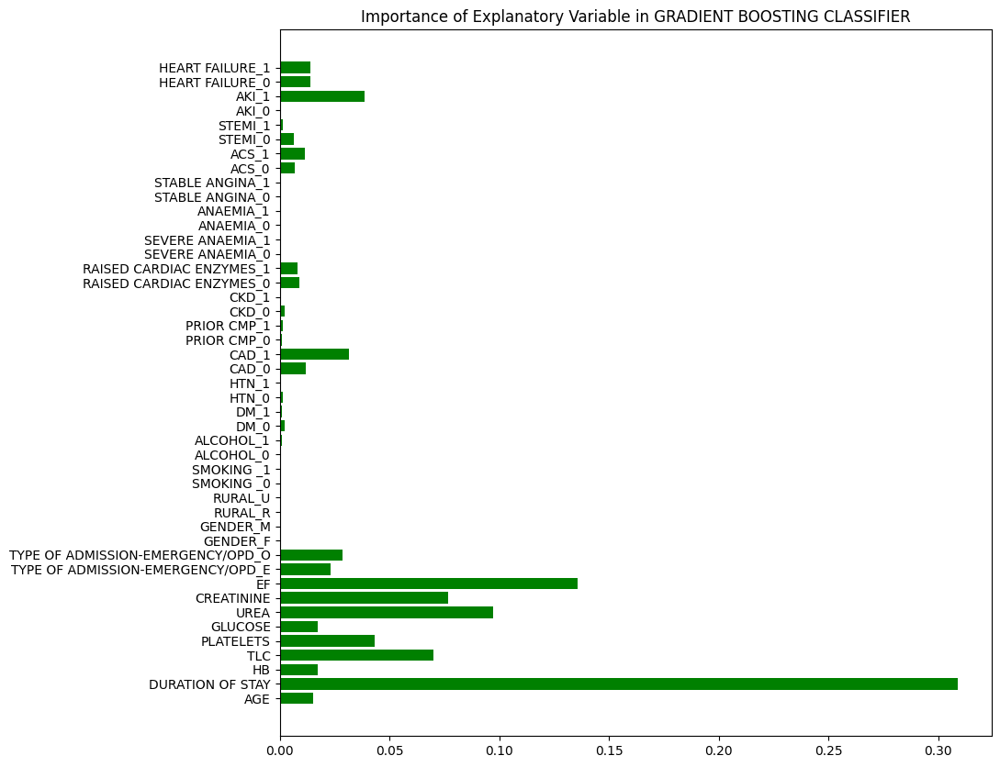

In [ ]:
# Plotting the variables based on the importance
plt.figure(figsize=(10,10))
plt.barh(np.arange(len(x_variables_out_withDummies)), modelgbc.feature_importances_, color = "green")
plt.yticks(ticks=np.arange(len(x_variables_out_withDummies)), labels=x_variables_out_withDummies)
plt.title("Importance of Explanatory Variable in GRADIENT BOOSTING CLASSIFIER")
plt.show()

From the above feature of importance plot again 'Duration of Stay' is the most influential explanatory variable for response variable OUTCOME.

####6.2.7 Bagging Classifier

In [ ]:
%%time
from tqdm.notebook import tqdm
from sklearn .ensemble  import BaggingClassifier

# Number of estimators in Random Forest
n_estimator = np.arange(10, 211, step=40)

# Number of repetions in Bootstrap
n_repeats = 50

# Index
all_I_bag = np.array(dfout_tr_Xscaled.index)
#print(all_I)

# Creating vector to storage oob (out-of-bag error) values
oobScoresbag = []

#Reshaping 
X_tr_shape_bag = dfout_tr_Xscaled.values[:, :-1]
y_tr_shape_bag = dfout_Y_tr.values[:, -1]

print(X_tr_shape_bag.shape)
print(y_tr_shape_bag.shape)

# Taking the size of train part
n_tr_bag = len(X_tr_shape_bag)

for n in n_estimator:
  print("Running the estimator", n)

  # Vector to store the oob value for each repetition
  oob = np.zeros((n_tr_bag, n_repeats))

  # Bootstrap
  for j in tqdm(range(n_repeats)):
    I = np.random.choice(n_tr_bag, size=n_tr_bag, replace=True) # boostrap replicate
    II = [i for i in np.arange(n_tr_bag) if i not in I] # not in boostrap replicate (use for testing)
    
  # Random Forest with the current number of estimators
    modelbag = BaggingClassifier(n_estimators = n)
    modelbag.fit(X_tr_shape_bag[I], y_tr_shape_bag[I])

  # Calculating Accuracy
    oob[II, j] = accuracy_score(y_tr_shape_bag[II], modelbag.predict(X_tr_shape_bag[II]))

  # Storing Accuracy Values in the current BOOTSTRAP
  y_oob_bag = oob.sum(axis=1)/np.count_nonzero(oob, axis=1)
  
  # Calculating the Average OOB in the current BOOTSTRAP
  y_oob_bag=1-np.mean(y_oob_bag)
  
  print(i, y_oob_bag)

  # Storing the Average OOB for the current n_estimator
  oobScoresbag.append(y_oob_bag)


(8100, 44)
(8100,)
Running the estimator 10


  0%|          | 0/50 [00:00<?, ?it/s]

260 0.0884960728881039
Running the estimator 50


  0%|          | 0/50 [00:00<?, ?it/s]

260 0.08197965208508429
Running the estimator 90


  0%|          | 0/50 [00:00<?, ?it/s]

260 0.08267952219067765
Running the estimator 130


  0%|          | 0/50 [00:00<?, ?it/s]

260 0.08217947429472783
Running the estimator 170


  0%|          | 0/50 [00:00<?, ?it/s]

260 0.08244082832926025
Running the estimator 210


  0%|          | 0/50 [00:00<?, ?it/s]

260 0.08255505129835183
CPU times: user 35min 32s, sys: 3.07 s, total: 35min 35s
Wall time: 35min 42s


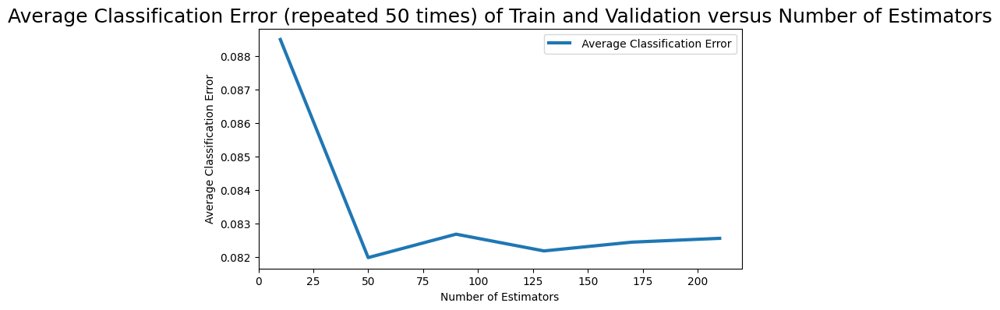

In [ ]:
# Plotting acc train versus acc
plt.figure(figsize=(8,4))
plt.plot(n_estimator, oobScoresbag, label=" Average Classification Error", lw=3)
plt.ylabel("Average Classification Error")
plt.xlabel("Number of Estimators")
plt.title("Average Classification Error (repeated 50 times) of Train and Validation versus Number of Estimators", fontsize=18)
plt.legend()

From the above plot it is observed that the classification error is the lowest at n_estimators=50. So using this to do the modelling.

In [ ]:
from sklearn .ensemble  import BaggingClassifier

# Accuracy of Train based on the results of previous sensitivity (n = 50)
acc_train_bag = 1 - 0.08034443962794369

# BAGGING Classifier - Creating the model
modelbag = BaggingClassifier(n_estimators = 50)
modelbag.fit(dfout_tr_Xscaled, np.ravel(dfout_Y_tr))

print('Classification Accuracy of the fitted BAGGING CLASSIFIER model to\
 predict TRAIN part: ',acc_train_bag)

acc_test_bag = accuracy_score(dfout_Y_te, modelbag.predict(dfout_te_Xscaled))
print('Classification Accuracy of the fitted BAGGING CLASSIFIER model to\
 predict TEST part: ',acc_test_bag)

# Storing the accuracies
new_row = {'ML_Model': 'BAGGING CLASSIFIER (n = 50)', 'Accuracy_Tr':acc_train_bag, 'Accuracy_Te': acc_test_bag}
acc_summary_OUTCOME.loc[len(acc_summary_OUTCOME)] = new_row

display(acc_summary_OUTCOME)

Classification Accuracy of the fitted BAGGING CLASSIFIER model to predict TRAIN part:  0.9196555603720563
Classification Accuracy of the fitted BAGGING CLASSIFIER model to predict TEST part:  0.9185185185185185


,ML_Model,Accuracy_Tr,Accuracy_Te
0,QDA (threshold = 0.5),0.530988,0.562469
1,GAUSSIAN NB,0.379259,0.394568
2,SVC C=1 kernel=rbf,0.926296,0.921975
3,RANDOM FOREST CLASSIFIER (n = 350),0.918124,0.927407
4,GRADIENT BOOSTING CLASSIFIER (n = 60),0.935062,0.921481
5,BAGGING CLASSIFIER (n = 50),0.919656,0.918519


In [ ]:
#Confusion matrix creation
cmout_bag = confusion_matrix(dfout_Y_te, modelbag.predict(dfout_te_Xscaled))
print(cmout_bag)

# Creating a dataframe for a array-formatted Confusion matrix,so it will be easy for plotting.
cmbag_df = pd.DataFrame(cmout_bag,
                     index = ['EXPIRY','DISCHARGE','DAMA'], 
                     columns = ['EXPIRY','DISCHARGE','DAMA'])

[[  66   50    3]
 [  17 1790   10]
 [  10   75    4]]


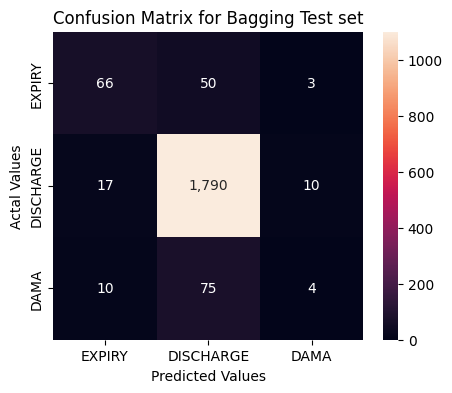

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(5,4))
from matplotlib.colors import LinearSegmentedColormap
sns.heatmap(cmbag_df,annot=True,vmax=1100,vmin=0,fmt=',d')
plt.title('Confusion Matrix for Bagging Test set')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

Based on the results above,Bagging Classifier (n_estimators=50) presented an accuracy in the TRAIN part of 91.8%, whereas this model could predict OUTCOME in the TEST part with 92.7% of accuracy which is similar to Random Forest and Gradient Boosting. 

####6.2.8 Classification Tree

In [ ]:
%%time
minTreeDepth = 2
maxTreeDepth = 12
nDepths = np.arange(minTreeDepth, maxTreeDepth+1, step=1)
#print(nDepths)
len(nDepths)

# Arrays to storage accuracy 
acc_tr_tree = []
acc_te_tree = []

for i in nDepths:
  criteria = "entropy" 
  max_depth = nDepths
  min_sample_leaf = 2
  clf_entropy = DecisionTreeClassifier(criterion=criteria, random_state=100,
                                max_depth=i, min_samples_leaf=min_sample_leaf)
  clf_entropy.fit(dfout_tr_withDummies[x_variables_out_withDummies], dfout_Y_tr[y_variable_out]) 

  # Checking accuracy
  acc_tr = accuracy_score(dfout_Y_tr[y_variable_out], clf_entropy.predict(dfout_tr_withDummies[x_variables_out_withDummies]))
  acc_tr_tree.append(acc_tr)

  acc_te = accuracy_score(dfout_Y_te[y_variable_out], clf_entropy.predict(dfout_te_withDummies[x_variables_out_withDummies]))
  acc_te_tree.append(acc_te)

  # Just to print the summary of each iteraction (number of depths)
  print(i, acc_tr_tree, acc_te_tree)

2 [0.8974074074074074] [0.8972839506172839]
3 [0.8974074074074074, 0.9058024691358024] [0.8972839506172839, 0.9076543209876543]
4 [0.8974074074074074, 0.9058024691358024, 0.9096296296296297] [0.8972839506172839, 0.9076543209876543, 0.9051851851851852]
5 [0.8974074074074074, 0.9058024691358024, 0.9096296296296297, 0.9148148148148149] [0.8972839506172839, 0.9076543209876543, 0.9051851851851852, 0.9135802469135802]
6 [0.8974074074074074, 0.9058024691358024, 0.9096296296296297, 0.9148148148148149, 0.9161728395061728] [0.8972839506172839, 0.9076543209876543, 0.9051851851851852, 0.9135802469135802, 0.9135802469135802]
7 [0.8974074074074074, 0.9058024691358024, 0.9096296296296297, 0.9148148148148149, 0.9161728395061728, 0.9222222222222223] [0.8972839506172839, 0.9076543209876543, 0.9051851851851852, 0.9135802469135802, 0.9135802469135802, 0.9071604938271605]
8 [0.8974074074074074, 0.9058024691358024, 0.9096296296296297, 0.9148148148148149, 0.9161728395061728, 0.9222222222222223, 0.92888888888

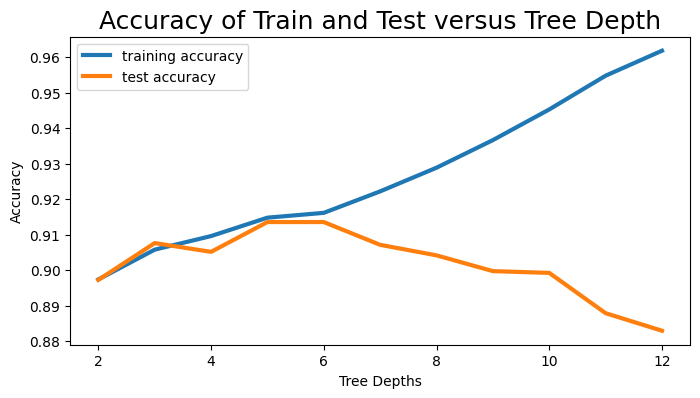

In [ ]:
# Plotting acc train versus acc
plt.figure(figsize=(8,4))
plt.plot(nDepths, acc_tr_tree, label="training accuracy", lw=3)
plt.plot(nDepths, acc_te_tree, label="test accuracy", lw=3)
plt.ylabel("Accuracy")
plt.xlabel("Tree Depths")
plt.title("Accuracy of Train and Test versus Tree Depth", fontsize=18)
plt.legend()

From the above accuracy and tree depths plot it is observed that accuracy is highest first at tree depth=3. However, the test accuracy is higher than the training accuracy which may be equivalent to underfitting. So proceeding with the next highest accuracy at tree depth=5 where the training accuracy is higher than the test accuracy.

In [ ]:
%%time

criteria = "entropy" 
max_depth = 5
min_sample_leaf = 2
clf_entropy = DecisionTreeClassifier(criterion=criteria, random_state=100,
                                max_depth=max_depth, min_samples_leaf=min_sample_leaf)
clf_entropy.fit(dfout_tr_withDummies[x_variables_out_withDummies], dfout_Y_tr[y_variable_out])
print(clf_entropy.score(dfout_tr_withDummies[x_variables_out_withDummies], dfout_Y_tr[y_variable_out]))

# Accuracy
acc_tr_tree = accuracy_score(dfout_Y_tr[y_variable_out], clf_entropy.predict(dfout_tr_withDummies[x_variables_out_withDummies]))
print('Classification Accuracy of the fitted Classification Tree model to\
 predict TRAIN part: ',acc_tr_tree)

acc_te_tree = accuracy_score(dfout_Y_te[y_variable_out], clf_entropy.predict(dfout_te_withDummies[x_variables_out_withDummies]))
print('Classification Accuracy of the fitted Classification Tree model to\
 predict TRAIN part: ',acc_te_tree)

# Storing the accuracies
new_row = {'ML_Model': 'CLASSIFICATION TREE (Depth = 3)', 'Accuracy_Tr':acc_tr_tree, 'Accuracy_Te': acc_te_tree}
acc_summary_OUTCOME.loc[len(acc_summary_OUTCOME)] = new_row

display(acc_summary_OUTCOME)

0.9148148148148149
Classification Accuracy of the fitted Classification Tree model to predict TRAIN part:  0.9148148148148149
Classification Accuracy of the fitted Classification Tree model to predict TRAIN part:  0.9135802469135802


,ML_Model,Accuracy_Tr,Accuracy_Te
0,CLASSIFICATION TREE (Depth = 3),0.914815,0.91358


CPU times: user 109 ms, sys: 5.31 ms, total: 114 ms
Wall time: 220 ms


In [ ]:
#Confusion matrix creation
cmout_tree = confusion_matrix(dfout_Y_te[y_variable_out], clf_entropy.predict(dfout_te_withDummies[x_variables_out_withDummies]))
print(cmout_tree)

# Creating a dataframe for a array-formatted Confusion matrix,so it will be easy for plotting.
cmtree_df = pd.DataFrame(cmout_tree,
                     index = ['EXPIRY','DISCHARGE','DAMA'], 
                     columns = ['EXPIRY','DISCHARGE','DAMA'])

[[  48   71    0]
 [  10 1801    6]
 [   9   79    1]]


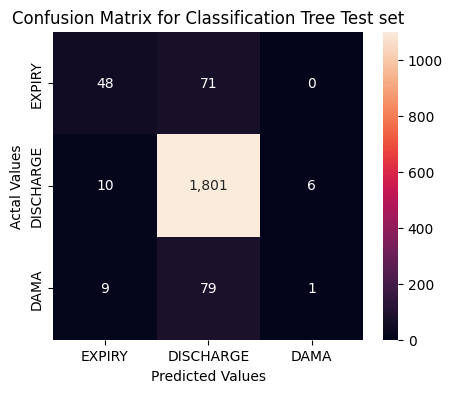

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(5,4))
from matplotlib.colors import LinearSegmentedColormap
sns.heatmap(cmtree_df,annot=True,vmax=1100,vmin=0,fmt=',d')
plt.title('Confusion Matrix for Classification Tree Test set')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

Based on the results above,Classification tree(tree depth=5) presented an accuracy in the TRAIN part of 91.48%, whereas this model could predict OUTCOME in the TEST part with 91.36%.

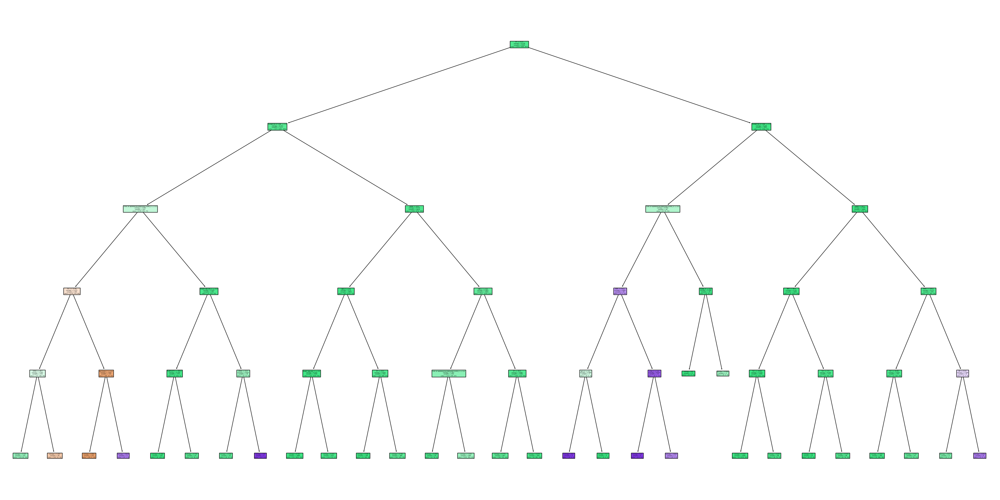

In [ ]:
# Performing the classification tree visualization to have better idea of the scenario 
plt.figure(figsize=(40,20))  # customize according to the size of your tree
#text_representation = tree.export_text(clf_entropy)
#print(text_representation)
plot_tree(clf_entropy, feature_names = dfout_tr_withDummies[x_variables_out_withDummies].columns, filled=True)
plt.show()

From the above classification tree it is observed that the tree has substantial number of branches and nodes. The initial branching at the top level is Ejection Fraction which is one of the important features in determining OUTCOME. At the second level the branches are from Duration of Stay. Also most of the nodes are green for 'Discharge' class confirming the fact that majority of the data points are for 'Discharge'.

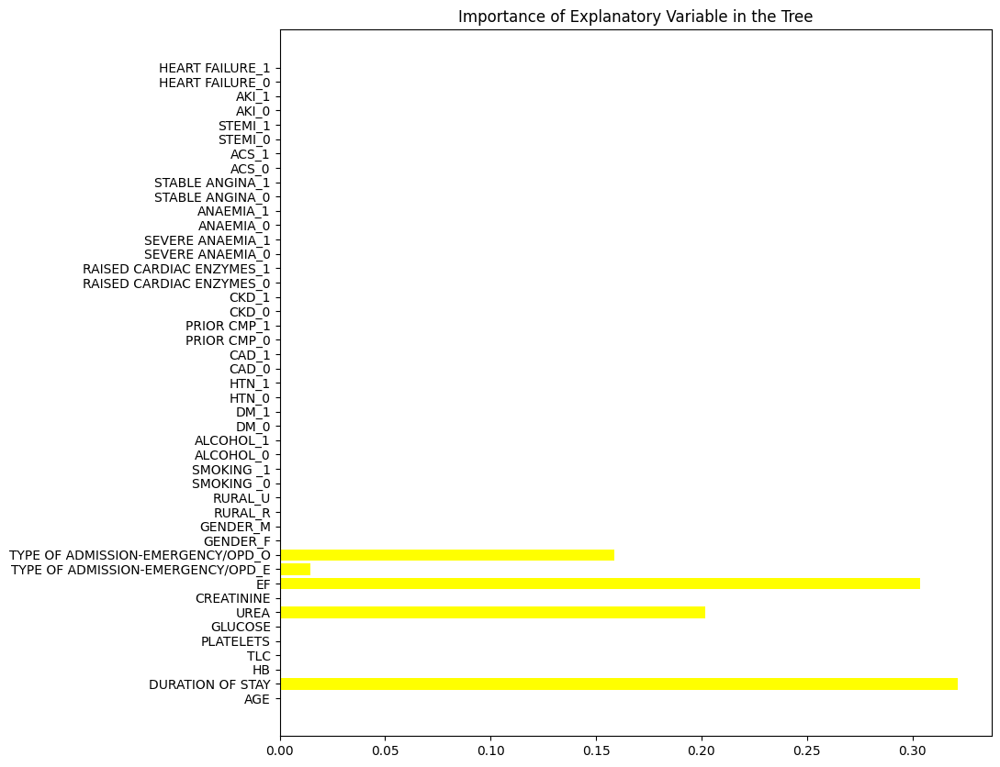

In [ ]:
# Plotting the variables based on the importance
plt.figure(figsize=(10,10))
plt.barh(np.arange(len(x_variables_out_withDummies)), clf_entropy.feature_importances_, color = "yellow")
plt.yticks(ticks=np.arange(len(x_variables_out_withDummies)), labels=x_variables_out_withDummies)
plt.title("Importance of Explanatory Variable in the Tree")
plt.show()

From the above feature of imprtance plot it is observed that Ejection fraction and Duration of Stay are the top influential explanatory variables for determining OUTCOME.

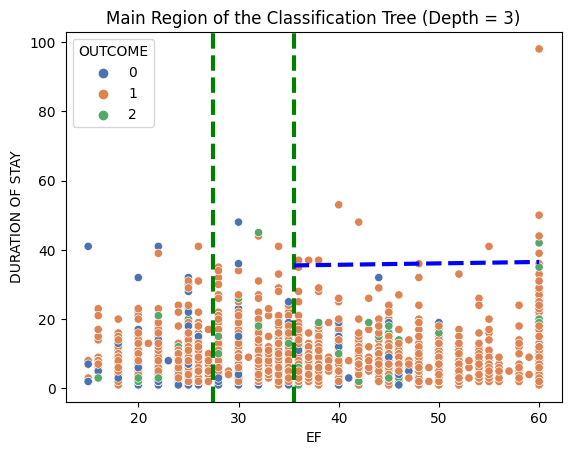

In [ ]:
# Plotting DURATION OF STAY and EF
dfout_tr_Xtree = pd.DataFrame()
dfout_tr_Xtree["DURATION OF STAY"] = dfout_tr_withDummies["DURATION OF STAY"]
dfout_tr_Xtree["EF"] = dfout_tr_withDummies["EF"]
dfout_tr_Xtree["OUTCOME"] = dfout_Y_tr[y_variable_out]

sns.scatterplot(data=dfout_tr_Xtree, x="EF", y="DURATION OF STAY", hue="OUTCOME",palette='deep')
plt.title("Main Region of the Classification Tree (Depth = 3)")
plt.axvline(35.5, ls='--', linewidth=3, color='green')
plt.axvline(27.5, ls='--', linewidth=3, color='green')
plt.plot([35.5,60], [35.5,36.5], ls='--', linewidth=3, color='blue')
#plt.axhline(200, ls='--', linewidth=3, color='red')

###6.3 SUMMARY

,ML_Model,Accuracy_Tr,Accuracy_Te
0,QDA (threshold = 0.5),0.530988,0.562469
1,GAUSSIAN NB,0.379259,0.394568
2,SVC C=1 kernel=rbf,0.926296,0.921975
3,RANDOM FOREST CLASSIFIER (n = 350),0.918124,0.927407
4,GRADIENT BOOSTING CLASSIFIER (n = 60),0.935062,0.921481
5,BAGGING CLASSIFIER (n = 50),0.919656,0.918519
6,CLASSIFICATION TREE (Depth = 3),0.905802,0.907654


(0.2, 1.0)

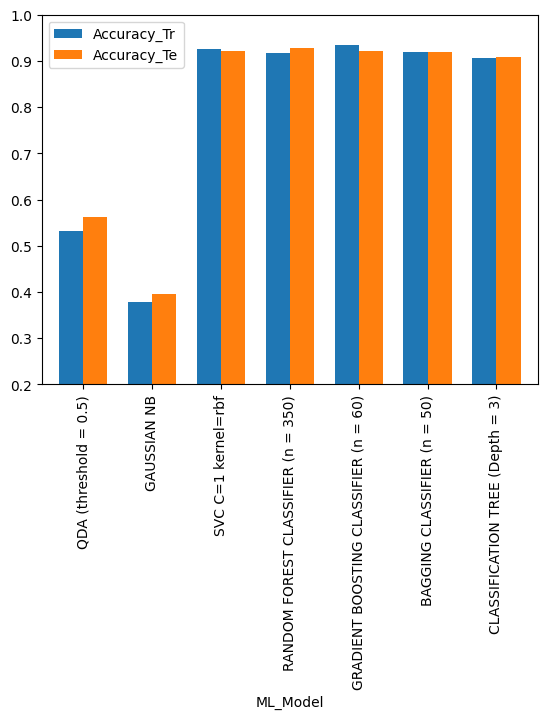

In [ ]:
# Plotting the Accuracy of Train and Test ML model
display(acc_summary_OUTCOME)


ax = acc_summary_OUTCOME.plot.bar(rot = 90,
                                       x="ML_Model",width=0.7)
ax.set_ylim([0.2,1.0])
#ax.grid(True)

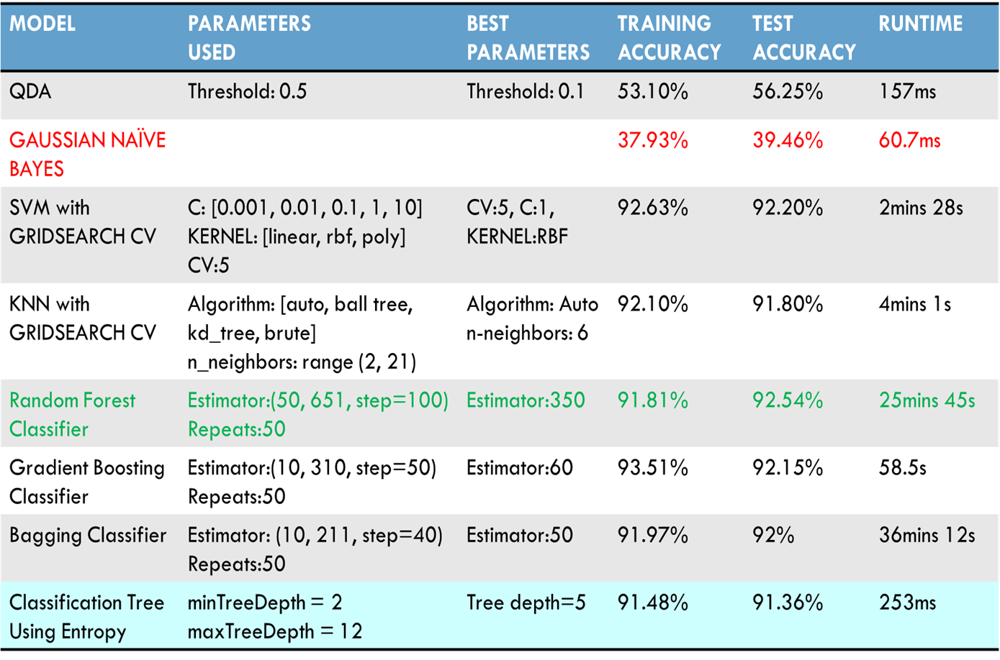

So from the above summary it is evident that Random Forest Classifier is the best model and Gaussian Naive Bayes is the least likeable model for the response variable OUTCOME. However, as previously mentioned if the proportions of the different classes were more uniform that different results may have derived.  When taking into consideration the balance between runtime and accuracy rate then Classification tree is the best model for predicting OUTCOME.

## 7- DURATION OF STAY (Quantitative Response) Analysis

### 7.1 KNN ANALYSIS

The intention is to pre-select quantitative variables that will be used for predicting the duration of stay at the hospital on the test set after a specified split.

The quatitative variables to be used are HB, TLC, PLATELETS, GLUCOSE, UREA, CREATININ, BNP and EF as well as the "DURATION OF STAY" as the dependent variable. Therefore dropping columns not relevant to the analysis.

In [ ]:
print(dataClean.dtypes)

AGE                                   int64
GENDER                             category
RURAL                              category
TYPE OF ADMISSION-EMERGENCY/OPD    category
DURATION OF STAY                      int64
OUTCOME                            category
SMOKING                            category
ALCOHOL                            category
DM                                 category
HTN                                category
CAD                                category
PRIOR CMP                          category
CKD                                category
HB                                  float64
TLC                                 float64
PLATELETS                           float64
GLUCOSE                             float64
UREA                                float64
CREATININE                          float64
RAISED CARDIAC ENZYMES             category
EF                                  float64
SEVERE ANAEMIA                     category
ANAEMIA                         

In [ ]:
# Dropping columns to keep only the numerical variables
data_duration = dataClean.drop(columns=['GENDER', 'TYPE OF ADMISSION-EMERGENCY/OPD', 'RURAL', 'OUTCOME', 'SMOKING ', 'ALCOHOL', 'DM','HTN', 'CAD','PRIOR CMP', 'CKD',
                                        'RAISED CARDIAC ENZYMES', 'SEVERE ANAEMIA', 'ANAEMIA', 'ACS', 'STEMI', 
                                        'HEART FAILURE', 'AKI', 'SMOKING', 'STABLE ANGINA'])

print(data_duration)

       AGE  DURATION OF STAY    HB   TLC  PLATELETS  GLUCOSE  UREA  \
0       81                 3   9.5  16.1      337.0     80.0  34.0   
1       65                 5  13.7   9.0      149.0    112.0  18.0   
3       67                 8  12.8   9.9      286.0    130.0  27.0   
4       60                23  13.6   9.1       26.0    144.0  55.0   
5       44                10  13.5  22.3      322.0    217.0  51.0   
...    ...               ...   ...   ...        ...      ...   ...   
15750   37                 2  14.3   8.4      475.0     92.0  15.0   
15752   86                 5   8.8  13.7      361.0    131.0  57.0   
15753   50                 2  13.2  15.6      142.0    248.0  94.0   
15754   82                10   9.3  11.7      372.0    210.0  67.0   
15755   59                 4  13.1  12.5      431.0    153.0  29.0   

       CREATININE    EF  
0            0.90  35.0  
1            0.90  42.0  
3            0.60  42.0  
4            1.25  16.0  
5            0.90  25.0  
...

Creating the X and Y components for the KNN analysis

####7.1.1KNN ANALYSIS BASED ON ONLY NUMERICAL INDEPENDENT VARIABLES

In [ ]:
data_duration.head()

,AGE,DURATION OF STAY,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF
0,81,3,9.5,16.1,337.0,80.0,34.0,0.90,35.0
1,65,5,13.7,9.0,149.0,112.0,18.0,0.90,42.0
3,67,8,12.8,9.9,286.0,130.0,27.0,0.60,42.0
4,60,23,13.6,9.1,26.0,144.0,55.0,1.25,16.0
5,44,10,13.5,22.3,322.0,217.0,51.0,0.90,25.0


Creating the X and Y components for the KNN analysis

In [ ]:
X_dura = data_duration.drop("DURATION OF STAY", axis = 1) # Feature Matrix

y_dura = data_duration["DURATION OF STAY"] # Target variable


display(X_dura)

display (y_dura)

,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF
0,81,9.5,16.1,337.0,80.0,34.0,0.90,35.0
1,65,13.7,9.0,149.0,112.0,18.0,0.90,42.0
3,67,12.8,9.9,286.0,130.0,27.0,0.60,42.0
4,60,13.6,9.1,26.0,144.0,55.0,1.25,16.0
5,44,13.5,22.3,322.0,217.0,51.0,0.90,25.0
...,...,...,...,...,...,...,...,...
15750,37,14.3,8.4,475.0,92.0,15.0,0.50,60.0
15752,86,8.8,13.7,361.0,131.0,57.0,1.40,38.0
15753,50,13.2,15.6,142.0,248.0,94.0,1.80,28.0
15754,82,9.3,11.7,372.0,210.0,67.0,1.90,32.0


0         3
1         5
3         8
4        23
5        10
         ..
15750     2
15752     5
15753     2
15754    10
15755     4
Name: DURATION OF STAY, Length: 10125, dtype: int64

Scaling the feature variables that would be used in the KNN regression

In [ ]:
y_dura.reset_index(drop=True, inplace= True)
X_dura.reset_index(drop=True, inplace= True)

print(y_dura.shape)
display(y_dura.head())

print(X_dura.shape)
display(X_dura.head())

(10125,)


0     3
1     5
2     8
3    23
4    10
Name: DURATION OF STAY, dtype: int64

(10125, 8)


,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF
0,81,9.5,16.1,337.0,80.0,34.0,0.90,35.0
1,65,13.7,9.0,149.0,112.0,18.0,0.90,42.0
2,67,12.8,9.9,286.0,130.0,27.0,0.60,42.0
3,60,13.6,9.1,26.0,144.0,55.0,1.25,16.0
4,44,13.5,22.3,322.0,217.0,51.0,0.90,25.0


In [ ]:
# Standardize (scale, recenter) the columns columns 
from sklearn.preprocessing import StandardScaler
scaler = skp.StandardScaler()
X_dura_standardized = scaler.fit_transform(X_dura)
X_dura_standardized = pd.DataFrame(X_dura_standardized)
X_dura_standardized.columns = [X_dura[:1]]
print(X_dura_standardized.shape)
X_dura_standardized.head()


(10125, 8)


,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF
0,1.497859,-1.225417,0.630874,0.961598,-0.984078,-0.355561,-0.349007,-0.678431
1,0.293452,0.590657,-0.368298,-0.881869,-0.610626,-0.776197,-0.349007,-0.154153
2,0.444003,0.201498,-0.241643,0.461509,-0.400560,-0.539589,-0.609057,-0.154153
3,-0.082926,0.547417,-0.354226,-2.087967,-0.237174,0.196524,-0.045616,-2.101469
4,-1.287333,0.504177,1.503392,0.814513,0.614763,0.091365,-0.349007,-1.427398


Finding the best Kn value to use for KNN Regression with iterations as in class example i.e.

Identifying the optimal value for n_neighbors by iterating over multiple values using a for loop (50 times) and at the same time applying KFolds splitting

In [ ]:
%%time
folds = KFold(n_splits=5, shuffle=True, random_state=None)

n_iter = range(50)
kn_lst = range(1, 25)
optimal_kn = []
for n in n_iter:
  mse_lst = []
  for x in kn_lst:
    # Creating a model using the KNN algorithm
      modelkn = KNeighborsRegressor(n_neighbors=x)
      mse_folds = []
      # Creating test and training sets from k-folds above
      for train_id, test_id in folds.split(X_dura_standardized):
          X_train_fold, X_test_fold = X_dura_standardized.iloc[train_id], X_dura_standardized.iloc[test_id]
          y_train_fold, y_test_fold = y_dura.iloc[train_id], y_dura.iloc[test_id]
          modelkn.fit(X_train_fold, y_train_fold)
          y_test_pred = modelkn.predict(X_test_fold)
          mse_fold = np.mean((y_test_fold - y_test_pred) ** 2)
          mse_folds.append(mse_fold)
      mse = np.mean(mse_folds)
      mse_lst.append(mse)
  # Computing optimal KN associated with minimum MSE   
  optimal_kn_lst = kn_lst[np.argmin(mse_lst)]
  # print(optimal_kn_lst)
  optimal_kn.append(optimal_kn_lst)

# Computing average KN from all 200 iterations
optimal_avg_kn = int(np.mean(optimal_kn))
print("Optimal value for n_neighbors:", optimal_avg_kn)

Optimal value for n_neighbors: 22
CPU times: user 18min 11s, sys: 1.02 s, total: 18min 12s
Wall time: 18min 17s


The optimal value for N neighbors is found to be 22

Checking to see how the iteration performed

In [ ]:
print(optimal_kn)
len(optimal_kn)

[19, 22, 19, 24, 24, 24, 20, 20, 24, 19, 23, 21, 23, 22, 23, 23, 24, 24, 22, 24, 21, 24, 24, 24, 23, 24, 24, 20, 24, 23, 24, 24, 23, 21, 22, 24, 24, 22, 24, 24, 24, 20, 21, 22, 24, 24, 24, 21, 22, 24]


50

In [ ]:
print(mse_lst)
len(mse_lst)

[41.40355555555555, 30.736320987654324, 27.205618655692728, 25.618092592592593, 24.340183703703705, 23.923020576131687, 23.239963718820864, 23.412651234567903, 22.931729919219627, 22.666208395061727, 22.57007244158759, 22.285670781893003, 22.219385492000878, 22.121166540690346, 22.11135692729767, 21.94141010802469, 21.790954590114914, 21.820701417466847, 21.80812202045074, 21.71512222222222, 21.773053162005546, 21.83072747678808, 21.692986627459216, 21.692726337448562]


24

Splitting into training and test set

In [ ]:
X_train_dura, X_test_dura, y_train_dura, y_test_dura = train_test_split(X_dura, y_dura, test_size = 0.2, random_state = 2023)

display(X_train_dura.head)
display(y_train_dura.head)


<bound method NDFrame.head of       AGE    HB   TLC  PLATELETS  GLUCOSE  UREA  CREATININE    EF
5807   64  12.1   8.8      194.0     90.0  27.0        0.61  60.0
7402   73  15.6  14.7      243.0    114.0  33.0        1.20  60.0
9939   60  12.0   7.7      226.0    140.0  33.0        0.70  60.0
2897   78  14.4   4.2       16.0    151.0  52.0        1.07  60.0
910    53   7.9  12.5      236.0    263.0  38.0        0.80  53.0
...   ...   ...   ...        ...      ...   ...         ...   ...
5852   64  15.3  25.9      160.0    258.0  50.0        1.22  22.0
6049   50  16.3  20.2       37.0    106.0  32.0        2.10  22.0
2743   68  13.4   2.4      138.0    157.0  19.0        0.90  45.0
5657   49  14.1   8.8      181.0    159.0  24.0        0.70  60.0
4951   53  15.7  16.2      296.0    160.0  18.0        0.60  38.0

[8100 rows x 8 columns]>

<bound method NDFrame.head of 5807     8
7402     6
9939     5
2897     7
910      8
        ..
5852    16
6049     3
2743     5
5657     3
4951     8
Name: DURATION OF STAY, Length: 8100, dtype: int64>

In [ ]:
display(X_test_dura)
display(y_test_dura)

,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF
7416,50,12.7,10.9,252.0,123.0,23.0,1.30,60.0
5401,68,12.5,8.9,284.0,160.0,28.0,0.89,60.0
4693,78,14.2,6.3,337.0,110.0,147.0,1.60,20.0
4110,82,10.7,17.0,85.0,115.0,179.0,3.40,20.0
719,82,15.8,9.4,223.0,98.0,23.0,0.60,38.0
...,...,...,...,...,...,...,...,...
8141,70,12.8,8.5,229.0,92.0,33.0,0.80,32.0
5984,35,12.7,8.1,411.0,85.0,19.0,0.50,60.0
351,50,14.8,14.1,257.0,69.0,28.0,1.17,37.0
5275,57,14.2,6.6,129.0,102.0,33.0,0.60,36.0


7416    12
5401     6
4693     7
4110     7
719      7
        ..
8141     8
5984     2
351      9
5275     2
9466     5
Name: DURATION OF STAY, Length: 2025, dtype: int64

Applying standard scaling on the dataset

Fit the scalar transform on the X_train_dura

Apply the scalar transform on the X_test_dura


In [ ]:
# Standardize (scale, recenter) the columns columns - otherwise distances will mostly be based on weight
scaler = skp.StandardScaler()
X_train_dura_standardized = scaler.fit_transform(X_train_dura)
X_train_dura_standardized = pd.DataFrame(X_train_dura_standardized)
X_train_dura_standardized.columns = [X_dura[:1]]
X_train_dura_standardized.head()


,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF
0,0.219183,-0.101362,-0.388862,-0.434869,-0.866183,-0.543768,-0.604822,1.188036
1,0.900305,1.408456,0.428439,0.046467,-0.585905,-0.383559,-0.084806,1.188036
2,-0.083538,-0.144499,-0.541240,-0.120527,-0.282270,-0.383559,-0.525498,1.188036
3,1.278707,0.890804,-1.026079,-2.183396,-0.153809,0.123768,-0.199386,1.188036
4,-0.613300,-1.913143,0.123683,-0.022295,1.154157,-0.250052,-0.437359,0.664153


In [ ]:
X_test_dura_standardized = scaler.transform(X_test_dura)
X_test_dura_standardized = pd.DataFrame(X_test_dura_standardized)
X_test_dura_standardized.columns = [X_dura[:1]]
X_test_dura_standardized.head()

,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF
0,-0.840340,0.157464,-0.097958,0.134875,-0.480800,-0.650573,0.003333,1.188036
1,0.521904,0.071189,-0.375009,0.449217,-0.048704,-0.517066,-0.358035,1.188036
2,1.278707,0.804529,-0.735175,0.969846,-0.632618,2.660401,0.267748,-1.805577
3,1.581428,-0.705289,0.747048,-1.505596,-0.574226,3.514846,1.854239,-1.805577
4,1.581428,1.494731,-0.305746,-0.149997,-0.772757,-0.650573,-0.613636,-0.458451


After the above computation, we will use the optimal value of n_neighbors to refit the model on the original training set and recompute the mean square error on the test set

Applying the KNN Regression model to the training data using the scaled outputs

In [ ]:
modelkn_main = KNeighborsRegressor(n_neighbors = optimal_avg_kn)
modelkn_main.fit(X_train_dura_standardized, y_train_dura)
y_test_durapred = modelkn_main.predict(X_test_dura_standardized)
mse_test_dura = np.mean((y_test_dura - y_test_durapred) ** 2)
print("Mean squared error on test set:", mse_test_dura)

Mean squared error on test set: 20.156507499234774


Computing accuracy score of the model

CPU times: user 1min 11s, sys: 514 ms, total: 1min 11s
Wall time: 1min 19s


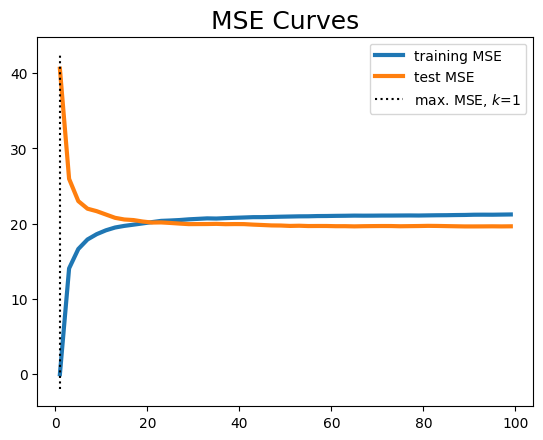

In [ ]:
%%time

ks = np.arange(1, 101, 2)
mses_tr_dura = []
mses_test_dura = []

for k in ks:
  modelkn2 = KNeighborsRegressor(n_neighbors=k)
  modelkn2.fit(X_train_dura_standardized, y_train_dura)
  
  mse_tr_dura = np.mean((y_train_dura - modelkn2.predict(X_train_dura_standardized))**2)
  mse_test_dura = np.mean((y_test_dura - modelkn2.predict(X_test_dura_standardized))**2)
  mses_tr_dura.append(mse_tr_dura)
  mses_test_dura.append(mse_test_dura)


k = ks[np.argmax(mse_test_dura)]
plt.plot(ks, mses_tr_dura, label="training MSE", lw=3)
plt.plot(ks, mses_test_dura, label="test MSE", lw=3)
plt.vlines(k, *plt.ylim(), colors="k", linestyles=":", label=f"max. MSE, $k$={k}")
plt.title("MSE Curves", fontsize=18)
plt.legend()

In [ ]:
print(mses_test_dura)


print(mses_tr_dura)

[40.5762962962963, 25.9518792866941, 22.99634567901235, 21.98504409171076, 21.65672306050907, 21.213688399142946, 20.772599897728103, 20.552182167352537, 20.474791746764065, 20.280489723333677, 20.143390162649418, 20.161833415015522, 20.092490271604937, 20.008993886433302, 19.936719073413485, 19.942881001014893, 19.949858177736967, 19.97123668430335, 19.929581834086335, 19.944383568315192, 19.937424372617713, 19.870673103245664, 19.819309251638472, 19.764096149869502, 19.75045438886061, 19.697924539944275, 19.721718286460188, 19.681335863687377, 19.68887566544692, 19.687849312493572, 19.66119833709908, 19.66269875485631, 19.637654174884943, 19.6611417209145, 19.67458335602283, 19.683286825806167, 19.681386774902755, 19.653315950617284, 19.668841621742057, 19.68357603343877, 19.706505670431902, 19.694700551424802, 19.672254671280278, 19.650959452868992, 19.630411236890215, 19.630596948838708, 19.635992628848832, 19.644681755069936, 19.633909797422746, 19.646302153597333]
[0.0, 14.055994

In [ ]:
print(np.min(mses_test_dura))


print(np.min(mses_tr_dura))

19.630411236890215
0.0


Therefore the minimum test MSE that was achieved is around 19.63

Original analysis using this method was KNN classification. However, it is modified to regressor as in other methods. 

####7.1.2 KNN USING BOTH NUMERICAL AND CATEGORICAL VARIABLES

The next is to evaluate using both numerical and categorical variables to see if we can get a better MSE value

In [ ]:
data_durationB = dataClean.drop(columns=['AGE', 'TYPE OF ADMISSION-EMERGENCY/OPD' ,'GENDER', 'RURAL','DURATION OF STAY', 'OUTCOME', 'SMOKING ','HB', 'TLC', 'PLATELETS', 'GLUCOSE','UREA', 'CREATININE','EF'])

print(data_durationB.columns)
print(data_durationB.shape)

display(data_durationB.tail())

Index(['ALCOHOL', 'DM', 'HTN', 'CAD', 'PRIOR CMP', 'CKD',
       'RAISED CARDIAC ENZYMES', 'SEVERE ANAEMIA', 'ANAEMIA', 'STABLE ANGINA',
       'ACS', 'STEMI', 'HEART FAILURE', 'AKI', 'SMOKING'],
      dtype='object')
(10125, 15)


,ALCOHOL,DM,HTN,CAD,PRIOR CMP,CKD,RAISED CARDIAC ENZYMES,SEVERE ANAEMIA,ANAEMIA,STABLE ANGINA,ACS,STEMI,HEART FAILURE,AKI,SMOKING
15750,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
15752,0,1,1,1,0,0,1,0,1,0,1,0,0,0,0
15753,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0
15754,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0
15755,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
data_durationB.reset_index(drop=True, inplace= True)

display(data_durationB.head())

,ALCOHOL,DM,HTN,CAD,PRIOR CMP,CKD,RAISED CARDIAC ENZYMES,SEVERE ANAEMIA,ANAEMIA,STABLE ANGINA,ACS,STEMI,HEART FAILURE,AKI,SMOKING
0,0,1,0,0,0,0,1,0,1,0,1,0,1,0,0
1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0
2,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0
4,0,1,1,1,1,0,0,0,0,0,1,0,1,0,0


Combining the scaled numerical table and the categorical table into one

In [ ]:
X_dura_standardized2 = pd.DataFrame(X_dura_standardized)

# X_dura_standardized2.columns = [str(s) for s in X_dura_standardized2.columns]
X_dura_standardized2.columns = [x[0] for x in X_dura_standardized2.columns]



display(X_dura_standardized2.head())

print(X_dura_standardized2.shape)

,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF
0,1.497859,-1.225417,0.630874,0.961598,-0.984078,-0.355561,-0.349007,-0.678431
1,0.293452,0.590657,-0.368298,-0.881869,-0.610626,-0.776197,-0.349007,-0.154153
2,0.444003,0.201498,-0.241643,0.461509,-0.400560,-0.539589,-0.609057,-0.154153
3,-0.082926,0.547417,-0.354226,-2.087967,-0.237174,0.196524,-0.045616,-2.101469
4,-1.287333,0.504177,1.503392,0.814513,0.614763,0.091365,-0.349007,-1.427398


(10125, 8)


In [ ]:
data_durationX = pd.concat([X_dura_standardized2, data_durationB], axis=1)

# data_durationX.columns = [x[1] for x in data_durationX.columns]

print(data_durationX.shape)
display(data_durationX.head())

(10125, 23)


,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF,ALCOHOL,DM,...,CKD,RAISED CARDIAC ENZYMES,SEVERE ANAEMIA,ANAEMIA,STABLE ANGINA,ACS,STEMI,HEART FAILURE,AKI,SMOKING
0,1.497859,-1.225417,0.630874,0.961598,-0.984078,-0.355561,-0.349007,-0.678431,0,1,...,0,1,0,1,0,1,0,1,0,0
1,0.293452,0.590657,-0.368298,-0.881869,-0.610626,-0.776197,-0.349007,-0.154153,1,0,...,0,0,0,0,0,0,0,0,0,0
2,0.444003,0.201498,-0.241643,0.461509,-0.400560,-0.539589,-0.609057,-0.154153,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-0.082926,0.547417,-0.354226,-2.087967,-0.237174,0.196524,-0.045616,-2.101469,0,0,...,0,0,0,0,0,0,0,0,0,0
4,-1.287333,0.504177,1.503392,0.814513,0.614763,0.091365,-0.349007,-1.427398,0,1,...,0,0,0,0,0,1,0,1,0,0


In [ ]:
y_dura.reset_index(drop=True, inplace= True)

print(y_dura.shape)
display(y_dura.head())

(10125,)


0     3
1     5
2     8
3    23
4    10
Name: DURATION OF STAY, dtype: int64

Analyzing with all the variables

In [ ]:
X_dura2 = data_durationX

print(X_dura2.shape)
display(X_dura2.head())

(10125, 23)


,AGE,HB,TLC,PLATELETS,GLUCOSE,UREA,CREATININE,EF,ALCOHOL,DM,...,CKD,RAISED CARDIAC ENZYMES,SEVERE ANAEMIA,ANAEMIA,STABLE ANGINA,ACS,STEMI,HEART FAILURE,AKI,SMOKING
0,1.497859,-1.225417,0.630874,0.961598,-0.984078,-0.355561,-0.349007,-0.678431,0,1,...,0,1,0,1,0,1,0,1,0,0
1,0.293452,0.590657,-0.368298,-0.881869,-0.610626,-0.776197,-0.349007,-0.154153,1,0,...,0,0,0,0,0,0,0,0,0,0
2,0.444003,0.201498,-0.241643,0.461509,-0.400560,-0.539589,-0.609057,-0.154153,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-0.082926,0.547417,-0.354226,-2.087967,-0.237174,0.196524,-0.045616,-2.101469,0,0,...,0,0,0,0,0,0,0,0,0,0
4,-1.287333,0.504177,1.503392,0.814513,0.614763,0.091365,-0.349007,-1.427398,0,1,...,0,0,0,0,0,1,0,1,0,0


In [ ]:
%%time
folds2 = KFold(n_splits=5, shuffle=True, random_state=None)

n_iter2 = range(50)
kn_lst2 = range(1, 25)
optimal_kn2 = []
for n in n_iter2:
  mse_lst2 = []
  for x in kn_lst2:
    # Creating a model using the KNN algorithm
      modelkn2 = KNeighborsRegressor(n_neighbors=x)
      mse_folds2 = []
      # Creating test and training sets from k-folds above
      for train_id2, test_id2 in folds.split(X_dura2):
          X_train2_fold, X_test2_fold = X_dura2.iloc[train_id2], X_dura2.iloc[test_id2]
          y_train2_fold, y_test2_fold = y_dura.iloc[train_id2], y_dura.iloc[test_id2]
          modelkn2.fit(X_train2_fold, y_train2_fold)
          y_test2_pred = modelkn2.predict(X_test2_fold)
          mse_fold2 = np.mean((y_test2_fold - y_test2_pred) ** 2)
          mse_folds2.append(mse_fold2)
      mse2 = np.mean(mse_folds2)
      mse_lst2.append(mse2)
  # Computing optimal KN associated with minimum MSE   
  optimal_kn_lst2 = kn_lst2[np.argmin(mse_lst2)]
  # print(optimal_kn_lst)
  optimal_kn2.append(optimal_kn_lst2)

# Computing average KN from all 200 iterations
optimal_avg_kn2 = int(np.mean(optimal_kn2))
print("Optimal value for n_neighbors:", optimal_avg_kn2)

Optimal value for n_neighbors: 23
CPU times: user 22min 2s, sys: 2.3 s, total: 22min 4s
Wall time: 12min 11s


The optimal value for N neighbors is found to be 23

Checking to see how the iteration performed

In [ ]:
print(optimal_kn2)
len(optimal_kn2)

[23, 24, 24, 23, 23, 23, 24, 24, 24, 24, 24, 24, 24, 23, 24, 23, 24, 24, 24, 24, 24, 24, 24, 23, 24, 24, 22, 24, 22, 24, 23, 24, 24, 23, 21, 23, 24, 23, 23, 23, 24, 24, 23, 24, 24, 24, 22, 24, 24, 24]


50

In [ ]:
print(mse_lst2)
len(mse_lst2)

[38.87111111111112, 30.043654320987656, 26.891928669410152, 25.66116049382716, 24.392821728395063, 23.59981618655693, 23.144399092970524, 23.163239197530864, 22.787456790123453, 22.471290864197535, 22.389436179981637, 22.17628806584362, 22.173165607422014, 22.05543512219703, 21.698738216735254, 21.643877314814816, 21.675916100645054, 21.623687852461515, 21.36539297561643, 21.504945679012348, 21.368184989222026, 21.38268972553821, 21.35999775957432, 21.294423010973937]


24

Splitting into training and test set

In [ ]:
X_train_dura2, X_test_dura2, y_train_dura2, y_test_dura2 = train_test_split(X_dura2, y_dura, test_size = 0.2, random_state = 2023)

display(X_train_dura2.head)
display(y_train_dura2.head)

<bound method NDFrame.head of            AGE        HB       TLC  PLATELETS   GLUCOSE      UREA  CREATININE  \
5807  0.218176 -0.101181 -0.396444  -0.440614 -0.867374 -0.539589   -0.600388   
7402  0.895655  1.412214  0.433854   0.039865 -0.587286 -0.381851   -0.088958   
9939 -0.082926 -0.144421 -0.551246  -0.126832 -0.283856 -0.381851   -0.522374   
2897  1.272033  0.893336 -1.043796  -2.186024 -0.155482  0.117654   -0.201646   
910  -0.609854 -1.917255  0.124252  -0.028775  1.151600 -0.250402   -0.435690   
...        ...       ...       ...        ...       ...       ...         ...   
5852  0.218176  1.282494  2.010014  -0.774007  1.093248  0.065075   -0.071621   
6049 -0.835680  1.714893  1.207862  -1.980105 -0.680648 -0.408140    0.691191   
2743  0.519278  0.460937 -1.297107  -0.989731 -0.085460 -0.749907   -0.349007   
5657 -0.910956  0.763616 -0.396444  -0.568087 -0.062119 -0.618458   -0.522374   
4951 -0.609854  1.455454  0.644947   0.559565 -0.050449 -0.776197   -0.609057  

<bound method NDFrame.head of 5807     8
7402     6
9939     5
2897     7
910      8
        ..
5852    16
6049     3
2743     5
5657     3
4951     8
Name: DURATION OF STAY, Length: 8100, dtype: int64>

After the above computation, we will use the optimal value of n_neighbors to refit the model on the original training set and recompute the mean square error on the test set

Applying the KNN Regression model to the training data using the scaled outputs

In [ ]:
modelkn2_main = KNeighborsRegressor(n_neighbors = optimal_avg_kn2)
modelkn2_main.fit(X_train_dura2, y_train_dura2)
y_test_durapred2 = modelkn2_main.predict(X_test_dura2)
mse_test_dura2 = np.mean((y_test_dura2 - y_test_durapred2) ** 2)
print("Mean squared error on test set:", mse_test_dura2)

Mean squared error on test set: 19.58430208406264


Evaluating accuracy score of the model

CPU times: user 1min 6s, sys: 237 ms, total: 1min 6s
Wall time: 1min 8s


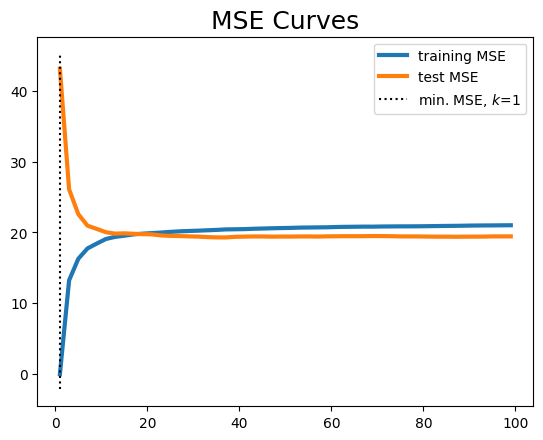

In [ ]:
%%time
ks = np.arange(1, 101, 2)
mses_tr_dura2 = []
mses_test_dura2 = []

for k in ks:
  modelkn3 = KNeighborsRegressor(n_neighbors=k)
  modelkn3.fit(X_train_dura2, y_train_dura2)
  
  mse_tr_dura2 = np.mean((y_train_dura2 - modelkn3.predict(X_train_dura2))**2)
  mse_test_dura2 = np.mean((y_test_dura2 - modelkn3.predict(X_test_dura2))**2)
  mses_tr_dura2.append(mse_tr_dura2)
  mses_test_dura2.append(mse_test_dura2)


k = ks[np.argmax(mse_test_dura2)]
plt.plot(ks, mses_tr_dura2, label="training MSE", lw=3)
plt.plot(ks, mses_test_dura2, label="test MSE", lw=3)
plt.vlines(k, *plt.ylim(), colors="k", linestyles=":", label=f"min. MSE, $k$={k}")
plt.title("MSE Curves", fontsize=18)
plt.legend()

In [ ]:
print(np.min(mses_test_dura2))


print(np.min(mses_tr_dura2))

19.30019857695533
0.0


Attempting a simple form of Kn regressor

In [ ]:
n = 37

In [ ]:
duration_neigh = KNeighborsRegressor(n_neighbors=n)
duration_neigh.fit(X_train_dura2,y_train_dura2)
duration_neigh_predictions = duration_neigh.predict(X_test_dura2)
duration_neigh_predictions

array([4.72972973, 3.56756757, 7.91891892, ..., 5.67567568, 4.75675676,
       4.67567568])

In [ ]:
# MSE
skm.mean_squared_error(y_true=y_test_dura2,
                   y_pred=duration_neigh.predict(X_test_dura2))

19.30019857695533

In [ ]:
mse_test_knn_dura2 = np.mean((y_test_dura2 - duration_neigh.predict(X_test_dura2)) ** 2)

print(mse_test_knn_dura2)

19.30019857695533


Attempting to use grid search for analysis

In [ ]:
%%time
# Setting parameters
#parameters = {'kernel':('linear', 'rbf', 'poly'), 'C':[ 0.001, 0.01, 0.1, 1, 10]}
# parameters = {'kernel':['linear', 'rbf', 'poly'], 'C':[0.001, 0.01, 0.1, 1, 10]}

knn = KNeighborsRegressor()

k_range = list(range(1, 31))
param_grid = dict(n_neighbors=k_range)
# parameters = {'kernel':['knn'], 'C':[0.1, 1, 10]}
# svc1 = svm.SVC()
cvGridsearch = GridSearchCV(knn, param_grid, cv=10,verbose=1)

# Fitting the model based on Train Part
cvGridsearch.fit(X_train_dura2, np.ravel(y_train_dura2))


print("The best parameters for the Support Vector Classifier are: ", cvGridsearch.best_params_)

# Accuracy of apply training points of the generated model
y_pred_tr = cvGridsearch.predict(X_train_dura2)
mse_train1 = skm.mean_squared_error(y_train_dura2, y_pred_tr)
print('Classification Accuracy of the fitted SVC model to\
 predict TRAIN part: ',mse_train1)

# Accuracy of apply all test point
y_pred_te = cvGridsearch.predict(X_test_dura2)
mse_test1 = skm.mean_squared_error(y_test_dura2, y_pred_te)
print('Classification Accuracy of the fitted SVC model to\
 predict TEST part: ',mse_test1)



Fitting 10 folds for each of 30 candidates, totalling 300 fits
The best parameters for the Support Vector Classifier are:  {'n_neighbors': 30}
Classification Accuracy of the fitted SVC model to predict TRAIN part:  20.24020109739369
Classification Accuracy of the fitted SVC model to predict TEST part:  19.41875390946502
CPU times: user 31.8 s, sys: 106 ms, total: 31.9 s
Wall time: 18.2 s


In [ ]:
print(mean_squared_error(y_test_dura2, y_pred_te))

19.41875390946502


### 7.2 REGRESSION TREE

In [ ]:
from sklearn.model_selection import cross_val_score

# to build a tree, we could use 'gini' or 'entropy' as split criterion at each node. 
# here we use an example use 'gini' and with a few other hyperparameters.


regr_tree = DecisionTreeRegressor(max_depth=2, random_state = 2023)
regr_tree.fit(X_train_dura2, y_train_dura2)

cv = cross_val_score(regr_tree, X_train_dura2, y_train_dura2, cv=10)

print(cv)

# Accuracy of apply training points of the generated model
# acc_train = accuracy_score(y_train_dura2, regr_tree.predict(X_train_dura2))
# print('Classification Accuracy of the fitted Classification Tree model to\
#  predict TRAIN part: ',acc_train)


# # Accuracy of apply all test point
# acc_test = accuracy_score(y_test_dura2, regr_tree.predict(X_test_dura2))
# print('Classification Accuracy of the fitted Classification Tree model to\
#  predict TRAIN part: ',acc_test)

[0.08925203 0.06370794 0.05099646 0.0448197  0.04793898 0.03911326
 0.05534359 0.05578722 0.06687464 0.06896072]


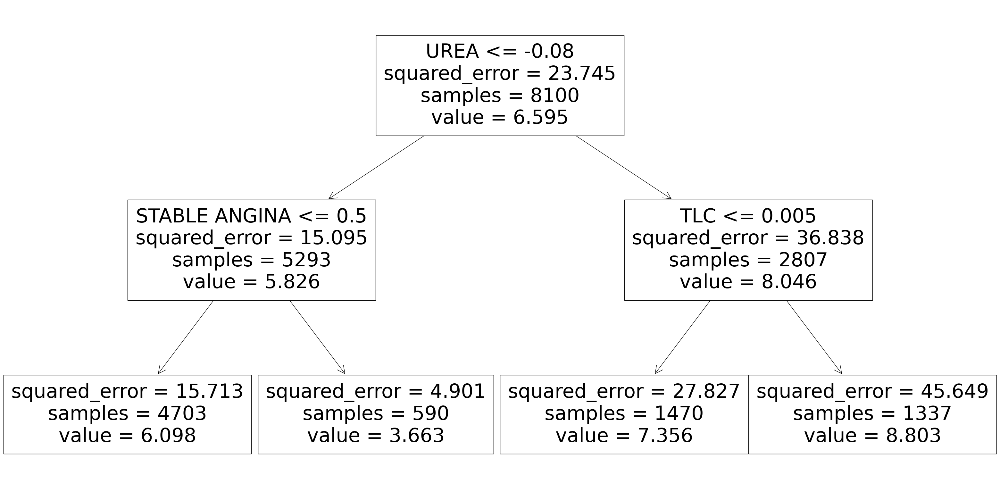

In [ ]:
plt.figure(figsize=(40,20))  # customize according to the size of your tree
plot_tree(regr_tree, feature_names = X_train_dura2.columns)
plt.show()

In [ ]:
y_pred1 = regr_tree.predict(X_test_dura2)
print(mean_squared_error(y_test_dura2, y_pred1))

20.605091883529486


Therefore the MSE for the Regression Tree is 20.61

### 7.3 - OTHER ML

Before applying other ML methods, it was necessary to redo some datclean to consider some other other columns which were not considered in the previous analysis with Qualitative Response.

In [ ]:
import pandas as pd
import io
data = pd.read_csv(io.BytesIO(uploaded['HDHI Admission data.csv']), header=0, na_values='NA')

In [ ]:
# Checking Read Data

# Data dimensions
print(data.shape)

# Checking Head and column names
display(data.head())

# Checking the summary of each column and datatype
print(data.dtypes)

print(data.describe())

(15757, 56)


,SNO,MRD No.,D.O.A,D.O.D,AGE,GENDER,RURAL,TYPE OF ADMISSION-EMERGENCY/OPD,month year,DURATION OF STAY,...,CONGENITAL,UTI,NEURO CARDIOGENIC SYNCOPE,ORTHOSTATIC,INFECTIVE ENDOCARDITIS,DVT,CARDIOGENIC SHOCK,SHOCK,PULMONARY EMBOLISM,CHEST INFECTION
0,1,234735,4/1/2017,4/3/2017,81,M,R,E,Apr-17,3,...,0,0,0,0,0,0,0,0,0,0
1,2,234696,4/1/2017,4/5/2017,65,M,R,E,Apr-17,5,...,0,0,0,0,0,0,0,0,0,0
2,3,234882,4/1/2017,4/3/2017,53,M,U,E,Apr-17,3,...,0,0,0,0,0,0,0,0,0,0
3,4,234635,4/1/2017,4/8/2017,67,F,U,E,Apr-17,8,...,0,0,0,0,0,0,0,0,0,0
4,5,234486,4/1/2017,4/23/2017,60,F,U,E,Apr-17,23,...,0,0,0,0,0,0,0,0,0,0


SNO                                 int64
MRD No.                            object
D.O.A                              object
D.O.D                              object
AGE                                 int64
GENDER                             object
RURAL                              object
TYPE OF ADMISSION-EMERGENCY/OPD    object
month year                         object
DURATION OF STAY                    int64
duration of intensive unit stay     int64
OUTCOME                            object
SMOKING                             int64
ALCOHOL                             int64
DM                                  int64
HTN                                 int64
CAD                                 int64
PRIOR CMP                           int64
CKD                                 int64
HB                                 object
TLC                                object
PLATELETS                          object
GLUCOSE                            object
UREA                              

In [ ]:
# Changing Types 
# Qualitative variables from "int" to "str"
col_classifiers = ["OUTCOME","SMOKING ", "ALCOHOL", "DM", "HTN", "CAD",
                  "PRIOR CMP", "CKD", "RAISED CARDIAC ENZYMES", 
                  "SEVERE ANAEMIA", "ANAEMIA", "STABLE ANGINA", "ACS",
                  "STEMI", "ATYPICAL CHEST PAIN", "HEART FAILURE",
                  "HFREF", "HFNEF", "VALVULAR", "CHB", "SSS", "AKI",
                  "CVA INFRACT", "CVA BLEED", "AF", "VT", "PSVT", "CONGENITAL",
                  "UTI", "NEURO CARDIOGENIC SYNCOPE", "ORTHOSTATIC",
                  "INFECTIVE ENDOCARDITIS", "DVT", "CARDIOGENIC SHOCK", 
                  "SHOCK", "PULMONARY EMBOLISM", "GENDER", "RURAL",
                   "TYPE OF ADMISSION-EMERGENCY/OPD", "CHEST INFECTION"]

data[col_classifiers]=data[col_classifiers].astype('category')

# Quantitative variables from "object" to "numeric"
col_numeric = ["GLUCOSE","HB", "EF",  "TLC", "PLATELETS",
                  "UREA", "CREATININE"]

data[col_numeric] = data[col_numeric].apply(pd.to_numeric, errors='coerce')




print(data.dtypes)

SNO                                   int64
MRD No.                              object
D.O.A                                object
D.O.D                                object
AGE                                   int64
GENDER                             category
RURAL                              category
TYPE OF ADMISSION-EMERGENCY/OPD    category
month year                           object
DURATION OF STAY                      int64
duration of intensive unit stay       int64
OUTCOME                            category
SMOKING                            category
ALCOHOL                            category
DM                                 category
HTN                                category
CAD                                category
PRIOR CMP                          category
CKD                                category
HB                                  float64
TLC                                 float64
PLATELETS                           float64
GLUCOSE                         

In [ ]:
# Remove duplicates based on MRD No which is the admission number
dataClean= data.drop_duplicates(subset=['MRD No.'])

# Creatinga copy to avoid dependenc eof original dataframe
dataClean = dataClean.copy()

print(dataClean.shape)

(12244, 56)


In [ ]:
print(dataClean.columns)

Index(['SNO', 'MRD No.', 'D.O.A', 'D.O.D', 'AGE', 'GENDER', 'RURAL',
       'TYPE OF ADMISSION-EMERGENCY/OPD', 'month year', 'DURATION OF STAY',
       'duration of intensive unit stay', 'OUTCOME', 'SMOKING ', 'ALCOHOL',
       'DM', 'HTN', 'CAD', 'PRIOR CMP', 'CKD', 'HB', 'TLC', 'PLATELETS',
       'GLUCOSE', 'UREA', 'CREATININE', 'BNP', 'RAISED CARDIAC ENZYMES', 'EF',
       'SEVERE ANAEMIA', 'ANAEMIA', 'STABLE ANGINA', 'ACS', 'STEMI',
       'ATYPICAL CHEST PAIN', 'HEART FAILURE', 'HFREF', 'HFNEF', 'VALVULAR',
       'CHB', 'SSS', 'AKI', 'CVA INFRACT', 'CVA BLEED', 'AF', 'VT', 'PSVT',
       'CONGENITAL', 'UTI', 'NEURO CARDIOGENIC SYNCOPE', 'ORTHOSTATIC',
       'INFECTIVE ENDOCARDITIS', 'DVT', 'CARDIOGENIC SHOCK', 'SHOCK',
       'PULMONARY EMBOLISM', 'CHEST INFECTION'],
      dtype='object')


In [ ]:
# Removing Columns which are not used in our project
dataClean.drop(columns=['SNO','MRD No.','D.O.A','D.O.D', 'month year',
                        'duration of intensive unit stay','GENDER', 'RURAL','TYPE OF ADMISSION-EMERGENCY/OPD',
                        'BNP','ATYPICAL CHEST PAIN','HFREF', 'HFNEF', 'VALVULAR','OUTCOME',
                        'CHB', 'SSS', 'CVA INFRACT', 'CVA BLEED', 'AF', 'VT',
                        'PSVT', 'CONGENITAL', 'UTI', 'NEURO CARDIOGENIC SYNCOPE',
                        'ORTHOSTATIC','INFECTIVE ENDOCARDITIS', 'DVT','CARDIOGENIC SHOCK',
                        'SHOCK', 'PULMONARY EMBOLISM','CHEST INFECTION' 
                      ], inplace=True)


# Removing rows with missing data
dataClean = dataClean.dropna(axis = 0, how ='any') 

print(dataClean.shape)

(10125, 24)


In [ ]:
print(dataClean.describe())

# Checking if there some missing data
dataClean.isna().sum()   #No missing data

                AGE  DURATION OF STAY            HB           TLC  \
count  10125.000000      10125.000000  10125.000000  10125.000000   
mean      61.101630          6.593481     12.333999     11.617083   
std       13.285198          4.834997      2.312796      7.106228   
min        4.000000          1.000000      3.000000      0.300000   
25%       53.000000          3.000000     10.800000      8.000000   
50%       62.000000          6.000000     12.500000     10.200000   
75%       70.000000          8.000000     13.900000     13.600000   
max      110.000000         98.000000     22.000000    261.000000   

          PLATELETS       GLUCOSE          UREA    CREATININE            EF  
count  10125.000000  10125.000000  10125.000000  10125.000000  10125.000000  
mean     238.934536    164.322785     47.524704      1.302624     44.058212  
std      101.986779     85.691321     38.039530      1.153683     13.352373  
min        1.380000      1.200000      0.100000      0.065000     

AGE                       0
DURATION OF STAY          0
SMOKING                   0
ALCOHOL                   0
DM                        0
HTN                       0
CAD                       0
PRIOR CMP                 0
CKD                       0
HB                        0
TLC                       0
PLATELETS                 0
GLUCOSE                   0
UREA                      0
CREATININE                0
RAISED CARDIAC ENZYMES    0
EF                        0
SEVERE ANAEMIA            0
ANAEMIA                   0
STABLE ANGINA             0
ACS                       0
STEMI                     0
HEART FAILURE             0
AKI                       0
dtype: int64

In [ ]:
print(dataClean.dtypes)

AGE                          int64
DURATION OF STAY             int64
SMOKING                   category
ALCOHOL                   category
DM                        category
HTN                       category
CAD                       category
PRIOR CMP                 category
CKD                       category
HB                         float64
TLC                        float64
PLATELETS                  float64
GLUCOSE                    float64
UREA                       float64
CREATININE                 float64
RAISED CARDIAC ENZYMES    category
EF                         float64
SEVERE ANAEMIA            category
ANAEMIA                   category
STABLE ANGINA             category
ACS                       category
STEMI                     category
HEART FAILURE             category
AKI                       category
dtype: object


#### 7.3.1 Ada Boost Regressor


In [ ]:
# Split the dataset into input features (X) and target variable (y)
X_1 = dataClean.drop('DURATION OF STAY', axis=1)
y_1 = dataClean['DURATION OF STAY']

In [ ]:
from sklearn.model_selection import GridSearchCV, train_test_split
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_1, y_1, test_size=0.2, random_state=42)

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore')

# Create an AdaBoost regressor object with Decision Tree as the base estimator
adaboost = AdaBoostRegressor(n_estimators = 100, learning_rate=1.0, base_estimator=DecisionTreeRegressor())

Important Parameters

n_estimators: Number of weak learners to train iteratively.

learning_rate = It contributes to the weights of weak learners. It uses 1 as default value.

In [ ]:
adaboost.fit(X_train, y_train)


AdaBoostRegressor(base_estimator=DecisionTreeRegressor(), n_estimators=100)

In [ ]:
# Predict the response for test dataset
y_pred = adaboost.predict(X_test)

In [ ]:
# Evaluate the AdaBoost regressor using the mean squared error metric
mse = mean_squared_error(y_test, y_pred)
print(f'Mean squared error: {mse:.2f}')

Mean squared error: 26.87


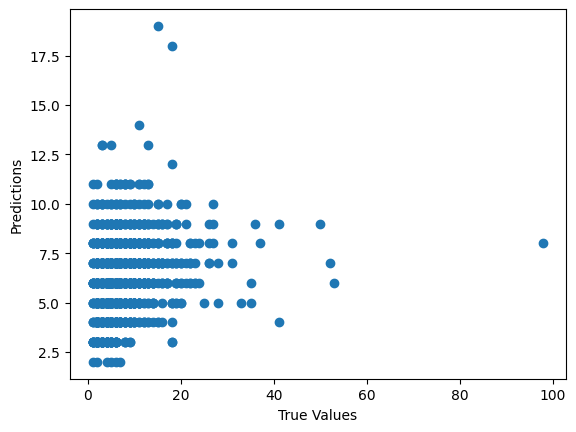

In [ ]:
import matplotlib.pyplot as plt

# Plot the predicted values against the true values for the test set
plt.scatter(y_test, y_pred)
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error



# Split the dataset into input features (X) and target variable (y)
X_1 = dataClean.drop('DURATION OF STAY', axis=1)
y_1 = dataClean['DURATION OF STAY']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_1, y_1, test_size=0.2, random_state=42)


# Define the hyperparameters to tune
params = {'n_estimators': [50, 100, 200],
          'learning_rate': [0.05, 0.1, 0.2]}

# Create an AdaBoost Regressor
ab = AdaBoostRegressor(random_state=42)

# Perform Grid Search to find the best hyperparameters
grid_search = GridSearchCV(ab, params, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters and fit the model
best_params = grid_search.best_params_
ab_best = AdaBoostRegressor(**best_params, random_state=42)
ab_best.fit(X_train, y_train)

# Predict the target values for the test data
y_pred = ab_best.predict(X_test)

# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("MSE:", mse)

MSE: 26.894849729943598


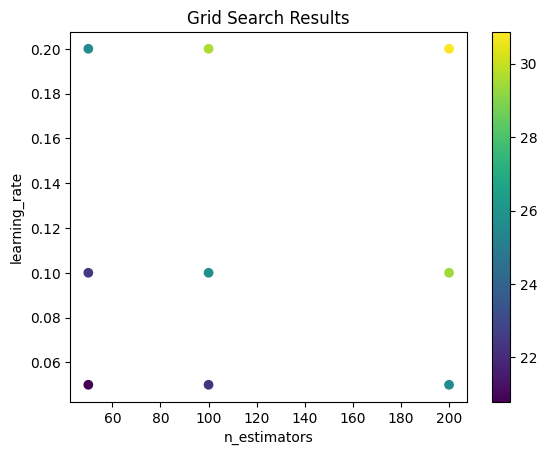

In [ ]:
import matplotlib.pyplot as plt

# Get the results of the grid search
results = grid_search.cv_results_

# Get the mean test scores for each combination of hyperparameters
mean_test_scores = -results['mean_test_score']

# Get the hyperparameters
n_estimators = results['param_n_estimators'].astype(int)
learning_rate = results['param_learning_rate'].astype(float)

# Plot the mean test score for each combination of hyperparameters
fig, ax = plt.subplots()
im = ax.scatter(n_estimators, learning_rate, c=mean_test_scores, cmap='viridis')
ax.set_xlabel('n_estimators')
ax.set_ylabel('learning_rate')
ax.set_title('Grid Search Results')
fig.colorbar(im, ax=ax)
plt.show()

#### 7.3.2 Gradient Boosting Regressor


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

X_2 = dataClean.drop('DURATION OF STAY', axis=1)
y_2 = dataClean['DURATION OF STAY']

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_2, y_2, test_size=0.2, random_state=42)

In [ ]:
# Define the hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [2, 3, 4],
    'learning_rate': [0.1, 0.01, 0.001],
    'loss': ['ls', 'lad', 'huber']
}

In [ ]:
# Create a Gradient Boosting Regressor object
gb = GradientBoostingRegressor(random_state=42)

# Create a GridSearchCV object
grid_search = GridSearchCV(gb, param_grid, cv=5, scoring='neg_mean_squared_error')


In [ ]:
# Fit the GridSearchCV object to the training data
grid_search.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=GradientBoostingRegressor(random_state=42),
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'loss': ['ls', 'lad', 'huber'], 'max_depth': [2, 3, 4],
                         'n_estimators': [50, 100, 150]},
             scoring='neg_mean_squared_error')

In [ ]:
# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a new Gradient Boosting Regressor object with the best hyperparameters
best_gb = GradientBoostingRegressor(**best_params)

In [ ]:
# Fit the model to the training data
best_gb.fit(X_train, y_train)

GradientBoostingRegressor(loss='huber', max_depth=4, n_estimators=50)

In [ ]:
# Make predictions on the test data
y_pred = best_gb.predict(X_test)

In [ ]:
# Calculate the mean squared error
mse = mean_squared_error(y_test, y_pred)

In [ ]:
# Print the mean squared error and the best hyperparameters
print("Best Hyperparameters:", best_params)
print("Mean Squared Error:", mse)

Best Hyperparameters: {'learning_rate': 0.1, 'loss': 'huber', 'max_depth': 4, 'n_estimators': 50}
Mean Squared Error: 26.296458643639138


In [ ]:
print(dataClean.columns)

Index(['AGE', 'DURATION OF STAY', 'SMOKING ', 'ALCOHOL', 'DM', 'HTN', 'CAD',
       'PRIOR CMP', 'CKD', 'HB', 'TLC', 'PLATELETS', 'GLUCOSE', 'UREA',
       'CREATININE', 'RAISED CARDIAC ENZYMES', 'EF', 'SEVERE ANAEMIA',
       'ANAEMIA', 'STABLE ANGINA', 'ACS', 'STEMI', 'HEART FAILURE', 'AKI'],
      dtype='object')


#### 7.3.3 XgBoost Regressor

In [ ]:
import xgboost as xgb
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder


# Split the data into X (features) and y (response variable)
X_2 = dataClean.drop('DURATION OF STAY', axis=1)
y_2 = dataClean['DURATION OF STAY']

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_2, y_2, test_size=0.2, random_state=42)


# Create one-hot encodings for the categorical variables
cat_vars = ['SMOKING ', 'ALCOHOL', 'DM', 'HTN', 'CAD','PRIOR CMP', 'CKD','RAISED CARDIAC ENZYMES','SEVERE ANAEMIA',
       'ANAEMIA', 'STABLE ANGINA', 'ACS', 'STEMI', 'HEART FAILURE', 'AKI']

       
# Label encode categorical variables
le = LabelEncoder()
for col in cat_vars:
    X_train[col] = le.fit_transform(X_train[col])
    X_test[col] = le.transform(X_test[col])

# Train an XGBoost model
model = xgb.XGBRegressor()
model.fit(X_train, y_train)

# Make predictions on test data
y_pred = model.predict(X_test)



In [ ]:
# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("MSE:", mse)

MSE: 28.85594758183941


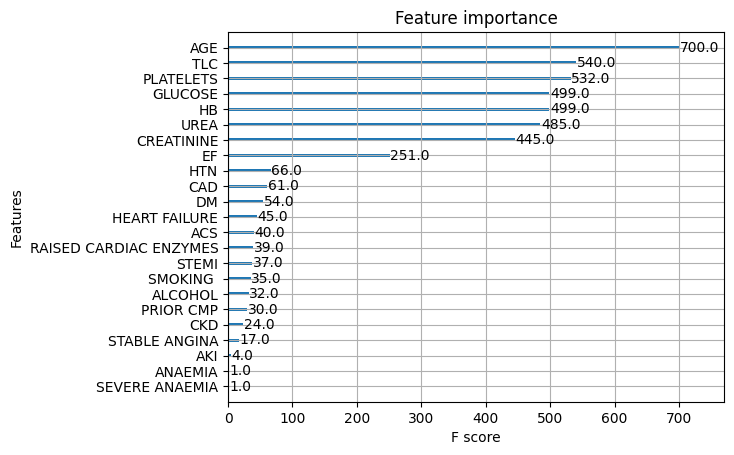

In [ ]:
from xgboost import plot_importance
import matplotlib.pyplot as plt

# Plot feature importance
plot_importance(model)
plt.show()

In [ ]:
# Evaluate the model using RMSE
import numpy as np
rmse = np.sqrt(np.mean((y_test - y_pred)**2))
print("RMSE: ", rmse)

RMSE:  5.371773225094244


#### 7.3.4 Bagging with Random Forest Regressor

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import plot_tree
from sklearn.ensemble import BaggingRegressor


In [ ]:
X_3 = dataClean.drop('DURATION OF STAY', axis=1)
y_3 = dataClean['DURATION OF STAY']


# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_3, y_3, test_size=0.2, random_state=42)



# Create a random forest regressor object
rf_reg = RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42)


# Create a bagging regressor object using the random forest regressor as the base estimator
bag_reg = BaggingRegressor(base_estimator=rf_reg, n_estimators=10, random_state=42)


# Fit the bagging regressor on the training data
bag_reg.fit(X_train, y_train)


BaggingRegressor(base_estimator=RandomForestRegressor(max_depth=5,
                                                      random_state=42),
                 random_state=42)

In [ ]:
# Predict on the test data
y_pred = bag_reg.predict(X_test)

In [ ]:
# Calculate the Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("MSE:", mse)

MSE: 26.150802856785738


In [ ]:
# Evaluate the model using RMSE
import numpy as np
rmse = np.sqrt(np.mean((y_test - y_pred)**2))
print("RMSE: ", rmse)

RMSE:  5.11378557008267


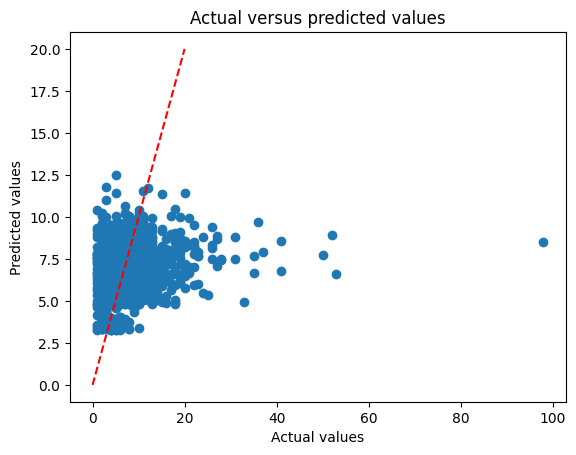

In [ ]:
# Plot actual versus predicted values
plt.scatter(y_test, y_pred)
plt.plot([0, 20], [0, 20], '--', color='red')  # Add a diagonal line for reference
plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.title('Actual versus predicted values')
plt.show()

### 7.4 SUMMARY OF "DURATION OF STAY ANALYSIS

For "DURATION OF STAY" as it is continous variabele so we tried with different regressor models. For us the lowest MSE score was obtained for K Nearest Neighbour where k folds splitting with optimal kn = 23 which is 19.58.

We have tried different models of Boosting for example AdaBoost, Gradient Boosting and Xgboost. The lowest MSE we got for these models was for Gradient Boosting Regressor which is 26.31.

We have also tried Bagging with Randon Forest Regressor which gives us the value of around 26.15 for MSE.

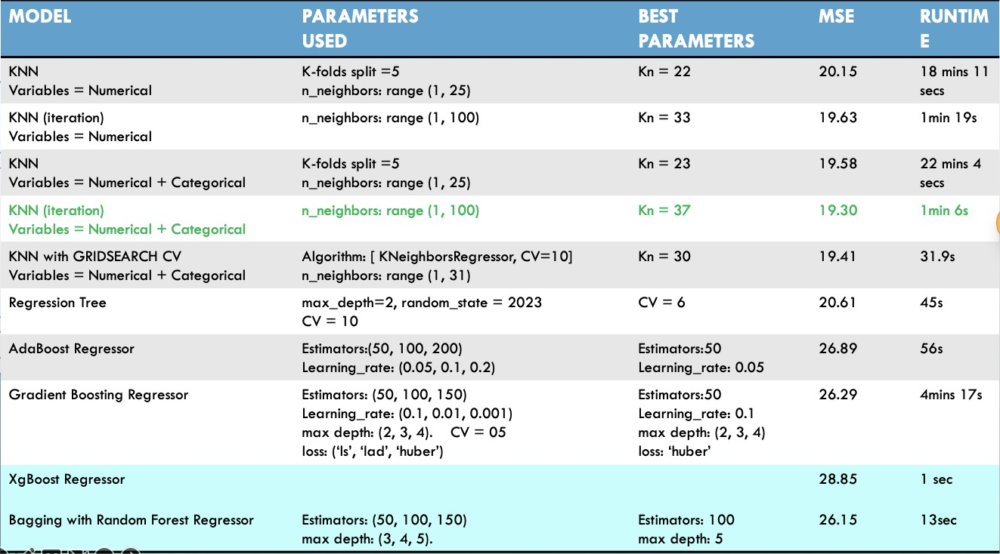

## 8. CONCLUSIONS

Below are the conclusions that we have received after implementing several statistical and machine learning methods on the dataset using qualitative response variables(Heart Failure, AKI and Outcome) and quantitative response variable(Duration of Stay).

*  The main variables that influences a patient diagnosticated with HEART FAILURE are Ejection Fraction (EF) and UREA.  ​

*  Gradient Boosting Classifier (n = 110), Random Forest Classifier (n = 350) and Logistic Regression were the best ML models to predict HEART FAILURE in test part (test accuracy > 77%). ​

*  Creatinine is the main explanatory variable for AKI.​

*  For AKI prediction, Random Forest, Bagging Classifier indicated the best performance on the TRAIN part with 100% train accuracy, but on the TEST part, the Random Forest, Gradient Boosting, Bagging Classifier, Classification Tree, GridSerchCV and Logistic regression, all shows 99% test accuracy, so these are the top 6 models. 
*  However, we can say Logistic regression is the best model among all for AKI prediction if we consider run wall time that is 136 ms and simplicity. 
*  And QDA presented the worst overall performance (71.1% test accuracy) in our AKI predictrion analysis.  

*  Explanatory variables that influence OUTCOME are Duration of Stay & EF.​

*  Gaussian Naïve Bayes has the worst accuracy and Random Forest Classifier(n=350) has the best accuracy for response variable OUTCOME.​

*  For "DURATION OF STAY", the explanatory variables could not achieve a high degree of accuracy​

*  Age is the main explanatory variable for “DURATION OF STAY"​

*  Of all methods employed in Machine Learning for "DURATION OF STAY", the KNN Regressor with k folds splitting produced the least MSE value.​

​After all the analysis our observation is that the response varibles selected are not uniformly proportioned which might have impacted the model accuracy. For future analysis a more robust dataset may result in more accuracte and reliable outcomes.

​

​

​

​

​

​

## 9. REFERENCES

1.Hospital Admissions Data, Kaggle. Available at https://www.kaggle.com/datasets/ashishsahani/hospital-admissions-data/discussion/302894?resource=download&select=HDHI+Admission+data.csv (accessed on Jan. 25,2023).

2.Bollepalli, S.C.; Sahani, A.K.; Aslam, N.; Mohan, B.; Kulkarni, K.; Goyal, A.; Singh, B.; Singh, G.; Mittal, A.; Tandon, R.; Chhabra, S.T.; Wander, G.S.; Armoundas, A.A. An Optimized Machine Learning Model Accurately Predicts In-Hospital Outcomes at Admission to a Cardiac Unit. December 12,2022, Kaggle. Available at https://doi.org/10.3390/diagnostics12020241 (accessed on Jan. 30,2023).

3.Attribution-NonCommercial-ShareAlike 4.0 International (CC BY-NC-SA 4.0),Creative Commons, Available at https://creativecommons.org/licenses/by-nc-sa/4.0/ (accessed on Jan. 30,2023).

4.Leading causes of death, February 22,2022, Open Canada-Government of Alberta. Available at https://open.canada.ca/data/en/dataset/03339dc5-fb51-4552-97c7-853688fc428d (accessed on Jan. 28,2023).

5. NASCIMENTO,C.,ARCHIBONG.E,KHAN,A.,SAJID,HOSSAIN,S.,STATISTICAL ANALYSIS & MODELLING OF CARDIOVASCULAR PATIENTS HOSPITAL ADMISSION. Final Project Report of DATA 606, 2023.

6.American Heart Association: Ejection Fraction website: https://www.heart.org/en/health-topics/heart-failure/diagnosing-heart-failure/ejection-fraction-heart-failure-measurement  (accessed on February 15th, 2023).
